# Javier Mombiela 20067
# Roberto Rios 20979
#### Laboratorio 5: Generative Adversarial Network (GAN)

### 1. Cargar Data
Importando Modelos

In [14]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from keras.datasets import mnist
from keras.optimizers import Adam
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, LeakyReLU, Reshape, Input

Preparando la data

In [15]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()
X = np.vstack((X_train, X_test))
X = X.astype('float32')

# Normalizamos los datos
X = (X - 127.5) / 127.5

Visualizamos la data

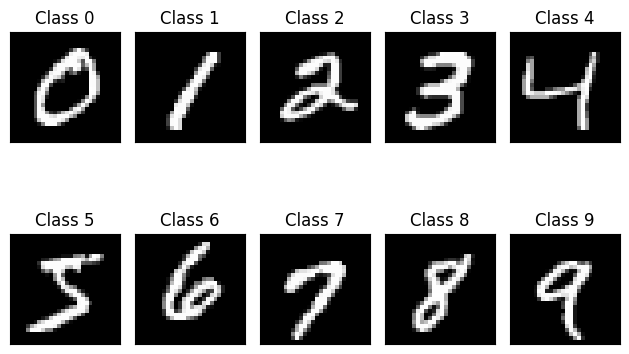

In [16]:
# Imprimimos la forma de los datos
fig = plt.figure()
for i in range(10):
    plt.subplot(2, 5, i+1)
    x_y = X_train[y_train == i]
    plt.imshow(x_y[0], cmap='gray', interpolation='none')
    plt.title("Class %d" % (i))
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

### 2. Definir Modelos
#### Discriminator

In [17]:
# Definimos la arquitectura del discriminador
discriminator_input = Input(shape=(28, 28, 1))
x = Flatten()(discriminator_input)
x = Dropout(0.4)(x)
x = Dense(1024, activation=LeakyReLU(alpha=0.2))(x)
x = Dropout(0.4)(x)
x = Dense(512, activation=LeakyReLU(alpha=0.2))(x)
x = Dropout(0.4)(x)
x = Dense(512, activation=LeakyReLU(alpha=0.2))(x)
discriminator_output = Dense(1, activation='sigmoid')(x)

Visualizamos el modelo del discriminador

In [18]:
discriminator_model = Model(discriminator_input, discriminator_output)
discriminator_model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')

discriminator_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dropout_3 (Dropout)         (None, 784)               0         
                                                                 
 dense_8 (Dense)             (None, 1024)              803840    
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0   

#### Generator

In [19]:
# Definimos la arquitectura del generador
generator_input = Input(shape=(100,))
x = Dense(256, activation=LeakyReLU(alpha=0.2))(generator_input)
x = Dense(512, activation=LeakyReLU(alpha=0.2))(x)
x = Dense(1024, activation=LeakyReLU(alpha=0.2))(x)
x = Dense(784, activation='tanh')(x)
generator_output = Reshape((28, 28, 1))(x)

Visualizamos el modelo del generador

In [20]:
generator_model = Model(generator_input, generator_output)
generator_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense_12 (Dense)            (None, 256)               25856     
                                                                 
 dense_13 (Dense)            (None, 512)               131584    
                                                                 
 dense_14 (Dense)            (None, 1024)              525312    
                                                                 
 dense_15 (Dense)            (None, 784)               803600    
                                                                 
 reshape_1 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
Total params: 1486352 (5.67 MB)
Trainable params: 1486352 (

### 3. Combinacion de modelos
Compilacion del modelo

In [21]:
# Definimos la arquitectura del GAN
discriminator_model.trainable = False
gan_input = Input(shape=(100,))
gan_output = discriminator_model(generator_model(gan_input))

Visualizamos el modelo

In [22]:
gan_model = Model(gan_input, gan_output)
gan_model.compile(optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss='binary_crossentropy')

gan_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 100)]             0         
                                                                 
 model_4 (Functional)        (None, 28, 28, 1)         1486352   
                                                                 
 model_3 (Functional)        (None, 1)                 1591809   
                                                                 
Total params: 3078161 (11.74 MB)
Trainable params: 1486352 (5.67 MB)
Non-trainable params: 1591809 (6.07 MB)
_________________________________________________________________


#### Predicciones

1/1 [==============================] - 0s 82ms/step


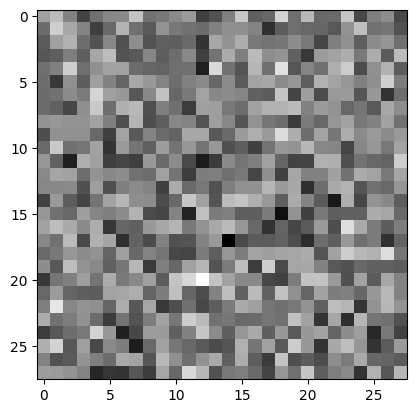

In [23]:
generated_image = generator_model.predict(np.random.randn(1, 100))
plt.imshow(generated_image.reshape(28, 28), cmap='gray')

1/1 [==============================] - 0s 69ms/step


Text(0.5, 0, '0.52577084')

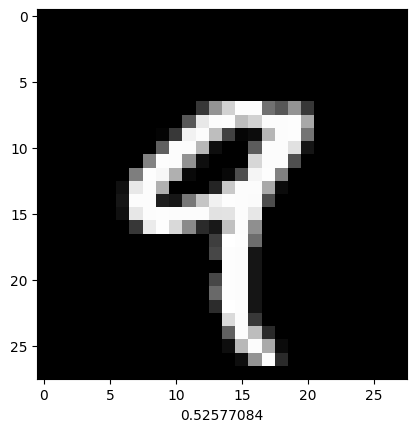

In [24]:
selected_image = X[4].reshape(1, 28, 28, 1)
plt.imshow(selected_image.reshape(28, 28), cmap='gray')
discriminator_prediction_real = discriminator_model.predict(selected_image)
plt.xlabel(discriminator_prediction_real[0, 0])

### 4. Entrenamiento

Epochs:  0


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:02<09:18,  2.05s/it]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:02<04:24,  1.02it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:02<02:57,  1.52it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:02<02:11,  2.04it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:03<01:45,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:03<01:30,  2.95it/s]

4/4 [==============================] - 0s 5ms/step


  3%|▎         | 7/273 [00:03<01:21,  3.27it/s]

4/4 [==============================] - 0s 5ms/step


  3%|▎         | 8/273 [00:03<01:17,  3.42it/s]

4/4 [==============================] - 0s 5ms/step


  3%|▎         | 9/273 [00:03<01:12,  3.64it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:04<01:10,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:04<01:11,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 12/273 [00:04<01:08,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:04<01:05,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:05<01:05,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:03,  4.08it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:03,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:05<01:02,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:06<01:03,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:06<01:04,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:06<01:04,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:06<01:04,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:07<01:04,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:07<01:04,  3.88it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 24/273 [00:07<01:03,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:08<01:05,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:08<01:01,  3.99it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:08<01:12,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:09<01:17,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:09<01:19,  3.09it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:09<01:25,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:10<01:25,  2.83it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:10<01:25,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:10<01:32,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:11<01:29,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:11<01:27,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:11<01:24,  2.81it/s]

4/4 [==============================] - 0s 5ms/step


 14%|█▎        | 37/273 [00:12<01:17,  3.06it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:12<01:12,  3.25it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:12<01:07,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:13<01:05,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:13<01:01,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:13<01:01,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:13<00:58,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:13<00:58,  3.92it/s]

4/4 [==============================] - 0s 5ms/step


 16%|█▋        | 45/273 [00:14<00:55,  4.10it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:14<00:56,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:14<00:57,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:14<00:56,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:15<00:57,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:15<00:57,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:15<00:55,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:15<00:54,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:16<00:53,  4.13it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:16<00:54,  4.05it/s]

4/4 [==============================] - 0s 5ms/step


 20%|██        | 55/273 [00:16<00:52,  4.13it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:16<00:54,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:17<00:52,  4.09it/s]

4/4 [==============================] - 0s 5ms/step


 21%|██        | 58/273 [00:17<00:53,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:17<00:52,  4.09it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:17<00:51,  4.12it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:18<00:50,  4.18it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:18<00:49,  4.25it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:18<00:50,  4.12it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:18<00:50,  4.13it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:19<00:52,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:19<00:51,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:19<00:52,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:19<00:52,  3.90it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:20<00:52,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:20<00:52,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 71/273 [00:20<00:52,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:20<00:52,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:21<00:52,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:21<00:50,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:21<00:49,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:22<00:52,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:22<00:58,  3.35it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:22<01:02,  3.11it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:23<01:04,  3.00it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:23<01:06,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:23<01:08,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:24<01:10,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:24<01:15,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:25<01:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:25<01:14,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:25<01:06,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:26<01:01,  3.04it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:26<00:56,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:26<00:53,  3.44it/s]

4/4 [==============================] - 0s 5ms/step


 33%|███▎      | 90/273 [00:26<00:50,  3.65it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:27<00:48,  3.73it/s]

4/4 [==============================] - 0s 5ms/step


 34%|███▎      | 92/273 [00:27<00:47,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:27<00:46,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:27<00:45,  3.91it/s]

4/4 [==============================] - 0s 5ms/step


 35%|███▍      | 95/273 [00:28<00:45,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:28<00:44,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:28<00:44,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:28<00:43,  4.03it/s]

4/4 [==============================] - 0s 5ms/step


 36%|███▋      | 99/273 [00:29<00:41,  4.16it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:29<00:42,  4.09it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:29<00:41,  4.13it/s]

4/4 [==============================] - 0s 5ms/step


 37%|███▋      | 102/273 [00:29<00:42,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:30<00:42,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:30<00:41,  4.09it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:30<00:42,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:30<00:42,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:31<00:41,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:31<00:41,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:31<00:41,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:31<00:41,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:32<00:39,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:32<00:38,  4.18it/s]

4/4 [==============================] - 0s 5ms/step


 41%|████▏     | 113/273 [00:32<00:39,  4.06it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:32<00:40,  3.97it/s]

4/4 [==============================] - 0s 5ms/step


 42%|████▏     | 115/273 [00:33<00:38,  4.10it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 116/273 [00:33<00:37,  4.19it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:33<00:37,  4.15it/s]

4/4 [==============================] - 0s 5ms/step


 43%|████▎     | 118/273 [00:33<00:36,  4.20it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:33<00:36,  4.26it/s]

4/4 [==============================] - 0s 5ms/step


 44%|████▍     | 120/273 [00:34<00:37,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:34<00:36,  4.13it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:34<00:36,  4.14it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:34<00:36,  4.07it/s]

4/4 [==============================] - 0s 5ms/step


 45%|████▌     | 124/273 [00:35<00:36,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:35<00:37,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:35<00:42,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:36<00:46,  3.11it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:36<00:51,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:37<00:51,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:37<00:55,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:37<00:54,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:38<00:53,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:38<00:55,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:39<00:53,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 135/273 [00:39<00:47,  2.89it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:39<00:43,  3.14it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:39<00:40,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:40<00:36,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:40<00:36,  3.66it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████▏    | 140/273 [00:40<00:34,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:40<00:33,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:40<00:33,  3.92it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:41<00:32,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [00:41<00:32,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:41<00:31,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:41<00:30,  4.15it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [00:42<00:31,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [00:42<00:30,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [00:42<00:30,  4.06it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [00:42<00:29,  4.16it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [00:43<00:29,  4.09it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [00:43<00:29,  4.15it/s]

4/4 [==============================] - 0s 5ms/step


 56%|█████▌    | 153/273 [00:43<00:28,  4.20it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:43<00:29,  4.08it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [00:44<00:29,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [00:44<00:28,  4.10it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:44<00:28,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [00:44<00:28,  4.09it/s]

4/4 [==============================] - 0s 5ms/step


 58%|█████▊    | 159/273 [00:45<00:28,  4.01it/s]

4/4 [==============================] - 0s 5ms/step


 59%|█████▊    | 160/273 [00:45<00:28,  3.96it/s]

4/4 [==============================] - 0s 5ms/step


 59%|█████▉    | 161/273 [00:45<00:27,  4.07it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [00:45<00:26,  4.14it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:46<00:26,  4.19it/s]

4/4 [==============================] - 0s 5ms/step


 60%|██████    | 164/273 [00:46<00:26,  4.12it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:46<00:25,  4.19it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [00:46<00:25,  4.18it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [00:47<00:24,  4.26it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [00:47<00:24,  4.28it/s]

4/4 [==============================] - 0s 5ms/step


 62%|██████▏   | 169/273 [00:47<00:24,  4.19it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:47<00:25,  4.06it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [00:48<00:26,  3.92it/s]

4/4 [==============================] - 0s 5ms/step


 63%|██████▎   | 172/273 [00:48<00:24,  4.06it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [00:48<00:24,  4.14it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▎   | 174/273 [00:48<00:24,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [00:49<00:26,  3.73it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [00:49<00:30,  3.13it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [00:49<00:33,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:50<00:35,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [00:50<00:37,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [00:51<00:36,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [00:51<00:33,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [00:51<00:30,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:52<00:27,  3.25it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [00:52<00:26,  3.41it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [00:52<00:24,  3.66it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [00:52<00:22,  3.83it/s]

4/4 [==============================] - 0s 5ms/step


 68%|██████▊   | 187/273 [00:53<00:22,  3.78it/s]

4/4 [==============================] - 0s 5ms/step


 69%|██████▉   | 188/273 [00:53<00:21,  3.96it/s]

4/4 [==============================] - 0s 5ms/step


 69%|██████▉   | 189/273 [00:53<00:21,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [00:53<00:20,  4.08it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [00:54<00:20,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [00:54<00:20,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [00:54<00:20,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [00:54<00:20,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████▏  | 195/273 [00:55<00:19,  4.04it/s]

4/4 [==============================] - 0s 5ms/step


 72%|███████▏  | 196/273 [00:55<00:19,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [00:55<00:19,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [00:55<00:19,  3.93it/s]

4/4 [==============================] - 0s 5ms/step


 73%|███████▎  | 199/273 [00:56<00:18,  4.10it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [00:56<00:17,  4.16it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [00:56<00:17,  4.23it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [00:56<00:16,  4.27it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [00:56<00:17,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [00:57<00:16,  4.11it/s]

4/4 [==============================] - 0s 5ms/step


 75%|███████▌  | 205/273 [00:57<00:16,  4.07it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [00:57<00:16,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [00:57<00:16,  4.01it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [00:58<00:15,  4.07it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [00:58<00:15,  4.14it/s]

4/4 [==============================] - 0s 5ms/step


 77%|███████▋  | 210/273 [00:58<00:14,  4.20it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [00:58<00:14,  4.22it/s]

4/4 [==============================] - 0s 5ms/step


 78%|███████▊  | 212/273 [00:59<00:14,  4.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [00:59<00:14,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [00:59<00:14,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [00:59<00:14,  4.12it/s]

4/4 [==============================] - 0s 5ms/step


 79%|███████▉  | 216/273 [01:00<00:14,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:00<00:18,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:01<00:20,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:01<00:18,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:02<00:26,  1.99it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 221/273 [01:02<00:28,  1.81it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:03<00:25,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:03<00:23,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:04<00:21,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 225/273 [01:04<00:19,  2.52it/s]

4/4 [==============================] - 0s 5ms/step


 83%|████████▎ | 226/273 [01:04<00:16,  2.82it/s]

4/4 [==============================] - 0s 5ms/step


 83%|████████▎ | 227/273 [01:04<00:14,  3.14it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:05<00:13,  3.35it/s]

4/4 [==============================] - 0s 5ms/step


 84%|████████▍ | 229/273 [01:05<00:12,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:05<00:11,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:05<00:11,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 232/273 [01:06<00:10,  3.75it/s]

4/4 [==============================] - 0s 5ms/step


 85%|████████▌ | 233/273 [01:06<00:10,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:06<00:09,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:06<00:09,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:07<00:08,  4.12it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:07<00:08,  4.20it/s]

4/4 [==============================] - 0s 5ms/step


 87%|████████▋ | 238/273 [01:07<00:08,  4.09it/s]

4/4 [==============================] - 0s 5ms/step


 88%|████████▊ | 239/273 [01:07<00:08,  3.98it/s]

4/4 [==============================] - 0s 5ms/step


 88%|████████▊ | 240/273 [01:08<00:08,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:08<00:07,  4.10it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:08<00:07,  4.15it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 243/273 [01:08<00:07,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:09<00:07,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:09<00:07,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:09<00:06,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:09<00:06,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:10<00:06,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:10<00:06,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:10<00:05,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:10<00:05,  4.11it/s]

4/4 [==============================] - 0s 5ms/step


 92%|█████████▏| 252/273 [01:11<00:05,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:11<00:04,  4.13it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:11<00:04,  4.16it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:11<00:04,  4.07it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:12<00:04,  4.14it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:12<00:03,  4.04it/s]

4/4 [==============================] - 0s 5ms/step


 95%|█████████▍| 258/273 [01:12<00:03,  4.12it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:12<00:03,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:12<00:03,  4.20it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:13<00:02,  4.04it/s]

4/4 [==============================] - 0s 5ms/step


 96%|█████████▌| 262/273 [01:13<00:02,  4.14it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:13<00:02,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:13<00:02,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [01:14<00:02,  3.97it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:14<00:02,  3.42it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:14<00:01,  3.20it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:15<00:01,  3.07it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:15<00:01,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:16<00:01,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:16<00:00,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:16<00:00,  2.70it/s]

4/4 [==============================] - 0s 5ms/step


100%|██████████| 273/273 [01:17<00:00,  3.54it/s]


Perdidas:  0.3354100286960602 , 1.7327995300292969
1/1 [==============================] - 0s 19ms/step


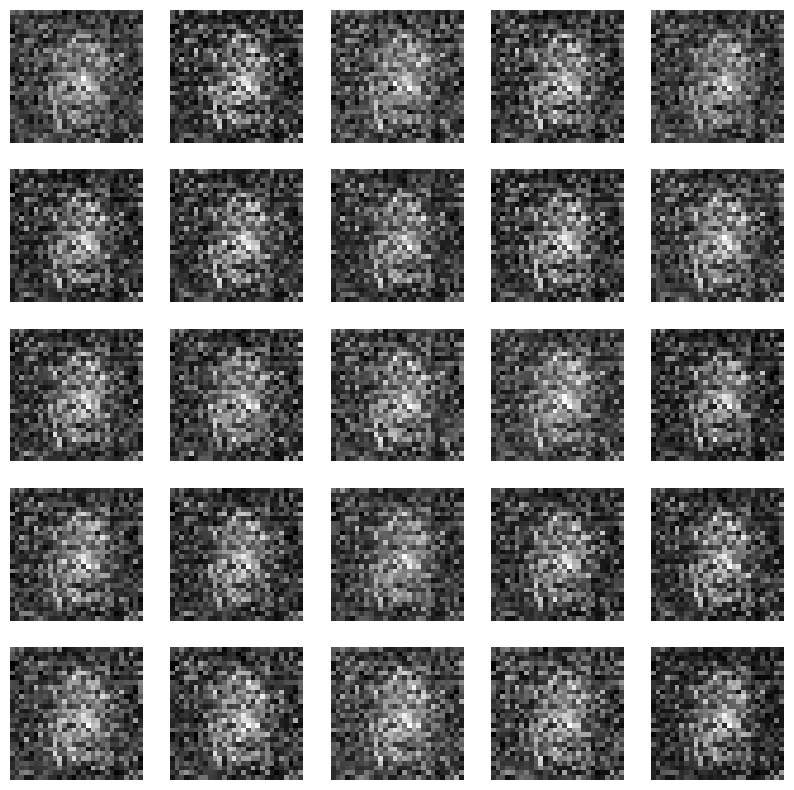

Epochs:  1


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:13,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:11,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:00<01:06,  4.03it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:00<01:05,  4.10it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:07,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:01<01:06,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:01<01:06,  4.00it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:01<01:04,  4.10it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:02<01:05,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:02<01:05,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:02<01:06,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:02<01:04,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:03<01:03,  4.07it/s]

4/4 [==============================] - 0s 5ms/step


  5%|▌         | 14/273 [00:03<01:05,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:03<01:05,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:04<01:06,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:04<01:04,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:04<01:04,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:04<01:04,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:05<01:04,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:05<01:05,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:05<01:06,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:05<01:05,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:06<01:05,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:06<01:03,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:06<01:03,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:06<01:03,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:07<01:03,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:07<01:07,  3.61it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:07<01:16,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:08<01:52,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:09<01:45,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:09<01:41,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:09<01:41,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:10<01:27,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:10<01:20,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:10<01:15,  3.12it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:10<01:09,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:11<01:06,  3.54it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:11<01:02,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:11<01:01,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:11<01:01,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:12<01:00,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:12<01:01,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:12<01:01,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:12<01:00,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:13<01:01,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:13<00:58,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:13<00:56,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:13<00:55,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:14<00:56,  3.96it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:14<00:54,  4.08it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:14<00:54,  4.07it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:14<00:55,  3.96it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:15<00:54,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:15<00:53,  4.09it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:15<00:54,  3.98it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:15<00:52,  4.06it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:16<00:53,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:16<00:54,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:16<00:53,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:16<00:53,  3.97it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:17<00:53,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:17<00:52,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:17<00:52,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:17<00:53,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:18<00:53,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:18<00:51,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▌       | 69/273 [00:18<00:50,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:18<00:50,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:19<00:51,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:19<00:52,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:19<00:51,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:20<00:53,  3.74it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:20<01:02,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:20<01:05,  3.02it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:21<01:10,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:21<01:11,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:22<01:11,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:22<01:10,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:22<01:10,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:23<01:03,  2.99it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 83/273 [00:23<00:59,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:23<00:57,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:23<00:53,  3.53it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:24<00:50,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:24<00:49,  3.73it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:24<00:48,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:24<00:48,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:25<00:48,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:25<00:47,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:25<00:45,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:25<00:44,  4.03it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:26<00:45,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:26<00:44,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:26<00:42,  4.13it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:26<00:42,  4.17it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:27<00:43,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:27<00:42,  4.11it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 100/273 [00:27<00:42,  4.03it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:27<00:43,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 102/273 [00:28<00:42,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:28<00:41,  4.08it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:28<00:42,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:28<00:42,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:29<00:42,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:29<00:42,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:29<00:42,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:29<00:42,  3.90it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:30<00:40,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:30<00:40,  4.05it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:30<00:38,  4.15it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:30<00:39,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:31<00:40,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:31<00:40,  3.92it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:31<00:38,  4.06it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:31<00:38,  4.10it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:32<00:37,  4.15it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:32<00:38,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:32<00:38,  3.96it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:32<00:42,  3.58it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:33<00:47,  3.21it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:33<00:49,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:34<00:51,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:34<00:53,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:34<00:53,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:35<00:54,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:35<00:51,  2.82it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:35<00:46,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:36<00:44,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:36<00:42,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:36<00:40,  3.51it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:36<00:37,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:37<00:37,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 135/273 [00:37<00:35,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:37<00:34,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:37<00:33,  4.10it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:38<00:33,  3.98it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:38<00:33,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:38<00:33,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:38<00:32,  4.05it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:39<00:32,  4.01it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:39<00:33,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:39<00:33,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:39<00:32,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:40<00:32,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:40<00:32,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [00:40<00:32,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [00:40<00:31,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [00:41<00:31,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [00:41<00:31,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [00:41<00:30,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:41<00:30,  3.98it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:42<00:30,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [00:42<00:29,  4.00it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [00:42<00:28,  4.08it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:42<00:28,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [00:43<00:28,  4.06it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:43<00:28,  4.03it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:43<00:27,  4.07it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:43<00:27,  4.02it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:44<00:27,  4.04it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:44<00:26,  4.08it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [00:44<00:27,  3.99it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [00:44<00:26,  4.07it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:45<00:26,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:45<00:27,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:45<00:30,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [00:46<00:32,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:46<00:33,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:46<00:34,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [00:47<00:37,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [00:47<00:37,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 174/273 [00:47<00:37,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:48<00:34,  2.82it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [00:48<00:32,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [00:48<00:29,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:49<00:27,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [00:49<00:25,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:49<00:24,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [00:49<00:23,  3.92it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [00:50<00:22,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [00:50<00:22,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [00:50<00:23,  3.86it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [00:50<00:22,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [00:51<00:22,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:51<00:22,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [00:51<00:22,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [00:51<00:21,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:52<00:21,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [00:52<00:20,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [00:52<00:20,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [00:52<00:20,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [00:53<00:20,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [00:53<00:20,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 196/273 [00:53<00:20,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [00:53<00:20,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [00:54<00:19,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [00:54<00:19,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 200/273 [00:54<00:18,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [00:54<00:18,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [00:55<00:18,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [00:55<00:18,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [00:55<00:17,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [00:56<00:17,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [00:56<00:17,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [00:56<00:16,  3.98it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [00:56<00:16,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [00:57<00:16,  3.90it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [00:57<00:15,  3.97it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [00:57<00:15,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [00:57<00:15,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [00:58<00:15,  3.98it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [00:58<00:16,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [00:58<00:17,  3.27it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [00:59<00:18,  3.03it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [00:59<00:20,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [00:59<00:20,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:00<00:19,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:00<00:19,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:01<00:18,  2.79it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:01<00:16,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:01<00:15,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:01<00:14,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:02<00:13,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:02<00:12,  3.67it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:02<00:12,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:02<00:11,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:03<00:11,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:03<00:11,  3.88it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:03<00:10,  4.01it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:03<00:10,  4.05it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:04<00:10,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:04<00:10,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:04<00:09,  4.00it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:04<00:09,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:05<00:09,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:05<00:09,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:05<00:08,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:05<00:08,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:06<00:08,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:06<00:08,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:06<00:07,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:06<00:07,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:07<00:07,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:07<00:06,  3.97it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:07<00:06,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:07<00:06,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:08<00:06,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:08<00:05,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:08<00:05,  4.13it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:08<00:05,  4.15it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:09<00:04,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:09<00:04,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:09<00:04,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:09<00:04,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:10<00:04,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:10<00:03,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:10<00:03,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:11<00:03,  3.62it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:11<00:03,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:11<00:03,  3.00it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:12<00:03,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:12<00:03,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:13<00:02,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:13<00:02,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:13<00:02,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:14<00:01,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:14<00:01,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:14<00:00,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:14<00:00,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:15<00:00,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:15<00:00,  3.62it/s]


Perdidas:  0.3664974570274353 , 1.8572382926940918
1/1 [==============================] - 0s 20ms/step


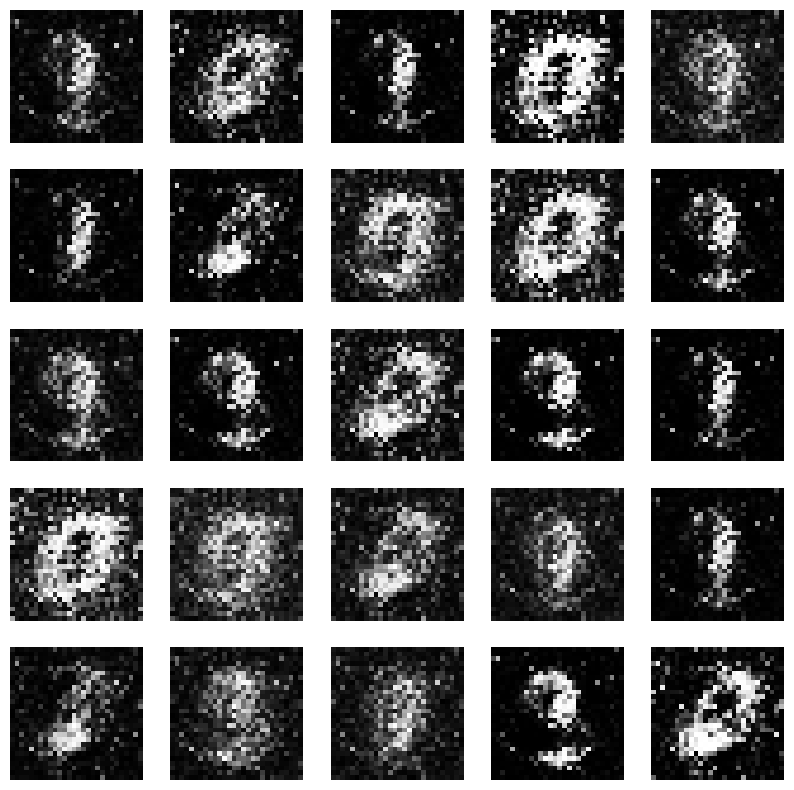

Epochs:  2


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:08,  3.96it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:09,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:00<01:06,  4.05it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:00<01:06,  4.05it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:05,  4.08it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:01<01:07,  3.93it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:01<01:07,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:02<01:07,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:02<01:08,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:02<01:08,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:02<01:06,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:06,  3.91it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:03<01:06,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:03<01:05,  3.96it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:03<01:04,  4.02it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 16/273 [00:04<01:03,  4.05it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:04<01:03,  4.04it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:04<01:04,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:04<01:04,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:05<01:04,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:05<01:02,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:05<01:04,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:05<01:02,  3.99it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:06<01:12,  3.42it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:06<01:20,  3.08it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 26/273 [00:07<01:26,  2.86it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 27/273 [00:07<01:28,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:07<01:31,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:08<01:36,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:08<01:30,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:08<01:22,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:09<01:17,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:09<01:10,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:09<01:06,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:09<01:04,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:10<01:04,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:10<01:02,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:10<01:01,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:10<01:01,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:11<01:01,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:11<00:59,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:11<00:57,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:11<00:57,  4.02it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:12<00:58,  3.95it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:12<00:57,  4.00it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:12<00:55,  4.06it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:12<00:55,  4.06it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:13<00:56,  4.01it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:13<00:55,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:13<00:56,  3.98it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:13<00:57,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:14<00:56,  3.93it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:14<00:54,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:14<00:55,  3.97it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:14<00:54,  3.97it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:15<00:53,  4.03it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:15<00:54,  3.96it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:15<00:54,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:15<00:54,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:16<00:54,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:16<00:55,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:16<00:53,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:16<00:54,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:17<00:53,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:17<00:53,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:17<00:51,  4.00it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:17<00:52,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:18<00:52,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▌       | 69/273 [00:18<00:54,  3.77it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:18<01:01,  3.31it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:19<01:05,  3.07it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:19<01:09,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:20<01:10,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:20<01:12,  2.75it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:20<01:11,  2.76it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:21<01:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:21<01:09,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:21<01:03,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:21<00:58,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:22<00:54,  3.56it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:22<00:52,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:22<00:51,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:23<00:51,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:23<00:50,  3.71it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:23<00:49,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:23<00:48,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:24<00:49,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:24<00:48,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:24<00:47,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:24<00:46,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:25<00:46,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:25<00:47,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:25<00:47,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:25<00:46,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:26<00:47,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:26<00:46,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:26<00:44,  3.92it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:26<00:43,  4.03it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:27<00:43,  4.04it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:27<00:43,  4.02it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:27<00:43,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:27<00:42,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:28<00:43,  3.91it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:28<00:44,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:28<00:42,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:28<00:41,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:29<00:41,  4.02it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:29<00:40,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:29<00:40,  4.07it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:29<00:39,  4.15it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:30<00:39,  4.05it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:30<00:40,  4.02it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:30<00:40,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:30<00:40,  3.90it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:31<00:40,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:31<00:47,  3.32it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:31<00:50,  3.09it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 118/273 [00:32<00:52,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:32<00:53,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:33<00:57,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:33<00:59,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:33<00:59,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:34<00:51,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:34<00:46,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:34<00:44,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:34<00:43,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:35<00:40,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:35<00:39,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:35<00:38,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:35<00:37,  3.78it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:36<00:36,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:36<00:35,  3.94it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:36<00:34,  4.01it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:36<00:35,  3.94it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:37<00:34,  4.01it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:37<00:34,  4.02it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:37<00:34,  3.99it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:37<00:34,  3.91it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:38<00:33,  3.96it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:38<00:34,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:38<00:34,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:39<00:34,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [00:39<00:33,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:39<00:34,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:39<00:33,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:40<00:33,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:40<00:32,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [00:40<00:32,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [00:40<00:32,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [00:41<00:31,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:41<00:31,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:41<00:31,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:41<00:30,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [00:42<00:29,  4.03it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:42<00:29,  3.96it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:42<00:30,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:42<00:30,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:43<00:29,  3.86it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:43<00:29,  3.83it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:43<00:29,  3.85it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [00:43<00:28,  3.91it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 162/273 [00:44<00:32,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [00:44<00:34,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:45<00:36,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [00:45<00:37,  2.91it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [00:45<00:39,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [00:46<00:40,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [00:46<00:39,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [00:46<00:37,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [00:47<00:34,  3.02it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [00:47<00:30,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:47<00:29,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [00:47<00:28,  3.55it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [00:48<00:26,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [00:48<00:26,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [00:48<00:25,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [00:49<00:25,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:49<00:25,  3.73it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [00:49<00:24,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:49<00:23,  3.89it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [00:50<00:24,  3.83it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [00:50<00:23,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:50<00:23,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [00:50<00:22,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:51<00:22,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [00:51<00:22,  3.95it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [00:51<00:21,  3.99it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [00:51<00:21,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [00:52<00:21,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [00:52<00:20,  4.03it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [00:52<00:20,  3.97it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [00:52<00:20,  4.02it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [00:53<00:20,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:53<00:20,  3.89it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [00:53<00:20,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [00:53<00:19,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [00:54<00:19,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [00:54<00:19,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [00:54<00:19,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [00:54<00:19,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [00:55<00:18,  3.89it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [00:55<00:18,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [00:55<00:17,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [00:55<00:18,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [00:56<00:18,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [00:56<00:17,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [00:56<00:16,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [00:57<00:19,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [00:57<00:20,  3.08it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 210/273 [00:57<00:21,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [00:58<00:22,  2.70it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 212/273 [00:58<00:23,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 213/273 [00:59<00:24,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [00:59<00:22,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [00:59<00:20,  2.88it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:00<00:17,  3.18it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:00<00:16,  3.37it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:00<00:15,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:00<00:14,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:01<00:14,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:01<00:13,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:01<00:13,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:01<00:12,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:02<00:12,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:02<00:12,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:02<00:12,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:02<00:11,  3.89it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:03<00:11,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:03<00:11,  3.78it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:03<00:11,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:03<00:11,  3.76it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:04<00:11,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:04<00:10,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:04<00:10,  3.76it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:04<00:10,  3.74it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:05<00:09,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:05<00:09,  3.89it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:05<00:08,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:06<00:08,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:06<00:08,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:06<00:08,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:06<00:08,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:07<00:07,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:07<00:07,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:07<00:07,  3.84it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:07<00:06,  3.88it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:08<00:06,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:08<00:06,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:08<00:06,  3.87it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:08<00:05,  3.84it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:09<00:05,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:09<00:05,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:09<00:05,  3.62it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:10<00:05,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:10<00:05,  3.02it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 256/273 [01:10<00:05,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:11<00:06,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:11<00:05,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:12<00:05,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:12<00:04,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:12<00:04,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:12<00:03,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:13<00:03,  3.25it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:13<00:02,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:13<00:02,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:14<00:01,  3.75it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:14<00:01,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:14<00:01,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:14<00:01,  3.98it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:14<00:00,  3.96it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:15<00:00,  4.01it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:15<00:00,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:15<00:00,  3.60it/s]


Perdidas:  0.4445071816444397 , 1.6449053287506104
1/1 [==============================] - 0s 22ms/step


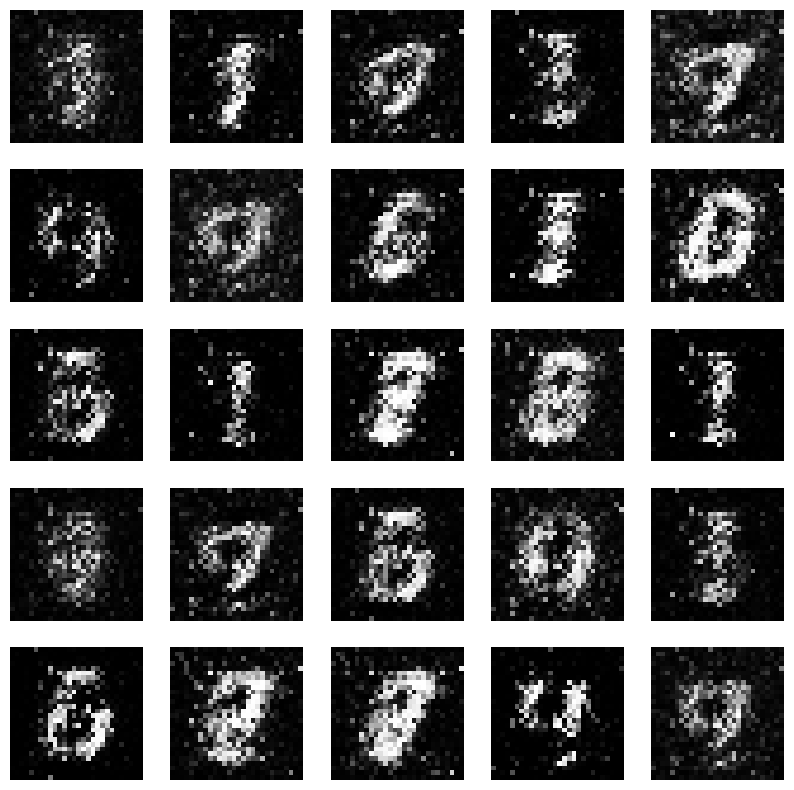

Epochs:  3


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:08,  3.99it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:10,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:00<01:11,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:11,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:11,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:01<01:09,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:01<01:08,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:02<01:09,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:02<01:07,  3.90it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:02<01:07,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:02<01:07,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:06,  3.95it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:03<01:05,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:03<01:17,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:04<01:22,  3.12it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 16/273 [00:04<01:34,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:04<01:33,  2.74it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 18/273 [00:05<01:35,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:05<01:34,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:06<01:40,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:06<01:29,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:06<01:20,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:06<01:16,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:07<01:13,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:07<01:08,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:07<01:06,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:07<01:05,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:08<01:03,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:08<01:03,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:08<01:03,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:08<01:02,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:09<01:02,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:09<01:00,  3.97it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:09<01:01,  3.86it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:10<01:01,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:10<01:01,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:10<01:00,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:10<01:00,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:11<01:01,  3.79it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:11<01:00,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:11<01:00,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:11<01:00,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:12<00:59,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:12<00:59,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:12<00:59,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:12<00:58,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:13<00:59,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:13<00:58,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:13<00:58,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:13<00:57,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:14<00:57,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:14<00:57,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:14<00:57,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:14<00:57,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:15<00:56,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:15<00:56,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:15<00:54,  3.95it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:15<00:54,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:16<00:56,  3.81it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 60/273 [00:16<01:08,  3.11it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:17<01:12,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:17<01:14,  2.85it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:17<01:16,  2.76it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:18<01:16,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:18<01:16,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:19<01:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:19<01:10,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:19<01:04,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:19<01:00,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:20<00:57,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:20<00:56,  3.58it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:20<00:54,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:20<00:52,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:21<00:52,  3.78it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:21<00:52,  3.77it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 76/273 [00:21<00:51,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:21<00:51,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:22<00:50,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:22<00:49,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:22<00:49,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:22<00:48,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:23<00:50,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:23<00:51,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:23<00:49,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:23<00:49,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:24<00:47,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:24<00:47,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:24<00:46,  3.97it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:24<00:46,  3.99it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:25<00:45,  4.02it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:25<00:46,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:25<00:45,  3.99it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:25<00:45,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:26<00:46,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:26<00:46,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:26<00:46,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:26<00:45,  3.91it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:27<00:44,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:27<00:45,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:27<00:45,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:28<00:43,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:28<00:43,  3.97it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:28<00:44,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:28<00:43,  3.92it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:29<00:42,  3.98it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:29<00:50,  3.30it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 107/273 [00:29<00:55,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:30<01:00,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:30<01:00,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:31<01:01,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:31<01:02,  2.61it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 112/273 [00:31<01:03,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:32<00:57,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:32<00:52,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:32<00:49,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:32<00:45,  3.45it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:33<00:43,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:33<00:42,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:33<00:41,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:33<00:40,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:34<00:39,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:34<00:40,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:34<00:39,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:35<00:39,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:35<00:39,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:35<00:37,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:35<00:38,  3.82it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:36<00:38,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:36<00:37,  3.79it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:36<00:37,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:36<00:37,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:37<00:37,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:37<00:36,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:37<00:35,  3.92it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:37<00:35,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:38<00:35,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:38<00:35,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:38<00:34,  3.89it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:38<00:34,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:39<00:34,  3.89it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:39<00:33,  3.95it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:39<00:32,  4.03it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:39<00:32,  3.96it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [00:40<00:32,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:40<00:33,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:40<00:31,  3.98it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:40<00:32,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [00:41<00:32,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:41<00:32,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:41<00:31,  3.85it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [00:42<00:32,  3.72it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 152/273 [00:42<00:39,  3.08it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [00:42<00:41,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:43<00:45,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:43<00:45,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [00:44<00:45,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:44<00:47,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [00:44<00:42,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:45<00:38,  2.98it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [00:45<00:35,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [00:45<00:32,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [00:45<00:31,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:46<00:30,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:46<00:29,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:46<00:28,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:46<00:28,  3.73it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [00:47<00:27,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [00:47<00:27,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [00:47<00:26,  3.93it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:47<00:25,  4.00it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:48<00:26,  3.86it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:48<00:26,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [00:48<00:26,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [00:48<00:25,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [00:49<00:24,  3.94it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [00:49<00:24,  3.98it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [00:49<00:23,  4.02it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:49<00:23,  4.03it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [00:50<00:23,  3.96it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 180/273 [00:50<00:23,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [00:50<00:22,  4.04it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [00:50<00:22,  4.00it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [00:51<00:23,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [00:51<00:22,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [00:51<00:22,  3.88it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [00:52<00:22,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:52<00:22,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [00:52<00:21,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [00:52<00:21,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [00:53<00:21,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [00:53<00:21,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [00:53<00:21,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [00:53<00:20,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:54<00:20,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [00:54<00:20,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [00:54<00:19,  3.88it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [00:55<00:23,  3.25it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 198/273 [00:55<00:25,  2.98it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [00:55<00:26,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [00:56<00:27,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [00:56<00:29,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 202/273 [00:57<00:29,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 203/273 [00:57<00:26,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [00:57<00:23,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [00:57<00:21,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [00:58<00:20,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [00:58<00:18,  3.50it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [00:58<00:18,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [00:59<00:17,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [00:59<00:16,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [00:59<00:16,  3.82it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [00:59<00:16,  3.80it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:00<00:15,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:00<00:15,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:00<00:15,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:00<00:14,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:01<00:14,  3.83it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:01<00:14,  3.80it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:01<00:14,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:01<00:13,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:02<00:13,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:02<00:12,  3.92it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:02<00:12,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:02<00:12,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:03<00:12,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:03<00:12,  3.91it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:03<00:11,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:03<00:11,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:04<00:11,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:04<00:11,  3.84it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 231/273 [01:04<00:10,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:04<00:10,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:05<00:10,  3.83it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:05<00:10,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:05<00:09,  3.83it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:06<00:09,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:06<00:09,  3.90it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:06<00:09,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:06<00:08,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:07<00:08,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:07<00:08,  3.88it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:07<00:09,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:08<00:09,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:08<00:10,  2.89it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:08<00:10,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:09<00:09,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:09<00:10,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:10<00:10,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 249/273 [01:10<00:08,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:10<00:07,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:10<00:06,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:11<00:06,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:11<00:05,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:11<00:05,  3.66it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:11<00:04,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:12<00:04,  3.80it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:12<00:04,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:12<00:03,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:13<00:03,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:13<00:03,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:13<00:03,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:13<00:02,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:14<00:02,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:14<00:02,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:14<00:02,  3.89it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:14<00:01,  3.92it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:15<00:01,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:15<00:01,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:15<00:01,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:15<00:00,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 271/273 [01:16<00:00,  3.87it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:16<00:00,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:16<00:00,  3.56it/s]


Perdidas:  0.5567988157272339 , 2.3611512184143066
1/1 [==============================] - 0s 28ms/step


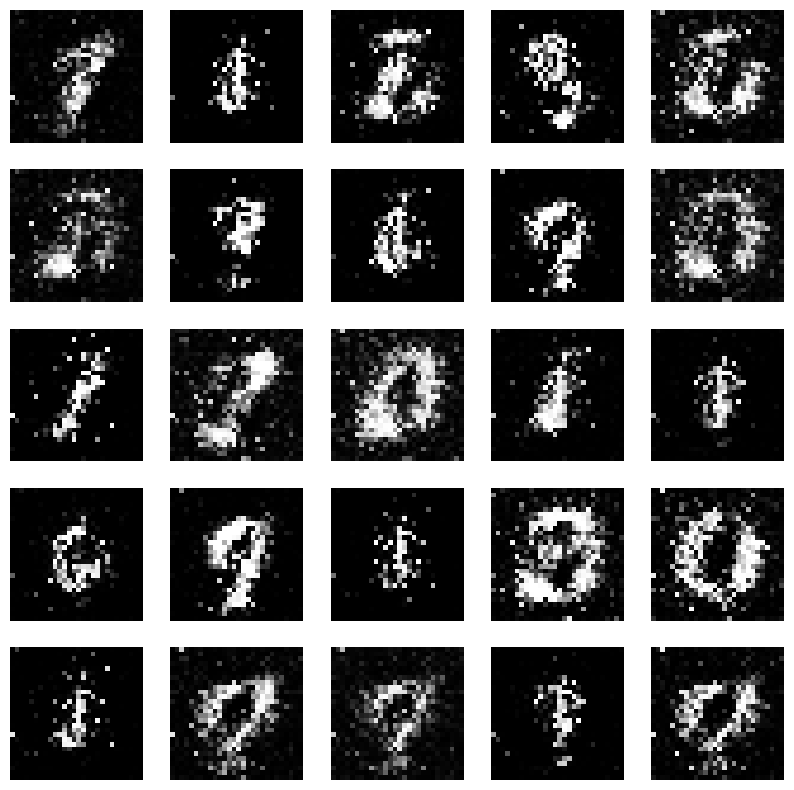

Epochs:  4


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:13,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:10,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:00<01:10,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:20,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:26,  3.08it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/273 [00:01<01:35,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 8/273 [00:02<01:43,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:03<01:47,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:03<01:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:29,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:22,  3.14it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:04<01:16,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:04<01:14,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:11,  3.61it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:05<01:08,  3.75it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:05<01:07,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:05<01:07,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:06<01:07,  3.76it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:06<01:06,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:06<01:06,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:07<01:06,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:07<01:04,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:07<01:04,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:07<01:04,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:08<01:04,  3.84it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:08<01:02,  3.90it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:08<01:03,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:08<01:03,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:09<01:03,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:09<01:01,  3.89it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:09<01:01,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:09<01:01,  3.87it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:10<01:00,  3.93it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:10<01:01,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:10<01:03,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:10<01:02,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:11<01:01,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:11<01:00,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:11<01:00,  3.84it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:11<01:01,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:12<01:00,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:12<00:59,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:12<00:58,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:13<00:59,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:13<00:59,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:13<00:59,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:13<00:57,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:14<01:05,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:14<01:11,  3.10it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:14<01:14,  2.98it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:15<01:16,  2.88it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:15<01:18,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:16<01:20,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:16<01:20,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:17<01:44,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:17<01:30,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:17<01:20,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:18<01:13,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:18<01:07,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:18<01:04,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:18<01:03,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:19<01:00,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:19<00:59,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:19<00:59,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:19<00:58,  3.51it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:20<00:57,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:20<00:56,  3.62it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:20<00:56,  3.61it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:21<00:55,  3.66it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:21<00:55,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:21<00:54,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:21<00:53,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:22<00:53,  3.68it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:22<00:52,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:22<00:52,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:22<00:51,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:23<00:51,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:23<00:51,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:23<00:50,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:23<00:50,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:24<00:50,  3.79it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:24<00:50,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:24<00:50,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:25<00:48,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:25<00:47,  3.92it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:25<00:47,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:25<00:48,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:26<00:47,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:26<00:47,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:26<00:47,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:26<00:46,  3.87it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:27<00:56,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:27<01:00,  2.93it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:28<01:06,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:28<01:06,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:28<01:07,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:29<01:07,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 100/273 [00:29<01:06,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:29<01:00,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:30<00:55,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:30<00:51,  3.30it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 104/273 [00:30<00:49,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:31<00:47,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:31<00:44,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:31<00:44,  3.73it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 108/273 [00:31<00:44,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:32<00:43,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:32<00:42,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:32<00:42,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:32<00:42,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:33<00:41,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:33<00:41,  3.88it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:33<00:41,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:33<00:41,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:34<00:40,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:34<00:40,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:34<00:40,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:34<00:41,  3.73it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:35<00:41,  3.67it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:35<00:41,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:35<00:41,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:36<00:39,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:36<00:39,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:36<00:39,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:36<00:38,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:37<00:38,  3.76it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:37<00:37,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:37<00:37,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:37<00:37,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:38<00:36,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:38<00:36,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:38<00:36,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:38<00:36,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:39<00:36,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:39<00:36,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:39<00:36,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:40<00:42,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:40<00:46,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:41<00:49,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:41<00:48,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:41<00:51,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:42<00:50,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 145/273 [00:42<00:49,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:42<00:44,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:43<00:41,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [00:43<00:38,  3.27it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 149/273 [00:43<00:36,  3.41it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [00:43<00:34,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:44<00:34,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:44<00:33,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:44<00:32,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [00:44<00:31,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:45<00:32,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:45<00:31,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:45<00:30,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:46<00:30,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:46<00:30,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:46<00:30,  3.73it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [00:46<00:29,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:47<00:30,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:47<00:29,  3.75it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 164/273 [00:47<00:28,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:47<00:27,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:48<00:27,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:48<00:27,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:48<00:27,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [00:48<00:26,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:49<00:27,  3.80it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [00:49<00:26,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:49<00:26,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:49<00:26,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [00:50<00:26,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [00:50<00:25,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [00:50<00:25,  3.85it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [00:51<00:25,  3.83it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [00:51<00:25,  3.79it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [00:51<00:24,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:51<00:24,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [00:52<00:24,  3.78it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [00:52<00:24,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [00:52<00:24,  3.68it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [00:53<00:27,  3.22it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 185/273 [00:53<00:30,  2.85it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 186/273 [00:53<00:34,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:54<00:35,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [00:54<00:34,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [00:55<00:33,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [00:55<00:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [00:55<00:27,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [00:56<00:25,  3.20it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [00:56<00:23,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:56<00:22,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [00:56<00:21,  3.62it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [00:57<00:20,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [00:57<00:19,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [00:57<00:19,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [00:57<00:19,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [00:58<00:19,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [00:58<00:19,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [00:58<00:18,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [00:58<00:17,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [00:59<00:17,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [00:59<00:17,  3.94it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [00:59<00:17,  3.93it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [00:59<00:17,  3.87it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:00<00:17,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:00<00:16,  3.88it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:00<00:16,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:00<00:15,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:01<00:15,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:01<00:15,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:01<00:15,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:01<00:15,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:02<00:14,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:02<00:14,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:02<00:14,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:03<00:13,  3.88it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:03<00:13,  3.86it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:03<00:13,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:03<00:13,  3.88it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:04<00:12,  3.85it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:04<00:12,  3.87it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:04<00:12,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:04<00:12,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:05<00:11,  3.84it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:05<00:11,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:05<00:13,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:06<00:14,  2.90it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 231/273 [01:06<00:15,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:07<00:16,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 233/273 [01:07<00:16,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:07<00:15,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:08<00:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:08<00:13,  2.80it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:08<00:11,  3.04it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:09<00:10,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:09<00:10,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:09<00:09,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:09<00:08,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:10<00:08,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:10<00:08,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:10<00:07,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:10<00:07,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:11<00:07,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:11<00:06,  3.87it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:11<00:06,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:11<00:06,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:12<00:06,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:12<00:05,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:12<00:05,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:13<00:05,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:13<00:04,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:13<00:04,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:13<00:04,  3.92it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:14<00:04,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:14<00:03,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:14<00:03,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:14<00:03,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:15<00:03,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:15<00:02,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:15<00:02,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:15<00:02,  3.84it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:16<00:02,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:16<00:01,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:16<00:01,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:16<00:01,  3.91it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 269/273 [01:17<00:01,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:17<00:00,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:17<00:00,  3.85it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:17<00:00,  3.88it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:18<00:00,  3.49it/s]


Perdidas:  0.4028307795524597 , 1.862121820449829
1/1 [==============================] - 0s 37ms/step


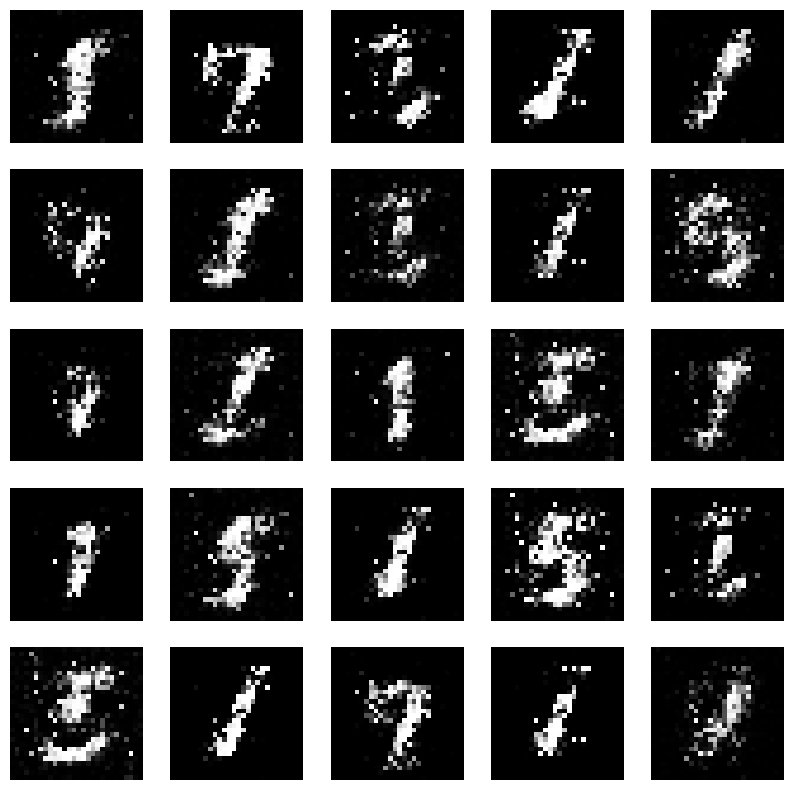

Epochs:  5


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:17,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:11,  3.76it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:00<01:09,  3.86it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:09,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:11,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:01<01:11,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:01<01:10,  3.76it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:02<01:09,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:02<01:10,  3.77it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:02<01:10,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:02<01:08,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:03<01:09,  3.76it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:03<01:09,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:03<01:09,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:03<01:07,  3.82it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:04<01:07,  3.83it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:04<01:07,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:04<01:05,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:05<01:05,  3.87it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:05<01:06,  3.80it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:05<01:06,  3.77it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:05<01:05,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:06<01:05,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:06<01:05,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:06<01:05,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:06<01:05,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:07<01:04,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:07<01:04,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:07<01:04,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:07<01:04,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:08<01:03,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:08<01:02,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:08<01:02,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 34/273 [00:08<01:02,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:09<01:01,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:09<01:02,  3.79it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 37/273 [00:09<01:02,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:10<01:11,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:10<01:17,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:10<01:23,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 41/273 [00:11<01:27,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 42/273 [00:11<01:31,  2.53it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 43/273 [00:12<01:31,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:12<01:34,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:12<01:24,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:13<01:16,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:13<01:11,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:13<01:08,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:13<01:05,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:14<01:01,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:14<01:00,  3.68it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:14<01:00,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:15<00:59,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:15<00:57,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:15<00:56,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:15<00:56,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:16<00:57,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:16<00:57,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:16<00:57,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:16<00:57,  3.73it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:17<00:56,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:17<00:55,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:17<00:54,  3.82it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:17<00:55,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:18<00:54,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:18<00:54,  3.81it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:18<00:54,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:19<00:54,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:19<00:54,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:19<00:54,  3.71it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:19<00:54,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:20<00:54,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:20<00:53,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:20<00:52,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:20<00:52,  3.76it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:21<00:52,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:21<00:51,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:21<00:51,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:21<00:51,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:22<00:51,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:22<00:50,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:22<00:51,  3.74it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:23<00:59,  3.21it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:23<01:04,  2.92it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:24<01:09,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:24<01:10,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:24<01:14,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:25<01:14,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:25<01:13,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:25<01:05,  2.81it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:26<01:00,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:26<00:56,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:26<00:53,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:26<00:51,  3.51it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 95/273 [00:27<00:49,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:27<00:48,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:27<00:46,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:28<00:46,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:28<00:46,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:28<00:45,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:28<00:44,  3.83it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:29<00:45,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:29<00:45,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:29<00:44,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:29<00:44,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:30<00:43,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:30<00:43,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:30<00:43,  3.80it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:30<00:43,  3.74it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:31<00:44,  3.66it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 111/273 [00:31<00:44,  3.68it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:31<00:43,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:32<00:43,  3.67it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:32<00:42,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:32<00:41,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:32<00:41,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:33<00:41,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:33<00:41,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:33<00:41,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:33<00:40,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:34<00:39,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:34<00:39,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:34<00:39,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:34<00:39,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:35<00:39,  3.71it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:35<00:39,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:35<00:40,  3.62it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:36<00:45,  3.21it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 129/273 [00:36<00:50,  2.86it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:37<00:54,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 131/273 [00:37<00:55,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:37<00:55,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:38<00:54,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:38<00:54,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:38<00:49,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:39<00:45,  3.01it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:39<00:41,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:39<00:39,  3.38it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:39<00:38,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:40<00:37,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:40<00:36,  3.62it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 142/273 [00:40<00:35,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:41<00:34,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:41<00:35,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:41<00:35,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:41<00:34,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:42<00:34,  3.66it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:42<00:33,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:42<00:33,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:42<00:32,  3.73it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:43<00:32,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [00:43<00:32,  3.72it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [00:43<00:32,  3.75it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [00:43<00:31,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [00:44<00:30,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:44<00:29,  3.90it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [00:44<00:30,  3.82it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:45<00:30,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:45<00:29,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:45<00:29,  3.81it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [00:45<00:29,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:46<00:29,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:46<00:29,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:46<00:28,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:46<00:28,  3.79it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [00:47<00:28,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [00:47<00:27,  3.87it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:47<00:26,  3.89it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [00:47<00:27,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [00:48<00:26,  3.89it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:48<00:26,  3.86it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [00:48<00:27,  3.68it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 173/273 [00:49<00:32,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [00:49<00:36,  2.73it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [00:50<00:36,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [00:50<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [00:50<00:38,  2.52it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 178/273 [00:51<00:37,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 179/273 [00:51<00:37,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [00:51<00:34,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [00:52<00:31,  2.95it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [00:52<00:28,  3.19it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [00:52<00:26,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [00:53<00:25,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:53<00:24,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [00:53<00:23,  3.65it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [00:53<00:23,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [00:54<00:23,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [00:54<00:22,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:54<00:22,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [00:54<00:21,  3.79it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 192/273 [00:55<00:21,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [00:55<00:21,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [00:55<00:21,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████▏  | 195/273 [00:55<00:20,  3.78it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [00:56<00:20,  3.70it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [00:56<00:20,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [00:56<00:19,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [00:56<00:19,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [00:57<00:19,  3.81it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [00:57<00:19,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [00:57<00:18,  3.82it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [00:58<00:18,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [00:58<00:18,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [00:58<00:18,  3.76it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [00:58<00:17,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [00:59<00:17,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [00:59<00:17,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [00:59<00:16,  3.83it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [00:59<00:16,  3.86it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:00<00:16,  3.80it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:00<00:15,  3.87it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 213/273 [01:00<00:15,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:00<00:15,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:01<00:15,  3.82it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:01<00:14,  3.91it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:01<00:17,  3.26it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 218/273 [01:02<00:18,  2.93it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:02<00:20,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:03<00:19,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:03<00:19,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:03<00:20,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:04<00:21,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 224/273 [01:04<00:18,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 225/273 [01:04<00:16,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:05<00:15,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:05<00:14,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:05<00:13,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:06<00:12,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:06<00:11,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:06<00:11,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:06<00:11,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:07<00:10,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:07<00:10,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:07<00:10,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:07<00:09,  3.79it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:08<00:09,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:08<00:09,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:08<00:08,  3.84it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:08<00:08,  3.82it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:09<00:08,  3.81it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:09<00:08,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:09<00:07,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:09<00:07,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:10<00:07,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:10<00:07,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:10<00:06,  3.80it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:11<00:06,  3.85it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:11<00:06,  3.80it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:11<00:06,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:11<00:05,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:12<00:05,  3.78it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:12<00:05,  3.79it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:12<00:05,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:12<00:04,  3.78it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:13<00:04,  3.75it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:13<00:04,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:13<00:03,  3.78it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:13<00:03,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:14<00:03,  3.85it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:14<00:03,  3.64it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:14<00:03,  3.14it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▋| 263/273 [01:15<00:03,  2.95it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 264/273 [01:15<00:03,  2.78it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 265/273 [01:16<00:02,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:16<00:02,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:16<00:02,  2.59it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 268/273 [01:17<00:01,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:17<00:01,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:17<00:01,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:18<00:00,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:18<00:00,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:18<00:00,  3.47it/s]


Perdidas:  0.3124823570251465 , 1.9758888483047485
1/1 [==============================] - 0s 21ms/step


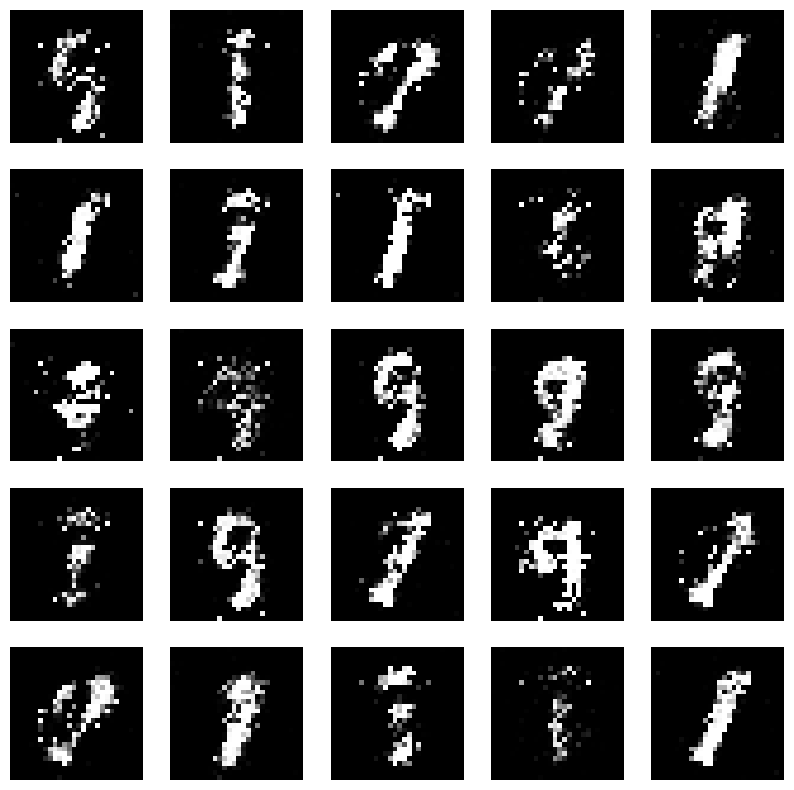

Epochs:  6


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:17,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:16,  3.53it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:00<01:16,  3.53it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<01:15,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:14,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:01<01:13,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:01<01:11,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:12,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:02<01:11,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:02<01:12,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:03<01:11,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:03<01:11,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:03<01:09,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:03<01:09,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:04<01:08,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:04<01:08,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:04<01:07,  3.81it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:04<01:08,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:05<01:08,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:05<01:10,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:05<01:18,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:06<01:23,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:06<01:30,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:07<01:29,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:07<01:32,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:07<01:36,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:08<01:34,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 28/273 [00:08<01:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:08<01:25,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:09<01:18,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:09<01:12,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:09<01:09,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:09<01:07,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:10<01:06,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:10<01:04,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:10<01:04,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:11<01:08,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:11<01:06,  3.52it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:11<01:05,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:11<01:04,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:12<01:03,  3.64it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:12<01:03,  3.66it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:12<01:01,  3.71it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:12<01:02,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:13<01:01,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:13<01:01,  3.68it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:13<01:01,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:14<01:01,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:14<01:00,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:14<00:59,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:14<00:59,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:15<01:01,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:15<00:59,  3.72it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 54/273 [00:15<00:58,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:15<00:57,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:16<00:57,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:16<00:57,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:16<00:57,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:16<00:56,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:17<00:56,  3.77it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:17<00:56,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:17<00:56,  3.75it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:18<00:56,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:18<00:56,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:18<00:58,  3.55it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:19<01:10,  2.95it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:19<01:15,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:19<01:16,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:20<01:17,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:20<01:18,  2.58it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 71/273 [00:21<01:21,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:21<01:21,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:21<01:12,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:22<01:07,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:22<01:03,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:22<00:59,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:22<00:57,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:23<00:54,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:23<00:53,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:23<00:52,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:23<00:51,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:24<00:50,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:24<00:50,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:24<00:50,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:25<00:50,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:25<00:50,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:25<00:50,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:25<00:48,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:26<00:49,  3.74it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 90/273 [00:26<00:49,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:26<00:49,  3.71it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▎      | 92/273 [00:26<00:49,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:27<00:48,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:27<00:48,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:27<00:48,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:27<00:47,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:28<00:46,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:28<00:47,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:28<00:46,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:29<00:46,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:29<00:46,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:29<00:46,  3.64it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:29<00:46,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:30<00:45,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:30<00:45,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:30<00:45,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:30<00:45,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:31<00:44,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:31<00:43,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:31<00:51,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:32<00:57,  2.83it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:32<01:01,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:33<01:04,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:33<01:05,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:34<01:04,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:34<01:02,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:34<00:55,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:35<00:51,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:35<00:48,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:35<00:45,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:35<00:44,  3.43it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:36<00:43,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:36<00:41,  3.58it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 124/273 [00:36<00:41,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:36<00:40,  3.63it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 126/273 [00:37<00:39,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:37<00:39,  3.73it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:37<00:38,  3.75it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:37<00:38,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:38<00:38,  3.74it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:38<00:37,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:38<00:37,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:39<00:37,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:39<00:36,  3.78it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:39<00:36,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:39<00:36,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:40<00:35,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:40<00:35,  3.78it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:40<00:35,  3.74it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:40<00:36,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:41<00:35,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:41<00:35,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:41<00:34,  3.74it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:41<00:34,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:42<00:34,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:42<00:33,  3.79it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [00:42<00:33,  3.80it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [00:43<00:33,  3.74it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [00:43<00:33,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:43<00:32,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:43<00:32,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:44<00:32,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [00:44<00:31,  3.79it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:44<00:36,  3.28it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [00:45<00:39,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [00:45<00:42,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [00:45<00:42,  2.71it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 158/273 [00:46<00:44,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [00:46<00:45,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:47<00:47,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 161/273 [00:47<00:43,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [00:47<00:39,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:48<00:35,  3.08it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [00:48<00:33,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:48<00:31,  3.38it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [00:48<00:30,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:49<00:30,  3.52it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [00:49<00:29,  3.58it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [00:49<00:28,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [00:50<00:28,  3.64it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [00:50<00:27,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:50<00:26,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:50<00:26,  3.77it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [00:51<00:26,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:51<00:25,  3.78it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [00:51<00:25,  3.81it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [00:51<00:25,  3.79it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:52<00:25,  3.75it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 179/273 [00:52<00:25,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [00:52<00:24,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [00:52<00:24,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [00:53<00:24,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:53<00:24,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [00:53<00:23,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:54<00:23,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [00:54<00:23,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:54<00:22,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [00:54<00:22,  3.77it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [00:55<00:22,  3.76it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:55<00:22,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [00:55<00:21,  3.77it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [00:55<00:21,  3.74it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [00:56<00:21,  3.78it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:56<00:21,  3.69it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 195/273 [00:56<00:21,  3.70it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [00:56<00:20,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [00:57<00:20,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [00:57<00:20,  3.71it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 199/273 [00:57<00:22,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [00:58<00:25,  2.86it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 201/273 [00:58<00:26,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [00:59<00:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [00:59<00:27,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:00<00:28,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:00<00:29,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:00<00:25,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:01<00:22,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:01<00:20,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:01<00:19,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:01<00:18,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:02<00:17,  3.50it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:02<00:16,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:02<00:16,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:02<00:16,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:03<00:15,  3.70it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:03<00:15,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:03<00:15,  3.71it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 218/273 [01:04<00:14,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:04<00:14,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:04<00:14,  3.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:04<00:14,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:05<00:14,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:05<00:13,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:05<00:13,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:05<00:13,  3.67it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:06<00:12,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:06<00:12,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:06<00:12,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:07<00:12,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:07<00:11,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:07<00:11,  3.65it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:07<00:11,  3.64it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:08<00:10,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:08<00:10,  3.71it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:08<00:10,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:08<00:10,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:09<00:09,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:09<00:09,  3.66it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:09<00:09,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:10<00:09,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:10<00:08,  3.68it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:10<00:08,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:11<00:09,  3.07it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:11<00:09,  2.93it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:11<00:09,  2.82it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:12<00:10,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:12<00:09,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 248/273 [01:13<00:10,  2.45it/s]

4/4 [==============================] - 0s 19ms/step


 91%|█████████ | 249/273 [01:13<00:10,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:13<00:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:14<00:07,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:14<00:06,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:14<00:06,  3.21it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:14<00:05,  3.36it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:15<00:05,  3.40it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 256/273 [01:15<00:04,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:15<00:04,  3.55it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:16<00:04,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:16<00:03,  3.58it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:16<00:03,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:16<00:03,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:17<00:03,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:17<00:02,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:17<00:02,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:17<00:02,  3.68it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:18<00:01,  3.72it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:18<00:01,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:18<00:01,  3.64it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:19<00:01,  3.67it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:19<00:00,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:19<00:00,  3.61it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:19<00:00,  3.62it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:20<00:00,  3.41it/s]


Perdidas:  0.351563036441803 , 1.788456916809082
1/1 [==============================] - 0s 28ms/step


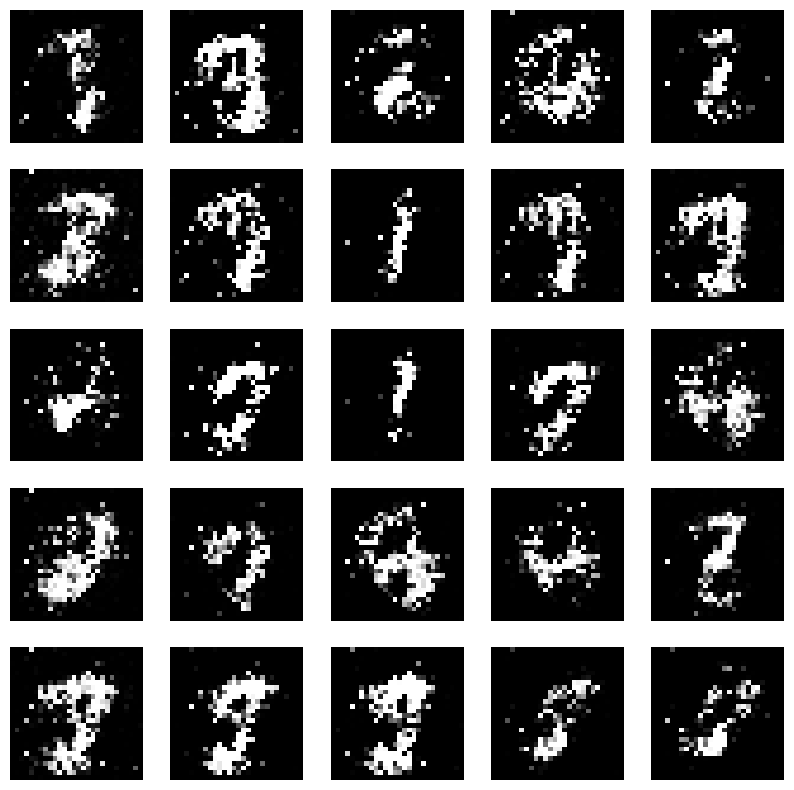

Epochs:  7


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:24,  3.22it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<01:20,  3.38it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<01:40,  2.70it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:51,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/273 [00:02<01:52,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:50,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:51,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:50,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:39,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:30,  2.89it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:04<01:24,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:21,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:17,  3.33it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 15/273 [00:05<01:17,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:15,  3.42it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:05<01:13,  3.49it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:06<01:12,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:06<01:11,  3.53it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:06<01:09,  3.62it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:06<01:09,  3.65it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:07<01:08,  3.67it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:07<01:08,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:07<01:08,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:08<01:07,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:08<01:07,  3.67it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 27/273 [00:08<01:07,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:08<01:05,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:09<01:06,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:09<01:05,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:09<01:05,  3.68it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:09<01:05,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:10<01:05,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:10<01:04,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:10<01:04,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:11<01:04,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:11<01:03,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:11<01:03,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:11<01:03,  3.71it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:12<01:02,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:12<01:02,  3.71it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:12<01:02,  3.67it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:12<01:02,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:13<01:01,  3.73it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:13<01:00,  3.74it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:13<01:03,  3.58it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 47/273 [00:14<01:14,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:14<01:20,  2.79it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:15<01:37,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:15<01:39,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:16<01:35,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 52/273 [00:16<01:32,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:16<01:30,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:17<01:20,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:17<01:14,  2.93it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:17<01:09,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:17<01:06,  3.24it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:18<01:04,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:18<01:01,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:18<01:00,  3.50it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:19<00:58,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:19<00:58,  3.60it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:19<00:58,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:19<00:58,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:20<00:56,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:20<00:56,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:20<00:55,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:20<00:55,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:21<00:55,  3.70it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:21<00:54,  3.72it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:21<00:54,  3.68it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:22<00:55,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:22<01:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:23<01:11,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:23<01:06,  2.98it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:23<01:03,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:23<01:01,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:24<01:00,  3.25it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 79/273 [00:24<00:58,  3.32it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:24<00:56,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:25<00:56,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:25<00:55,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 83/273 [00:25<00:54,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:25<00:53,  3.50it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 85/273 [00:26<00:54,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:26<00:54,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:26<00:52,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:27<00:58,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:27<01:05,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:27<01:08,  2.68it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 91/273 [00:28<01:12,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 92/273 [00:28<01:14,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:29<01:14,  2.41it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 94/273 [00:29<01:14,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:30<01:08,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:30<01:02,  2.82it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:30<00:58,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:30<00:55,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:31<00:52,  3.29it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:31<00:51,  3.35it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:31<00:50,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:31<00:49,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:32<00:48,  3.50it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 104/273 [00:32<00:47,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:32<00:47,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:33<00:46,  3.63it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:33<00:46,  3.59it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 108/273 [00:33<00:46,  3.57it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 109/273 [00:33<00:45,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:34<00:44,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:34<00:45,  3.59it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:34<00:44,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:35<00:44,  3.61it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:35<00:45,  3.50it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:35<00:45,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:35<00:44,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:36<00:43,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:36<00:43,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:36<00:42,  3.64it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:37<00:42,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:37<00:41,  3.64it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:37<00:41,  3.62it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 123/273 [00:37<00:41,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:38<00:40,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:38<00:39,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:38<00:39,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:38<00:39,  3.72it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:39<00:38,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:39<00:39,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:39<00:38,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:40<00:42,  3.37it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:40<00:45,  3.13it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:40<00:50,  2.76it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 134/273 [00:41<00:52,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 135/273 [00:41<00:54,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 136/273 [00:42<00:53,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:42<00:56,  2.42it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 138/273 [00:43<00:56,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:43<00:50,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:43<00:45,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:43<00:42,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:44<00:40,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:44<00:38,  3.39it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [00:44<00:37,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:44<00:36,  3.47it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [00:45<00:35,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:45<00:35,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:45<00:37,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:46<00:36,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:46<00:34,  3.55it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:46<00:34,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:46<00:33,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [00:47<00:32,  3.65it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▋    | 154/273 [00:47<00:32,  3.66it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [00:47<00:32,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:48<00:31,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:48<00:31,  3.73it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:48<00:30,  3.72it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [00:48<00:30,  3.69it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [00:49<00:30,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:49<00:30,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:49<00:30,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:49<00:30,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:50<00:29,  3.67it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [00:50<00:29,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [00:50<00:29,  3.69it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [00:50<00:28,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:51<00:28,  3.70it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [00:51<00:28,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [00:51<00:27,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:52<00:27,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [00:52<00:27,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:52<00:27,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [00:52<00:26,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:53<00:30,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [00:53<00:31,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [00:54<00:34,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [00:54<00:35,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [00:54<00:35,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [00:55<00:37,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [00:55<00:37,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [00:56<00:36,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:56<00:32,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [00:56<00:29,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:56<00:27,  3.16it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [00:57<00:26,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:57<00:25,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [00:57<00:24,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [00:58<00:23,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:58<00:23,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [00:58<00:22,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [00:58<00:22,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [00:59<00:22,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:59<00:21,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [00:59<00:21,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 196/273 [00:59<00:21,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:00<00:20,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:00<00:20,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:00<00:19,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 200/273 [01:01<00:19,  3.75it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:01<00:19,  3.67it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:01<00:19,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:01<00:18,  3.69it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:02<00:18,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:02<00:18,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:02<00:18,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:02<00:17,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:03<00:17,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:03<00:17,  3.66it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [01:03<00:17,  3.67it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:04<00:16,  3.69it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:04<00:16,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:04<00:16,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:04<00:15,  3.70it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:05<00:15,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:05<00:15,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:05<00:15,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:05<00:15,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:06<00:16,  3.19it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:06<00:18,  2.87it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:07<00:19,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:07<00:19,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:08<00:19,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:08<00:20,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:08<00:20,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:09<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:09<00:16,  2.79it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:09<00:14,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:10<00:13,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:10<00:12,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:10<00:12,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:10<00:11,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:11<00:11,  3.55it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:11<00:10,  3.59it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:11<00:10,  3.61it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:11<00:10,  3.65it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:12<00:09,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:12<00:09,  3.60it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:12<00:09,  3.63it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:13<00:08,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:13<00:08,  3.69it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:13<00:09,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:13<00:08,  3.47it/s]

4/4 [==============================] - 0s 5ms/step


 89%|████████▉ | 244/273 [01:14<00:08,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:14<00:07,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:14<00:07,  3.61it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:15<00:07,  3.59it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:15<00:06,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:15<00:06,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:15<00:06,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:16<00:05,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:16<00:05,  3.63it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:16<00:05,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:16<00:05,  3.62it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 255/273 [01:17<00:04,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:17<00:04,  3.64it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:17<00:04,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:18<00:04,  3.60it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:18<00:03,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:18<00:03,  3.66it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:18<00:03,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:19<00:02,  3.67it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:19<00:03,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:19<00:02,  3.05it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:20<00:02,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:20<00:02,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:21<00:02,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:21<00:02,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 269/273 [01:22<00:01,  2.41it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 270/273 [01:22<00:01,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:22<00:00,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:23<00:00,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:23<00:00,  3.28it/s]


Perdidas:  0.47320300340652466 , 1.853400707244873
1/1 [==============================] - 0s 29ms/step


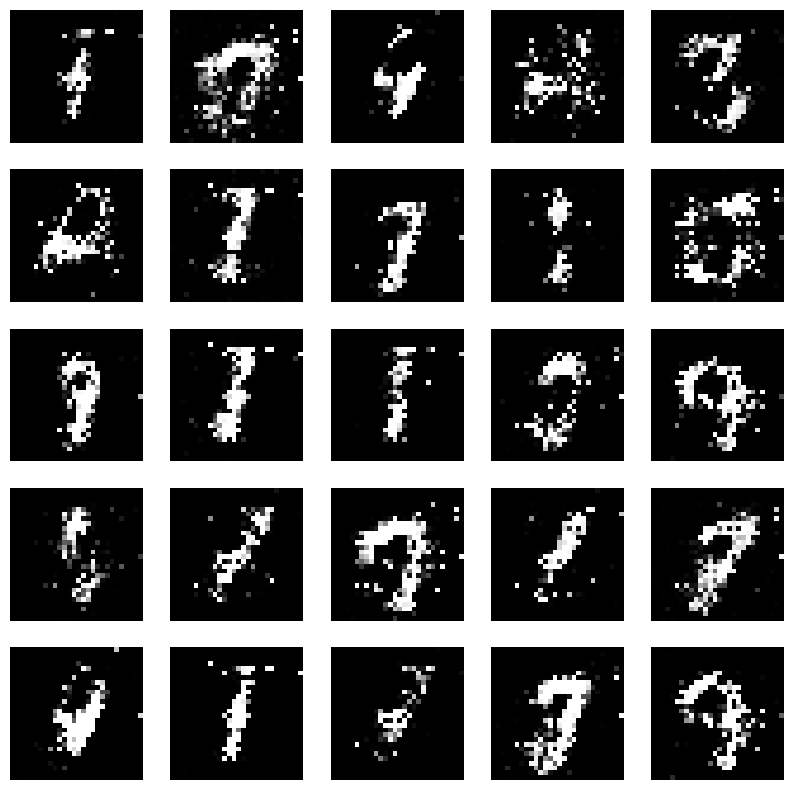

Epochs:  8


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:20,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:15,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:00<01:15,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:14,  3.63it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:14,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:01<01:14,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:01<01:12,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:12,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:02<01:11,  3.71it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:02<01:11,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:03<01:12,  3.64it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:03<01:11,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:03<01:11,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:03<01:10,  3.66it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:04<01:09,  3.71it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 16/273 [00:04<01:08,  3.76it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:04<01:08,  3.72it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:04<01:09,  3.67it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:05<01:09,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:05<01:08,  3.68it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:05<01:09,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:06<01:08,  3.66it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:06<01:19,  3.13it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 24/273 [00:06<01:30,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:07<01:37,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 26/273 [00:07<01:45,  2.34it/s]

4/4 [==============================] - 0s 16ms/step


 10%|▉         | 27/273 [00:08<01:47,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:08<01:48,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:09<01:40,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:09<01:28,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:09<01:21,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:09<01:16,  3.14it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:10<01:12,  3.29it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:10<01:10,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:10<01:09,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:11<01:13,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:11<01:10,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:11<01:08,  3.43it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:11<01:07,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:12<01:06,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:12<01:04,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:12<01:03,  3.64it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 43/273 [00:13<01:03,  3.62it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:13<01:02,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:13<01:02,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:13<01:02,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:14<01:02,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:14<01:01,  3.68it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:14<01:00,  3.68it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:14<01:00,  3.71it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 51/273 [00:15<01:01,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:15<01:00,  3.67it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:15<00:59,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:16<00:59,  3.66it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:16<00:59,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:16<00:58,  3.71it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 57/273 [00:16<00:58,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:17<00:58,  3.66it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:17<00:58,  3.68it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:17<00:58,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:17<00:57,  3.67it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:18<00:57,  3.64it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:18<00:57,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:18<00:57,  3.64it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:19<01:05,  3.18it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:19<01:11,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:19<01:14,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:20<01:17,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:20<01:20,  2.53it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 70/273 [00:21<01:25,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:21<01:26,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:22<01:20,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:22<01:12,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:22<01:07,  2.96it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 75/273 [00:22<01:02,  3.17it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:23<00:59,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:23<01:01,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:23<00:58,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:24<00:56,  3.42it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:24<00:55,  3.50it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:24<00:54,  3.52it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:24<00:53,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:25<00:53,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:25<00:52,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:25<00:52,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:26<00:51,  3.61it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:26<00:51,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:26<00:51,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:26<00:50,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:27<00:49,  3.66it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:27<00:49,  3.67it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 92/273 [00:27<00:49,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:27<00:48,  3.70it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 94/273 [00:28<00:49,  3.64it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:28<00:49,  3.58it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:28<00:49,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:29<00:48,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:29<00:48,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:29<00:48,  3.58it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:29<00:48,  3.59it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:30<00:47,  3.61it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 102/273 [00:30<00:46,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:30<00:47,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:31<00:47,  3.53it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:31<00:51,  3.29it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:31<00:49,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:31<00:47,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:32<00:51,  3.18it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:32<00:58,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:33<00:59,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:33<01:01,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:33<01:03,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:34<01:03,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 114/273 [00:34<01:05,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:35<01:03,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:35<00:57,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:35<00:53,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:36<00:49,  3.14it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:36<00:47,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:36<00:45,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:36<00:44,  3.45it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:37<00:42,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:37<00:42,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:37<00:41,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:37<00:41,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:38<00:40,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:38<00:40,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:38<00:40,  3.58it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:39<00:40,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:39<00:39,  3.61it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:39<00:40,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:39<00:39,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:40<00:39,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:40<00:38,  3.56it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:40<00:38,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:41<00:38,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:41<00:37,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:41<00:37,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:41<00:37,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:42<00:36,  3.61it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:42<00:36,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:42<00:36,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:42<00:36,  3.60it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:43<00:35,  3.62it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [00:43<00:35,  3.64it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:43<00:37,  3.38it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [00:44<00:37,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:44<00:36,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:44<00:35,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:45<00:35,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:45<00:36,  3.36it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:45<00:42,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:46<00:44,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [00:46<00:47,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:47<00:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [00:47<00:47,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [00:47<00:46,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:48<00:47,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:48<00:42,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [00:48<00:38,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:49<00:36,  3.10it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [00:49<00:34,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:49<00:32,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:49<00:31,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [00:50<00:30,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:50<00:30,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:50<00:29,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:51<00:28,  3.62it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [00:51<00:29,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [00:51<00:28,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [00:51<00:28,  3.57it/s]

4/4 [==============================] - 0s 5ms/step


 63%|██████▎   | 172/273 [00:52<00:28,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:52<00:27,  3.58it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 174/273 [00:52<00:27,  3.58it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [00:53<00:27,  3.53it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [00:53<00:27,  3.52it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [00:53<00:27,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:53<00:28,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [00:54<00:27,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:54<00:26,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [00:54<00:25,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [00:55<00:25,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:55<00:25,  3.55it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [00:55<00:24,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:55<00:24,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [00:56<00:23,  3.64it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [00:56<00:23,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [00:56<00:23,  3.64it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [00:56<00:23,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:57<00:22,  3.65it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [00:57<00:22,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [00:57<00:22,  3.61it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [00:58<00:22,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [00:58<00:23,  3.41it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 195/273 [00:58<00:25,  3.03it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 196/273 [00:59<00:28,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [00:59<00:29,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:00<00:29,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 199/273 [01:00<00:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:00<00:29,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 201/273 [01:01<00:31,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:01<00:27,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:02<00:26,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:02<00:23,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:02<00:22,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:02<00:20,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:03<00:19,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:03<00:19,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:03<00:18,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:04<00:19,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:04<00:18,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:04<00:17,  3.41it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:04<00:17,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:05<00:16,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:05<00:16,  3.56it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 216/273 [01:05<00:15,  3.58it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:06<00:15,  3.64it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:06<00:15,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:06<00:14,  3.63it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:06<00:14,  3.54it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:07<00:14,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:07<00:14,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:07<00:14,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:08<00:13,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:08<00:13,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:08<00:13,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:08<00:12,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:09<00:12,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:09<00:12,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:09<00:11,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:09<00:11,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:10<00:11,  3.56it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:10<00:11,  3.57it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 234/273 [01:10<00:11,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:11<00:10,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:11<00:10,  3.61it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:11<00:11,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:12<00:12,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:12<00:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:13<00:12,  2.57it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 241/273 [01:13<00:13,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:14<00:13,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:14<00:12,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:14<00:11,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:15<00:09,  2.83it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 246/273 [01:15<00:08,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:15<00:08,  3.14it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:15<00:07,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:16<00:07,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:16<00:06,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:16<00:06,  3.52it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:16<00:05,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:17<00:05,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:17<00:05,  3.61it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:17<00:05,  3.60it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:18<00:05,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:18<00:04,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:18<00:04,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:18<00:03,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:19<00:03,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:19<00:03,  3.57it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 262/273 [01:19<00:03,  3.54it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:20<00:02,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:20<00:02,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:20<00:02,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:20<00:01,  3.67it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:21<00:01,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:21<00:01,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:21<00:01,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:22<00:00,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:22<00:00,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:22<00:00,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:22<00:00,  3.29it/s]


Perdidas:  0.4301619827747345 , 1.6595427989959717
1/1 [==============================] - 0s 37ms/step


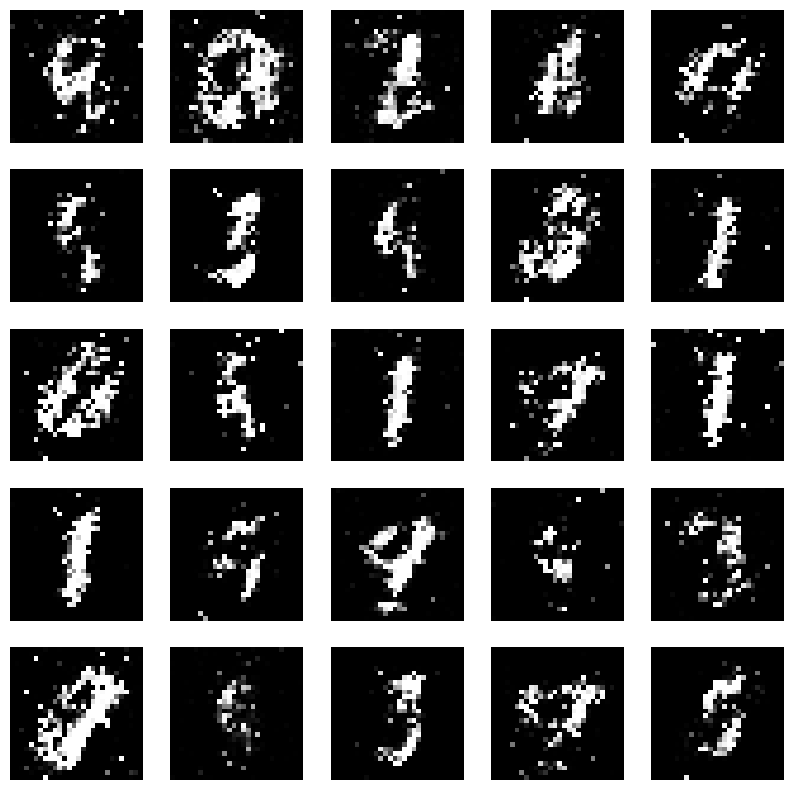

Epochs:  9


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<02:19,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:00<02:12,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:01,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:33,  2.87it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:26,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:23,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:20,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:19,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:16,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:03<01:15,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:14,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:14,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:04<01:15,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:04<01:13,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:12,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:05<01:12,  3.54it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 18/273 [00:05<01:17,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:05<01:14,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:06<01:13,  3.43it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 21/273 [00:06<01:13,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:06<01:11,  3.50it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:07<01:11,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:07<01:09,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:07<01:10,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:07<01:08,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:08<01:08,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:08<01:09,  3.52it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:08<01:09,  3.49it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:09<01:08,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:09<01:08,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:09<01:08,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:09<01:08,  3.51it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:10<01:07,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:10<01:07,  3.54it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 36/273 [00:10<01:07,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:11<01:07,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:11<01:07,  3.48it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:11<01:14,  3.16it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:12<01:19,  2.92it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 41/273 [00:12<01:24,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:12<01:27,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:13<01:29,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:13<01:30,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:14<01:36,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:14<01:34,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:14<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:15<01:18,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:15<01:14,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:15<01:09,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:16<01:07,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:16<01:05,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:16<01:03,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:16<01:03,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:17<01:02,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:17<01:01,  3.50it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:17<01:00,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:18<01:00,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:18<01:00,  3.56it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:18<01:00,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:18<01:00,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:19<00:59,  3.53it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:19<00:58,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:19<00:58,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:20<00:58,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:20<00:58,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:20<00:57,  3.56it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:20<00:57,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:21<00:57,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:21<00:56,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 71/273 [00:21<00:57,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:22<00:57,  3.48it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:22<00:56,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:22<00:55,  3.56it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:22<00:55,  3.56it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:23<00:55,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:23<00:55,  3.54it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 78/273 [00:23<00:54,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:23<00:53,  3.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:24<00:58,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:24<00:55,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:25<01:02,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:25<01:10,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:25<01:10,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:26<01:14,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:26<01:15,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:27<01:17,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 88/273 [00:27<01:21,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:28<01:16,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:28<01:09,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:28<01:03,  2.86it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:28<00:59,  3.02it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:29<00:56,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:29<00:54,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:29<00:52,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:29<00:50,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:30<00:50,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:30<00:49,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:30<00:49,  3.49it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:31<00:49,  3.52it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:31<00:49,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 102/273 [00:31<00:48,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:31<00:47,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:32<00:47,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:32<00:47,  3.55it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:32<00:47,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:33<00:46,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:33<00:46,  3.51it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:33<00:46,  3.53it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:33<00:45,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:34<00:45,  3.59it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:34<00:45,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:34<00:44,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:35<00:44,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:35<00:43,  3.60it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 116/273 [00:35<00:43,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:35<00:43,  3.58it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:36<00:42,  3.62it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:36<00:43,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:36<00:43,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:37<00:42,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:37<00:42,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:37<00:42,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:37<00:43,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:38<00:48,  3.06it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:38<00:51,  2.85it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 127/273 [00:39<00:55,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:39<00:57,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:40<00:58,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:40<01:00,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:40<01:01,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:41<00:54,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:41<00:49,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:41<00:46,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:42<00:43,  3.16it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:42<00:44,  3.06it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:42<00:42,  3.18it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:43<00:41,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:43<00:42,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:43<00:40,  3.28it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:43<00:39,  3.32it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:44<00:38,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:44<00:37,  3.49it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:44<00:36,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:45<00:35,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:45<00:35,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:45<00:34,  3.62it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:45<00:34,  3.61it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [00:46<00:34,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:46<00:34,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:46<00:33,  3.61it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:46<00:34,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [00:47<00:33,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:47<00:33,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:47<00:33,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:48<00:33,  3.54it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [00:48<00:33,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:48<00:32,  3.53it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [00:48<00:32,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:49<00:33,  3.32it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [00:49<00:32,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:49<00:31,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:50<00:31,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:50<00:31,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:50<00:31,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:51<00:31,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:51<00:34,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [00:51<00:38,  2.76it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [00:52<00:40,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:52<00:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:53<00:43,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:53<00:41,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [00:54<00:41,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [00:54<00:39,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [00:54<00:35,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [00:54<00:32,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [00:55<00:30,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:55<00:29,  3.24it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [00:55<00:27,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:56<00:26,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [00:56<00:26,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [00:56<00:26,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:56<00:25,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [00:57<00:25,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [00:57<00:25,  3.50it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [00:57<00:24,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [00:58<00:24,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [00:58<00:23,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [00:58<00:23,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [00:58<00:23,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [00:59<00:22,  3.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [00:59<00:23,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [00:59<00:22,  3.56it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:00<00:21,  3.60it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:00<00:21,  3.58it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 196/273 [01:00<00:21,  3.55it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:00<00:21,  3.54it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:01<00:21,  3.56it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:01<00:20,  3.55it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:01<00:20,  3.56it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:01<00:20,  3.55it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:02<00:19,  3.56it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:02<00:19,  3.56it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:02<00:19,  3.57it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:03<00:19,  3.55it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:03<00:18,  3.54it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:03<00:18,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:03<00:18,  3.59it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:04<00:17,  3.56it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:04<00:19,  3.25it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:05<00:22,  2.81it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:05<00:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:06<00:25,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 214/273 [01:06<00:24,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:06<00:24,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:07<00:23,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 217/273 [01:07<00:22,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:07<00:20,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:08<00:18,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:08<00:17,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:08<00:16,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:09<00:15,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:09<00:14,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:09<00:14,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:09<00:13,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:10<00:13,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:10<00:13,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:10<00:13,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:11<00:12,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:11<00:12,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:11<00:11,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:11<00:11,  3.54it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▌ | 233/273 [01:12<00:11,  3.56it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:12<00:10,  3.59it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:12<00:10,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:13<00:10,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:13<00:10,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:13<00:09,  3.53it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:13<00:09,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:14<00:10,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:14<00:09,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:14<00:09,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:15<00:08,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:15<00:08,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:15<00:08,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:15<00:07,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:16<00:07,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:16<00:07,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:16<00:06,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:17<00:06,  3.54it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:17<00:06,  3.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:17<00:06,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:18<00:06,  2.92it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:18<00:07,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 255/273 [01:19<00:07,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:19<00:06,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:19<00:06,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:20<00:06,  2.36it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 259/273 [01:20<00:05,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:21<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:21<00:04,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:21<00:03,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:21<00:03,  3.17it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 264/273 [01:22<00:02,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:22<00:02,  3.31it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:22<00:02,  3.38it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:23<00:01,  3.43it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:23<00:01,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:23<00:01,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:23<00:00,  3.51it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 271/273 [01:24<00:00,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:24<00:00,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:24<00:00,  3.22it/s]


Perdidas:  0.4826612174510956 , 1.282239556312561
1/1 [==============================] - 0s 32ms/step


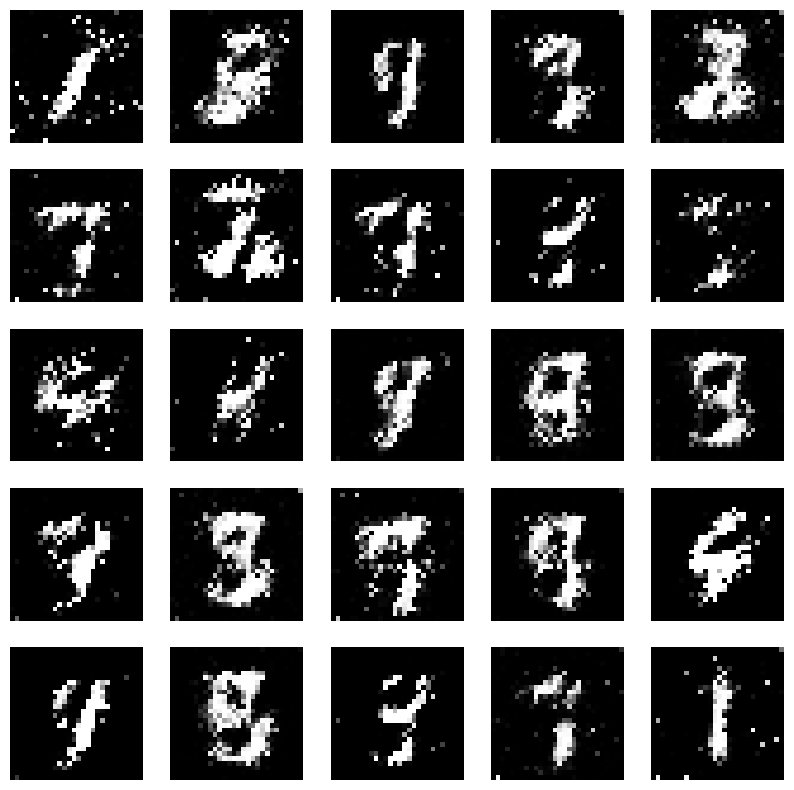

Epochs:  10


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:36,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:25,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:00<01:19,  3.38it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<01:17,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:22,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:01<01:19,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:17,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:22,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:02<01:19,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:22,  3.18it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 11/273 [00:03<01:30,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:03<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:45,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 14/273 [00:04<01:48,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:05<01:48,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:05<01:50,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:49,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:06<01:38,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:06<01:31,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:07<01:24,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:07<01:19,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:07<01:16,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:07<01:15,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:08<01:13,  3.41it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:08<01:12,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:08<01:16,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:09<01:14,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:09<01:11,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:09<01:10,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:09<01:10,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:10<01:09,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:10<01:10,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:10<01:09,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:11<01:08,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:11<01:08,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:11<01:07,  3.52it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:11<01:06,  3.55it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:12<01:05,  3.58it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:12<01:05,  3.57it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:12<01:05,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:13<01:06,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:13<01:05,  3.54it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:13<01:05,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:13<01:05,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:14<01:04,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:14<01:04,  3.53it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:14<01:04,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:15<01:03,  3.54it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:15<01:05,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:15<01:04,  3.46it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:15<01:04,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:16<01:05,  3.35it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 53/273 [00:16<01:16,  2.86it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:17<01:20,  2.73it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 55/273 [00:17<01:24,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:18<01:30,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 57/273 [00:18<01:30,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:18<01:30,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:19<01:30,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:19<01:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:19<01:15,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:20<01:11,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:20<01:07,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:20<01:04,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:21<01:03,  3.26it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:21<01:02,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:21<01:01,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:21<00:59,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:22<00:59,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:22<01:01,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:22<01:00,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:23<00:58,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:23<00:58,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:23<00:57,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:23<00:56,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:24<00:56,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:24<00:56,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:24<00:56,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:25<00:55,  3.52it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:25<00:55,  3.48it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:25<00:55,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:25<00:54,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:26<00:55,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:26<00:54,  3.50it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:26<00:53,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:27<00:53,  3.51it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:27<00:58,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:27<00:56,  3.29it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:28<00:54,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:28<00:53,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:28<00:53,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:28<00:52,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:29<00:51,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:29<00:59,  2.99it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:30<01:04,  2.78it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:30<01:10,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:30<01:12,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:31<01:15,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:31<01:16,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 100/273 [00:32<01:17,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:32<01:10,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:32<01:03,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:33<00:59,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:33<00:56,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:33<00:52,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:34<00:51,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:34<00:49,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:34<00:49,  3.36it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:34<00:48,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:35<00:47,  3.43it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:35<00:47,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:35<00:46,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:36<00:45,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:36<00:46,  3.43it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:36<00:46,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:37<00:45,  3.44it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:37<00:44,  3.47it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:37<00:45,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:37<00:43,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:38<00:43,  3.52it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:38<00:43,  3.53it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:38<00:43,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:39<00:42,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:39<00:42,  3.50it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:39<00:42,  3.52it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:39<00:42,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:40<00:41,  3.50it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 128/273 [00:40<00:41,  3.51it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:40<00:41,  3.48it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:41<00:41,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:41<00:40,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:41<00:41,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:41<00:40,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:42<00:39,  3.49it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:42<00:40,  3.45it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:42<00:46,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:43<00:49,  2.75it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:43<00:57,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:44<00:58,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 140/273 [00:44<00:59,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:45<00:56,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [00:45<00:54,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [00:45<00:50,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:46<00:45,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:46<00:42,  3.03it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:46<00:40,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:47<00:52,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:47<00:49,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [00:48<00:45,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:48<00:42,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:48<00:40,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:48<00:38,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:49<00:37,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:49<00:36,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [00:49<00:35,  3.30it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [00:50<00:35,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [00:50<00:34,  3.32it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [00:50<00:34,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:51<00:33,  3.41it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [00:51<00:33,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:51<00:32,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [00:51<00:32,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:52<00:32,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:52<00:32,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [00:52<00:31,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [00:53<00:33,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:53<00:32,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [00:53<00:31,  3.33it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [00:54<00:31,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [00:54<00:31,  3.32it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [00:54<00:30,  3.32it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [00:54<00:30,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:55<00:29,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [00:55<00:28,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:55<00:31,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [00:56<00:35,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [00:56<00:39,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:57<00:39,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [00:57<00:38,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 180/273 [00:58<00:39,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [00:58<00:38,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [00:58<00:38,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [00:59<00:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [00:59<00:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [00:59<00:30,  2.88it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:00<00:28,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:00<00:27,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:00<00:26,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:01<00:25,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:01<00:24,  3.36it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:01<00:23,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:01<00:23,  3.46it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 193/273 [01:02<00:23,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:02<00:23,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:02<00:22,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:03<00:22,  3.47it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:03<00:22,  3.40it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:03<00:21,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:03<00:21,  3.45it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:04<00:21,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:04<00:20,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:04<00:20,  3.44it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:05<00:20,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:05<00:20,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:05<00:19,  3.41it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 206/273 [01:06<00:19,  3.41it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:06<00:20,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:06<00:20,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:06<00:19,  3.32it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [01:07<00:18,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:07<00:18,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:07<00:17,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:08<00:17,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [01:08<00:16,  3.51it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:08<00:16,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:08<00:16,  3.52it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:09<00:17,  3.12it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 218/273 [01:09<00:19,  2.80it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:10<00:20,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:10<00:21,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:11<00:21,  2.42it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:11<00:21,  2.36it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 223/273 [01:12<00:22,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:12<00:20,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:12<00:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:13<00:16,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:13<00:15,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:13<00:14,  3.10it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:13<00:13,  3.19it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:14<00:13,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:14<00:12,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:14<00:12,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▌ | 233/273 [01:15<00:11,  3.45it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:15<00:11,  3.50it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 235/273 [01:15<00:11,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:15<00:10,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:16<00:10,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:16<00:10,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:16<00:09,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:17<00:09,  3.47it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:17<00:09,  3.49it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:17<00:08,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:17<00:09,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:18<00:08,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:18<00:08,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:18<00:08,  3.37it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:19<00:07,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:19<00:07,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:19<00:06,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:20<00:07,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:20<00:06,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:20<00:06,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:20<00:06,  3.21it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:21<00:05,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:21<00:05,  3.32it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:21<00:05,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:22<00:04,  3.39it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:22<00:05,  2.97it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 259/273 [01:23<00:05,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:23<00:05,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:23<00:04,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:24<00:04,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:24<00:04,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:25<00:04,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:25<00:03,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:25<00:02,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:26<00:02,  2.81it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:26<00:01,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:26<00:01,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:27<00:00,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:27<00:00,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:27<00:00,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:28<00:00,  3.10it/s]


Perdidas:  0.42881011962890625 , 1.3064279556274414
1/1 [==============================] - 0s 32ms/step


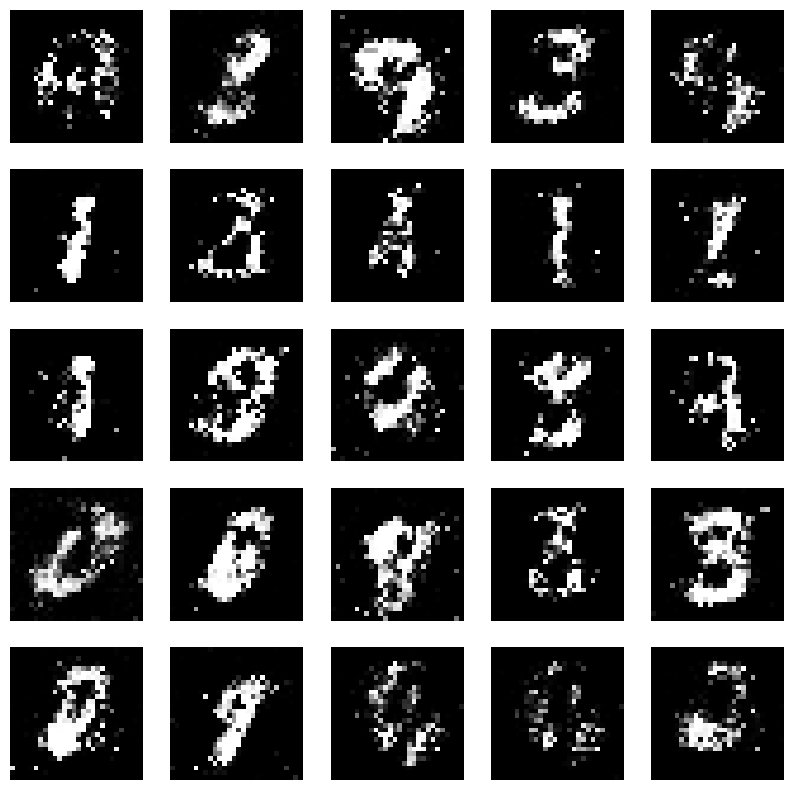

Epochs:  11


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:40,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:25,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:00<01:20,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:21,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:21,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:01<01:19,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:19,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:02<01:17,  3.41it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:02<01:22,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:21,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:03<01:19,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:18,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:03<01:17,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:04<01:22,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:04<01:31,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:35,  2.70it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 17/273 [00:05<01:39,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:05<01:41,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 19/273 [00:06<01:47,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:06<01:47,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:07<01:51,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:07<01:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:07<01:32,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:08<01:27,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:08<01:22,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:08<01:18,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:09<01:16,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:09<01:15,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:09<01:12,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:10<01:11,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:10<01:11,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:10<01:10,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:10<01:10,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:11<01:09,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:11<01:14,  3.21it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:11<01:11,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:12<01:09,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:12<01:09,  3.37it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:12<01:08,  3.42it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:12<01:08,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:13<01:07,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:13<01:06,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:13<01:05,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:14<01:05,  3.50it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:14<01:06,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:14<01:06,  3.39it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:15<01:06,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:15<01:05,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:15<01:10,  3.20it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:15<01:07,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:16<01:06,  3.36it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:16<01:05,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:16<01:04,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:17<01:05,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:17<01:04,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:17<01:13,  2.95it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 57/273 [00:18<01:20,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:18<01:24,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:19<01:26,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:19<01:30,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:20<01:29,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 62/273 [00:20<01:31,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 63/273 [00:20<01:26,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:21<01:18,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:21<01:12,  2.87it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:21<01:08,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:22<01:05,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:22<01:03,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:22<01:02,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:22<01:01,  3.28it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:23<01:00,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:23<00:59,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:23<00:57,  3.45it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:24<00:57,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:24<00:57,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:24<00:56,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:24<00:56,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:25<01:00,  3.20it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 79/273 [00:25<00:58,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:25<00:57,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:26<00:57,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:26<00:56,  3.37it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 83/273 [00:26<00:56,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:27<00:55,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:27<00:55,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:27<00:54,  3.44it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:27<00:53,  3.46it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:28<00:54,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:28<00:53,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:28<00:53,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:29<00:53,  3.41it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:29<00:52,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:29<00:51,  3.47it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:29<00:51,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:30<00:52,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:30<00:51,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:30<00:51,  3.43it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:31<00:57,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:31<01:00,  2.89it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 100/273 [00:32<01:02,  2.77it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 101/273 [00:32<01:10,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:32<01:10,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 103/273 [00:33<01:09,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 104/273 [00:33<01:10,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 105/273 [00:34<01:11,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:34<01:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:34<00:59,  2.78it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:35<00:55,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:35<00:52,  3.10it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:35<00:50,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:36<00:49,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:36<00:51,  3.13it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:36<00:49,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:36<00:47,  3.34it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:37<00:46,  3.38it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 116/273 [00:37<00:46,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:37<00:45,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:38<00:45,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:38<00:45,  3.40it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:38<00:44,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:38<00:43,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:39<00:43,  3.45it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:39<00:46,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:39<00:48,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:40<00:46,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:40<00:45,  3.23it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:40<00:44,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:41<00:43,  3.33it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:41<00:42,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:41<00:42,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:41<00:41,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:42<00:41,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:42<00:40,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:42<00:41,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:43<00:40,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:43<00:39,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:43<00:39,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:44<00:41,  3.25it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:44<00:41,  3.22it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:44<00:45,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:45<00:47,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:45<00:51,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:46<00:52,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [00:46<00:54,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:47<00:56,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:47<00:55,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:47<00:52,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [00:48<00:47,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:48<00:43,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:48<00:41,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:49<00:39,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:49<00:37,  3.22it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [00:49<00:36,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:49<00:35,  3.32it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [00:50<00:35,  3.36it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [00:50<00:34,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [00:50<00:33,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [00:51<00:33,  3.43it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 159/273 [00:51<00:33,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [00:51<00:32,  3.50it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 161/273 [00:51<00:32,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:52<00:31,  3.48it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:52<00:31,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:52<00:31,  3.49it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:53<00:31,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:53<00:31,  3.44it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [00:53<00:30,  3.46it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [00:53<00:30,  3.44it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [00:54<00:30,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [00:54<00:30,  3.42it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [00:54<00:29,  3.46it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [00:55<00:29,  3.44it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [00:55<00:29,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [00:55<00:28,  3.47it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [00:56<00:28,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [00:56<00:28,  3.40it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [00:56<00:28,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:56<00:27,  3.43it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [00:57<00:27,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [00:57<00:27,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [00:57<00:26,  3.42it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [00:58<00:30,  2.97it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 183/273 [00:58<00:33,  2.68it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 184/273 [00:59<00:35,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [00:59<00:36,  2.39it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 186/273 [01:00<00:37,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 187/273 [01:00<00:37,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:00<00:37,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:01<00:35,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:01<00:31,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:01<00:28,  2.84it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:02<00:26,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:02<00:25,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:02<00:24,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:03<00:23,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:03<00:23,  3.27it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [01:03<00:23,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:03<00:22,  3.34it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 199/273 [01:04<00:22,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:04<00:21,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:04<00:21,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:05<00:21,  3.37it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:05<00:20,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:05<00:20,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:05<00:19,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:06<00:19,  3.41it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 207/273 [01:06<00:19,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:06<00:19,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:07<00:18,  3.45it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:07<00:18,  3.45it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:07<00:17,  3.46it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:08<00:17,  3.48it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:08<00:17,  3.50it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:08<00:17,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:08<00:17,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:09<00:16,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:09<00:16,  3.43it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:09<00:15,  3.47it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:10<00:15,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:10<00:15,  3.47it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:10<00:15,  3.44it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:10<00:15,  3.25it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 223/273 [01:11<00:17,  2.86it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:11<00:18,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 225/273 [01:12<00:19,  2.42it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 226/273 [01:12<00:19,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:13<00:20,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:13<00:19,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 229/273 [01:14<00:19,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:14<00:17,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:14<00:16,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:15<00:14,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:15<00:13,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:15<00:12,  3.05it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:16<00:12,  3.16it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:16<00:11,  3.25it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:16<00:11,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:16<00:10,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:17<00:10,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:17<00:09,  3.33it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:17<00:09,  3.37it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:18<00:09,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:18<00:08,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:18<00:08,  3.42it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:18<00:08,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:19<00:07,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:19<00:07,  3.41it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:19<00:07,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:20<00:07,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:20<00:06,  3.44it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 251/273 [01:20<00:06,  3.48it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:21<00:06,  3.46it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:21<00:05,  3.42it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:21<00:05,  3.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:21<00:05,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:22<00:05,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:22<00:04,  3.29it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:22<00:04,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:23<00:04,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:23<00:03,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:23<00:03,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:24<00:03,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:24<00:03,  3.26it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:24<00:03,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:25<00:02,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:25<00:02,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:26<00:02,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:26<00:02,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:27<00:01,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:27<00:01,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 271/273 [01:27<00:00,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:28<00:00,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:28<00:00,  3.08it/s]


Perdidas:  0.5467230081558228 , 1.2336184978485107
1/1 [==============================] - 0s 29ms/step


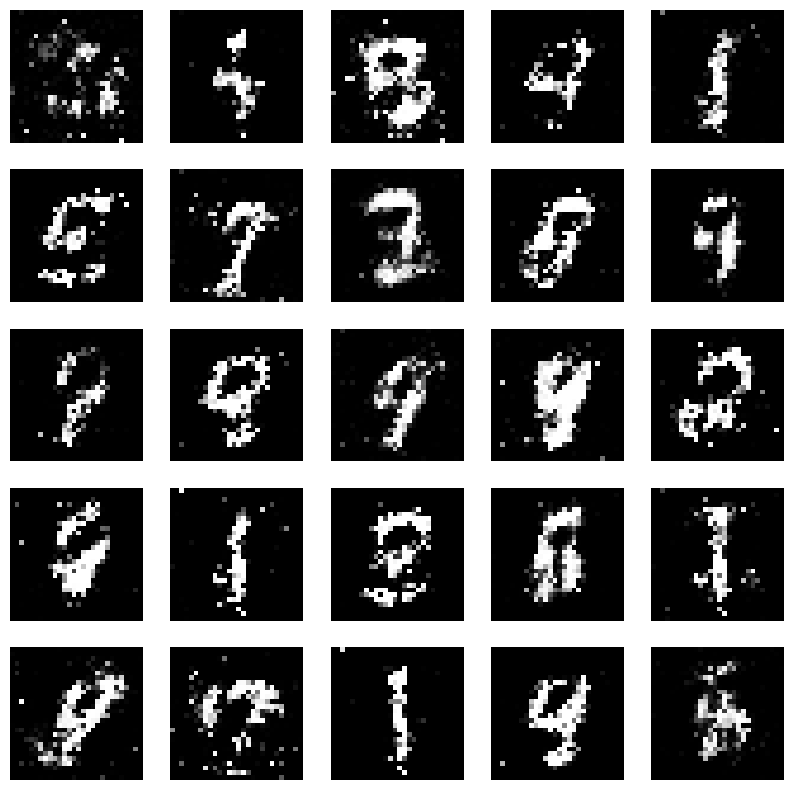

Epochs:  12


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<02:03,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:37,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:30,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:26,  3.10it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 5/273 [00:01<01:23,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:01<01:21,  3.26it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:02<01:25,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:02<01:22,  3.22it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:02<01:19,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:25,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:03<01:21,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:19,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:04<01:18,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:04<01:18,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:04<01:16,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:04<01:15,  3.42it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:05<01:15,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:05<01:13,  3.45it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:06<01:26,  2.92it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:06<01:32,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:06<01:38,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 22/273 [00:07<01:45,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:07<01:43,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:08<01:43,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:08<01:43,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:09<01:43,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:09<01:33,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:09<01:27,  2.79it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:09<01:21,  2.99it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:10<01:17,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:10<01:15,  3.19it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:10<01:13,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:11<01:12,  3.30it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:11<01:12,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:11<01:12,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:11<01:09,  3.40it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 37/273 [00:12<01:10,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:12<01:11,  3.31it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:12<01:09,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:13<01:08,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:13<01:08,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:13<01:07,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:14<01:07,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:14<01:07,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:14<01:07,  3.38it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:14<01:06,  3.42it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:15<01:06,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:15<01:11,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:15<01:09,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:16<01:07,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:16<01:06,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:16<01:06,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:17<01:04,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:17<01:05,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:17<01:08,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:17<01:05,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:18<01:04,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:18<01:08,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:18<01:06,  3.19it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 60/273 [00:19<01:12,  2.94it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 61/273 [00:19<01:21,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:20<01:25,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:20<01:28,  2.37it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 64/273 [00:21<01:31,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:21<01:31,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:22<01:29,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:22<01:27,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:22<01:19,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:23<01:13,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:23<01:08,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:23<01:05,  3.07it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:23<01:04,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:24<01:02,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:24<01:03,  3.11it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:24<01:05,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:25<01:03,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:25<01:01,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:25<00:59,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:26<00:58,  3.30it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:26<00:57,  3.34it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:26<00:57,  3.35it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:27<00:57,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:27<00:56,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:27<00:56,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:27<00:55,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:28<00:54,  3.41it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:28<00:54,  3.39it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:28<00:54,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:29<00:54,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:29<00:53,  3.40it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:29<00:53,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:29<00:52,  3.42it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:30<00:52,  3.41it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:30<00:51,  3.46it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:30<00:51,  3.46it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:31<00:51,  3.43it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:31<00:51,  3.39it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:31<00:51,  3.40it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:32<00:50,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:32<00:51,  3.36it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:32<00:58,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:33<01:04,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:33<01:10,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:34<01:10,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:34<01:09,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:35<01:10,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 107/273 [00:35<01:11,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:35<01:09,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:36<01:06,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:36<01:03,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:36<00:58,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:37<00:54,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:37<00:52,  3.05it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:37<00:50,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:38<00:49,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:38<00:48,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:38<00:47,  3.29it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:38<00:47,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:39<00:46,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:39<00:46,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:39<00:47,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:40<00:49,  3.06it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:40<00:47,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:40<00:46,  3.23it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:41<00:44,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:41<00:44,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:41<00:43,  3.36it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 128/273 [00:42<00:43,  3.33it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:42<00:42,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:42<00:43,  3.32it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:42<00:42,  3.31it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:43<00:42,  3.32it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:43<00:42,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:43<00:41,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:44<00:40,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:44<00:40,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:44<00:40,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:44<00:40,  3.36it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:45<00:39,  3.40it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:45<00:39,  3.36it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:45<00:40,  3.28it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 142/273 [00:46<00:46,  2.84it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:46<00:49,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [00:47<00:58,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [00:47<00:57,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:48<00:56,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [00:48<00:55,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:49<00:54,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [00:49<00:48,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [00:49<00:47,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:50<00:45,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:50<00:42,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:50<00:40,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:51<00:38,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:51<00:37,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:51<00:36,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:51<00:35,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [00:52<00:35,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:52<00:33,  3.36it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:52<00:34,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [00:53<00:34,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:53<00:33,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:53<00:32,  3.36it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [00:54<00:34,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [00:54<00:33,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [00:54<00:32,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [00:55<00:32,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [00:55<00:31,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [00:55<00:30,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [00:55<00:30,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [00:56<00:30,  3.35it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [00:56<00:30,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [00:56<00:29,  3.37it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [00:57<00:29,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:57<00:28,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [00:57<00:28,  3.41it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [00:57<00:28,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [00:58<00:29,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [00:58<00:28,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [00:58<00:28,  3.31it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [00:59<00:29,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [00:59<00:32,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:00<00:34,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:00<00:35,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:01<00:36,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:01<00:36,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:01<00:37,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:02<00:36,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:02<00:34,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:03<00:31,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:03<00:29,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:03<00:27,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:03<00:25,  3.10it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:04<00:25,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:04<00:23,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:04<00:23,  3.33it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:05<00:22,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:05<00:22,  3.33it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:05<00:23,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:06<00:24,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:06<00:23,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:06<00:22,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:07<00:21,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:07<00:21,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:07<00:20,  3.29it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:07<00:20,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:08<00:20,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:08<00:20,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:08<00:20,  3.18it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:09<00:19,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:09<00:19,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:09<00:19,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:10<00:18,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:10<00:18,  3.26it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:10<00:17,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:11<00:17,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:11<00:16,  3.34it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:11<00:16,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:11<00:16,  3.36it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:12<00:15,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:12<00:16,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:12<00:17,  2.88it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 223/273 [01:13<00:19,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:13<00:19,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:14<00:20,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:14<00:20,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:15<00:21,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:15<00:20,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:16<00:17,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:16<00:15,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:16<00:14,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:16<00:13,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:17<00:13,  3.07it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:17<00:12,  3.16it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:17<00:11,  3.21it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:18<00:11,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:18<00:11,  3.25it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:18<00:10,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:19<00:10,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:19<00:09,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:19<00:09,  3.34it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:19<00:09,  3.30it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:20<00:09,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:20<00:08,  3.35it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:20<00:08,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:21<00:08,  3.33it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:21<00:07,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:21<00:07,  3.34it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:22<00:07,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:22<00:06,  3.38it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:22<00:06,  3.43it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:22<00:06,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:23<00:06,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:23<00:05,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:23<00:05,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:24<00:05,  3.16it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:24<00:04,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:24<00:04,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:25<00:04,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:25<00:04,  3.13it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:25<00:03,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:26<00:03,  2.90it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:26<00:03,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:27<00:03,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:27<00:03,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:27<00:02,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:28<00:02,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:28<00:02,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:29<00:01,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:29<00:01,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:29<00:00,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:30<00:00,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:30<00:00,  3.01it/s]


Perdidas:  0.5469858646392822 , 1.0614211559295654
1/1 [==============================] - 0s 37ms/step


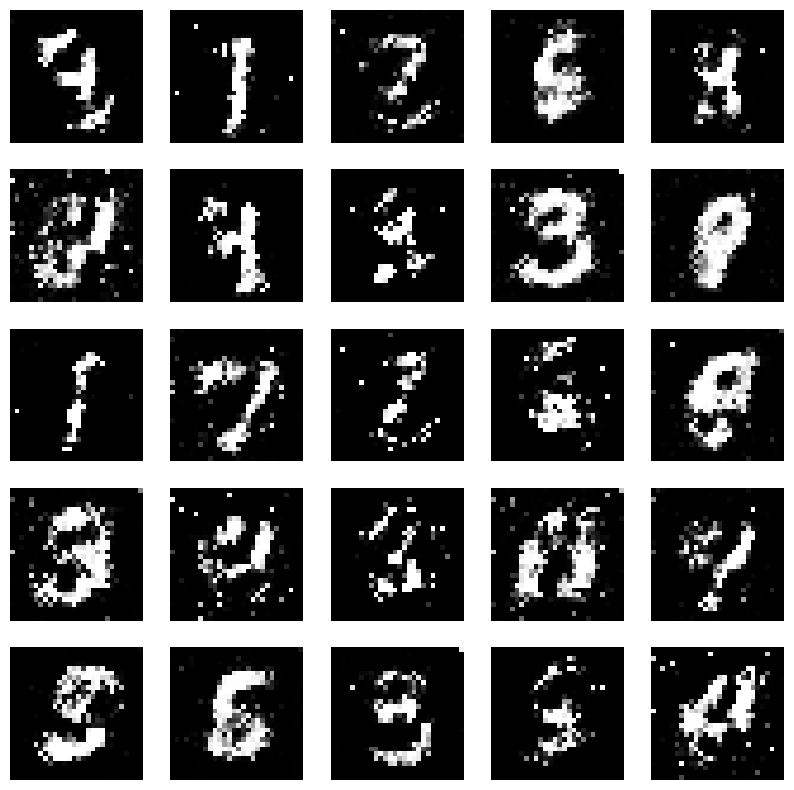

Epochs:  13


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:40,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:40,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:40,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:36,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:30,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:26,  3.09it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 8/273 [00:02<01:24,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:22,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:20,  3.26it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:03<01:21,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:03<01:20,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:19,  3.28it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:04<01:19,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:04<01:19,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:05<01:17,  3.31it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:05<01:17,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:05<01:20,  3.16it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:06<01:29,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:06<01:36,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:07<01:42,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:07<01:51,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:08<01:48,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:08<01:53,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:53,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 26/273 [00:09<01:42,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:09<01:33,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:10<01:31,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:10<01:28,  2.75it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:10<01:24,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:10<01:21,  2.96it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:11<01:19,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:11<01:17,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:11<01:14,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:12<01:14,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:12<01:13,  3.23it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:12<01:12,  3.26it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 38/273 [00:13<01:12,  3.23it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:13<01:12,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:13<01:11,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:14<01:10,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:14<01:09,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:14<01:09,  3.32it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:14<01:08,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:15<01:09,  3.29it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:15<01:08,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:15<01:07,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:16<01:07,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:16<01:07,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:16<01:07,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:17<01:07,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:17<01:07,  3.29it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:17<01:05,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:17<01:04,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:18<01:05,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:18<01:04,  3.37it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:18<01:04,  3.37it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:19<01:08,  3.13it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:19<01:17,  2.76it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:20<01:23,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:20<01:26,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 62/273 [00:21<01:28,  2.39it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 63/273 [00:21<01:30,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:21<01:30,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:22<01:30,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:22<01:29,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:23<01:20,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:23<01:14,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:23<01:09,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:23<01:06,  3.04it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:24<01:04,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:24<01:03,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:24<01:01,  3.25it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:25<01:00,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:25<01:00,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:25<01:00,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:26<00:59,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:26<00:58,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:26<00:58,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:26<00:57,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:27<00:57,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:27<00:58,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:27<00:57,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:28<00:56,  3.35it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:28<00:55,  3.38it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:28<00:56,  3.33it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:29<00:55,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:29<00:55,  3.33it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:29<00:55,  3.31it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:29<00:55,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:30<00:55,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:30<00:54,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:30<00:54,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:31<00:54,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:31<00:54,  3.29it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 96/273 [00:31<00:53,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:32<00:56,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:32<00:54,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:32<00:59,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:33<01:02,  2.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 101/273 [00:33<01:06,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:34<01:08,  2.49it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 103/273 [00:34<01:11,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:35<01:11,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:35<01:10,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:35<01:11,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:36<01:10,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:36<01:05,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:36<01:00,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:37<00:56,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:37<00:53,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:37<00:54,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:38<00:51,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:38<00:50,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:38<00:49,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:39<00:50,  3.10it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:39<00:50,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:39<00:48,  3.19it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:40<00:47,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:40<00:47,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:40<00:45,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:40<00:45,  3.32it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:41<00:45,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:41<00:45,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:41<00:44,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:42<00:46,  3.19it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:42<00:45,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:42<00:44,  3.27it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 129/273 [00:43<00:43,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:43<00:43,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:43<00:42,  3.32it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:44<00:42,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:44<00:42,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:44<00:41,  3.35it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:44<00:40,  3.39it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:45<00:41,  3.34it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:45<00:41,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:45<00:40,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:46<00:40,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:46<00:45,  2.93it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:46<00:47,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:47<00:49,  2.67it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 143/273 [00:47<00:50,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:48<00:51,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [00:48<00:54,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [00:49<00:54,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 147/273 [00:49<00:54,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:49<00:53,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [00:50<00:48,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:50<00:45,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:50<00:42,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:51<00:40,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:51<00:39,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:51<00:38,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:52<00:37,  3.13it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [00:52<00:37,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 157/273 [00:52<00:35,  3.26it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [00:53<00:34,  3.34it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:53<00:34,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:53<00:34,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:53<00:34,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:54<00:33,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:54<00:33,  3.33it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [00:54<00:32,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:55<00:32,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [00:55<00:32,  3.26it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [00:55<00:32,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [00:56<00:31,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [00:56<00:31,  3.32it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [00:56<00:33,  3.11it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [00:57<00:32,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [00:57<00:32,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:57<00:32,  3.12it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [00:57<00:31,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [00:58<00:30,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [00:58<00:29,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [00:58<00:29,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [00:59<00:28,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [00:59<00:28,  3.33it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [00:59<00:28,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:00<00:29,  3.17it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 182/273 [01:00<00:33,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:01<00:36,  2.49it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 184/273 [01:01<00:38,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 185/273 [01:02<00:38,  2.27it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 186/273 [01:02<00:40,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [01:03<00:40,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:03<00:36,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 189/273 [01:03<00:32,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:03<00:30,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:04<00:28,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:04<00:26,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:04<00:25,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:05<00:24,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:05<00:24,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:06<00:33,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [01:06<00:29,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:06<00:27,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:07<00:25,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:07<00:24,  2.97it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:07<00:23,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:08<00:23,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:08<00:22,  3.08it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:08<00:22,  3.13it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 205/273 [01:09<00:21,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:09<00:21,  3.15it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:09<00:21,  3.13it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 208/273 [01:09<00:20,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:10<00:21,  3.01it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:10<00:20,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:10<00:19,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:11<00:19,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:11<00:18,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:11<00:18,  3.22it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:12<00:18,  3.17it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:12<00:18,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:12<00:17,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:13<00:17,  3.17it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:13<00:18,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:13<00:19,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:14<00:21,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:14<00:21,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:15<00:21,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 224/273 [01:15<00:21,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:16<00:21,  2.24it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 226/273 [01:16<00:21,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:17<00:19,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:17<00:17,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:17<00:15,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:18<00:14,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:18<00:13,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:18<00:13,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:18<00:12,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:19<00:12,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:19<00:11,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:19<00:11,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:20<00:11,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:20<00:10,  3.21it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:20<00:10,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:21<00:10,  3.26it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:21<00:09,  3.27it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:21<00:09,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 243/273 [01:22<00:09,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:22<00:09,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:22<00:09,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:23<00:08,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:23<00:08,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:23<00:07,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:23<00:07,  3.26it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:24<00:07,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:24<00:06,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:24<00:06,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:25<00:06,  3.05it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:25<00:06,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:25<00:05,  3.14it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:26<00:05,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:26<00:04,  3.24it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:26<00:04,  3.13it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 259/273 [01:27<00:04,  2.89it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 260/273 [01:27<00:04,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 261/273 [01:28<00:04,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 262/273 [01:28<00:04,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:29<00:04,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:29<00:03,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:29<00:03,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:30<00:03,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:30<00:02,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:31<00:01,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:31<00:01,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:31<00:01,  2.96it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 271/273 [01:31<00:00,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [01:32<00:00,  3.18it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:32<00:00,  2.95it/s]


Perdidas:  0.5961805582046509 , 1.0417540073394775
1/1 [==============================] - 0s 30ms/step


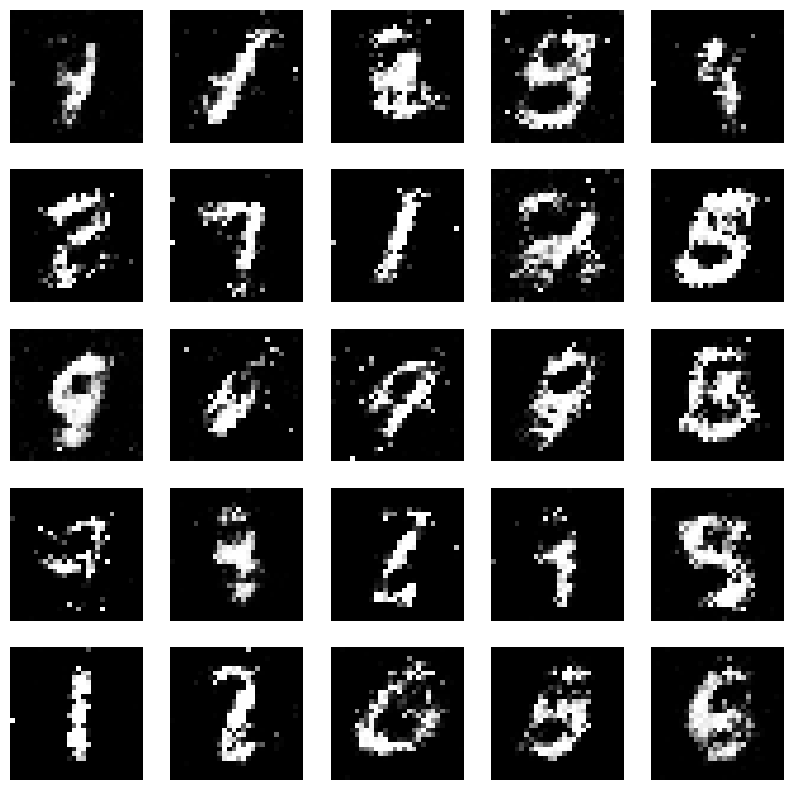

Epochs:  14


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:31,  2.96it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:40,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:35,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:30,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:27,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:24,  3.13it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:03<01:22,  3.20it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:25,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:03<01:31,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:26,  3.01it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:04<01:23,  3.10it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:04<01:22,  3.14it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:32,  2.78it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 16/273 [00:05<01:40,  2.57it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 17/273 [00:06<01:43,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:44,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:06<01:46,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:07<01:50,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:07<01:49,  2.30it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 22/273 [00:08<01:51,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:40,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:08<01:35,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:28,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:09<01:23,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:09<01:21,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:10<01:18,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:10<01:15,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:10<01:16,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:11<01:15,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:11<01:13,  3.27it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:11<01:12,  3.32it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:11<01:11,  3.34it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:12<01:10,  3.36it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:12<01:11,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:12<01:11,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:13<01:10,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:13<01:10,  3.33it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:13<01:09,  3.34it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 41/273 [00:14<01:10,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:14<01:10,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:14<01:10,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:14<01:10,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:15<01:09,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:15<01:08,  3.31it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 47/273 [00:15<01:08,  3.30it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:16<01:09,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:16<01:09,  3.21it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 50/273 [00:16<01:09,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:17<01:09,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:17<01:08,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:17<01:12,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:18<01:11,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:18<01:17,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 56/273 [00:18<01:19,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 57/273 [00:19<01:22,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:19<01:26,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 59/273 [00:20<01:30,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:20<01:31,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:21<01:32,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 62/273 [00:21<01:33,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:22<01:30,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:22<01:23,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:22<01:17,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:22<01:12,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:23<01:09,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:23<01:07,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:23<01:04,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:24<01:03,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:24<01:07,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:24<01:04,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:25<01:04,  3.12it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:25<01:03,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:25<01:04,  3.08it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:26<01:02,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:26<01:01,  3.18it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:26<01:00,  3.23it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 79/273 [00:27<00:59,  3.28it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:27<00:59,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:27<00:58,  3.29it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:27<00:58,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:28<00:58,  3.27it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:28<01:01,  3.09it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:28<01:00,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:29<00:58,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:29<01:00,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:29<00:58,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:30<00:57,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:30<00:57,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:30<00:56,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:31<00:55,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:31<00:54,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:31<00:54,  3.30it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:32<00:58,  3.06it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 96/273 [00:32<01:06,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:32<01:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:33<01:10,  2.48it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 99/273 [00:33<01:15,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:34<01:19,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:34<01:19,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 102/273 [00:35<01:17,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:35<01:10,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:35<01:03,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:36<00:59,  2.81it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:36<00:56,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:36<00:57,  2.90it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:37<00:53,  3.06it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:37<00:53,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:37<00:52,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:38<00:50,  3.18it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:38<00:50,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:38<00:52,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:39<00:50,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:39<00:49,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:39<00:48,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:40<00:47,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:40<00:46,  3.33it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:40<00:46,  3.33it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:40<00:46,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:41<00:45,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:41<00:45,  3.35it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:41<00:45,  3.29it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:42<00:45,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:42<00:44,  3.33it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:42<00:44,  3.32it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:43<00:44,  3.29it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:43<00:43,  3.31it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:43<00:43,  3.28it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:43<00:43,  3.28it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:44<00:43,  3.29it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:44<00:42,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:44<00:42,  3.32it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:45<00:41,  3.32it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:45<00:43,  3.14it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:45<00:49,  2.78it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:46<00:52,  2.58it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 138/273 [00:46<00:54,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:47<00:57,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:47<00:56,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:48<00:54,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [00:48<00:54,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 143/273 [00:49<01:01,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:49<00:54,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:49<00:49,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:50<00:45,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:50<00:43,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:50<00:41,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:50<00:40,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:51<00:39,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:51<00:40,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:51<00:39,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [00:52<00:38,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:52<00:37,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [00:52<00:38,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [00:53<00:37,  3.12it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [00:53<00:36,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [00:53<00:35,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [00:54<00:35,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:54<00:35,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:54<00:35,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [00:55<00:34,  3.26it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:55<00:33,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:55<00:33,  3.25it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:55<00:32,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:56<00:32,  3.28it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [00:56<00:33,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [00:56<00:32,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [00:57<00:33,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [00:57<00:35,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [00:57<00:33,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [00:58<00:32,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [00:58<00:31,  3.17it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [00:58<00:31,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [00:59<00:31,  3.08it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 176/273 [00:59<00:35,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:00<00:37,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 178/273 [01:00<00:40,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 179/273 [01:01<00:39,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:01<00:40,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:01<00:40,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:02<00:40,  2.23it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 183/273 [01:02<00:38,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:03<00:34,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:03<00:32,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:03<00:31,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:04<00:30,  2.83it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:04<00:28,  2.95it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:04<00:27,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:05<00:26,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:05<00:26,  3.14it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:05<00:25,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:05<00:24,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:06<00:24,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:06<00:23,  3.27it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:06<00:23,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:07<00:23,  3.30it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:07<00:22,  3.32it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:07<00:22,  3.26it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:08<00:22,  3.31it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:08<00:22,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:08<00:22,  3.19it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:09<00:21,  3.21it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:09<00:21,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:09<00:21,  3.22it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:09<00:20,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:10<00:21,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:10<00:21,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 209/273 [01:10<00:20,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:11<00:20,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:11<00:19,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:11<00:19,  3.14it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:12<00:18,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:12<00:18,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:12<00:20,  2.83it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 216/273 [01:13<00:21,  2.68it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 217/273 [01:13<00:22,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:14<00:22,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:14<00:23,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:15<00:23,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 221/273 [01:15<00:23,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:16<00:22,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:16<00:21,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 224/273 [01:16<00:19,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:17<00:17,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:17<00:16,  2.87it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:17<00:15,  2.97it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:18<00:14,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:18<00:14,  2.95it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 230/273 [01:18<00:14,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:19<00:13,  3.07it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:19<00:13,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:19<00:12,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:19<00:12,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:20<00:12,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:20<00:11,  3.14it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:20<00:11,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:21<00:10,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:21<00:10,  3.22it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:21<00:10,  3.24it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:22<00:09,  3.25it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:22<00:09,  3.22it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 243/273 [01:22<00:09,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:23<00:08,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:23<00:08,  3.24it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:23<00:08,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:24<00:08,  3.24it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:24<00:07,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:24<00:07,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:24<00:07,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:25<00:06,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:25<00:06,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:25<00:06,  3.10it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:26<00:06,  3.14it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 255/273 [01:26<00:06,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:27<00:06,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:27<00:06,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 258/273 [01:28<00:06,  2.30it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▍| 259/273 [01:28<00:06,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:29<00:05,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:29<00:05,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 262/273 [01:29<00:04,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:30<00:04,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:30<00:03,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:30<00:02,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:31<00:02,  2.88it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:31<00:02,  2.98it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:31<00:01,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:32<00:01,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:32<00:00,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:32<00:00,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:33<00:00,  3.21it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 273/273 [01:33<00:00,  2.92it/s]


Perdidas:  0.6136126518249512 , 1.0192203521728516
1/1 [==============================] - 0s 31ms/step


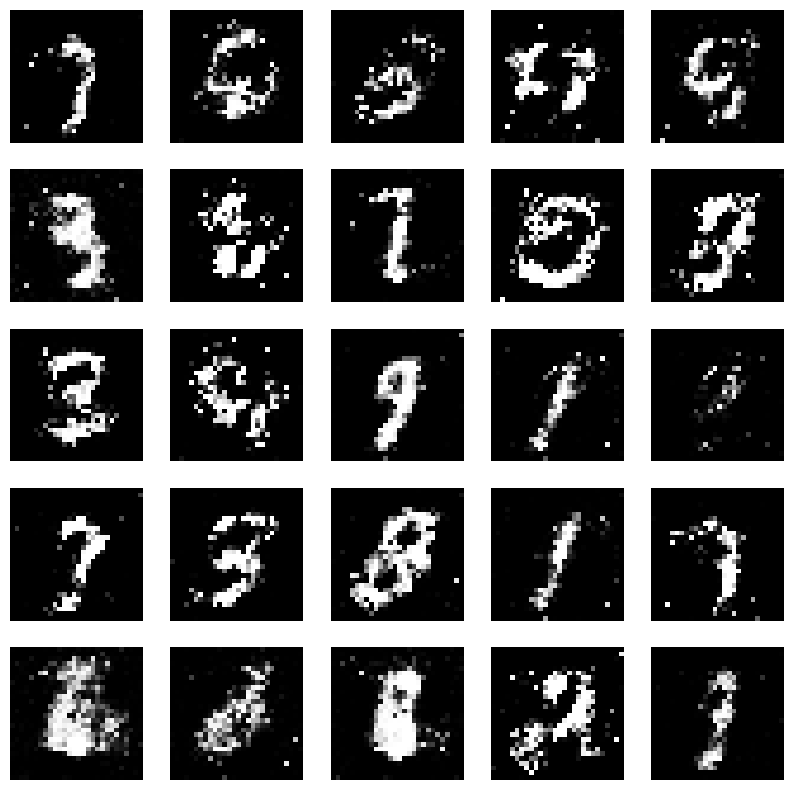

Epochs:  15


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:37,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:37,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:47,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:49,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:34,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:29,  2.97it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:02<01:28,  3.01it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:03<01:49,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:03<01:52,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 11/273 [00:04<01:53,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 12/273 [00:04<01:57,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<02:01,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 14/273 [00:05<02:05,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<02:02,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:49,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:40,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:34,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:07<01:30,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:27,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:26,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:23,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:25,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<01:23,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:21,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:09<01:19,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:10<01:19,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:10<01:21,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:10<01:18,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:11<01:18,  3.10it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:11<01:21,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:11<01:18,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:12<01:18,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:12<01:17,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:12<01:16,  3.13it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 36/273 [00:13<01:15,  3.14it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 37/273 [00:13<01:16,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:13<01:15,  3.11it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:14<01:13,  3.18it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:14<01:15,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:14<01:13,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:15<01:12,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:15<01:12,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:15<01:11,  3.21it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 45/273 [00:15<01:11,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:16<01:10,  3.21it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:16<01:19,  2.85it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 48/273 [00:17<01:25,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 49/273 [00:17<01:29,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:17<01:29,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 51/273 [00:18<01:34,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:18<01:39,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 53/273 [00:19<01:40,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:19<01:39,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:20<01:31,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:20<01:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:20<01:18,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:21<01:13,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:21<01:10,  3.02it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:21<01:09,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:22<01:08,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:22<01:07,  3.14it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:22<01:07,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:23<01:05,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:23<01:04,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:23<01:05,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:23<01:04,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:24<01:04,  3.18it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:24<01:03,  3.21it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:24<01:03,  3.22it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:25<01:02,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:25<01:01,  3.27it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:25<01:01,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:26<01:01,  3.26it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 75/273 [00:26<01:01,  3.24it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:26<01:01,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:27<01:00,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:27<01:00,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:27<00:59,  3.24it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:28<01:02,  3.09it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:28<01:00,  3.18it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:28<00:59,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:28<01:01,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:29<00:59,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:29<00:59,  3.17it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:29<00:59,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:30<01:04,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:30<01:11,  2.58it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 89/273 [00:31<01:17,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:31<01:19,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:32<01:19,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 92/273 [00:32<01:19,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 93/273 [00:33<01:19,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:33<01:18,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:33<01:12,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:34<01:07,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:34<01:03,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:34<01:00,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:35<00:58,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:35<00:56,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:35<00:54,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:36<00:53,  3.18it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:36<00:54,  3.12it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:36<00:53,  3.16it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:36<00:52,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:37<00:52,  3.18it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:37<00:52,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:37<00:51,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:38<00:52,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:38<00:51,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:38<00:50,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:39<00:50,  3.20it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:39<00:50,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:39<00:49,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:40<00:49,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:40<00:49,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:40<00:49,  3.18it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:41<00:48,  3.21it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:41<00:47,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:41<00:47,  3.21it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:41<00:47,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:42<00:47,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:42<00:49,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:42<00:48,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:43<00:46,  3.17it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:43<00:46,  3.19it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:43<00:48,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:44<00:55,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:44<01:00,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:45<01:03,  2.25it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 131/273 [00:45<01:04,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 132/273 [00:46<01:07,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 133/273 [00:47<01:07,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 134/273 [00:47<01:00,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:47<00:59,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:48<00:53,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:48<00:50,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:48<00:49,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:49<00:47,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:49<00:47,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:49<00:45,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:50<00:43,  3.02it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:50<00:42,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:50<00:43,  2.98it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:51<00:41,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:51<00:40,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:51<00:40,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:51<00:39,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:52<00:39,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [00:52<00:38,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:52<00:38,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:53<00:37,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:53<00:37,  3.24it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:53<00:37,  3.21it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 155/273 [00:54<00:37,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [00:54<00:36,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [00:54<00:38,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:55<00:37,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:55<00:38,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:55<00:38,  2.94it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [00:56<00:37,  3.02it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [00:56<00:35,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:56<00:35,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:57<00:34,  3.13it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [00:57<00:37,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:57<00:39,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [00:58<00:41,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [00:58<00:42,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 169/273 [00:59<00:45,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 170/273 [00:59<00:44,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:00<00:45,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:00<00:45,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 173/273 [01:01<00:43,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:01<00:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:01<00:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:02<00:35,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:02<00:33,  2.88it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:02<00:32,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:02<00:31,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:03<00:30,  3.05it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:03<00:29,  3.12it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:03<00:28,  3.16it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:04<00:28,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:04<00:27,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:04<00:29,  2.98it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:05<00:28,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:05<00:27,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:05<00:26,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:06<00:26,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:06<00:26,  3.18it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:06<00:26,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:07<00:26,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:07<00:25,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:07<00:26,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:08<00:24,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:08<00:24,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:08<00:24,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:09<00:23,  3.15it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:09<00:23,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:09<00:22,  3.21it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:09<00:22,  3.22it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:10<00:22,  3.19it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 203/273 [01:10<00:21,  3.23it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:10<00:22,  3.07it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:11<00:24,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:12<00:30,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 207/273 [01:12<00:30,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 208/273 [01:13<00:29,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 209/273 [01:13<00:30,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:13<00:29,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:14<00:28,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:14<00:26,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:15<00:24,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:15<00:22,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:15<00:21,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:16<00:20,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:16<00:19,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:16<00:19,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:17<00:18,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 220/273 [01:17<00:18,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:17<00:17,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:18<00:16,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:18<00:16,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:18<00:15,  3.09it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:19<00:15,  3.13it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:19<00:14,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:19<00:14,  3.15it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:19<00:14,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:20<00:13,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:20<00:13,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:20<00:13,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:21<00:13,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:21<00:12,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:21<00:12,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:22<00:11,  3.20it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:22<00:11,  3.18it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:22<00:11,  3.15it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:23<00:10,  3.19it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 239/273 [01:23<00:11,  3.06it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:23<00:10,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:24<00:10,  3.17it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▊ | 242/273 [01:24<00:10,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:24<00:10,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:25<00:11,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:25<00:11,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:26<00:11,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:26<00:11,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 248/273 [01:27<00:11,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:27<00:10,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:28<00:10,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:28<00:09,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:28<00:08,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:29<00:07,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:29<00:06,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:29<00:06,  2.89it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:30<00:05,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:30<00:05,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:30<00:04,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:31<00:04,  3.02it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:31<00:04,  3.09it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:31<00:03,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:31<00:03,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:32<00:03,  3.21it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:32<00:03,  3.00it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:33<00:02,  3.03it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:33<00:02,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:33<00:02,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:34<00:01,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:34<00:01,  3.07it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:34<00:00,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:34<00:00,  3.15it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:35<00:00,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:35<00:00,  2.85it/s]


Perdidas:  0.5669875144958496 , 0.936556875705719
1/1 [==============================] - 0s 38ms/step


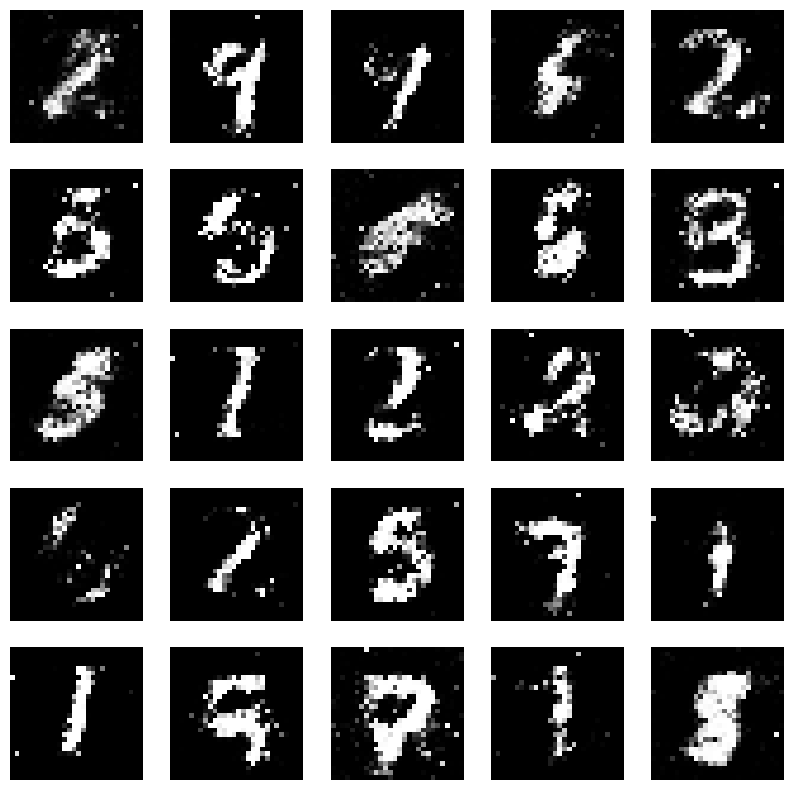

Epochs:  16


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<02:07,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:00<02:15,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:12,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<02:12,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 5/273 [00:02<02:17,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:03<02:15,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 7/273 [00:03<02:08,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<02:07,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:04<01:57,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:51,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:05<01:44,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:40,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:41,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:34,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:28,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:28,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:25,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:23,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:21,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:19,  3.13it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:09<01:20,  3.10it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:09<01:19,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:18,  3.16it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:10<01:17,  3.19it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:10<01:15,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:16,  3.20it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 30/273 [00:11<01:15,  3.22it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:11<01:14,  3.23it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:11<01:14,  3.22it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:12<01:14,  3.21it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:12<01:14,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:12<01:15,  3.16it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:13<01:14,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:13<01:15,  3.13it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 38/273 [00:14<01:26,  2.73it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 39/273 [00:14<01:31,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:14<01:35,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:15<01:41,  2.28it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 42/273 [00:15<01:44,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:16<01:41,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:16<01:41,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:17<01:42,  2.22it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:17<01:33,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:17<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:18<01:20,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:18<01:16,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:18<01:14,  2.97it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:19<01:15,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:19<01:12,  3.05it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:19<01:11,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:20<01:09,  3.17it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 55/273 [00:20<01:12,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:20<01:10,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:21<01:08,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:21<01:09,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:21<01:10,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:22<01:09,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:22<01:08,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:22<01:07,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:22<01:07,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:23<01:06,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:23<01:06,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:23<01:06,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:24<01:04,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:24<01:04,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:24<01:07,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:25<01:05,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 71/273 [00:25<01:04,  3.12it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:25<01:03,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:26<01:03,  3.17it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:26<01:02,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:26<01:02,  3.19it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:27<01:01,  3.22it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:27<01:05,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:27<01:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:28<01:16,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:29<01:29,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:29<01:28,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 82/273 [00:29<01:26,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 83/273 [00:30<01:24,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:30<01:27,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:31<01:18,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:31<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:31<01:08,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:32<01:04,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:32<01:02,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:32<01:01,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:33<00:59,  3.04it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:33<00:59,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:33<00:58,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:34<00:57,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:34<00:56,  3.16it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:34<00:55,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:34<00:56,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:35<00:55,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:35<00:54,  3.20it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:35<00:54,  3.16it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:36<00:56,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:36<00:55,  3.09it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:36<00:57,  2.94it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:37<00:56,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:37<00:54,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:37<00:54,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:38<00:53,  3.11it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:38<00:52,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:38<00:52,  3.15it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:39<00:51,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:39<00:51,  3.15it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:39<00:50,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:40<00:50,  3.15it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:40<00:49,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:40<00:49,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:41<00:55,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:41<00:58,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 118/273 [00:42<01:00,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:42<01:04,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:42<01:05,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:43<01:05,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:43<01:08,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:44<01:09,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:44<01:05,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:45<00:59,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:45<00:55,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:45<00:52,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:46<00:50,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:46<00:49,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:46<00:47,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:46<00:46,  3.03it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:47<00:46,  3.04it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:47<00:45,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:47<00:45,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:48<00:46,  2.99it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:48<00:45,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:48<00:44,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:49<00:45,  3.00it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:49<00:43,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:49<00:42,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:50<00:41,  3.17it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:50<00:41,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:50<00:40,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:51<00:40,  3.18it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:51<00:40,  3.14it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [00:51<00:40,  3.15it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [00:52<00:39,  3.16it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:52<00:42,  2.97it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [00:52<00:40,  3.03it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [00:53<00:40,  3.04it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [00:53<00:42,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:53<00:40,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:54<00:39,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:54<00:41,  2.86it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [00:55<00:46,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 156/273 [00:55<00:46,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 157/273 [00:55<00:49,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 158/273 [00:56<00:52,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:56<00:53,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [00:57<00:54,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [00:57<00:54,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 162/273 [00:58<00:50,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [00:58<00:45,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [00:59<00:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [00:59<00:40,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [00:59<00:38,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:00<00:37,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:00<00:37,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:00<00:36,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:01<00:35,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:01<00:34,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:01<00:33,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:02<00:32,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:02<00:32,  3.07it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:02<00:33,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:03<00:32,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:03<00:31,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:03<00:30,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:04<00:30,  3.05it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:04<00:30,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:04<00:30,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:04<00:29,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:05<00:28,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:05<00:28,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:05<00:28,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:06<00:28,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:06<00:28,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:06<00:28,  3.03it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:07<00:27,  3.06it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:07<00:27,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:07<00:26,  3.05it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:08<00:26,  3.06it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 193/273 [01:08<00:29,  2.74it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:09<00:32,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:09<00:32,  2.41it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 196/273 [01:10<00:33,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:10<00:34,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:11<00:34,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 199/273 [01:11<00:34,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 200/273 [01:12<00:34,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:12<00:30,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:12<00:27,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:13<00:25,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:13<00:24,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:13<00:23,  2.85it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:14<00:23,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:14<00:24,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:14<00:22,  2.85it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:15<00:21,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:15<00:21,  2.94it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:15<00:20,  2.99it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:16<00:19,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:16<00:19,  3.04it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:16<00:19,  3.07it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:17<00:18,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:17<00:18,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:17<00:17,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:17<00:17,  3.18it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:18<00:17,  3.17it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:18<00:16,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:18<00:17,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:19<00:16,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:19<00:16,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:19<00:16,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:20<00:16,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:20<00:15,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:21<00:16,  2.85it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:21<00:15,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:21<00:14,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:21<00:14,  3.04it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:22<00:15,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:22<00:15,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:23<00:17,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 234/273 [01:23<00:17,  2.19it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▌ | 235/273 [01:24<00:18,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:24<00:17,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:25<00:16,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 238/273 [01:25<00:16,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:26<00:14,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:26<00:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:26<00:11,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:27<00:11,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:27<00:10,  2.87it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:27<00:10,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:28<00:09,  2.89it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:28<00:09,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:28<00:09,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:29<00:09,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:29<00:08,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:29<00:07,  2.91it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:30<00:07,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:30<00:07,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:30<00:06,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:31<00:06,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:31<00:05,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:31<00:05,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:32<00:05,  3.02it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:32<00:04,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:33<00:06,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:33<00:05,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:33<00:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:34<00:04,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:34<00:03,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:34<00:03,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:35<00:02,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:35<00:02,  2.89it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:36<00:02,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:36<00:02,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:37<00:01,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:37<00:01,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:37<00:00,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:38<00:00,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:38<00:00,  2.76it/s]


Perdidas:  0.5801589488983154 , 1.0517982244491577
1/1 [==============================] - 0s 30ms/step


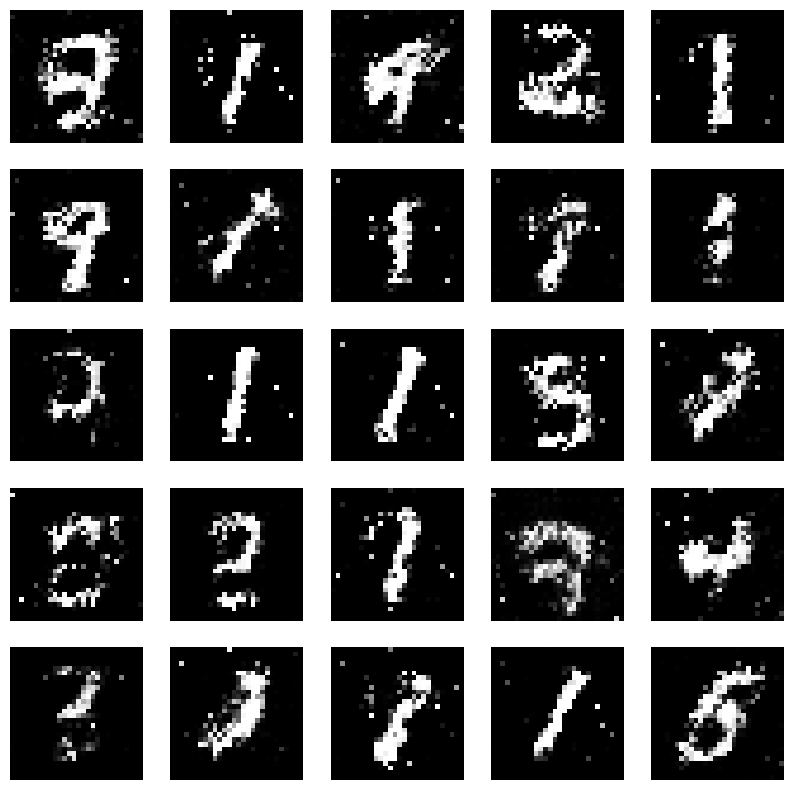

Epochs:  17


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:38,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:39,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:49,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:40,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:39,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:35,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:31,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:28,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:04<01:27,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:27,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:26,  2.98it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 16/273 [00:05<01:23,  3.06it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:06<01:23,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:22,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:06<01:21,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:29,  2.84it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:07<01:41,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:46,  2.36it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 23/273 [00:08<01:50,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:53,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:58,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 26/273 [00:10<01:57,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:55,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:10<01:43,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:35,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:11<01:30,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:11<01:25,  2.84it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:12<01:22,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:12<01:20,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:12<01:19,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:13<01:17,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:13<01:19,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:13<01:18,  3.01it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:14<01:17,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:14<01:16,  3.07it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:14<01:15,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:15<01:14,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:15<01:14,  3.09it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:15<01:17,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:16<01:14,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:16<01:16,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:16<01:15,  3.02it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:17<01:13,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:17<01:13,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:17<01:13,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:18<01:12,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:18<01:14,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:18<01:13,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:19<01:13,  3.01it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:19<01:15,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:19<01:13,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:20<01:12,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:20<01:14,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:20<01:19,  2.72it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 59/273 [00:21<01:24,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:21<01:25,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:22<01:31,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:22<01:42,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 63/273 [00:23<01:40,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:23<01:38,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:24<01:34,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:24<01:29,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:24<01:27,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:25<01:20,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:25<01:15,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:25<01:12,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:26<01:12,  2.80it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:26<01:09,  2.88it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 73/273 [00:26<01:10,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:27<01:08,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:27<01:06,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:27<01:05,  3.02it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:28<01:04,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:28<01:03,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:28<01:07,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:29<01:07,  2.87it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:29<01:05,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:29<01:03,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:30<01:01,  3.08it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:30<01:00,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:30<01:00,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:31<00:59,  3.13it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:31<00:59,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:31<00:59,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:32<01:00,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:32<00:59,  3.08it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:32<00:58,  3.13it/s]

4/4 [==============================] - 0s 5ms/step


 34%|███▎      | 92/273 [00:33<00:58,  3.12it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:33<00:57,  3.12it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:33<00:58,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:34<00:57,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:34<01:00,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:34<01:04,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:35<01:09,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:35<01:14,  2.34it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 100/273 [00:36<01:16,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:36<01:17,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:37<01:21,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:37<01:20,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 104/273 [00:38<01:20,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:38<01:14,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:39<01:08,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:39<01:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:39<01:00,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:39<00:57,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:40<00:56,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:40<00:54,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:40<00:55,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:41<00:54,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:41<00:53,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:41<00:52,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:42<00:52,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:42<00:51,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:43<00:53,  2.90it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:43<00:51,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:43<00:50,  3.04it/s]

4/4 [==============================] - 0s 5ms/step


 44%|████▍     | 121/273 [00:43<00:49,  3.07it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:44<00:49,  3.04it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:44<00:48,  3.08it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:44<00:48,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:45<00:48,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:45<00:47,  3.10it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:45<00:47,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:46<00:46,  3.12it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:46<00:46,  3.07it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:46<00:46,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:47<00:45,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:47<00:45,  3.10it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:47<00:45,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:48<00:45,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:48<00:46,  2.94it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:49<00:53,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:49<00:54,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:49<00:56,  2.38it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 139/273 [00:50<00:57,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:50<01:00,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:51<01:02,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:51<01:01,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:52<00:59,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:52<00:55,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:53<00:52,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:53<00:50,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:53<00:48,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:54<00:46,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:54<00:45,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:54<00:43,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:55<00:43,  2.79it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 152/273 [00:55<00:44,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:55<00:43,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:56<00:43,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [00:56<00:43,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [00:56<00:41,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [00:57<00:40,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:57<00:39,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:57<00:39,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [00:58<00:38,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [00:58<00:37,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [00:58<00:36,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [00:59<00:36,  3.03it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [00:59<00:35,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [00:59<00:35,  3.04it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:00<00:34,  3.08it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:00<00:33,  3.15it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:00<00:35,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:01<00:35,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:01<00:34,  3.02it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:01<00:33,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:02<00:33,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:02<00:35,  2.81it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:03<00:38,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:03<00:40,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:04<00:41,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 177/273 [01:04<00:42,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 178/273 [01:04<00:41,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:05<00:42,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:05<00:42,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 181/273 [01:06<00:42,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:06<00:38,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:07<00:35,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:07<00:34,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:07<00:32,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:08<00:30,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:08<00:29,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:08<00:28,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:09<00:27,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:09<00:28,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:09<00:27,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:10<00:27,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:10<00:26,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:10<00:25,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:11<00:27,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:11<00:26,  2.88it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [01:11<00:27,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:12<00:25,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:12<00:25,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:12<00:24,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:13<00:23,  3.06it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:13<00:23,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:13<00:22,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:14<00:22,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:14<00:22,  3.08it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:14<00:22,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:15<00:22,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:15<00:21,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:15<00:21,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:16<00:20,  3.04it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:16<00:20,  3.05it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 212/273 [01:16<00:21,  2.85it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 213/273 [01:17<00:23,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:17<00:25,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:18<00:26,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:18<00:26,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:19<00:25,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:19<00:25,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:20<00:25,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:20<00:22,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:20<00:20,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:21<00:18,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:21<00:17,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:21<00:17,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:22<00:16,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:22<00:15,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:22<00:15,  3.04it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:23<00:14,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:23<00:15,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:23<00:14,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:24<00:14,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:24<00:13,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:24<00:12,  3.11it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 234/273 [01:25<00:12,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:25<00:12,  3.11it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:25<00:11,  3.13it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:26<00:11,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:26<00:11,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:26<00:11,  3.09it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:27<00:10,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:27<00:10,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:27<00:10,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:28<00:09,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:28<00:09,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:28<00:08,  3.14it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:28<00:08,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:29<00:08,  3.10it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:29<00:08,  3.11it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:29<00:07,  3.10it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 250/273 [01:30<00:07,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:30<00:07,  2.79it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:31<00:08,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:31<00:08,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:32<00:07,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 255/273 [01:32<00:07,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 256/273 [01:33<00:07,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:33<00:07,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:33<00:06,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 259/273 [01:34<00:06,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:34<00:05,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:35<00:04,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:35<00:04,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:35<00:03,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:36<00:03,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:36<00:02,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:36<00:02,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:37<00:02,  2.83it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:37<00:01,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:37<00:01,  2.87it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:38<00:01,  2.94it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:38<00:00,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:38<00:00,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:39<00:00,  2.75it/s]


Perdidas:  0.6427847146987915 , 1.0105624198913574
1/1 [==============================] - 0s 30ms/step


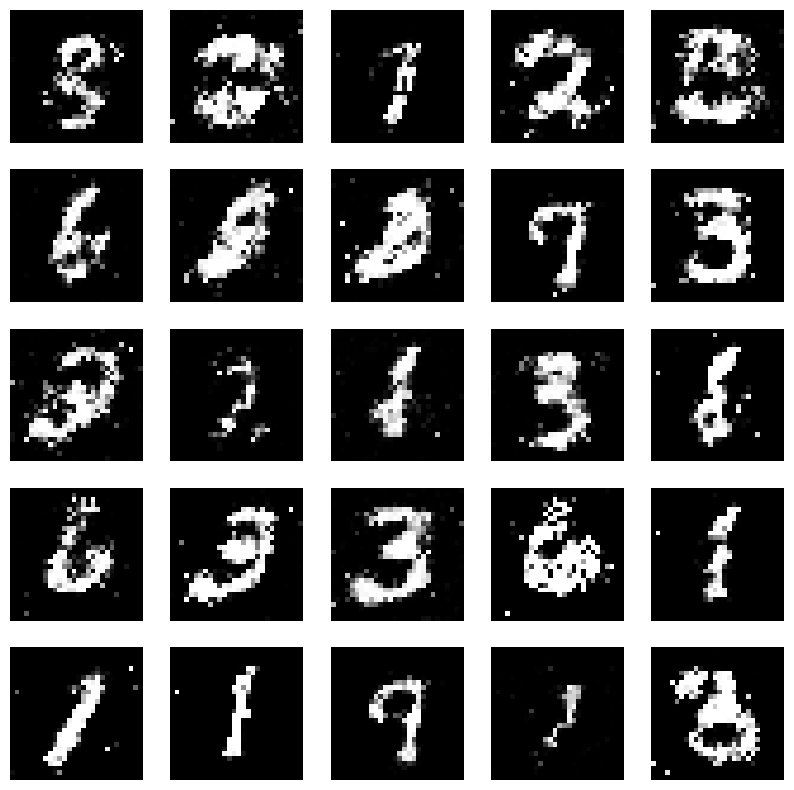

Epochs:  18


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:41,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:37,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<01:37,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:01<01:46,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:58,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 8/273 [00:03<02:01,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/273 [00:03<02:03,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:04<02:00,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 11/273 [00:04<02:02,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 12/273 [00:05<02:06,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 13/273 [00:05<02:06,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<01:58,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:55,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:48,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:07<01:44,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:47,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<01:45,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:43,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:41,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:29,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:27,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:24,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:23,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:27,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:23,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:22,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:19,  3.04it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 32/273 [00:12<01:19,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:12<01:17,  3.08it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:17,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:13<01:17,  3.06it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 36/273 [00:13<01:17,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:14<01:16,  3.09it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:14<01:16,  3.06it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:14<01:19,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:15<01:22,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:15<01:22,  2.80it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:16<01:28,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:16<01:32,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:34,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:17<01:39,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:42,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 47/273 [00:18<01:44,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 48/273 [00:18<01:38,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:19<01:38,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 50/273 [00:19<01:43,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:33,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:20<01:27,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:20<01:22,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:21<01:17,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:14,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:21<01:14,  2.93it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:22<01:14,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:22<01:13,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:22<01:12,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:23<01:11,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:23<01:10,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:23<01:14,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:24<01:14,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:24<01:16,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:24<01:14,  2.80it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:25<01:11,  2.90it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:25<01:08,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:25<01:08,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:26<01:07,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:26<01:09,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:27<01:12,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:27<01:14,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:27<01:10,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:28<01:09,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:28<01:08,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:28<01:06,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:29<01:08,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:29<01:06,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:29<01:10,  2.74it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 80/273 [00:30<01:19,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:30<01:22,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 82/273 [00:31<01:27,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:32<01:40,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 84/273 [00:32<01:36,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 85/273 [00:33<01:35,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:33<01:28,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:33<01:20,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:34<01:13,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:34<01:09,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:34<01:06,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:35<01:03,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:35<01:04,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:35<01:02,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:36<01:02,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:36<01:01,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:36<00:59,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:37<01:01,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:37<01:00,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:37<00:58,  2.98it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:38<00:57,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:38<00:57,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:38<00:57,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:39<00:55,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:39<00:58,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:39<00:56,  3.00it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:40<00:55,  3.02it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:40<00:54,  3.05it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:40<00:54,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:41<00:53,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:41<00:54,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:41<00:54,  2.99it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:42<00:54,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:42<00:53,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:42<00:53,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:43<00:52,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:43<00:55,  2.82it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:44<01:04,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:44<01:07,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:44<01:07,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 120/273 [00:45<01:10,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 121/273 [00:46<01:13,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 122/273 [00:46<01:15,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:46<01:10,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 124/273 [00:47<01:03,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:47<00:58,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:47<00:55,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:48<00:53,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:48<00:53,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 129/273 [00:49<00:52,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:49<00:50,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:49<00:50,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:50<00:49,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:50<00:47,  2.93it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:50<00:46,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:51<00:46,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:51<00:45,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:51<00:44,  3.07it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:51<00:43,  3.07it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:52<00:43,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:52<00:43,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:53<00:45,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:53<00:44,  2.97it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:53<00:43,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:54<00:42,  3.03it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:54<00:42,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:54<00:41,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:54<00:41,  3.03it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [00:55<00:41,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [00:55<00:41,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:56<00:41,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:56<00:40,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [00:56<00:41,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [00:57<00:50,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:57<00:51,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 155/273 [00:58<00:51,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [00:58<00:51,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [00:59<00:51,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 158/273 [00:59<00:53,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:00<00:53,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:00<00:52,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 161/273 [01:00<00:49,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [01:01<00:45,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:01<00:41,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:01<00:39,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:02<00:40,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:02<00:38,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:02<00:37,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:03<00:36,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:03<00:35,  2.95it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:03<00:34,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:04<00:34,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:04<00:33,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:04<00:32,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:05<00:32,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:05<00:32,  3.04it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:05<00:33,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:06<00:32,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:06<00:32,  2.94it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:06<00:31,  3.00it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:07<00:30,  3.03it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:07<00:30,  3.00it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:07<00:29,  3.05it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:08<00:29,  3.08it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:08<00:29,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:08<00:28,  3.09it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:09<00:28,  3.06it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:09<00:29,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:09<00:28,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:10<00:27,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:10<00:27,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:10<00:28,  2.84it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:11<00:31,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:11<00:34,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:12<00:34,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:12<00:36,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:13<00:34,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:13<00:34,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:14<00:35,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:14<00:33,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 200/273 [01:15<00:30,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:15<00:28,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:15<00:27,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:16<00:25,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:16<00:25,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:16<00:25,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:17<00:23,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:17<00:23,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:17<00:22,  2.93it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:18<00:21,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:18<00:21,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:18<00:20,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:19<00:20,  3.05it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:19<00:19,  3.09it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 214/273 [01:19<00:19,  3.07it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:20<00:18,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:20<00:18,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:20<00:18,  3.08it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 218/273 [01:21<00:17,  3.06it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:21<00:18,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:21<00:17,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:22<00:17,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:22<00:17,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:22<00:17,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:23<00:16,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:23<00:16,  2.93it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:23<00:15,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:24<00:15,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:24<00:15,  2.94it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:25<00:16,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:25<00:17,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:25<00:17,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:26<00:17,  2.33it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 233/273 [01:26<00:17,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 234/273 [01:27<00:18,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:27<00:17,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 236/273 [01:28<00:18,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:28<00:16,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:29<00:15,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:29<00:13,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:29<00:12,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:30<00:11,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:30<00:11,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:30<00:11,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:31<00:10,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:31<00:09,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:31<00:09,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:32<00:08,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:32<00:08,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:32<00:07,  3.02it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:33<00:07,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:33<00:07,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:33<00:06,  3.04it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:34<00:06,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:34<00:06,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:34<00:06,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:35<00:05,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:35<00:05,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:35<00:05,  2.98it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:36<00:04,  3.01it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:36<00:04,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:37<00:04,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:37<00:03,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:37<00:03,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:38<00:03,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:38<00:02,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:38<00:02,  2.84it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 267/273 [01:39<00:02,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:39<00:02,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 269/273 [01:40<00:01,  2.35it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 270/273 [01:40<00:01,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:41<00:00,  2.25it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 272/273 [01:41<00:00,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:42<00:00,  2.68it/s]


Perdidas:  0.6133383512496948 , 0.9603357911109924
1/1 [==============================] - 0s 30ms/step


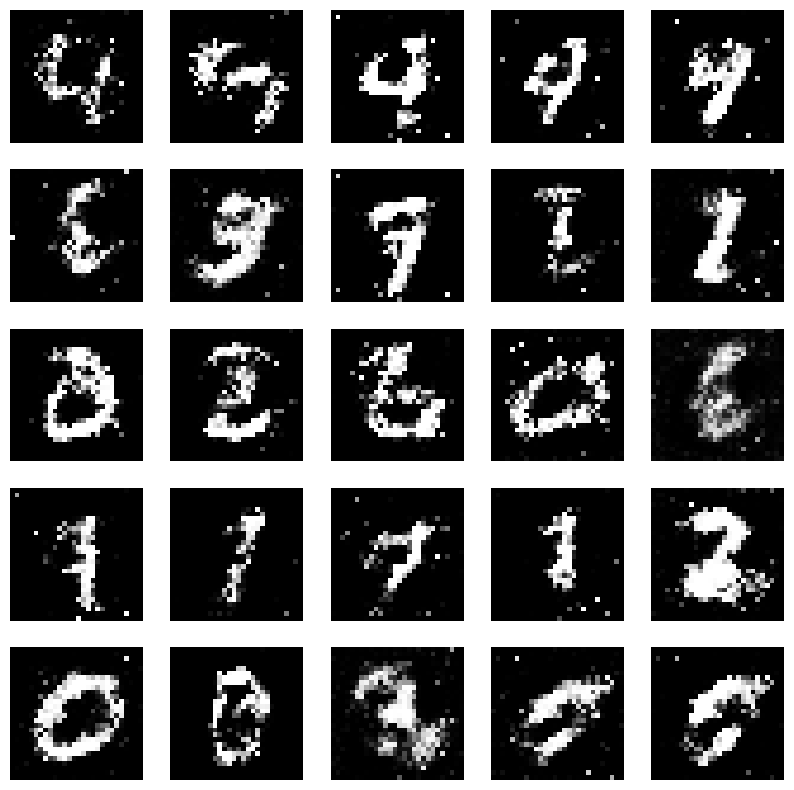

Epochs:  19


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:36,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:37,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:35,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:35,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:36,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:42,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:39,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:39,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:36,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:38,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:36,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:35,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:41,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:46,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:05<01:43,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:39,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:33,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:30,  2.81it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:07<01:38,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 22/273 [00:08<01:47,  2.34it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 23/273 [00:08<01:50,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:09<01:51,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:09<01:53,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:51,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:10<01:59,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 28/273 [00:11<01:57,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:48,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:40,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:12<01:32,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:12<01:28,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:27,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:23,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:13<01:21,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:21,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:14<01:19,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:14<01:18,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:15<01:18,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:15<01:17,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:15<01:17,  3.01it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:16<01:16,  3.02it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:16<01:15,  3.04it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:16<01:14,  3.06it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:17<01:16,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:17<01:15,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:17<01:15,  2.99it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:18<01:14,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:18<01:17,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:18<01:15,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:19<01:14,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:19<01:14,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:19<01:13,  2.99it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:20<01:13,  2.99it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:20<01:16,  2.85it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:20<01:14,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:21<01:12,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:21<01:12,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:21<01:19,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:22<01:24,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:22<01:27,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:23<01:34,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:23<01:35,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:24<01:36,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:24<01:38,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:25<01:37,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:25<01:37,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:26<01:29,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:26<01:24,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:26<01:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:27<01:15,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:27<01:12,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:27<01:10,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:28<01:09,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:28<01:08,  2.89it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:28<01:07,  2.92it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:29<01:09,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:29<01:07,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:29<01:06,  2.90it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:30<01:06,  2.91it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:30<01:05,  2.95it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 82/273 [00:30<01:05,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:31<01:06,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:31<01:05,  2.89it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:31<01:04,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:32<01:07,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:32<01:05,  2.86it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:32<01:04,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:33<01:03,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:33<01:02,  2.93it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:33<01:01,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:34<01:00,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:34<00:59,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:34<00:59,  3.00it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:35<00:58,  3.03it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:35<01:00,  2.95it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:36<01:05,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:36<01:08,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:37<01:14,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:37<01:15,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 101/273 [00:37<01:13,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 102/273 [00:38<01:17,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:38<01:20,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:39<01:22,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:39<01:17,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:40<01:10,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:40<01:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:40<01:04,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:41<01:03,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:41<01:00,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:41<00:58,  2.77it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 112/273 [00:42<00:58,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:42<00:56,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:42<00:55,  2.88it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 115/273 [00:43<00:54,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:43<00:53,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:43<00:53,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:44<00:53,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:44<00:51,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:44<00:51,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:45<00:51,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:45<00:50,  3.00it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 123/273 [00:46<00:50,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:46<00:51,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:46<00:51,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:47<00:50,  2.93it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:47<00:49,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:47<00:48,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:48<00:47,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:48<00:47,  3.02it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:48<00:47,  3.02it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:49<00:47,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:49<00:47,  2.97it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:49<00:47,  2.90it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 135/273 [00:50<00:51,  2.67it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 136/273 [00:50<00:55,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:51<00:58,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:51<00:57,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:52<00:58,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:52<00:59,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:52<00:59,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:53<01:06,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:53<01:00,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:54<00:55,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [00:54<00:51,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:54<00:49,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:55<00:46,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [00:55<00:45,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [00:56<00:44,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [00:56<00:43,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:56<00:43,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [00:57<00:42,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [00:57<00:44,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [00:57<00:44,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [00:58<00:42,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [00:58<00:41,  2.83it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [00:58<00:40,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [00:59<00:39,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [00:59<00:38,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [00:59<00:39,  2.83it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:00<00:38,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:00<00:37,  2.96it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:00<00:38,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:01<00:38,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:01<00:37,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:01<00:36,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:02<00:36,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:02<00:35,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:02<00:35,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:03<00:34,  2.96it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:03<00:34,  2.97it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 172/273 [01:04<00:36,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:04<00:39,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:05<00:42,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:05<00:43,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:06<00:45,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:06<00:44,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:07<00:45,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:07<00:43,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:07<00:40,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:08<00:38,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:08<00:35,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:08<00:33,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:09<00:32,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:09<00:30,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:09<00:29,  2.93it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:10<00:29,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:10<00:29,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:10<00:28,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:11<00:28,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:11<00:27,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:11<00:27,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:12<00:27,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:12<00:27,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:12<00:27,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:13<00:26,  2.94it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:13<00:25,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:13<00:25,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:14<00:25,  2.95it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:14<00:24,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:14<00:24,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:15<00:23,  2.97it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:15<00:23,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:15<00:22,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:16<00:22,  3.02it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:16<00:22,  2.96it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:16<00:22,  2.91it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:17<00:22,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:17<00:22,  2.86it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 210/273 [01:18<00:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:18<00:25,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 212/273 [01:19<00:27,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:19<00:28,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 214/273 [01:20<00:27,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 215/273 [01:20<00:28,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:21<00:28,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:21<00:26,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:21<00:24,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:22<00:21,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:22<00:20,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:22<00:19,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:23<00:18,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:23<00:17,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:24<00:17,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:24<00:16,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:24<00:16,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:25<00:16,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:25<00:16,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:25<00:15,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:26<00:15,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:26<00:15,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:26<00:14,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:27<00:14,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:27<00:13,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:27<00:13,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:28<00:13,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:28<00:12,  2.84it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:29<00:12,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:29<00:12,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:29<00:11,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:30<00:11,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:30<00:10,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:30<00:10,  2.83it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 244/273 [01:31<00:10,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:31<00:09,  2.90it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 246/273 [01:31<00:10,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:32<00:10,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 248/273 [01:32<00:10,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 249/273 [01:33<00:10,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:33<00:10,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:34<00:10,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:34<00:09,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 253/273 [01:35<00:09,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:35<00:08,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:36<00:07,  2.37it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 256/273 [01:36<00:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:36<00:06,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:37<00:05,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:37<00:04,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:37<00:04,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:38<00:04,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:38<00:03,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:38<00:03,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:39<00:03,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:39<00:02,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:39<00:02,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:40<00:02,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:40<00:01,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:40<00:01,  2.99it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:41<00:01,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:41<00:00,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:41<00:00,  2.91it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:42<00:00,  2.67it/s]


Perdidas:  0.660962700843811 , 0.9104357957839966
1/1 [==============================] - 0s 33ms/step


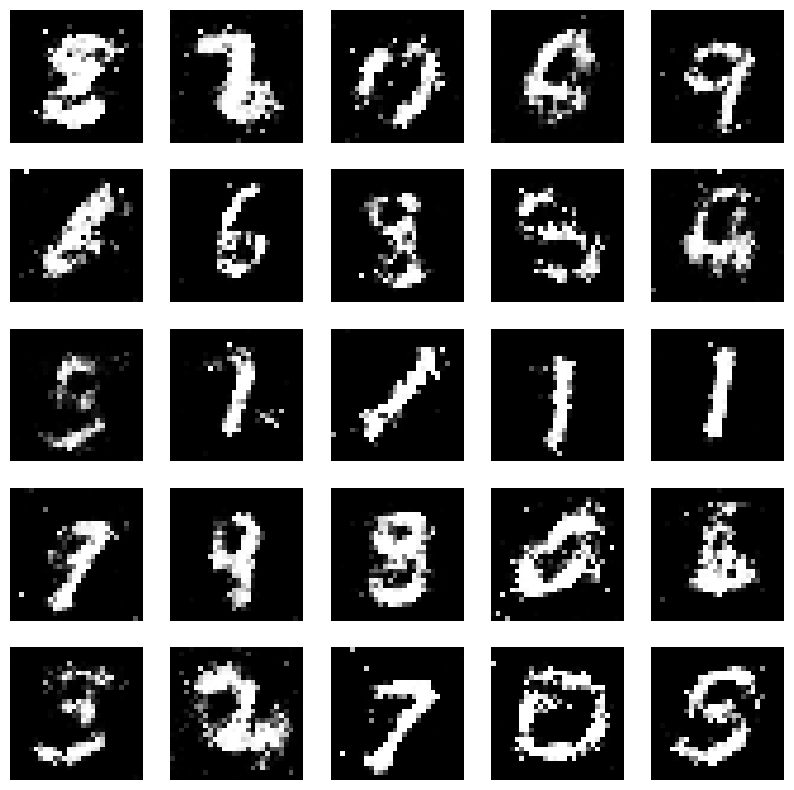

Epochs:  20


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/273 [00:00<02:13,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:01<02:18,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:23,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 4/273 [00:02<02:14,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 5/273 [00:02<02:14,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/273 [00:03<02:18,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:16,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:04<02:13,  1.99it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:04<02:09,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:59,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:05<01:55,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:49,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:06<01:51,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:06<01:44,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:06<01:49,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:07<01:42,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:39,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:08<01:36,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:08<01:37,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:36,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:36,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<01:39,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:34,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:10<01:30,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:29,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:27,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:26,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:25,  2.85it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:12<01:23,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:22,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:22,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:21,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:23,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:22,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:25,  2.78it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 37/273 [00:14<01:33,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:42,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:42,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:43,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 41/273 [00:16<01:46,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:46,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:17<01:44,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:43,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:38,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:36,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:36,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:24,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:21,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:20<01:19,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:19,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:17,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:16,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:14,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:22<01:15,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:22<01:14,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:12,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:11,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:23<01:11,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:11,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:24<01:11,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:24<01:10,  3.00it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:25<01:09,  3.00it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:25<01:10,  2.93it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:25<01:10,  2.95it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:26<01:09,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:26<01:10,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▌       | 69/273 [00:26<01:09,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:27<01:08,  2.97it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:27<01:07,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:27<01:09,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:28<01:09,  2.86it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:28<01:14,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:29<01:19,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 76/273 [00:29<01:25,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:30<01:28,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:30<01:31,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:31<01:29,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:31<01:28,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:32<01:28,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 82/273 [00:32<01:29,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:32<01:25,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:18,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:33<01:14,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:34<01:11,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:34<01:09,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:34<01:07,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:35<01:05,  2.80it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:35<01:03,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:35<01:02,  2.90it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:36<01:01,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:36<01:00,  2.99it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:36<01:00,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:37<01:00,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:37<01:02,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:37<01:01,  2.88it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:38<01:00,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:38<00:59,  2.91it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:38<00:59,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:39<00:59,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:39<00:57,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:39<00:57,  2.98it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:40<00:56,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:40<00:56,  2.99it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:40<00:56,  2.98it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:41<00:56,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:41<00:56,  2.94it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:41<00:56,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:42<00:55,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:42<00:55,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:42<00:59,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:43<01:01,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:43<01:05,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:44<01:08,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:44<01:12,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:45<01:11,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:45<01:11,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:46<01:12,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 120/273 [00:46<01:12,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:47<01:07,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:47<01:02,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:47<00:58,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:48<00:56,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:48<00:55,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:48<00:54,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:49<00:52,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:49<00:51,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:49<00:52,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:50<00:50,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:50<00:50,  2.83it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:50<00:49,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:51<00:47,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:51<00:47,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:51<00:47,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:52<00:46,  2.92it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:52<00:47,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:53<00:46,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:53<00:46,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:53<00:47,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:54<00:46,  2.85it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [00:54<00:45,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:54<00:45,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:55<00:45,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:55<00:45,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:55<00:44,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:56<00:44,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:56<00:42,  2.92it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [00:56<00:45,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [00:57<00:48,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [00:57<00:51,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [00:58<00:53,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 153/273 [00:58<00:54,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [00:59<00:53,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 155/273 [00:59<00:54,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:00<00:55,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [01:00<00:55,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 158/273 [01:01<00:54,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:01<00:50,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:01<00:48,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:02<00:44,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [01:02<00:43,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:03<00:42,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:03<00:40,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:03<00:38,  2.77it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 166/273 [01:04<00:38,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:04<00:37,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:04<00:36,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:05<00:35,  2.93it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:05<00:35,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:05<00:34,  2.95it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:06<00:34,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:06<00:34,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:06<00:34,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:07<00:34,  2.80it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:07<00:34,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:07<00:33,  2.85it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:08<00:33,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:08<00:33,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:09<00:34,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:09<00:34,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:09<00:32,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:10<00:32,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:10<00:31,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:10<00:30,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:11<00:30,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:11<00:32,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 188/273 [01:12<00:33,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:12<00:35,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 190/273 [01:13<00:37,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 191/273 [01:13<00:37,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:13<00:38,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:14<00:37,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:14<00:37,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████▏  | 195/273 [01:15<00:38,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:15<00:35,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:16<00:32,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:16<00:30,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 199/273 [01:16<00:28,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 200/273 [01:17<00:26,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:17<00:25,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:17<00:25,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:18<00:25,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:18<00:24,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:19<00:24,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:19<00:23,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:19<00:22,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:20<00:22,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:20<00:21,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:20<00:21,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:21<00:21,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:21<00:20,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:21<00:20,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:22<00:20,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:22<00:19,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:22<00:19,  2.94it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:23<00:19,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:23<00:18,  2.95it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:23<00:18,  2.91it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 220/273 [01:24<00:18,  2.91it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:24<00:17,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:24<00:17,  2.94it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:25<00:16,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:25<00:17,  2.78it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 225/273 [01:26<00:19,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:26<00:19,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:26<00:20,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:27<00:20,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 229/273 [01:27<00:20,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 230/273 [01:28<00:20,  2.11it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 231/273 [01:28<00:19,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:29<00:19,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:29<00:18,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:30<00:16,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:30<00:15,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:30<00:14,  2.63it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 237/273 [01:31<00:13,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:31<00:12,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:31<00:12,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:32<00:11,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:32<00:11,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:32<00:10,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:33<00:10,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:33<00:10,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:34<00:09,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:34<00:09,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:34<00:09,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:35<00:08,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:35<00:08,  2.94it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:35<00:07,  2.96it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:36<00:07,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:36<00:07,  2.98it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:36<00:06,  2.87it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:37<00:06,  2.89it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:37<00:06,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:37<00:05,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:38<00:05,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:38<00:05,  2.93it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:38<00:05,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:39<00:04,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:39<00:04,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:40<00:04,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:40<00:04,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:40<00:03,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:41<00:03,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:41<00:03,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:42<00:02,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:42<00:02,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:43<00:01,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:43<00:01,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:44<00:00,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:44<00:00,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:44<00:00,  2.60it/s]


Perdidas:  0.6706527471542358 , 0.8893698453903198
1/1 [==============================] - 0s 30ms/step


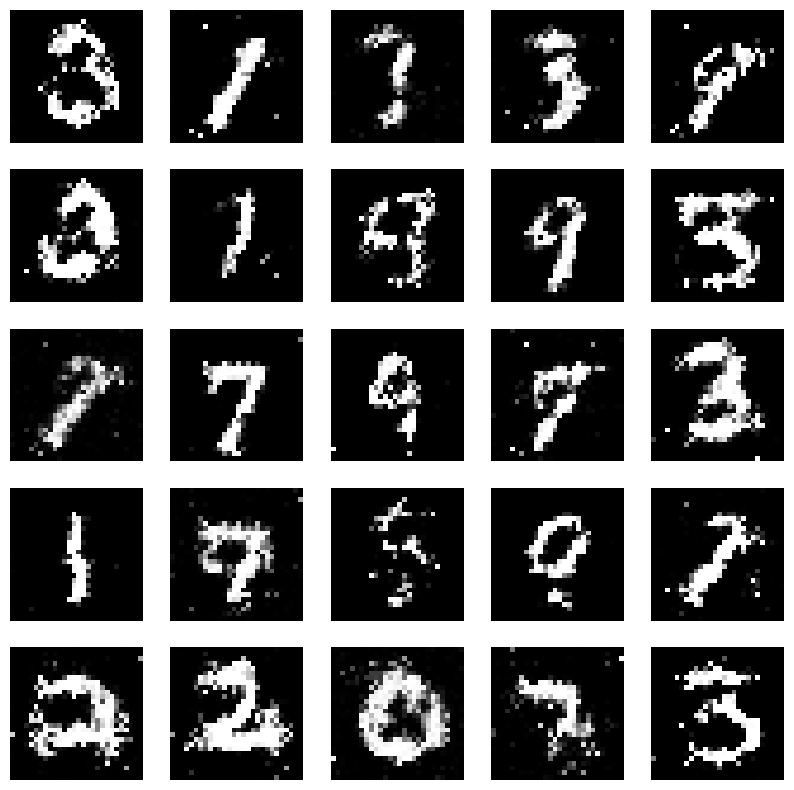

Epochs:  21


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:40,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<01:39,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:39,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:37,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:02<01:38,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:02<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:40,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:04<01:38,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:38,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:37,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:51,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:57,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 19/273 [00:07<01:59,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:58,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 21/273 [00:08<02:02,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:09<02:01,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:09<02:00,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:52,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:46,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:44,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:39,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:39,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:11<01:42,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:12<01:38,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:37,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:34,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:33,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:37,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:38,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:32,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:25,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:22,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:21,  2.84it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:16<01:23,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:22,  2.79it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:17<01:21,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:17<01:19,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:18,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:17,  2.90it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:18<01:18,  2.87it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:17,  2.89it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:19<01:17,  2.87it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 52/273 [00:20<01:35,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 53/273 [00:21<01:41,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:21<01:40,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 55/273 [00:22<01:38,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 56/273 [00:22<01:41,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 57/273 [00:23<01:42,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:23<01:39,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:23<01:39,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:31,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:25,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:19,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:42,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:32,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 66/273 [00:26<01:26,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:22,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:27<01:18,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:18,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:28<01:18,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:17,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:14,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:29<01:15,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:14,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:30<01:11,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:30<01:11,  2.76it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 78/273 [00:31<01:10,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:31<01:08,  2.81it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:31<01:08,  2.83it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:32<01:08,  2.82it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:32<01:07,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:32<01:06,  2.84it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:33<01:06,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:33<01:08,  2.75it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:34<01:10,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:34<01:14,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:35<01:20,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:35<01:20,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:36<01:23,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 91/273 [00:36<01:24,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 92/273 [00:37<01:24,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:34,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 94/273 [00:38<01:30,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:38<01:23,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:38<01:16,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:11,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:39<01:08,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:39<01:06,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:40<01:03,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:40<01:03,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:03,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:41<01:02,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:41<01:01,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:42<00:59,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:42<00:58,  2.88it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 107/273 [00:42<00:57,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:43<00:57,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:43<00:58,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:43<00:58,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:44<00:57,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:44<00:56,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:44<00:57,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:45<00:56,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:45<00:54,  2.88it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 116/273 [00:45<00:55,  2.81it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:46<00:56,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:46<00:55,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:47<00:55,  2.78it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 120/273 [00:47<00:55,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:47<00:53,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:48<00:53,  2.84it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 123/273 [00:48<01:01,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 124/273 [00:49<01:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:49<01:04,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 126/273 [00:50<01:07,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:50<01:07,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:51<01:09,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 129/273 [00:51<01:10,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:52<01:09,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:52<01:04,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:52<01:00,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:53<00:57,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:53<00:54,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:53<00:51,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:54<00:50,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:54<00:48,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:54<00:48,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:55<00:47,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:55<00:46,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:55<00:45,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:56<00:45,  2.87it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:56<00:45,  2.84it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:56<00:45,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:57<00:46,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [00:57<00:45,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:58<00:44,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:58<00:44,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [00:58<00:45,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [00:59<00:43,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [00:59<00:43,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [00:59<00:42,  2.87it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:00<00:42,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:00<00:41,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:00<00:40,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:01<00:39,  2.93it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:01<00:39,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:01<00:39,  2.92it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:02<00:38,  2.95it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:02<00:42,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:03<00:45,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 162/273 [01:03<00:47,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:04<00:47,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:04<00:48,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:05<00:49,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [01:05<00:50,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:06<00:50,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:06<00:49,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:06<00:46,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [01:07<00:44,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:07<00:41,  2.46it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 172/273 [01:07<00:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:08<00:37,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:08<00:37,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:09<00:36,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:09<00:35,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:09<00:35,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:10<00:35,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:10<00:33,  2.78it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:10<00:34,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:11<00:33,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:11<00:32,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:11<00:32,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:12<00:32,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:12<00:32,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:13<00:31,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:13<00:30,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:13<00:29,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:14<00:30,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:14<00:29,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:14<00:29,  2.80it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:15<00:28,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:15<00:27,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:15<00:27,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:16<00:27,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:16<00:27,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:16<00:28,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 198/273 [01:17<00:32,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:17<00:32,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:18<00:32,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 201/273 [01:19<00:36,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 202/273 [01:19<00:35,  2.00it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 203/273 [01:20<00:34,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:20<00:33,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 205/273 [01:20<00:32,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:21<00:29,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:21<00:27,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:22<00:25,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:22<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:22<00:24,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:23<00:23,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:23<00:22,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:23<00:21,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:24<00:20,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:24<00:20,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:24<00:20,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:25<00:19,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:25<00:18,  2.90it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:25<00:18,  2.91it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:26<00:18,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:26<00:17,  2.90it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:26<00:17,  2.91it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:27<00:17,  2.90it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:27<00:17,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:28<00:17,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:28<00:16,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:28<00:16,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:29<00:15,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:29<00:15,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:29<00:14,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:30<00:14,  2.89it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:30<00:14,  2.92it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:30<00:14,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:31<00:14,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:31<00:15,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:32<00:15,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:32<00:15,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:33<00:15,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:33<00:15,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:34<00:14,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:34<00:14,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 242/273 [01:34<00:14,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:35<00:13,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:35<00:11,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:36<00:11,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:36<00:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:36<00:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:37<00:09,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:37<00:09,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:37<00:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:38<00:08,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:38<00:07,  2.71it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 253/273 [01:39<00:07,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:39<00:06,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:39<00:06,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:40<00:06,  2.80it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:40<00:05,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:40<00:05,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:41<00:04,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:41<00:04,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:41<00:04,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:42<00:03,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:42<00:03,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:42<00:03,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:43<00:02,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:43<00:02,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:44<00:02,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:44<00:01,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:44<00:01,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:45<00:01,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:45<00:00,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 272/273 [01:46<00:00,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:46<00:00,  2.56it/s]


Perdidas:  0.6228283643722534 , 0.8662257194519043
1/1 [==============================] - 0s 29ms/step


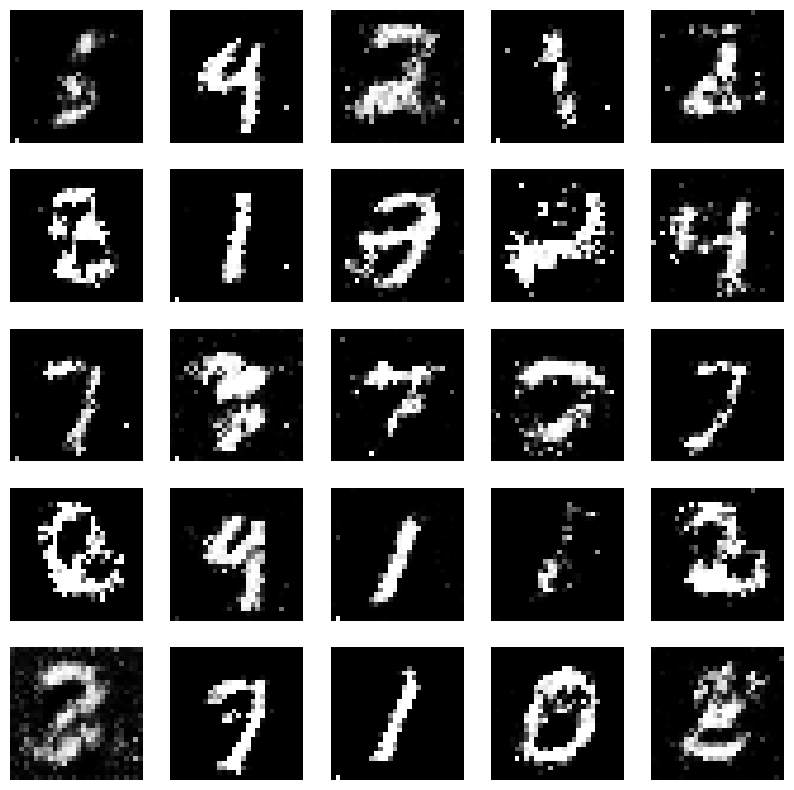

Epochs:  22


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:37,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:41,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:39,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:41,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:46,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:43,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:42,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:40,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:44,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:35,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:32,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:33,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:39,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:37,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:08<01:38,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:43,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:46,  2.35it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 25/273 [00:09<01:51,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:56,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:59,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<02:00,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<01:58,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<01:59,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:51,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 32/273 [00:13<01:43,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:40,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:42,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:34,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:34,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:30,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:27,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:27,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 44/273 [00:17<01:25,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:18<01:25,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:18<01:25,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:21,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:21,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:19<01:20,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:18,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:20<01:17,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:20<01:17,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:16,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:16,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:18,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:16,  2.83it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 58/273 [00:22<01:21,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:23<01:25,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:23<01:30,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:24<01:32,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:24<01:36,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 63/273 [00:25<01:39,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 64/273 [00:25<01:41,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 65/273 [00:26<01:44,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:26<01:41,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:34,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:27<01:26,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:27<01:23,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:21,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:28<01:17,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:28<01:15,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:13,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:29<01:12,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:11,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:30<01:13,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:30<01:12,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:11,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:31<01:10,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:31<01:08,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:32<01:08,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:32<01:08,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:32<01:07,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:33<01:07,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:33<01:06,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:33<01:05,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:34<01:07,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:34<01:05,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:35<01:04,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:35<01:04,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:35<01:03,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:36<01:02,  2.90it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:36<01:01,  2.91it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:36<01:04,  2.79it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:37<01:09,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:37<01:17,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 97/273 [00:38<01:22,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:38<01:24,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:39<01:23,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:39<01:24,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:40<01:27,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:40<01:22,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:13,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:41<01:09,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:41<01:09,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:42<01:05,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:42<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:42<01:00,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:43<00:59,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:43<00:57,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:43<00:57,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:44<00:57,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:44<01:04,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:45<01:03,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:45<01:00,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:45<00:58,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:46<00:58,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:46<00:56,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:47<00:56,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:47<00:54,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:47<00:53,  2.83it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:48<00:54,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:48<00:54,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:48<00:55,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:49<00:55,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:49<00:55,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:49<00:54,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:50<00:53,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:50<00:53,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:51<00:55,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:51<00:59,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:52<01:01,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:52<01:03,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 134/273 [00:53<01:06,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:53<01:06,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:54<01:05,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:54<01:03,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:55<01:06,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:55<01:03,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:55<00:57,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:56<00:54,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:56<00:53,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:56<00:50,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:57<00:49,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:57<00:49,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [00:58<00:49,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [00:58<00:48,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:58<00:48,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [00:59<00:46,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [00:59<00:45,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [00:59<00:45,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:00<00:44,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:00<00:43,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:01<00:43,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:01<00:42,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:01<00:41,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:02<00:42,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:02<00:41,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:02<00:40,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:03<00:40,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:03<00:40,  2.77it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:03<00:39,  2.79it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:04<00:39,  2.80it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:04<00:38,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:04<00:38,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:05<00:38,  2.79it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:05<00:42,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:06<00:45,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:06<00:48,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 170/273 [01:07<00:48,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:07<00:48,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:08<00:49,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 173/273 [01:08<00:47,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:09<00:46,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:09<00:48,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:10<00:43,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:10<00:40,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:10<00:37,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:11<00:36,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 180/273 [01:11<00:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:11<00:34,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:12<00:33,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:12<00:33,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:13<00:33,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 185/273 [01:13<00:32,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:13<00:32,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:14<00:32,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:14<00:31,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:14<00:30,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:15<00:30,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:15<00:29,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:15<00:29,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:16<00:28,  2.79it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 194/273 [01:16<00:28,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:17<00:28,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:17<00:27,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:17<00:26,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:18<00:26,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:18<00:25,  2.86it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 200/273 [01:18<00:25,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:19<00:25,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:19<00:25,  2.83it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:20<00:28,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:20<00:29,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:21<00:31,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 206/273 [01:21<00:31,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:22<00:31,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:22<00:30,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 209/273 [01:22<00:29,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:23<00:30,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:23<00:28,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:24<00:27,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:24<00:26,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:25<00:23,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:25<00:22,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:25<00:21,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:26<00:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:26<00:20,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:26<00:19,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:27<00:18,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:27<00:18,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:27<00:18,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:28<00:17,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:28<00:17,  2.82it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:28<00:16,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:29<00:16,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:29<00:16,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:29<00:15,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:30<00:15,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:30<00:15,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:31<00:15,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:31<00:14,  2.82it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:31<00:14,  2.81it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 234/273 [01:32<00:13,  2.82it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:32<00:13,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:32<00:13,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:33<00:12,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:33<00:12,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:34<00:13,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:34<00:13,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:34<00:14,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:35<00:15,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:36<00:14,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:36<00:14,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:37<00:13,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 246/273 [01:37<00:13,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 247/273 [01:37<00:12,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:38<00:11,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:38<00:09,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:39<00:09,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:39<00:08,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:39<00:07,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:40<00:07,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:40<00:06,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:40<00:06,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:41<00:06,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:41<00:05,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:41<00:05,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:42<00:05,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:42<00:04,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:42<00:04,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:43<00:03,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:43<00:03,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:43<00:03,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:44<00:02,  2.83it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:44<00:02,  2.88it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:45<00:02,  2.86it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:45<00:01,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:45<00:01,  2.87it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:46<00:01,  2.86it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:46<00:00,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:46<00:00,  2.76it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:47<00:00,  2.55it/s]


Perdidas:  0.651795506477356 , 0.9327718019485474
1/1 [==============================] - 0s 50ms/step


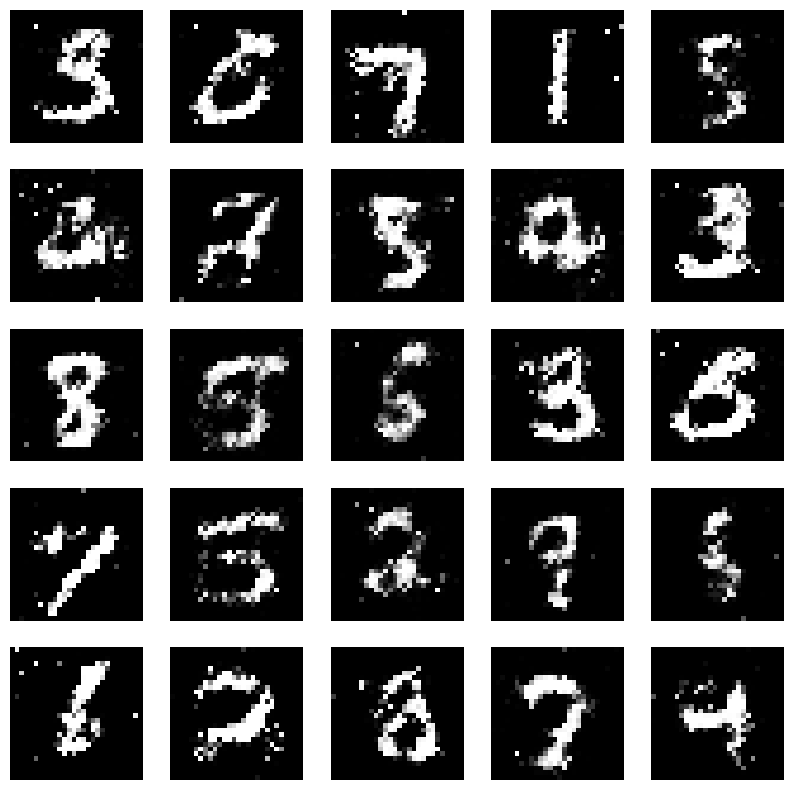

Epochs:  23


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:40,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:39,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:38,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:35,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:04<01:37,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:37,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:38,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:35,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:05<01:33,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:36,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:35,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:07<01:33,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:40,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:42,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:43,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:44,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:49,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 27/273 [00:10<01:55,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 28/273 [00:11<01:57,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<01:58,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:12<02:01,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:59,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:13<02:00,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 33/273 [00:13<01:57,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:49,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:14<01:43,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:39,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:41,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:37,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:33,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:16<01:31,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:28,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:25,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:20<01:27,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:26,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:23,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:21,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:21,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:19,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:22,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:30,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:38,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 61/273 [00:24<01:40,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 62/273 [00:25<01:37,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:25<01:43,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:26<01:45,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:26<01:40,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:36,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:27<01:40,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:34,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:32,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:28,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:24,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:20,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:30<01:18,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:14,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:31<01:12,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:10,  2.76it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:31<01:11,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:10,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:11,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:09,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:33<01:10,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:10,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:34<01:09,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:08,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:07,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:07,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:06,  2.78it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:35<01:05,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:05,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:36<01:05,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:03,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:04,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:37<01:05,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:38<01:10,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:38<01:14,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 97/273 [00:39<01:21,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:39<01:22,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 99/273 [00:40<01:22,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:40<01:21,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:41<01:21,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:41<01:22,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 103/273 [00:42<01:22,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 104/273 [00:42<01:19,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:16,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:43<01:11,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 107/273 [00:43<01:07,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:04,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:44<01:01,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<00:59,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:45<00:58,  2.77it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:45<00:57,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<00:56,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:46<00:55,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:46<00:57,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:47<00:56,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:47<00:56,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:48<00:55,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:48<00:54,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:48<00:53,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:49<00:53,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:49<00:52,  2.86it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:49<00:51,  2.87it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:50<00:52,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:50<00:52,  2.81it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:50<00:52,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:51<00:51,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:51<00:52,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:52<00:52,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:52<00:52,  2.73it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 132/273 [00:52<00:56,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:53<01:01,  2.28it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 134/273 [00:53<01:01,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:54<01:01,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 136/273 [00:54<01:02,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:55<01:02,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:55<01:00,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:56<01:02,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:56<01:04,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<01:02,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:57<00:58,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:57<00:54,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:58<00:52,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:58<00:51,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:49,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:59<00:48,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [00:59<00:46,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [01:00<00:48,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:00<00:47,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:00<00:47,  2.55it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 152/273 [01:01<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:01<00:44,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:02<00:43,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:02<00:43,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:02<00:43,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:03<00:42,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:03<00:41,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:03<00:40,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:04<00:39,  2.85it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:04<00:39,  2.84it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:04<00:39,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:05<00:38,  2.83it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:05<00:39,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:05<00:38,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:06<00:37,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:06<00:38,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:07<00:42,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:07<00:43,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:08<00:44,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 171/273 [01:08<00:48,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 172/273 [01:09<00:46,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 173/273 [01:09<00:45,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:09<00:46,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:10<00:47,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:11<00:50,  1.93it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:11<00:46,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:11<00:42,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:12<00:39,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:12<00:37,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:12<00:35,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:13<00:34,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:13<00:33,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:14<00:33,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:14<00:31,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:14<00:31,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:15<00:31,  2.76it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:15<00:30,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:15<00:29,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:16<00:30,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:16<00:29,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:16<00:29,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:17<00:28,  2.78it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:17<00:28,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:17<00:27,  2.83it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:18<00:28,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:18<00:27,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:19<00:26,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:19<00:26,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:19<00:25,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:20<00:25,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:20<00:25,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:20<00:25,  2.71it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:21<00:28,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:21<00:30,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:22<00:31,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:22<00:30,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:23<00:31,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:23<00:31,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:24<00:30,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:24<00:28,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:25<00:27,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:25<00:25,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:26<00:25,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:26<00:23,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:26<00:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:27<00:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:27<00:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:27<00:20,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:28<00:19,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:28<00:19,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:28<00:18,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:29<00:17,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:29<00:17,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:30<00:17,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:30<00:16,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:30<00:16,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:31<00:16,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:31<00:15,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:31<00:15,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:32<00:15,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:32<00:15,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:32<00:14,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:33<00:14,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:33<00:14,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:34<00:13,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:34<00:13,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:34<00:13,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:35<00:14,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:35<00:14,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 241/273 [01:36<00:14,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▊ | 242/273 [01:36<00:14,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:37<00:14,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 244/273 [01:37<00:13,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:38<00:13,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:38<00:12,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:39<00:11,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:39<00:10,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:39<00:09,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:40<00:09,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:40<00:08,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:41<00:08,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:41<00:07,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:41<00:07,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:42<00:06,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:42<00:06,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:42<00:05,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:43<00:05,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:43<00:05,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:43<00:04,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:44<00:04,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:44<00:03,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:44<00:03,  2.79it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 264/273 [01:45<00:03,  2.80it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:45<00:02,  2.82it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:46<00:02,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:46<00:02,  2.80it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:46<00:01,  2.84it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:47<00:01,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:47<00:01,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:47<00:00,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:48<00:00,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:48<00:00,  2.51it/s]


Perdidas:  0.6336049437522888 , 0.9685791730880737
1/1 [==============================] - 0s 36ms/step


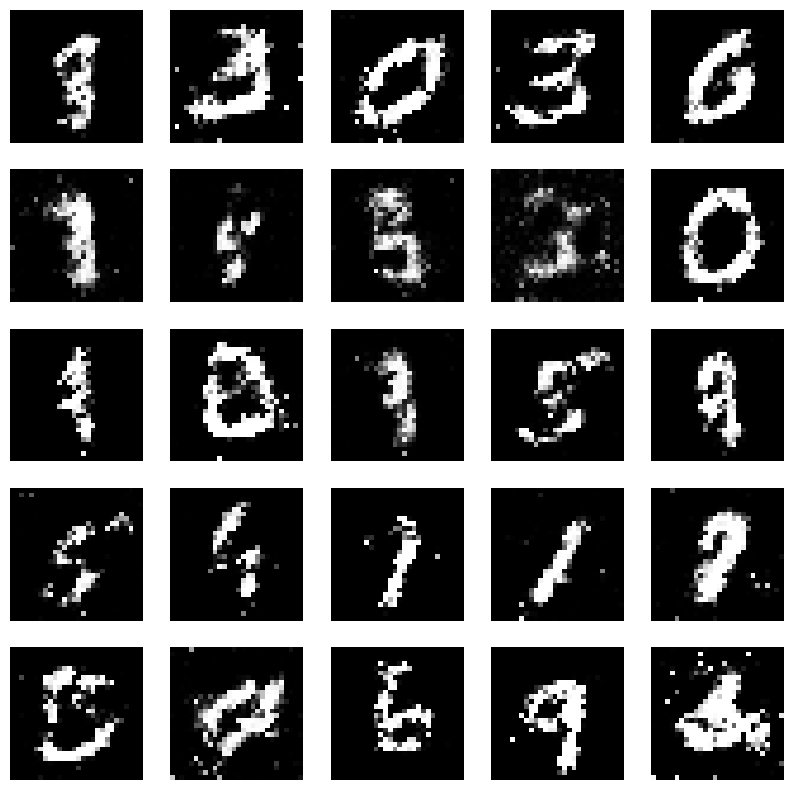

Epochs:  24


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:51,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:39,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:40,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 12/273 [00:04<01:42,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:04<01:38,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:43,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:40,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:06<01:35,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:40,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:38,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:37,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:35,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:33,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:33,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:37,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:10<01:42,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:10<01:47,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<01:48,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:11<01:48,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:48,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 32/273 [00:12<01:48,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:54,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:52,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:48,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:41,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:15<01:41,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:37,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:36,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:16<01:30,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:27,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:18<01:23,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:24,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:23,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:21,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:19<01:21,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:22,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:20<01:21,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:26,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:29,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:26,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:24,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:23<01:23,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:23<01:18,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:19,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 62/273 [00:24<01:22,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:25<01:28,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:25<01:33,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:25<01:31,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:26<01:36,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:26<01:37,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:27<01:39,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 69/273 [00:28<01:42,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 70/273 [00:28<01:39,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:28<01:32,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:27,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:29<01:22,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:29<01:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:30<01:18,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:17,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:14,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:31<01:14,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:12,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:32<01:11,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:33<01:11,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:08,  2.79it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:33<01:07,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:10,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:34<01:09,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:08,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:35<01:08,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:35<01:09,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:36<01:08,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:36<01:07,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:10,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:37<01:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:37<01:10,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:38<01:07,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:38<01:08,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:39<01:13,  2.39it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:39<01:17,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:40<01:19,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:40<01:19,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 102/273 [00:41<01:20,  2.14it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 103/273 [00:41<01:21,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:22,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:42<01:20,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:18,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:11,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:43<01:06,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:08,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:44<01:05,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:45<01:02,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:00,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:46<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:46<01:00,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 117/273 [00:47<00:59,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:47<00:59,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<01:01,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:48<00:59,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:48<00:56,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:56,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:49<00:56,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:49<00:56,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:50<00:55,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:50<00:54,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:51<00:53,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:51<01:11,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:52<01:05,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:52<01:01,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:53<01:02,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:53<01:06,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:54<01:07,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:54<01:09,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:55<01:08,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:55<01:09,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 137/273 [00:56<01:09,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:56<01:08,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<01:04,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:59,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<00:55,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:52,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:51,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:58<00:49,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:47,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:47,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:59<00:47,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:46,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:00<00:46,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:01<00:47,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:01<00:45,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:01<00:45,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:44,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:02<00:43,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:02<00:43,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:03<00:43,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:03<00:43,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:41,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:40,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:04<00:42,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:05<00:41,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:05<00:40,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:05<00:39,  2.76it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:06<00:39,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:06<00:38,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:07<00:41,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 167/273 [01:07<00:43,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 168/273 [01:08<00:46,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:08<00:45,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:08<00:44,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:09<00:43,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:09<00:44,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 173/273 [01:10<00:46,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:10<00:45,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:11<00:43,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:11<00:40,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:11<00:39,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:12<00:37,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:12<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:12<00:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:13<00:34,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:13<00:33,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:14<00:33,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:14<00:34,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:14<00:35,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:15<00:36,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:15<00:34,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:16<00:34,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:16<00:32,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:16<00:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:17<00:31,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:17<00:31,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:18<00:29,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:18<00:29,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 195/273 [01:18<00:28,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:19<00:28,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:19<00:27,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:19<00:27,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:20<00:26,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:20<00:26,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:20<00:26,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:21<00:28,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:21<00:29,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:22<00:29,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:22<00:30,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 206/273 [01:23<00:31,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 207/273 [01:23<00:30,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:24<00:30,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 209/273 [01:24<00:31,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:25<00:30,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:25<00:29,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:26<00:27,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:26<00:26,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 214/273 [01:26<00:24,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:27<00:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:27<00:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:28<00:21,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:28<00:20,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:28<00:20,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:29<00:19,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:29<00:19,  2.69it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 222/273 [01:29<00:19,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:30<00:18,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:30<00:18,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:30<00:17,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:31<00:17,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:31<00:16,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:32<00:16,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:32<00:15,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:32<00:15,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:33<00:15,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:33<00:14,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:33<00:14,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:34<00:14,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:34<00:13,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:34<00:13,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:35<00:13,  2.74it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 238/273 [01:35<00:14,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:36<00:15,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 240/273 [01:36<00:15,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:37<00:14,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:37<00:14,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:38<00:14,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:38<00:13,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:39<00:13,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:39<00:13,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:40<00:11,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:40<00:10,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:40<00:10,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:41<00:09,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:41<00:09,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:42<00:08,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:42<00:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:42<00:07,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:43<00:06,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:43<00:06,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:43<00:05,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:44<00:05,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:44<00:05,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:45<00:04,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:45<00:04,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:45<00:04,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:46<00:03,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:46<00:03,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:46<00:02,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:47<00:02,  2.76it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:47<00:02,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:48<00:01,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:48<00:01,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:48<00:01,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:49<00:00,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:49<00:00,  2.76it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 273/273 [01:49<00:00,  2.48it/s]


Perdidas:  0.6449666023254395 , 0.8347609639167786
1/1 [==============================] - 0s 39ms/step


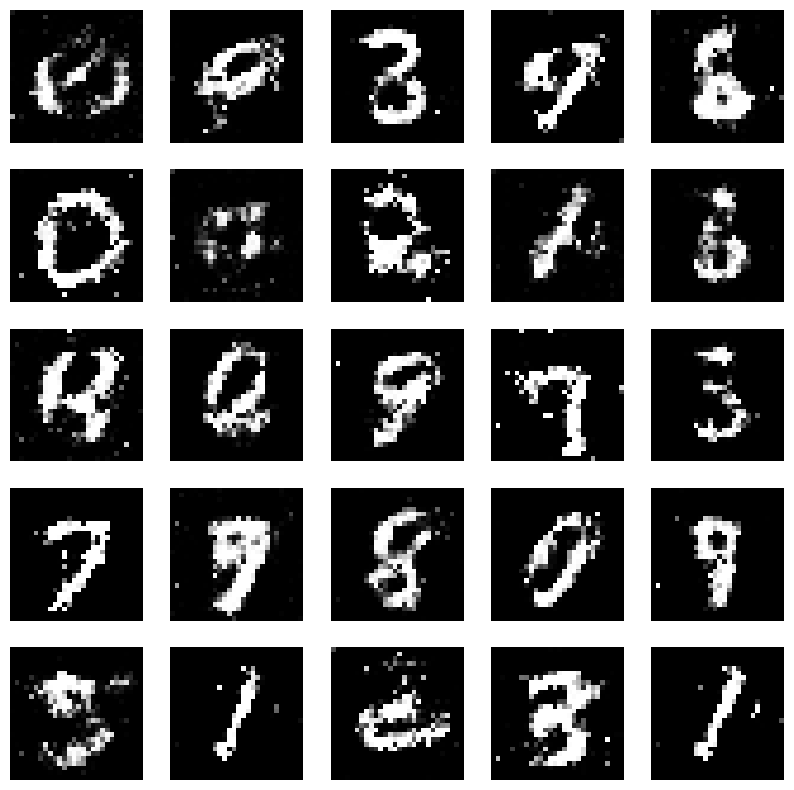

Epochs:  25


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:46,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<02:07,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:54,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:58,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:52,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:53,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:47,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:41,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:41,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:37,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:37,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:35,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:33,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:32,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:33,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:32,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:32,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:35,  2.62it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 24/273 [00:09<01:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:36,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:51,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 27/273 [00:10<01:56,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<02:01,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<02:05,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:12<02:07,  1.90it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<02:03,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:13<02:02,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 33/273 [00:13<01:57,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:48,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:45,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:41,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:39,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:41,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:38,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:35,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:31,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:25,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:25,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:22,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:26,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:23,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:23,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:26,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:22,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 59/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 60/273 [00:24<01:30,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:29,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:30,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 63/273 [00:25<01:32,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:33,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:26<01:36,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:36,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:27<01:41,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:28<01:34,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:28,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:24,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:19,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:17,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:15,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:13,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:13,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:31<01:13,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:17,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:16,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:15,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:24,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:18,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:17,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:19,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:13,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:11,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:14,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:11,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:36<01:10,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:08,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:07,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:38<01:09,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:38<01:18,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 97/273 [00:39<01:25,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:40<01:22,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:22,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:17,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:16,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:14,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:14,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:11,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:04,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:02,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:01,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:00,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<00:58,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<00:57,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:01,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:47<01:02,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<00:59,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:48<00:57,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:57,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<00:57,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:49<00:55,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:50<00:54,  2.78it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:50<00:53,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:50<00:53,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:51<00:53,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:51<00:52,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:51<00:53,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:52<00:55,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:52<00:56,  2.54it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 131/273 [00:53<01:01,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 132/273 [00:53<01:04,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 133/273 [00:54<01:03,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 134/273 [00:54<01:03,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:55<01:05,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:55<01:06,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:56<01:08,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:56<01:05,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:59,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:56,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:57<00:55,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:53,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:52,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:51,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:50,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:00<00:48,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:46,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:01<00:46,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:48,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:02<00:47,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:02<00:45,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:45,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:03<00:47,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:44,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:05<00:43,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:06<00:44,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:06<00:45,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:06<00:44,  2.47it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 165/273 [01:07<00:47,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 166/273 [01:08<00:52,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 167/273 [01:08<00:51,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:09<00:51,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:09<00:51,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:09<00:49,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:10<00:54,  1.87it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:11<00:51,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:47,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:11<00:45,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [01:12<00:43,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:12<00:38,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:38,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:34,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:15<00:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:16<00:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:31,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:30,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:30,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:29,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:18<00:29,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:18<00:28,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:19<00:28,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:19<00:28,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:20<00:27,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:20<00:28,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:20<00:28,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:21<00:30,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 200/273 [01:21<00:31,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 201/273 [01:22<00:30,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 202/273 [01:22<00:31,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 203/273 [01:23<00:30,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:23<00:32,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 206/273 [01:24<00:32,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 207/273 [01:25<00:31,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:25<00:29,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:27,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:26,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:26<00:25,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:27<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:28<00:22,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:29<00:21,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:30<00:19,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:30<00:19,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:31<00:18,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:31<00:18,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:32<00:17,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 227/273 [01:32<00:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:16,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:33<00:17,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:33<00:16,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:34<00:15,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:34<00:15,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:35<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:35<00:14,  2.63it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 235/273 [01:35<00:15,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:36<00:15,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:36<00:15,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 238/273 [01:37<00:15,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:37<00:14,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:38<00:15,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:38<00:14,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:39<00:13,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:39<00:12,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:11,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:40<00:11,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:41<00:10,  2.52it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 248/273 [01:41<00:10,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:41<00:09,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:09,  2.49it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 251/273 [01:42<00:09,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:09,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:43<00:08,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:44<00:06,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:45<00:05,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:45<00:05,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:04,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:46<00:04,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:46<00:04,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:47<00:03,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:48<00:02,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:48<00:02,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:48<00:02,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:49<00:01,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:50<00:00,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 273/273 [01:51<00:00,  2.45it/s]


Perdidas:  0.6045774221420288 , 0.918665885925293
1/1 [==============================] - 0s 30ms/step


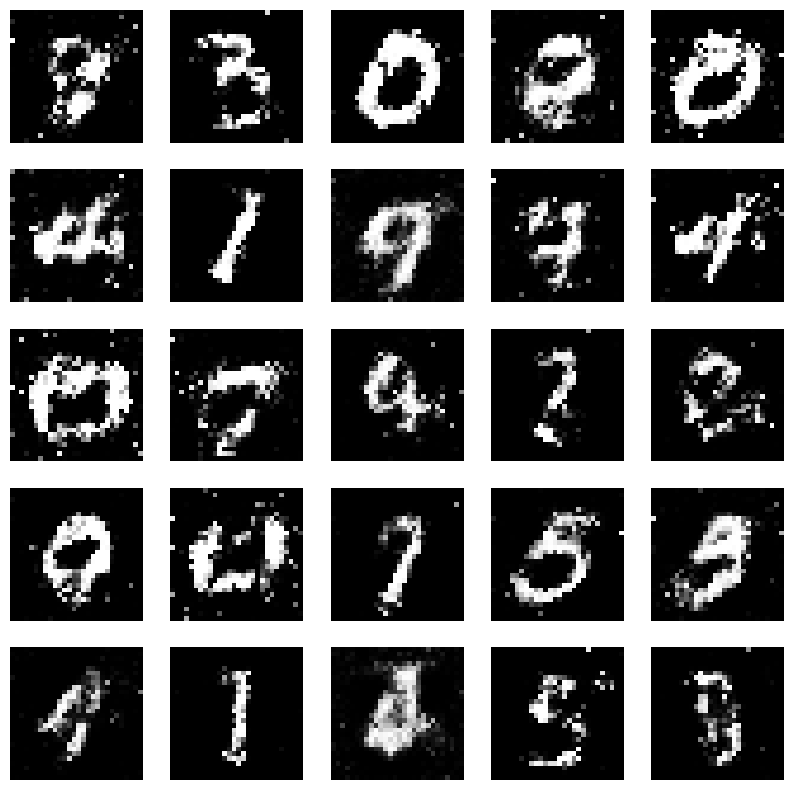

Epochs:  26


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:41,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:39,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:38,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:37,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:39,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:40,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:39,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 11/273 [00:04<01:38,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 12/273 [00:04<01:36,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:34,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:35,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:40,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:42,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:45,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:39,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:07<01:36,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:38,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:08<01:39,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 24/273 [00:09<01:58,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:09<01:56,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 26/273 [00:10<01:57,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:59,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 28/273 [00:11<02:02,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 29/273 [00:11<02:02,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:12<01:54,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:47,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:41,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:37,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:37,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:31,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:14<01:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:15<01:28,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:30,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:16<01:30,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:27,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:25,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:21,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:34,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:36,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:33,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:20<01:28,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:26,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:28,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:26,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:30,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 57/273 [00:23<01:37,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:23<01:39,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:24<01:42,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:45,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:25<01:44,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:44,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:26<01:42,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:26<01:42,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:38,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:35,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:27<01:29,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:24,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:22,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:16,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:16,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:18,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:18,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:15,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:14,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:13,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:33<01:10,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:10,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:11,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:34<01:23,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:34<01:17,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:16,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:13,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:35<01:12,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:10,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:15,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:19,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 93/273 [00:38<01:21,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:38<01:23,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:39<01:24,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 96/273 [00:39<01:26,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:40<01:24,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 98/273 [00:40<01:25,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 99/273 [00:41<01:21,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:14,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:11,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:10,  2.44it/s]

4/4 [==============================] - 0s 5ms/step


 38%|███▊      | 103/273 [00:42<01:09,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:06,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:43<01:05,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:03,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:01,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:00,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:02,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:00,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<00:59,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<00:58,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<00:57,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:48<01:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:01,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<00:58,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:55,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:53,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:50<00:56,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:50<00:55,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:51<01:01,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:51<01:02,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 128/273 [00:52<01:04,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:52<01:04,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 130/273 [00:53<01:07,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:53<01:09,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:54<01:10,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:54<01:09,  2.01it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 134/273 [00:55<01:14,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 135/273 [00:55<01:07,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<01:01,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:58,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:55,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:50,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:50,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<00:49,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:49,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:49,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:48,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:46,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:47,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:01<00:47,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:02<00:46,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:46,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:44,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:03<00:43,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:43,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:44,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:43,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [01:05<00:47,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [01:05<00:47,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:06<00:49,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 163/273 [01:06<00:51,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:07<00:52,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 165/273 [01:07<00:52,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:52,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 167/273 [01:08<00:50,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:09<00:49,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:09<00:49,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:10<00:47,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:10<00:44,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:41,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:39,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:11<00:38,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:12<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:37,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:13<00:36,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:15<00:33,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:30,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:31,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 192/273 [01:18<00:33,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:31,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:19<00:30,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:19<00:31,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:20<00:32,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:20<00:33,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:21<00:33,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 199/273 [01:21<00:32,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:22<00:32,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:22<00:31,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:23<00:31,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:23<00:32,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:32,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:28,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:27,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:25<00:26,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:26<00:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:22,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:27<00:21,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:28<00:21,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:28<00:20,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:28<00:20,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:29<00:20,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:30<00:19,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:30<00:20,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:31<00:18,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:31<00:18,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:32<00:18,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:32<00:17,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 229/273 [01:33<00:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:33<00:16,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:34<00:17,  2.42it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 232/273 [01:34<00:17,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:35<00:17,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:35<00:17,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:36<00:17,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:36<00:17,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:37<00:17,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 238/273 [01:37<00:17,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:38<00:16,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:38<00:15,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:14,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:13,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:39<00:12,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:10,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:09,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:42<00:08,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:42<00:08,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:43<00:07,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:44<00:06,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:45<00:06,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:46<00:04,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:48<00:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:49<00:02,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:52<00:00,  2.43it/s]


Perdidas:  0.6887193918228149 , 0.9248967170715332
1/1 [==============================] - 0s 36ms/step


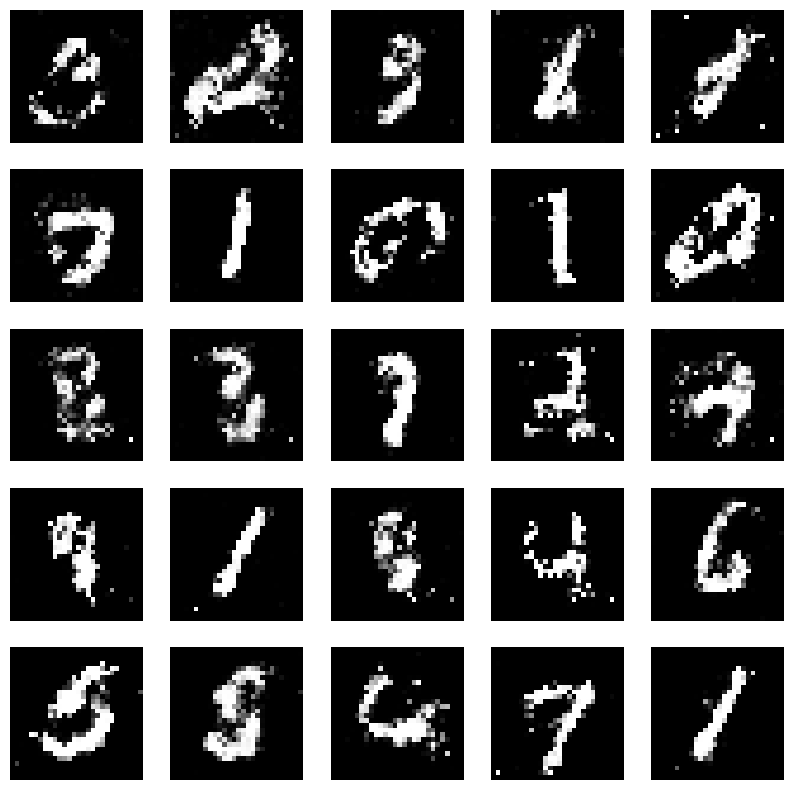

Epochs:  27


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:32,  2.96it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:43,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:37,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:04<01:36,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:05<01:36,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:05<01:35,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:33,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:33,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:33,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:35,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:07<01:44,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:08<01:53,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:08<01:56,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:54,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<02:00,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:10<02:02,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 26/273 [00:10<01:59,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 27/273 [00:11<01:58,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:57,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:49,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:43,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:38,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:37,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:35,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:33,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:15<01:33,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:33,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:32,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:26,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:25,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:18<01:23,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:22,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:22,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:23,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:23,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:21<01:24,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:22<01:25,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:22<01:27,  2.46it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 58/273 [00:23<01:28,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:23<01:28,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 60/273 [00:24<01:33,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 61/273 [00:24<01:37,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 62/273 [00:25<01:37,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:25<01:40,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 64/273 [00:26<01:49,  1.91it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:40,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:31,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:26,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:23,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:25,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:23,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:28<01:21,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:17,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:16,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:18,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:30<01:15,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:15,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:32<01:12,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:11,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:11,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:11,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:09,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:35<01:07,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:05,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 91/273 [00:36<01:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:16,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:37<01:16,  2.35it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 94/273 [00:38<01:19,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:22,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:39<01:23,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 97/273 [00:39<01:24,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:39<01:20,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:40<01:21,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:40<01:20,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:19,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:14,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:42<01:10,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:11,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:42<01:06,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:03,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:43<01:02,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:44<01:00,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:45<00:59,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:00,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:45<00:59,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<00:58,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:46<00:58,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:46<00:57,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:57,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:47<00:59,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<00:57,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:48<00:57,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:48<00:57,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:49<00:59,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:50<00:58,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:50<00:57,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:50<00:59,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:51<01:00,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:51<01:02,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:52<01:04,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:52<01:05,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:53<01:04,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:53<01:05,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:54<01:05,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 134/273 [00:54<01:06,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:55<01:05,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:55<01:02,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:55<00:58,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:55,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:56<00:53,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:56<00:52,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:57<00:50,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:57<00:49,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:49,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:58<00:50,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [00:58<00:48,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:46,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:59<00:48,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:00<00:47,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:00<00:46,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:01<00:46,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:01<00:45,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:51,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:02<00:50,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:02<00:49,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:48,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [01:04<01:04,  1.80it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:04<00:57,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:04<00:52,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:49,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 161/273 [01:05<00:49,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:52,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:06<00:51,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 164/273 [01:07<00:50,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 165/273 [01:07<00:52,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 166/273 [01:08<00:50,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:08<00:49,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:09<00:49,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 169/273 [01:09<00:49,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:46,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:10<00:43,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:41,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:39,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:11<00:37,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:12<00:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:37,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:13<00:36,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:14<00:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:36,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:15<00:33,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:16<00:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:16<00:35,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:17<00:34,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:33,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:32,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:18<00:33,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:18<00:32,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:18<00:30,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 194/273 [01:19<00:30,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:19<00:31,  2.46it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 196/273 [01:20<00:34,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:20<00:34,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 198/273 [01:21<00:34,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:21<00:34,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:22<00:34,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:22<00:34,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 202/273 [01:23<00:36,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 203/273 [01:23<00:33,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:31,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:24<00:29,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:27,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:25<00:27,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:26,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:26,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:26<00:25,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:25,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:24,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:22,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:31<00:18,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:32<00:17,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:16,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:33<00:17,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 230/273 [01:34<00:18,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:34<00:18,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:18,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 233/273 [01:35<00:18,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:36<00:17,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:36<00:17,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:17,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:37<00:16,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:16,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:38<00:14,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:38<00:13,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:39<00:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:40<00:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:41<00:09,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:43<00:07,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:06,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:44<00:06,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:45<00:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:46<00:04,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:49<00:03,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.6624033451080322 , 0.913113534450531
1/1 [==============================] - 0s 28ms/step


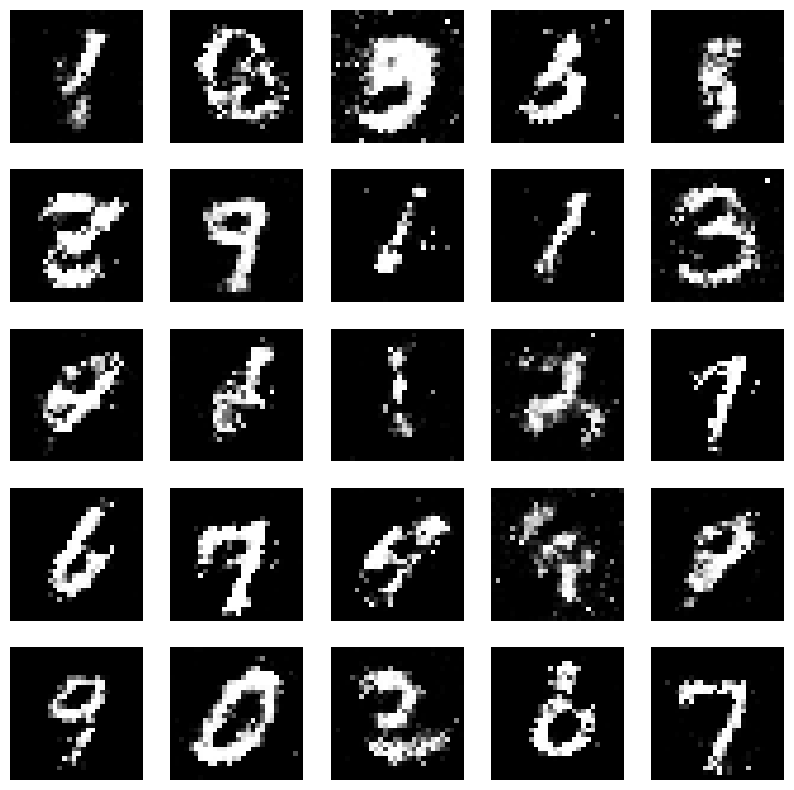

Epochs:  28


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<01:45,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:45,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:37,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:38,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:39,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:38,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:02<01:39,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:40,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:43,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:47,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:43,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:36,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 18/273 [00:06<01:41,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 19/273 [00:07<01:49,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 20/273 [00:08<01:57,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 21/273 [00:08<02:00,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:08<01:57,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:09<01:55,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:09<01:58,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:10<02:04,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 26/273 [00:11<02:05,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:11<02:00,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:50,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:44,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<01:39,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:36,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:30,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:30,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:37,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:16<01:38,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:32,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:18<01:26,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:25,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:27,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:22<01:33,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 55/273 [00:22<01:38,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:23<01:40,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:23<01:39,  2.17it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 58/273 [00:23<01:44,  2.07it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 59/273 [00:24<01:43,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:24<01:44,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 61/273 [00:25<01:40,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:32,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:28,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:22,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:27<01:19,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:28<01:15,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:17,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:19,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:17,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:30<01:23,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:25,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:25,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:20,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:18,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:32<01:16,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:33<01:16,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:17,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 83/273 [00:34<01:18,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:16,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:35<01:17,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:17,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 89/273 [00:36<01:20,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:24,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:23,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 92/273 [00:38<01:27,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:28,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:39<01:29,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:39<01:29,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:40<01:24,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:18,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 98/273 [00:40<01:18,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:18,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 100/273 [00:41<01:17,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:12,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:09,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:06,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:03,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:02,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:01,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:06,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:46<01:05,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:03,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:00,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:00,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<00:59,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<00:58,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<00:57,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<00:57,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<00:56,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<01:01,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:50<01:00,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<01:03,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 124/273 [00:51<01:05,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 125/273 [00:51<01:05,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<01:07,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 127/273 [00:52<01:08,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:53<01:14,  1.94it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<01:10,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<01:08,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<01:07,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:55<01:03,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:59,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<00:57,  2.43it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 135/273 [00:56<00:58,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:57,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:57<00:55,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:57<00:55,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:51,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:50,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:48,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:59<00:47,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:46,  2.77it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [00:59<00:46,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:56,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:50,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:02<00:46,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:45,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:02<00:45,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:45,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:46,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:44,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:45,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [01:04<00:49,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:05<00:50,  2.28it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 159/273 [01:05<00:49,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:06<00:51,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [01:06<00:54,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:07<00:55,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 163/273 [01:07<00:53,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:08<00:53,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [01:08<00:52,  2.06it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:09<00:47,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:45,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:09<00:45,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:43,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [01:10<00:41,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:39,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:41,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:15<00:33,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:32,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:32,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:31,  2.78it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 187/273 [01:17<00:31,  2.75it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:18<00:31,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:31,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:19<00:34,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:34,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:20<00:34,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:20<00:33,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:21<00:33,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:21<00:33,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:22<00:33,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:22<00:33,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:23<00:31,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:30,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:23<00:28,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:27,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:27,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:27<00:26,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:25,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:27<00:24,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:19,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:30<00:19,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:32<00:19,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:19,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:33<00:19,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:34<00:19,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:34<00:20,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:35<00:19,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:35<00:18,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:19,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:36<00:18,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:18,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:16,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:15,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:14,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:09,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:08,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:44<00:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 264/273 [01:48<00:04,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:49<00:03,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.6656054258346558 , 0.8396964073181152
1/1 [==============================] - 0s 30ms/step


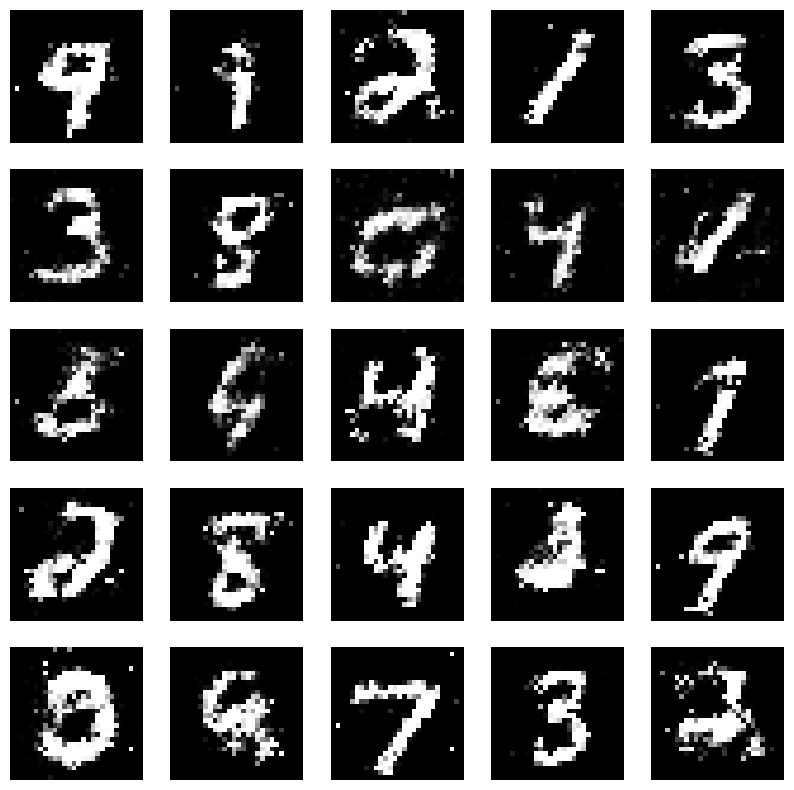

Epochs:  29


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/273 [00:00<01:34,  2.88it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:39,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:37,  2.76it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:41,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:43,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:36,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:40,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:38,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:05<01:47,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:05<01:53,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:56,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 17/273 [00:06<02:02,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<02:04,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:07<02:07,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 20/273 [00:08<02:03,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:08<02:00,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 22/273 [00:09<01:57,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 23/273 [00:09<01:54,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:46,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:40,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:44,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:37,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:34,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:36,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:33,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 34/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:34,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:15<01:35,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:35,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:29,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:26,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:28,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 50/273 [00:20<01:35,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▊        | 51/273 [00:20<01:42,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:21<01:43,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:45,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:22<01:44,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 55/273 [00:22<01:42,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 56/273 [00:23<01:40,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:41,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:24<01:39,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:31,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:30,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:28,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:28,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:24,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:24,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:26,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:21,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:20,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:18,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:30<01:13,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:12,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:14,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:16,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:32<01:11,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:33<01:11,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:10,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:09,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:09,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:34<01:16,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:19,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 87/273 [00:35<01:24,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:28,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:36<01:30,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:37<01:27,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:37<01:27,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 92/273 [00:38<01:28,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:38<01:28,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:39<01:23,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:18,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:14,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:12,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:09,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:08,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:06,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:06,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:06,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:05,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:03,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:02,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:04,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:43<01:02,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:03,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:05,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:07,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:07,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:04,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:46<01:04,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<00:59,  2.63it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<00:57,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<01:00,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:49<01:03,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:49<01:08,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 122/273 [00:50<01:11,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:50<01:11,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:51<01:10,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:51<01:15,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:52<01:11,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:52<01:09,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 128/273 [00:53<01:10,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:53<01:05,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<01:01,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<00:58,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:54<00:56,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:57,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:53,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 136/273 [00:56<00:52,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<00:52,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:50,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:57<00:51,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:51,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:50,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:48,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:49,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:47,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:48,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:49,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:46,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:01<00:45,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:46,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 155/273 [01:03<00:49,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:04<00:49,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [01:04<00:52,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:51,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:05<00:54,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:52,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:06<00:52,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:06<00:52,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 163/273 [01:07<00:51,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:47,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:44,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:08<00:42,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:08<00:42,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:09<00:40,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:39,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:39,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:37,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:11<00:36,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:12<00:36,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:13<00:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:13<00:35,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:34,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:14<00:34,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:15<00:33,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:16<00:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:17<00:33,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 191/273 [01:18<00:34,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:18<00:36,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:19<00:37,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 194/273 [01:19<00:37,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:20<00:37,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 196/273 [01:20<00:37,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:21<00:36,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:21<00:36,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 199/273 [01:22<00:33,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:31,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:22<00:29,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:23<00:32,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:29,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:28,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:26,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:24,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:26<00:24,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:27<00:23,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:29<00:21,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:29<00:21,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:31<00:19,  2.52it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 225/273 [01:32<00:20,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 226/273 [01:32<00:21,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:21,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 228/273 [01:33<00:21,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:34<00:21,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:34<00:20,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:35<00:20,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:35<00:19,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:18,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:36<00:17,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:36<00:16,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:37<00:15,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:37<00:14,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:14,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:38<00:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:39<00:11,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:40<00:10,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:10,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:09,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:43<00:07,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.68it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:44<00:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:45<00:06,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:46<00:06,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:47<00:05,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:47<00:05,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:48<00:04,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:49<00:03,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:52<00:00,  2.43it/s]


Perdidas:  0.6694562435150146 , 0.8228856921195984
1/1 [==============================] - 0s 28ms/step


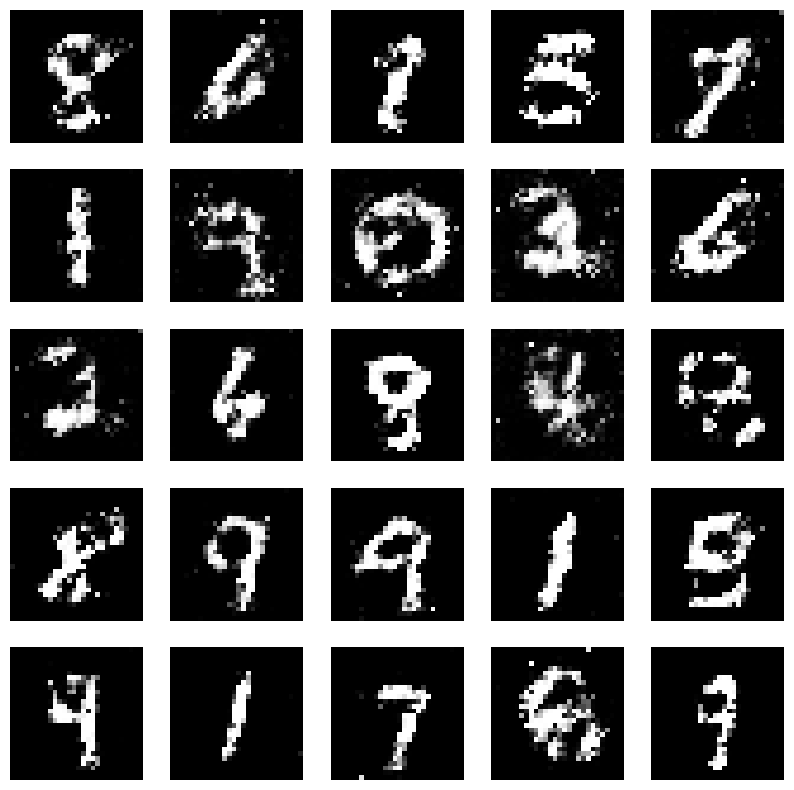

Epochs:  30


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:39,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:38,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:37,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:40,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:37,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:40,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:40,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:40,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:04<01:48,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 12/273 [00:04<01:54,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 13/273 [00:05<02:00,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:05<02:05,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<02:07,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 16/273 [00:06<02:02,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<02:01,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 18/273 [00:07<02:02,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 19/273 [00:08<02:04,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:54,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:50,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:50,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:43,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:40,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:37,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:39,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:29,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:28,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 34/273 [00:13<01:32,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:35,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:28,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:15<01:27,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:25,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:32,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:37,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:18<01:40,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 47/273 [00:19<01:42,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:41,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 49/273 [00:20<01:47,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 50/273 [00:20<01:51,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:21<01:49,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:21<01:50,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 53/273 [00:22<01:47,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:39,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:33,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 56/273 [00:23<01:29,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:29,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:20,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:18,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:26<01:19,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:16,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:15,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:16,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:15,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:13,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:14,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:15,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:14,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:14,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:18,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:30<01:16,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:15,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 80/273 [00:32<01:19,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:21,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:22,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:34<01:24,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 84/273 [00:34<01:29,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 85/273 [00:35<01:34,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:34,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:29,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 88/273 [00:36<01:28,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:25,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:37<01:21,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:15,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:12,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:38<01:08,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:07,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:07,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:06,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:04,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:03,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:07,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:09,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:11,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:08,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:09,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:10,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:09,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:11,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:07,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:45<01:05,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:03,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:05,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:46<01:08,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:08,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:47<01:11,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:48<01:12,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 118/273 [00:48<01:11,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:49<01:12,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 120/273 [00:49<01:16,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 121/273 [00:50<01:17,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:50<01:12,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:10,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<01:04,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 125/273 [00:52<01:05,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<01:01,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:58,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:53<00:55,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:57,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:54<00:57,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:58,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:57,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:52,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:55,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:53,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:52,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:50,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:50,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:49,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:51,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [01:00<00:50,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:52,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:01<00:53,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:53,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:02<00:54,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:52,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 152/273 [01:03<00:54,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:55,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 154/273 [01:04<00:55,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:04<00:55,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:53,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 157/273 [01:05<00:49,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:05<00:48,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:45,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:45,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:44,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [01:07<00:43,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:07<00:42,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 164/273 [01:07<00:41,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:41,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:08<00:40,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:38,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:37,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:09<00:38,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:37,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:10<00:37,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:38,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:36,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:36,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:12<00:35,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:34,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:13<00:34,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:14<00:34,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 183/273 [01:15<00:37,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 184/273 [01:15<00:37,  2.36it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 185/273 [01:16<00:40,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:16<00:40,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:41,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 188/273 [01:17<00:42,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 189/273 [01:18<00:42,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:18<00:40,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:19<00:38,  2.11it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:19<00:36,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:19<00:33,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:30,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:20<00:29,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:29,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:21<00:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:22<00:27,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:26,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:23<00:26,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:23<00:25,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:25,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:24,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:24,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:23,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:23,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:33,  1.90it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:29,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:28,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:26,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:24,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:25,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:24,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:29<00:23,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 218/273 [01:30<00:24,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:30<00:24,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 220/273 [01:31<00:24,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:31<00:24,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:32<00:24,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:32<00:24,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:24,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 225/273 [01:33<00:23,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:21,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:19,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:34<00:18,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:34<00:17,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:35<00:17,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:36<00:15,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 255/273 [01:45<00:08,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:45<00:07,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:46<00:07,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:50<00:01,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.6619589924812317 , 0.834999680519104
1/1 [==============================] - 0s 28ms/step


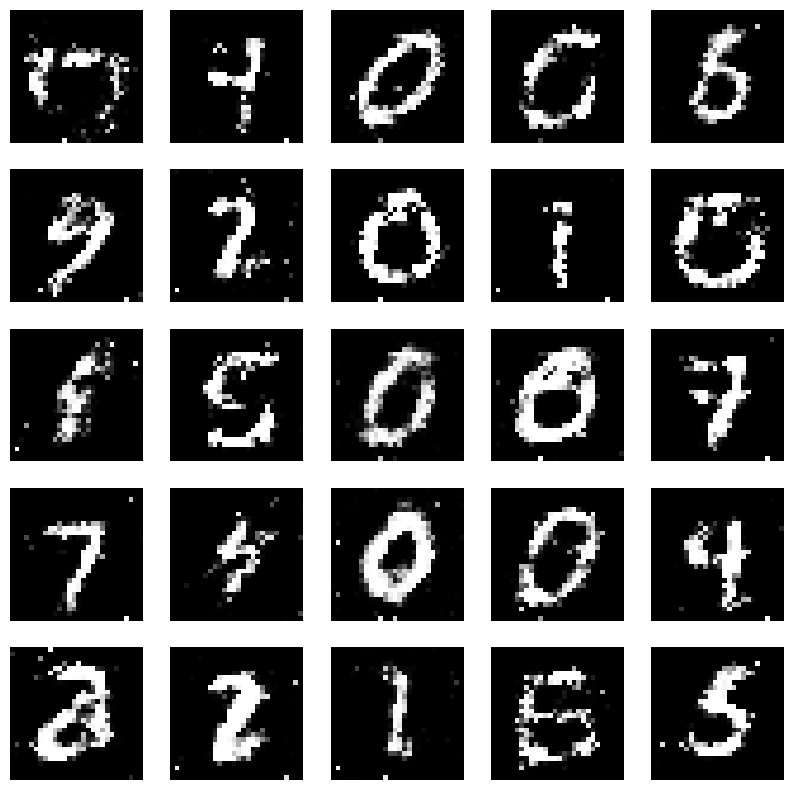

Epochs:  31


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:41,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:38,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:48,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:49,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:50,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:02<01:57,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:03<01:56,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/273 [00:03<01:58,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:04,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<02:04,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<02:17,  1.90it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:05<02:10,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:06<02:03,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:53,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<01:48,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:44,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<01:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:37,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:08<01:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:33,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:32,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:32,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:33,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:34,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:31,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 28/273 [00:11<01:37,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:39,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:35,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:13<01:34,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:35,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:35,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:31,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:31,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:16<01:36,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:39,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:17<01:43,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:18<01:47,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 45/273 [00:18<01:47,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 46/273 [00:19<01:48,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 47/273 [00:19<01:52,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:20<01:51,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:43,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:21<01:37,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:32,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:28,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:29,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:28,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:24,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:20,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:18,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:21,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:21,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:19,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:17,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:17,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:16,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:16,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:28<01:17,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:15,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 74/273 [00:30<01:15,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:15,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:30<01:16,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 77/273 [00:31<01:24,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:28,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:31,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:28,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:31,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:33<01:31,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 83/273 [00:34<01:30,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 84/273 [00:34<01:30,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:27,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:21,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:17,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:36<01:15,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:13,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 91/273 [00:37<01:09,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:10,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:38<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:08,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:39<01:06,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:06,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:40<01:04,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:05,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:04,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:03,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:02,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:42<01:04,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:02,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:11,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:09,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:05,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:44<01:05,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 111/273 [00:45<01:09,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:12,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:46<01:11,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:46<01:14,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:47<01:15,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:47<01:16,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 117/273 [00:48<01:16,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<01:13,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:09,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:49<01:04,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<01:01,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<00:58,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:55,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:51<00:55,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:51<00:52,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:52,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:52,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:52<00:52,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:52,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<00:52,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:54<00:55,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:54<00:54,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:54<00:55,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:55<00:52,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:55<00:52,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:56<00:51,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:56<00:51,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:54,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:57<00:53,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:57<00:52,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:53,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:58<00:51,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 146/273 [00:59<00:50,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:00<00:51,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [01:00<00:52,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:00<00:52,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:01<00:54,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 151/273 [01:01<00:52,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 152/273 [01:02<00:52,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:02<00:53,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:03<00:54,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:52,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:48,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:44,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:42,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:05<00:41,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:06<00:41,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:06<00:40,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:06<00:41,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:07<00:40,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:07<00:40,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:08<00:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:08<00:40,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:08<00:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:09<00:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:09<00:38,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:09<00:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:10<00:40,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▎   | 174/273 [01:10<00:37,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:11<00:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:11<00:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:11<00:36,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:12<00:36,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:12<00:35,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:12<00:35,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:13<00:36,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:13<00:38,  2.38it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 183/273 [01:14<00:40,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:14<00:40,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:15<00:40,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:15<00:40,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 187/273 [01:16<00:39,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:16<00:39,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:17<00:39,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:17<00:37,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:35,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:18<00:33,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:18<00:32,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:19<00:32,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 195/273 [01:19<00:31,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:19<00:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:20<00:30,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:20<00:30,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:21<00:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:21<00:28,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:21<00:27,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:22<00:26,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:22<00:26,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:23<00:25,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:23<00:25,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:23<00:24,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:24<00:25,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:24<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:24<00:24,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:25<00:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:25<00:23,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:26<00:22,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:26<00:21,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:26<00:21,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:27<00:21,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:27<00:23,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:28<00:24,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:28<00:24,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:29<00:24,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 220/273 [01:29<00:26,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:30<00:25,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:30<00:27,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:31<00:28,  1.75it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:32<00:26,  1.82it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:32<00:23,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:32<00:21,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:19,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:18,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:33<00:17,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:34<00:17,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:34<00:17,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:17,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:16,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:35<00:15,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:36<00:15,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:37<00:13,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:37<00:12,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:37<00:12,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:38<00:12,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:38<00:11,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:38<00:11,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:39<00:10,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:39<00:10,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:10,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:40<00:10,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:40<00:09,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:41<00:09,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:41<00:08,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 251/273 [01:42<00:08,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:42<00:08,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 253/273 [01:43<00:08,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:43<00:08,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:44<00:08,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:44<00:07,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:45<00:07,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 258/273 [01:45<00:07,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:46<00:07,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:46<00:06,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:47<00:05,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:47<00:04,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:50<00:00,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.7091938257217407 , 0.834898054599762
1/1 [==============================] - 0s 29ms/step


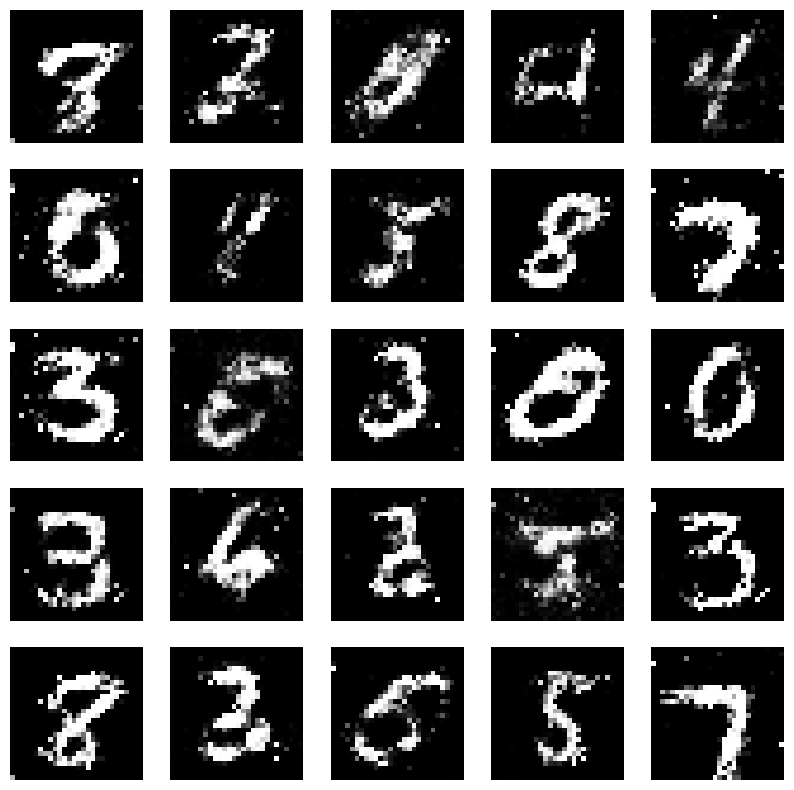

Epochs:  32


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<02:00,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<02:01,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:51,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:54,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<02:00,  2.22it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 6/273 [00:02<02:05,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:03<02:06,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<02:04,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:04<02:05,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:04<02:07,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 11/273 [00:05<02:09,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 12/273 [00:05<02:07,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:06<01:58,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:06<01:52,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:49,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 16/273 [00:07<01:49,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:46,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:08<01:44,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:47,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:43,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:40,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:10<01:39,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:42,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:37,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:34,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:34,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:33,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:32,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:12<01:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:30,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:29,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 34/273 [00:14<01:28,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:30,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:29,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 39/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:16<01:39,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:17<01:41,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 42/273 [00:17<01:43,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:18<01:44,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:49,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 45/273 [00:18<01:46,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:19<01:44,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 47/273 [00:19<01:42,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:20<01:38,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:37,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:33,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:30,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:28,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:26,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:23<01:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:23,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:25,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:17,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:17,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:16,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:15,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:17,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:14,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:12,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:16,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:21,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:31<01:25,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:31<01:27,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▊       | 78/273 [00:32<01:30,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:34,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:33<01:33,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 81/273 [00:33<01:35,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:30,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:24,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:20,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:20,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:15,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:10,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:08,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:37<01:10,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:08,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:15,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:12,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:40<01:10,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:40<01:07,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:05,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:09,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:09,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:05,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:08,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:06,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:05,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 108/273 [00:44<01:08,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:09,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:11,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 111/273 [00:45<01:13,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:14,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:13,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:47<01:14,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:47<01:14,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:48<01:13,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:10,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<01:04,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:03,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:49<01:01,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:59,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<00:58,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:58,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:58,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:57,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:56,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:59,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<00:54,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:53<00:53,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:54<00:51,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:54<00:53,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:53,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:55<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<00:54,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:50,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:57<00:49,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:49,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:58<00:53,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:52,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:55,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:00<00:55,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:00<00:58,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:01<01:00,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 149/273 [01:01<01:01,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:02<00:59,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:56,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:02<00:52,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:03<00:50,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:03<00:49,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:47,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:05<00:42,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:05<00:41,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:41,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:06<00:41,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:43,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:07<00:43,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:08<00:43,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 167/273 [01:08<00:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:09<00:38,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:09<00:42,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:10<00:40,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:10<00:40,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:10<00:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:11<00:37,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:11<00:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:37,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:12<00:37,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:13<00:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:41,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:13<00:41,  2.24it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▋   | 181/273 [01:14<00:41,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [01:14<00:41,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 183/273 [01:15<00:42,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:15<00:40,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 185/273 [01:16<00:42,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 186/273 [01:16<00:42,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:41,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:17<00:38,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:37,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:35,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:33,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:19<00:32,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:20<00:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:20<00:29,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:28,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:21<00:28,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:21<00:27,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:22<00:27,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:22<00:28,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:23<00:29,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:23<00:27,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:26,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:24<00:26,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:23,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:23,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:26<00:24,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:24,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 214/273 [01:27<00:25,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:28<00:26,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 216/273 [01:29<00:27,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:29<00:28,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:27,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:30<00:26,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:31<00:25,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:25,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:31<00:24,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:32<00:22,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:21,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:20,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:34<00:19,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:19,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:20,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:18,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:17,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:36<00:17,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:16,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:38<00:12,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:42<00:11,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:42<00:11,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.20it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 250/273 [01:43<00:11,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:44<00:10,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:45<00:09,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6397872567176819 , 0.7742644548416138
1/1 [==============================] - 0s 41ms/step


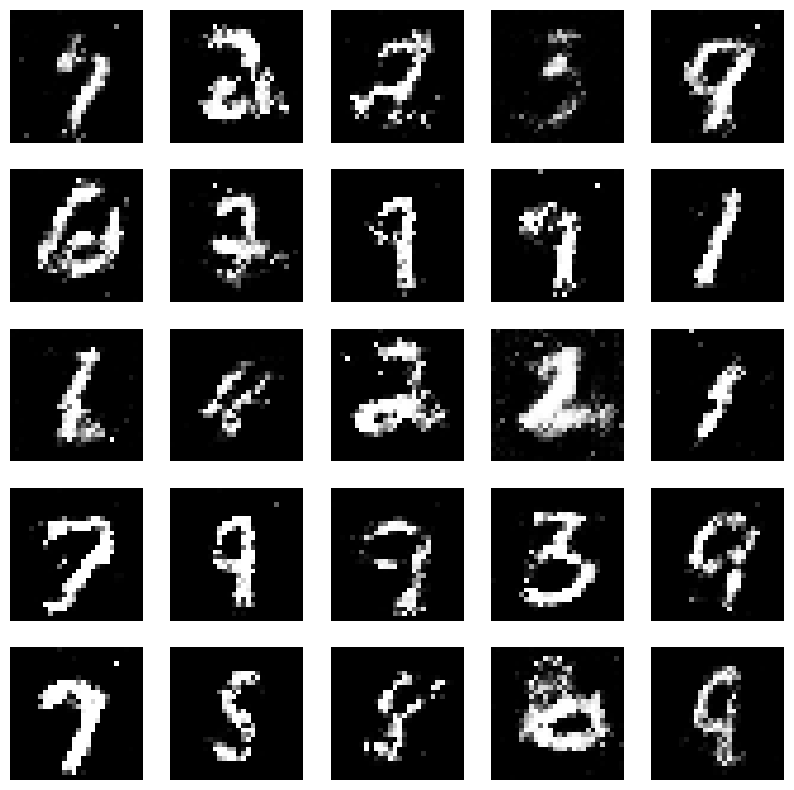

Epochs:  33


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/273 [00:00<02:11,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:00<02:13,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:14,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<02:13,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 5/273 [00:02<02:09,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<02:10,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:04,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:57,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/273 [00:04<01:50,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:04<01:45,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:45,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:41,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:53,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:06<01:50,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:46,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:38,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:43,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:39,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:38,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:40,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:10<01:37,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:37,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:52,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:51,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:12<01:50,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:46,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:13<01:43,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:47,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:14<01:53,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:56,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 35/273 [00:15<02:01,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 36/273 [00:15<02:00,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:16<01:58,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 38/273 [00:16<01:57,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:17<01:54,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:17<01:49,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:18<01:42,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:18<01:38,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:18<01:33,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:19<01:29,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:19<01:32,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:20<01:36,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:20<01:33,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:21<01:33,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:36,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:22<01:32,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:22<01:32,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:28,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:23<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:24<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:24<01:26,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:23,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:26<01:22,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:19,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:26<01:19,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:18,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:27<01:18,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:28<01:31,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:28<01:34,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:29<01:36,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 69/273 [00:29<01:39,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 70/273 [00:30<01:39,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:30<01:39,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 72/273 [00:31<01:39,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 73/273 [00:31<01:35,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:31<01:29,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 75/273 [00:32<01:25,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:32<01:20,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 77/273 [00:33<01:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:33<01:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:33<01:15,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:34<01:17,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:34<01:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:35<01:14,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:35<01:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:36<01:16,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:36<01:15,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:13,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:37<01:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:13,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:38<01:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:13,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:14,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:17,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:26,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:40<01:21,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:41<01:20,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:41<01:19,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:42<01:24,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:42<01:24,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:43<01:23,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:43<01:26,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 103/273 [00:44<01:26,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:44<01:27,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 105/273 [00:45<01:29,  1.89it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:45<01:22,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:46<01:19,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 108/273 [00:46<01:14,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:47<01:09,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:47<01:08,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:06,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:48<01:05,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:48<01:03,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:49<01:02,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:49<01:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:49<01:01,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:50<01:00,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:50<01:01,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<00:58,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:51<00:58,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:51<00:57,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:52<00:57,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:52<00:56,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:52<00:56,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:53<00:55,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<00:55,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:54<00:54,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<00:54,  2.65it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 129/273 [00:54<00:56,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:55<00:54,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:55<00:53,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:56<00:56,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 134/273 [00:56<01:01,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:57<01:03,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<01:04,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:58<01:03,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<01:00,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:59<01:00,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 140/273 [00:59<01:00,  2.21it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 141/273 [01:00<00:59,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:59,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [01:00<00:56,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [01:01<00:53,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:51,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:02<00:49,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:02<00:51,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:02<00:49,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:03<00:49,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:03<00:48,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:04<00:46,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:04<00:45,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:50,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:05<00:48,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:05<00:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:06<00:45,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:06<00:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:06<00:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:07<00:43,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:08<00:43,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:42,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:08<00:40,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:09<00:40,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:09<00:40,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:40,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:10<00:43,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:11<00:43,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:11<00:45,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:12<00:46,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:12<00:46,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 173/273 [01:13<00:46,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:13<00:47,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:14<00:48,  2.03it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:14<00:44,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:14<00:41,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:15<00:39,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:15<00:38,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:16<00:36,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:16<00:35,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:17<00:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:17<00:33,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:17<00:33,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 186/273 [01:18<00:33,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:33,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:19<00:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:19<00:32,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:32,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:20<00:31,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:20<00:31,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:21<00:32,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:21<00:33,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:21<00:33,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:22<00:32,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:30,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:29,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:23<00:28,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 200/273 [01:23<00:30,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:24<00:29,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:24<00:31,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:25<00:32,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:25<00:32,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:26<00:32,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 206/273 [01:26<00:32,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 207/273 [01:27<00:32,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 208/273 [01:27<00:32,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:28<00:31,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:31,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:29<00:28,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:29<00:25,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:29<00:24,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:30<00:23,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:30<00:23,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:31<00:22,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:31<00:21,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:31<00:22,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:32<00:21,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:20,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:33<00:20,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:33<00:19,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:34<00:18,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:17,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:35<00:18,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:36<00:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:36<00:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:15,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:15,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:14,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:13,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:13,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:15,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 239/273 [01:40<00:15,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 240/273 [01:40<00:15,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:41<00:14,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▊ | 242/273 [01:41<00:14,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 243/273 [01:42<00:14,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 245/273 [01:43<00:13,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:12,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:43<00:11,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:10,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:07,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:06,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:48<00:05,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6403658390045166 , 0.8407398462295532
1/1 [==============================] - 0s 32ms/step


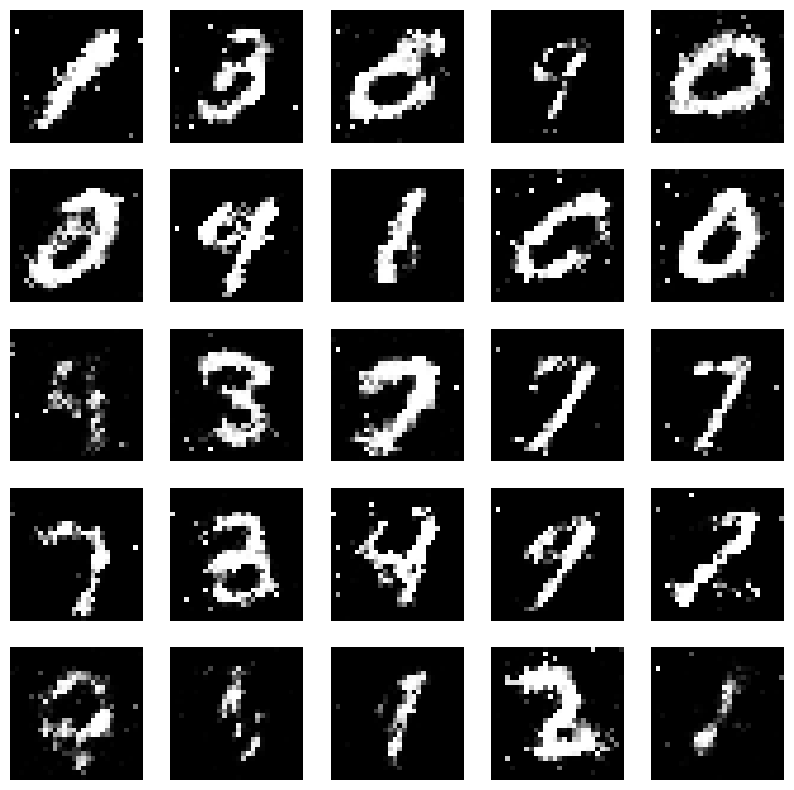

Epochs:  34


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/273 [00:00<01:52,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:54,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<01:55,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:48,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:44,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:42,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:38,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 12/273 [00:04<01:37,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:41,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 14/273 [00:05<01:46,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 15/273 [00:05<01:43,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:42,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:40,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:45,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:42,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:43,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:41,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:39,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<01:47,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 25/273 [00:10<01:53,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:54,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:49,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 28/273 [00:11<01:57,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:12<01:54,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:54,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:13<01:52,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:52,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:46,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:46,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:41,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 36/273 [00:15<01:35,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:31,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:35,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:17<01:36,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:28,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:18<01:38,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:37,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:34,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:34,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:29,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:28,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:31,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:24<01:33,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:25<01:38,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:42,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 63/273 [00:26<01:43,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:26<01:43,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:27<01:42,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 66/273 [00:27<01:41,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:33,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:28<01:32,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:29<01:30,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:27,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:22,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:19,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:19,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:15,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:14,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:14,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:18,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:16,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:14,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:14,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:18,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:18,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:17,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:15,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:13,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:12,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:36<01:10,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:08,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:37<01:07,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▎      | 92/273 [00:38<01:09,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:38<01:12,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:38<01:17,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 95/273 [00:39<01:20,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 97/273 [00:40<01:24,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:41<01:26,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 99/273 [00:41<01:26,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:41<01:24,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:21,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:16,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:19,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:14,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:44<01:10,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:09,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:10,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:45<01:08,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:46<01:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:03,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:03,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:04,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:48<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:02,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:00,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:49<01:00,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<00:59,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:01,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<01:00,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:01,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:52<00:59,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:52<01:01,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:52<01:04,  2.25it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 128/273 [00:53<01:08,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<01:06,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:54<01:09,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:55<01:11,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:55<01:09,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 133/273 [00:56<01:09,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:56<01:05,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<01:01,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:58,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 137/273 [00:57<00:56,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:57<00:54,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:51,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:59<00:50,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:50,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:50,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:00<00:49,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:47,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:48,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:01<00:48,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:47,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:46,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:45,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:46,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:03<00:46,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:03<00:44,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:47,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:45,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:04<00:43,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:45,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:44,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [01:06<00:47,  2.37it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 162/273 [01:07<00:49,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:07<00:48,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 164/273 [01:08<00:50,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 165/273 [01:08<00:48,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [01:09<00:49,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:09<00:49,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:10<00:51,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:47,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:11<00:46,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:45,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:42,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:41,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:12<00:40,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:39,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:13<00:38,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:37,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:15<00:35,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:35,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:16<00:33,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:17<00:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:18<00:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:18<00:33,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:34,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:33,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:21<00:35,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [01:21<00:35,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [01:21<00:33,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:33,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:22<00:33,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 200/273 [01:23<00:33,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:23<00:35,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 202/273 [01:24<00:34,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:24<00:32,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:25<00:30,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:28,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:26<00:28,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:27<00:24,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:23,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:22,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:22,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:24,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:29<00:23,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:31<00:21,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:32<00:18,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:33<00:19,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:34<00:19,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:18,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 230/273 [01:35<00:18,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:36<00:20,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:36<00:19,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:37<00:19,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:37<00:19,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:38<00:18,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 236/273 [01:38<00:16,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:38<00:16,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 238/273 [01:39<00:15,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:39<00:14,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:51<00:03,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:02,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6589633226394653 , 0.8000665903091431
1/1 [==============================] - 0s 35ms/step


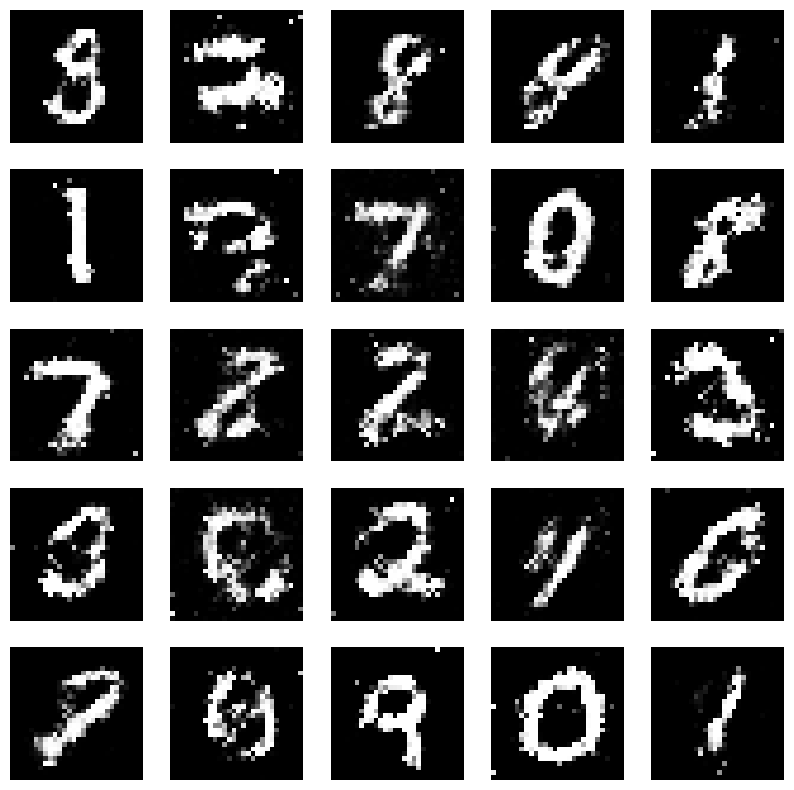

Epochs:  35


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:46,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:41,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:39,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:40,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:40,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:05<01:43,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:05<01:52,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:57,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:06<01:57,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 18/273 [00:07<02:09,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 19/273 [00:08<02:09,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 20/273 [00:08<02:04,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:08<02:02,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 22/273 [00:09<01:57,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:50,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:43,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:40,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:38,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:40,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:36,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:36,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:34,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:13<01:32,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:30,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:14<01:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:32,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:33,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:25,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:25,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:19<01:28,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:30,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:20<01:33,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:37,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:41,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 54/273 [00:22<01:44,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:22<01:46,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 56/273 [00:23<01:45,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:44,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:39,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:33,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:28,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:22,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:22,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:20,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:19,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:22,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:53,  1.78it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:30<01:42,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:35,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:28,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:24,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:32<01:20,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:18,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:21,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:22,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:34<01:22,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:34<01:27,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:35<01:27,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 85/273 [00:35<01:26,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:36<01:29,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:36<01:28,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:37<01:28,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:37<01:31,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:38<01:30,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:26,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:22,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:39<01:17,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:11,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:40<01:13,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:40<01:11,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:11,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:41<01:09,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:07,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:42<01:07,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:43<01:11,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:08,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:44<01:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:08,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:45<01:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:06,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:46<01:05,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:04,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:46<01:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:03,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:01,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:48<01:00,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:48<01:01,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:48<01:03,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:49<01:05,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:11,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:50<01:12,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:50<01:11,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:51<01:10,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 123/273 [00:51<01:13,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:52<01:14,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 125/273 [00:52<01:10,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<01:09,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:08,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:54<01:03,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<00:59,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:56,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:55<00:54,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:55<00:53,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:55,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:53,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:51,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:57<00:51,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:50,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:50,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:53,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 141/273 [00:59<00:54,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:53,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:52,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:00<00:53,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:51,  2.49it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 146/273 [01:01<00:53,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:01<00:50,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:01<00:49,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:02<00:48,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:50,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:54,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:03<00:56,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:04<00:57,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 154/273 [01:04<00:58,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:05<01:00,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 156/273 [01:05<00:59,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 157/273 [01:06<00:58,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:06<00:57,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:07<00:53,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:07<00:49,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:44,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:08<00:44,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:09<00:42,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:09<00:42,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:43,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:42,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:40,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:11<00:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:37,  2.70it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 172/273 [01:12<00:38,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:38,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:39,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:38,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:36,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:14<00:36,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:34,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:15<00:36,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:16<00:36,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:17<00:38,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 186/273 [01:17<00:39,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:18<00:40,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:18<00:40,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:41,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:19<00:40,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:20<00:40,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:20<00:40,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:21<00:40,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:21<00:38,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:22<00:35,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:33,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:23<00:31,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:30,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:23<00:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:24<00:30,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:24<00:28,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:25<00:26,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:26,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:24,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:24,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:28,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:25,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:28<00:24,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:29<00:24,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 214/273 [01:29<00:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:30<00:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:22,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:31<00:20,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:31<00:20,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:21,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:32<00:22,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:33<00:23,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:33<00:23,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:34<00:23,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 225/273 [01:34<00:22,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 226/273 [01:35<00:22,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 227/273 [01:35<00:22,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:36<00:21,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:36<00:20,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:36<00:19,  2.26it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:37<00:18,  2.28it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 232/273 [01:37<00:17,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:16,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:13,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:12,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:43<00:09,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:08,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:08,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:07,  2.82it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 252/273 [01:45<00:07,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:48<00:07,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:49<00:06,  2.13it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 262/273 [01:50<00:05,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.38it/s]


Perdidas:  0.6584299802780151 , 0.8340944051742554
1/1 [==============================] - 0s 28ms/step


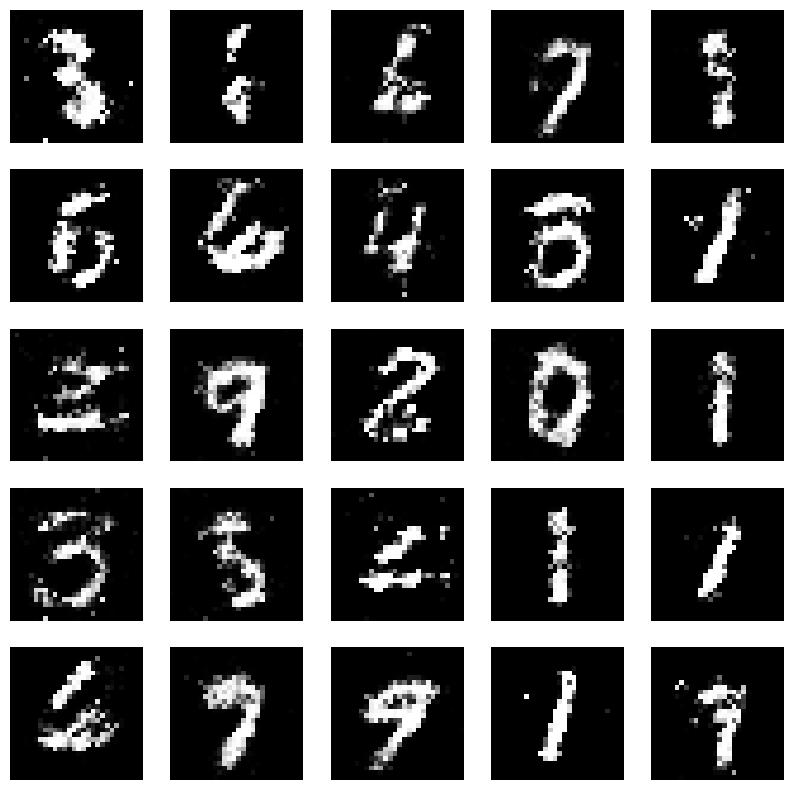

Epochs:  36


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:43,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:41,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:43,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:44,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:53,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:55,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:03<01:55,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 10/273 [00:04<01:58,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<02:02,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 12/273 [00:05<01:58,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 13/273 [00:05<02:03,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 14/273 [00:06<02:03,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:06<02:02,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 16/273 [00:07<01:57,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:51,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:45,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:42,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:37,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:34,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:32,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:34,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:32,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:33,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:38,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<01:35,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 30/273 [00:12<01:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:33,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:32,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 34/273 [00:13<01:30,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:30,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:14<01:31,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:31,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:31,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:16<01:31,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:40,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:17<01:44,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:49,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 46/273 [00:19<01:54,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 47/273 [00:19<01:56,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:20<01:54,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 49/273 [00:20<01:56,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:21<01:50,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:21<01:43,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:21<01:35,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:32,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:30,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:30,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:27,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:23,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:22,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:20,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:19,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:16,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:15,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:14,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:13,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:13,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:29<01:17,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:15,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:14,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:31<01:23,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 79/273 [00:32<01:20,  2.40it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 80/273 [00:32<01:25,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:33<01:29,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:33<01:29,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 83/273 [00:34<01:29,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 84/273 [00:34<01:29,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:35<01:27,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 86/273 [00:35<01:27,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:36<01:26,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:21,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:17,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:14,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:12,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:14,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:11,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:10,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:11,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:05,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:06,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:06,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:05,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:04,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:43<01:05,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:43<01:02,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:02,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:01,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:46<01:04,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 115/273 [00:47<01:06,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 116/273 [00:47<01:10,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:48<01:10,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<01:09,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:09,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:49<01:09,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:49<01:09,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:50<01:10,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:50<01:09,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<01:04,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<01:00,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 126/273 [00:52<00:59,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:58,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:52<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:58,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:53<00:56,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:54<00:58,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:55,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:53,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<00:53,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:55<00:55,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:54,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:52,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:50,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:57<00:50,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<00:53,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<00:52,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:50,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [00:59<00:48,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:48,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:47,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:46,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:45,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:00<00:46,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:01<00:52,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 151/273 [01:01<00:54,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:02<00:55,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 153/273 [01:02<00:55,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:03<00:54,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 155/273 [01:03<00:55,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:04<00:54,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [01:04<00:54,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 158/273 [01:05<00:56,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:54,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:50,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:47,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:45,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:07<00:44,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:07<00:42,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:08<00:42,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 166/273 [01:08<00:41,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:08<00:39,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:38,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:09<00:37,  2.75it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:09<00:37,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:39,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:39,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:38,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:11<00:38,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:12<00:38,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:12<00:37,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:36,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:13<00:36,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:14<00:34,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 185/273 [01:15<00:34,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:16<00:37,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:16<00:37,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:17<00:39,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 189/273 [01:17<00:38,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 190/273 [01:18<00:38,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:18<00:38,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:19<00:36,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:19<00:35,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:19<00:34,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:20<00:34,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:20<00:32,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:31,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:21<00:29,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:21<00:29,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:29,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:22<00:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:23<00:27,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:23<00:26,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:26,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:26,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:25<00:24,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:23,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:23,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:26<00:23,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:26<00:22,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:27<00:21,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:27<00:22,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:27<00:21,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:20,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:28<00:20,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:19,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:29<00:19,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:29<00:18,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:30<00:19,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:30<00:19,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:31<00:21,  2.38it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 224/273 [01:31<00:22,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 225/273 [01:32<00:23,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 226/273 [01:32<00:22,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:33<00:22,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 228/273 [01:33<00:21,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 229/273 [01:34<00:21,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:34<00:20,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:34<00:19,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:17,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:16,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:36<00:16,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:36<00:15,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:37<00:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:37<00:13,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:38<00:14,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 240/273 [01:38<00:14,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:38<00:13,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:39<00:12,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:40<00:10,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:40<00:10,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:10,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:41<00:09,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:42<00:08,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:43<00:07,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:43<00:07,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:44<00:07,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:45<00:07,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:45<00:06,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:06,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:47<00:05,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:47<00:05,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:48<00:04,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.6633089780807495 , 0.7840836048126221
1/1 [==============================] - 0s 30ms/step


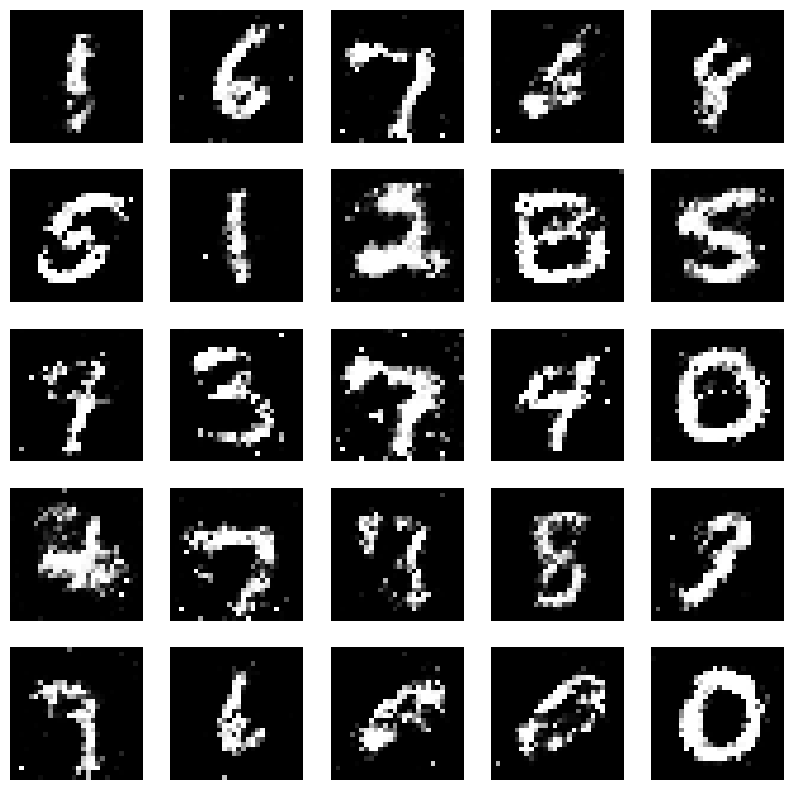

Epochs:  37


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:37,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:44,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<01:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:40,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:39,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:47,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:56,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/273 [00:03<02:06,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:11,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<02:11,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 12/273 [00:05<02:11,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 13/273 [00:05<02:09,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 14/273 [00:06<02:10,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:06<02:00,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<01:52,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:49,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:44,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:34,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:35,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:33,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:32,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:33,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:30,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:31,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:27,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:14<01:25,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:29,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:15<01:30,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:28,  2.67it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 39/273 [00:15<01:27,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:34,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:39,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:17<01:41,  2.25it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 45/273 [00:18<01:44,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:18<01:45,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:19<01:44,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:19<01:47,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:51,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:20<01:49,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:44,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:21<01:37,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:33,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:34,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:32,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:28,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:31,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:26,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:29,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:24<01:27,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:28,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:29,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:24,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:21,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:27<01:20,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:16,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:16,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 73/273 [00:29<01:15,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:30<01:14,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:13,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:13,  2.67it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 77/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:32<01:22,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 79/273 [00:32<01:25,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:32<01:26,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:33<01:29,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:34<01:31,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:34<01:31,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 84/273 [00:34<01:30,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:35<01:32,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:25,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:23,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 88/273 [00:36<01:19,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:17,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:15,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:12,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:09,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:08,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:05,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:04,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:04,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:04,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:41<01:04,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 102/273 [00:41<01:07,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:42<01:04,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:04,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:43<01:04,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:03,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:05,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:09,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:46<01:10,  2.26it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 115/273 [00:47<01:13,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:47<01:10,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:48<01:08,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:48<01:08,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:49<01:18,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 120/273 [00:49<01:17,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:50<01:10,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<01:05,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<01:04,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 124/273 [00:51<00:59,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:58,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:57,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:52<00:58,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:57,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<00:54,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<00:54,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:54<00:53,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:54<00:52,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:55<00:52,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:55<00:52,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:56<00:56,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:55,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:54,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:57<00:52,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:59,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:55,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:53,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:59<00:51,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:54,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:00<00:56,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 148/273 [01:01<00:57,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [01:01<00:58,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<01:00,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [01:02<01:07,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 152/273 [01:03<01:07,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 153/273 [01:03<01:04,  1.86it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:04<00:57,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:55,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:51,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 157/273 [01:05<00:48,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:05<00:46,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:06<00:42,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:42,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:42,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:41,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:41,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:38,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:37,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:11<00:36,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:37,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:36,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [01:12<00:36,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:35,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:12<00:34,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:33,  2.80it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 179/273 [01:13<00:33,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 181/273 [01:14<00:39,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:15<00:42,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:15<00:42,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:16<00:43,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:41,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:17<00:41,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [01:17<00:40,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:18<00:41,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 189/273 [01:18<00:42,  1.96it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:19<00:39,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:19<00:36,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:32,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:31,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:33,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:30,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:30,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:25,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:24,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:24,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:24,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:24,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:23,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:22,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:23,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:29<00:24,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:29<00:26,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 218/273 [01:30<00:25,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:30<00:25,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 220/273 [01:31<00:24,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:31<00:24,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:32<00:23,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:32<00:22,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:22,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:20,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:34<00:20,  2.22it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:14,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:10,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:09,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:09,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.53it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 255/273 [01:45<00:08,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:46<00:07,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:48<00:06,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:05,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6847660541534424 , 0.7733235955238342
1/1 [==============================] - 0s 28ms/step


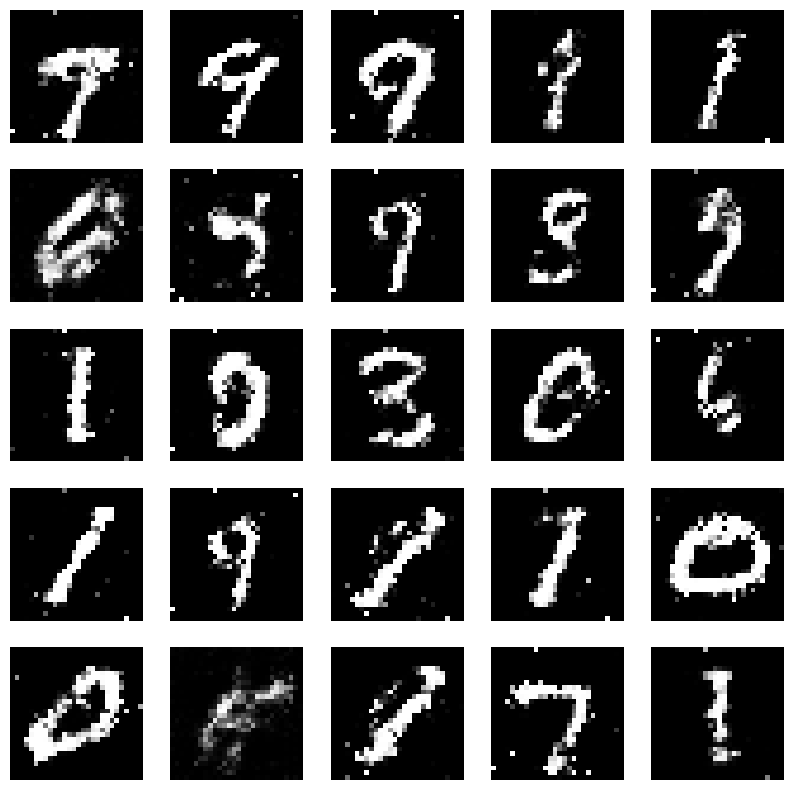

Epochs:  38


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:36,  2.83it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:49,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:54,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<01:58,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 5/273 [00:02<02:01,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/273 [00:02<02:08,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 7/273 [00:03<02:16,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<02:14,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:04<02:12,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:04<02:13,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:05<02:06,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<02:03,  2.12it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▍         | 13/273 [00:06<01:54,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:47,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:42,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:07<01:41,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:38,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:35,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:35,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:34,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:33,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:10<01:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:32,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:32,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:34,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:12<01:37,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:31,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:28,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:29,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:27,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:34,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:36,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:41,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:16<01:42,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 42/273 [00:17<01:43,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:17<01:47,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:18<01:50,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:49,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:48,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:49,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 48/273 [00:20<01:41,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:34,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:21<01:32,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:25,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 53/273 [00:22<01:23,  2.63it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 54/273 [00:22<01:23,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:22,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:20,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:20,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:23<01:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:19,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:19,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:17,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:25<01:18,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:18,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:21,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:23,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:20,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:30<01:22,  2.40it/s]

4/4 [==============================] - 0s 17ms/step


 28%|██▊       | 76/273 [00:31<01:32,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:31<01:31,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▊       | 78/273 [00:32<01:32,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:32<01:34,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 80/273 [00:33<01:34,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:33<01:34,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 82/273 [00:34<01:35,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 83/273 [00:34<01:33,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:35<01:27,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:24,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:19,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:36<01:16,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:14,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:16,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:13,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:11,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▎      | 92/273 [00:38<01:13,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:12,  2.46it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 96/273 [00:39<01:10,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:09,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:05,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:04,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:28,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:21,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:43<01:16,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:11,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:11,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:08,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:45<01:09,  2.38it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 110/273 [00:45<01:14,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 111/273 [00:46<01:17,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 112/273 [00:47<01:22,  1.96it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:47<01:22,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:48<01:19,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:48<01:16,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:16,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:49<01:14,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:49<01:11,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:50<01:12,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:07,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:51<01:03,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<01:00,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<00:59,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<00:57,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:56,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:56,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<00:55,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:54,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:54<00:55,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:54,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:54,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:54,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:53,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:56<00:53,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.58it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 136/273 [00:56<00:56,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:53,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:57<00:52,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:51,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:50,  2.61it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 141/273 [00:58<00:50,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:50,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:59<00:49,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [01:00<00:53,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [01:00<00:56,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:01<00:58,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:01<00:59,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:01<00:59,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:02<00:58,  2.11it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 150/273 [01:02<00:59,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 151/273 [01:03<00:59,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:03<00:59,  2.02it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:04<00:55,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:53,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:50,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:05<00:50,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:06<00:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:07<00:43,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:41,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:40,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:40,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:38,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:39,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:40,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:39,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:11<00:37,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▎   | 174/273 [01:12<00:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:15<00:39,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:15<00:39,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 183/273 [01:16<00:40,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 184/273 [01:16<00:40,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:39,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:38,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:40,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:18<00:38,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:19<00:42,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:38,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:19<00:35,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:20<00:34,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:31,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 199/273 [01:22<00:30,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:27,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:25,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 214/273 [01:29<00:27,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 215/273 [01:29<00:27,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:30<00:27,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:30<00:27,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:31<00:27,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:31<00:26,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:32<00:26,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:32<00:25,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:22,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:33<00:21,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:20,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.57it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:41<00:13,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:42<00:12,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:42<00:11,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.30it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 252/273 [01:45<00:09,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:45<00:08,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:46<00:09,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:47<00:08,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6485525369644165 , 0.8034522533416748
1/1 [==============================] - 0s 30ms/step


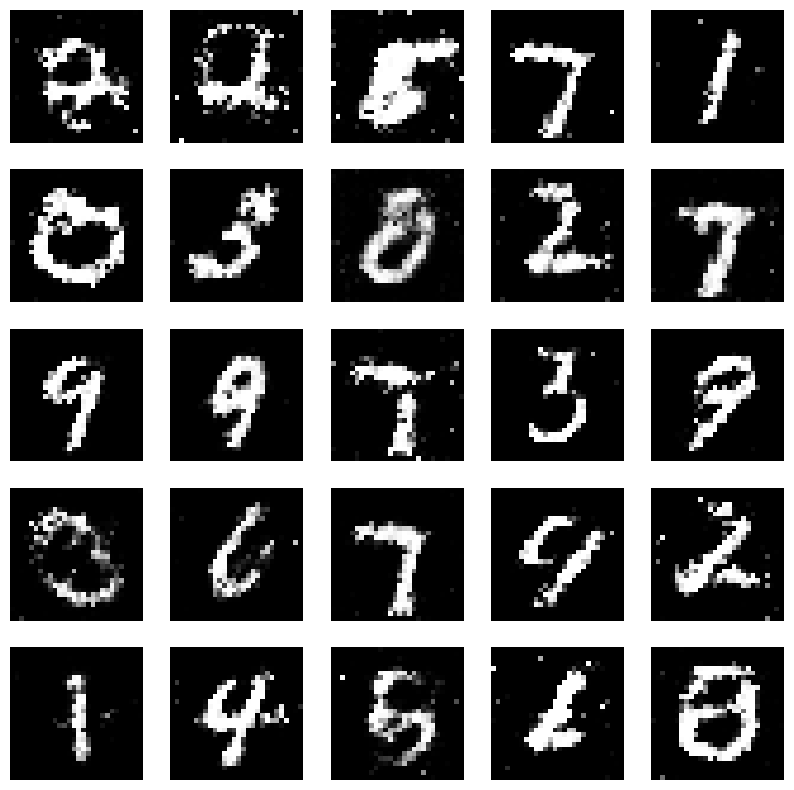

Epochs:  39


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/273 [00:00<01:56,  2.34it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/273 [00:00<02:14,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/273 [00:01<02:26,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 4/273 [00:02<02:24,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 5/273 [00:02<02:22,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/273 [00:03<02:22,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 7/273 [00:03<02:18,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:04<02:22,  1.86it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<02:11,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:05<02:01,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<01:53,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:48,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:06<01:47,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:45,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:42,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 16/273 [00:07<01:39,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:43,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:08<01:42,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:40,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:42,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:09<01:39,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:31,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:31,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:33,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:12<01:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:31,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:28,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:13<01:27,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:39,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 36/273 [00:15<01:44,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:15<01:41,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 38/273 [00:16<01:43,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:50,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:17<01:53,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 41/273 [00:17<01:53,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 42/273 [00:18<01:55,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:18<01:54,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:19<01:44,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:19<01:38,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:33,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:20<01:34,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:21<01:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:24,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:22<01:24,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:22<01:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:22,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:21,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:24<01:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:22,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:21,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:23,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:25<01:20,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:17,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:26<01:17,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:17,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:22,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:18,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:29<01:22,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:29<01:29,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:27,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:33,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:29,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:31<01:32,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:31<01:29,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:26,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:32<01:28,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 79/273 [00:33<01:29,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:33<01:23,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:34<01:21,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:16,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:14,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:11,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:10,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:09,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:36<01:09,  2.67it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 90/273 [00:37<01:17,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:14,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:16,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:13,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:39<01:12,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:39<01:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:41<01:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:10,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:10,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:09,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:10,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:08,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:43<01:12,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:44<01:11,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:44<01:15,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 108/273 [00:44<01:15,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:45<01:16,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:17,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:46<01:17,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 112/273 [00:47<01:20,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:47<01:15,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:10,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:06,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:04,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:49<00:59,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:03,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:01,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:58,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<00:59,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:57,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:55,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:52<00:55,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:55,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:57,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:55,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:54<00:53,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:55<00:53,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:55<00:53,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<00:52,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:54,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 138/273 [00:57<00:57,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:57<00:57,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<01:01,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:58<01:01,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<01:02,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:59<01:01,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [01:00<01:04,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [01:00<01:02,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:01<01:01,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:01<01:01,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:56,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:53,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:53,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:50,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:03<00:48,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:44,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:44,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:44,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:44,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:06<00:46,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:44,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:44,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:07<00:44,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:43,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:08<00:42,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:43,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:42,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.57it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 170/273 [01:10<00:40,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:10<00:39,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:41,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:12<00:43,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:13<00:44,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 177/273 [01:13<00:44,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:14<00:43,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:14<00:46,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:15<00:45,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 181/273 [01:15<00:45,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:16<00:41,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:38,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:37,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:37,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:35,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:18<00:34,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:34,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:32,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:19<00:32,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:20<00:31,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:30,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:27,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:25,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:25,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:24,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 208/273 [01:26<00:27,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:26<00:28,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:27<00:29,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 211/273 [01:27<00:28,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 212/273 [01:28<00:29,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:28,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 214/273 [01:29<00:28,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:26,  2.16it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 216/273 [01:30<00:25,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:30<00:24,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:21,  2.56it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.62it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 223/273 [01:32<00:18,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:18,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.55it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:35<00:15,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:14,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:14,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:15,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:14,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.30it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 243/273 [01:40<00:13,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 244/273 [01:41<00:13,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:13,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:42<00:12,  2.15it/s]

4/4 [==============================] - 0s 19ms/step


 90%|█████████ | 247/273 [01:42<00:12,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:43<00:12,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:43<00:11,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:44<00:11,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:09,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.47it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6628403663635254 , 0.7840388417243958
1/1 [==============================] - 0s 46ms/step


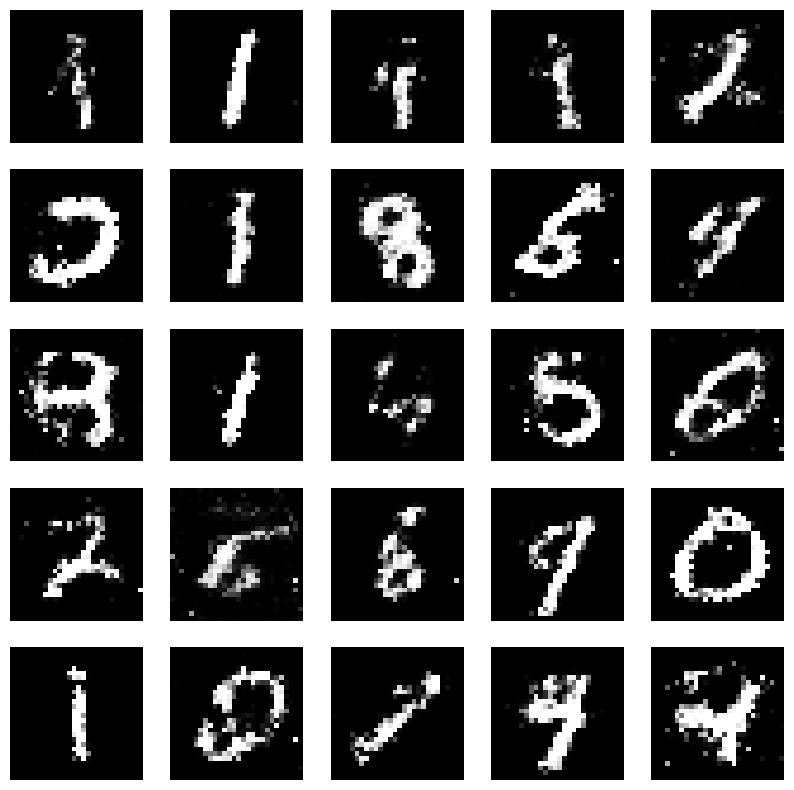

Epochs:  40


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<01:43,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:45,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:52,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:43,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:43,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:42,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:48,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:03<01:45,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:36,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:36,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:37,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:06<01:36,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:40,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:08<01:43,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:40,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:39,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:39,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 27/273 [00:10<01:44,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:48,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:11<01:48,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<01:46,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:48,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:12<01:47,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 33/273 [00:13<01:49,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:13<01:47,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 35/273 [00:14<01:47,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:43,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:15<01:39,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:35,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:15<01:38,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:35,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:35,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:31,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:34,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:33,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:18<01:30,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:28,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:23,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:21,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:20<01:22,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:20<01:21,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:21<01:20,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:21<01:24,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:22,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:22,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:22<01:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:28,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:23<01:30,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:35,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:37,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:25<01:39,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:40,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:39,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:27<01:42,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 67/273 [00:27<01:40,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:28<01:40,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:42,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:34,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:28,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:29<01:26,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:30<01:26,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:30<01:23,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:26,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:23,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:20,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:18,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:17,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:15,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:13,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:14,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:23,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 84/273 [00:34<01:24,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:24,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:18,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:13,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:10,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:09,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:12,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:09,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:12,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:16,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 96/273 [00:39<01:20,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:40<01:23,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:40<01:23,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 99/273 [00:41<01:22,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 100/273 [00:41<01:24,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:42<01:28,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:24,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:43<01:22,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:43<01:21,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:44<01:16,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:11,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:08,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:45<01:06,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:04,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:04,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:04,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:03,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:07,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:05,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:49<01:04,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:04,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<01:02,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:50<01:04,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<01:00,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<00:57,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 124/273 [00:51<00:56,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<00:56,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:55,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:52<00:54,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<00:56,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 130/273 [00:54<01:01,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 131/273 [00:54<01:03,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 132/273 [00:55<01:05,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 133/273 [00:55<01:06,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:56<01:06,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:56<01:06,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<01:05,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:57<01:04,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:57<01:06,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<01:02,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:59,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:55,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:57,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:57,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 144/273 [01:00<00:53,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:52,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:01<00:53,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:01<00:51,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<00:52,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:52,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:50,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:03<00:49,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:03<00:49,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:48,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:49,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:05<00:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:06<00:47,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:45,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:06<00:44,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:42,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:44,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:08<00:46,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [01:09<00:50,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 166/273 [01:09<00:52,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:10<00:53,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:10<00:53,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:11<00:52,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 170/273 [01:11<00:50,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:12<00:48,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:12<00:47,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:13<00:44,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:13<00:44,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:43,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:14<00:41,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:14<00:39,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:15<00:39,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:15<00:39,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:15<00:38,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:37,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:37,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:17<00:37,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:17<00:36,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:17<00:37,  2.37it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 186/273 [01:18<00:35,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:36,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:19<00:34,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:33,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 190/273 [01:19<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:20<00:31,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:21<00:31,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:34,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:22<00:31,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:31,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:23<00:32,  2.30it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 199/273 [01:23<00:36,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 200/273 [01:24<00:35,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:24<00:36,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:25<00:36,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 203/273 [01:26<00:35,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:26<00:34,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:31,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:27<00:30,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:27<00:28,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:28<00:26,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:28<00:26,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:26,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:29<00:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:29<00:24,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:30<00:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:30<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:30<00:23,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:31<00:22,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 217/273 [01:31<00:22,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:32<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:32<00:21,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:32<00:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:33<00:19,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:20,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:34<00:20,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:20,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:35<00:19,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:35<00:19,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:36<00:18,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:36<00:17,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:37<00:18,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:37<00:19,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:38<00:19,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:38<00:19,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:39<00:19,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:39<00:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:39<00:17,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:40<00:17,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 238/273 [01:40<00:16,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:41<00:15,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:42<00:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:42<00:12,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:43<00:10,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:43<00:10,  2.65it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:44<00:09,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:45<00:09,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:45<00:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:47<00:06,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:05,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:49<00:04,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.6578311920166016 , 0.7510017156600952
1/1 [==============================] - 0s 29ms/step


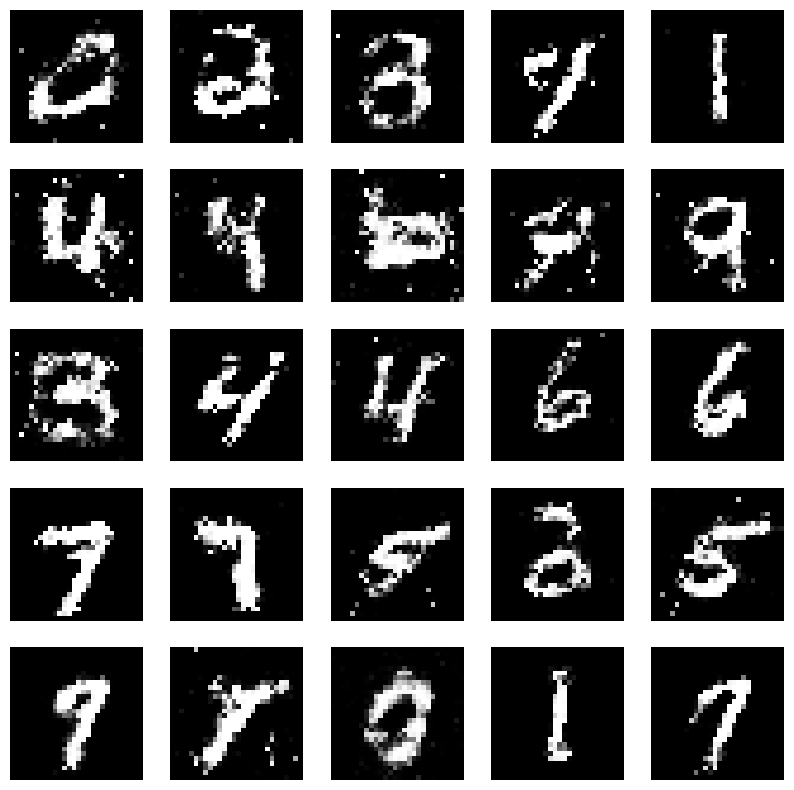

Epochs:  41


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:40,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:36,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:38,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:41,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:38,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:02<01:36,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:36,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:36,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:36,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:04<01:35,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:35,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:49,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:47,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:42,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:41,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:07<01:46,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:51,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:08<01:50,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 23/273 [00:09<01:53,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:56,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:10<01:55,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:54,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:11<01:57,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:56,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:46,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:12<01:47,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:12<01:42,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:38,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:13<01:48,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:42,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:38,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:37,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:37,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:34,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:32,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:30,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:24,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:23,  2.72it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:19<01:22,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:19<01:22,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:20<01:21,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:19,  2.78it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:20<01:19,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:27,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:22<01:34,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 56/273 [00:22<01:36,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 57/273 [00:23<01:40,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 58/273 [00:23<01:45,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:47,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:45,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:43,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 62/273 [00:25<01:50,  1.91it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:26<01:40,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:31,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:26,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:26,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:24,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:28<01:27,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:22,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:19,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:18,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:15,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:15,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:13,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:13,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:12,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:12,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:33<01:11,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:09,  2.76it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 83/273 [00:33<01:09,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:34<01:08,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:09,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:34<01:10,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:09,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:35<01:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:13,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 90/273 [00:36<01:18,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:37<01:22,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:26,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:26,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:38<01:24,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 95/273 [00:39<01:25,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:39<01:23,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:22,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:22,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:40<01:19,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:14,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:41<01:13,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:09,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:07,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:05,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:00,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:00,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:01,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:01,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<00:58,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:48<00:57,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:48<00:56,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<00:57,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:49<00:57,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:56,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:50<00:58,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:51<01:04,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:51<01:05,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:51<01:05,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<01:06,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 129/273 [00:53<01:11,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 130/273 [00:53<01:11,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<01:11,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:54<01:10,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<01:07,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<01:02,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:59,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:56,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:52,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:51,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:53,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<00:51,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:50,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:58<00:49,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:51,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:51,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:51,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:50,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [01:01<00:47,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:47,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:01<00:47,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:49,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 153/273 [01:02<00:47,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:48,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:46,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:04<01:02,  1.88it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:57,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:05<00:55,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:05<00:55,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:06<00:57,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:55,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 162/273 [01:07<00:55,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:07<00:54,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:08<00:55,  1.96it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:08<00:55,  1.96it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:09<00:53,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 167/273 [01:09<00:52,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:48,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:47,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:44,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:45,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 172/273 [01:11<00:43,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:41,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:40,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:39,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:39,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:37,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:14<00:35,  2.65it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:15<00:35,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:16<00:34,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:16<00:34,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:30,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:20<00:32,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:34,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:21<00:34,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:22<00:34,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 199/273 [01:22<00:34,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 200/273 [01:23<00:33,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 201/273 [01:23<00:34,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:24<00:34,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:32,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:30,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:29,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:22,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:22,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 220/273 [01:31<00:21,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:17,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:34<00:18,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 229/273 [01:34<00:20,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 230/273 [01:35<00:20,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:36<00:21,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 232/273 [01:36<00:21,  1.94it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:37<00:20,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 234/273 [01:37<00:20,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:19,  1.93it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:18,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:16,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:15,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:14,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:09,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.72it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:06,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:46<00:07,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.14it/s]

4/4 [==============================] - 0s 19ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6772732734680176 , 0.7555912733078003
1/1 [==============================] - 0s 29ms/step


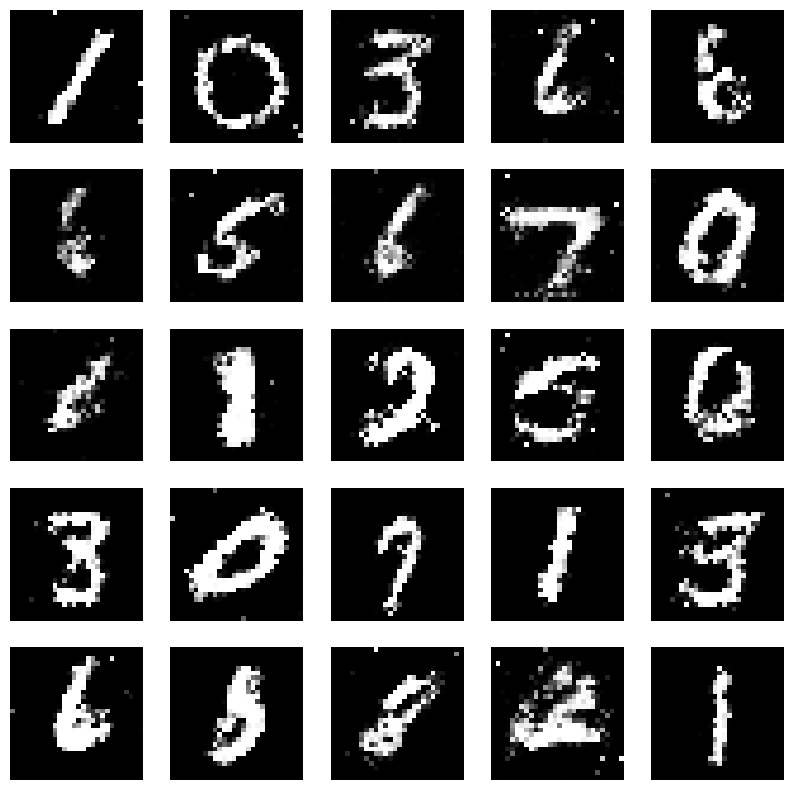

Epochs:  42


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:51,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<01:43,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:51,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:46,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:43,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:48,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:44,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:45,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<01:42,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:43,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:44,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 16/273 [00:06<01:51,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:07<01:58,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:59,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<02:03,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 20/273 [00:08<02:04,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 21/273 [00:09<02:01,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<02:00,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 23/273 [00:10<02:03,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:55,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:46,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:11<01:38,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:40,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:37,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:34,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:13<01:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:32,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:31,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:14<01:32,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 36/273 [00:14<01:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:28,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:31,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:32,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:25,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:18<01:25,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:26,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 49/273 [00:19<01:25,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:28,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:20<01:32,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:21<01:35,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 53/273 [00:21<01:40,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:38,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 55/273 [00:22<01:46,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 56/273 [00:23<01:48,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:47,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:39,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:31,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:29,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:26,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:22,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:22,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:28<01:17,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:13,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:17,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:31<01:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:32<01:16,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:15,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:33<01:12,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:20,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:23,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:27,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:27,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:36<01:25,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 89/273 [00:36<01:24,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:27,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:37<01:27,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:27,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 93/273 [00:38<01:22,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:17,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:39<01:20,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:17,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:13,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:40<01:10,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:09,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:08,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:06,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:10,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:08,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:06,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:05,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:04,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:45<01:03,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:04,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:09,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:05,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:12,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:10,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:49<01:12,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:50<01:12,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:50<01:10,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:51<01:10,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:51<01:12,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 125/273 [00:52<01:13,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<01:11,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<01:04,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<01:03,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:53<00:59,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 130/273 [00:54<00:58,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:54<00:59,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:55<00:56,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:55,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:56<00:54,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:58,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:55,  2.42it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 139/273 [00:57<00:54,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:51,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:51,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:49,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [00:59<00:51,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:51,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:51,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:49,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:48,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:46,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:46,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:45,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:03<00:52,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 154/273 [01:03<00:54,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:54,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:56,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:05<00:55,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 158/273 [01:05<00:54,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 159/273 [01:06<00:55,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 160/273 [01:06<00:55,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:51,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:48,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:08<00:45,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:43,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:42,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:42,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:39,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:38,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:15<00:35,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:15<00:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:16<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:34,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 188/273 [01:17<00:36,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:18<00:38,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 190/273 [01:18<00:38,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:42,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 192/273 [01:20<00:39,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:39,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 194/273 [01:20<00:38,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:21<00:35,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:33,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:30,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:26,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:26,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:19,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:32<00:21,  2.37it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 224/273 [01:32<00:21,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 225/273 [01:33<00:21,  2.28it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 226/273 [01:33<00:21,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:21,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:34<00:20,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 229/273 [01:35<00:21,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 230/273 [01:35<00:20,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:35<00:19,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 232/273 [01:36<00:17,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:16,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:39<00:12,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:07,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 256/273 [01:45<00:07,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:47<00:06,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:48<00:05,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.42it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.680692195892334 , 0.8287519812583923
1/1 [==============================] - 0s 41ms/step


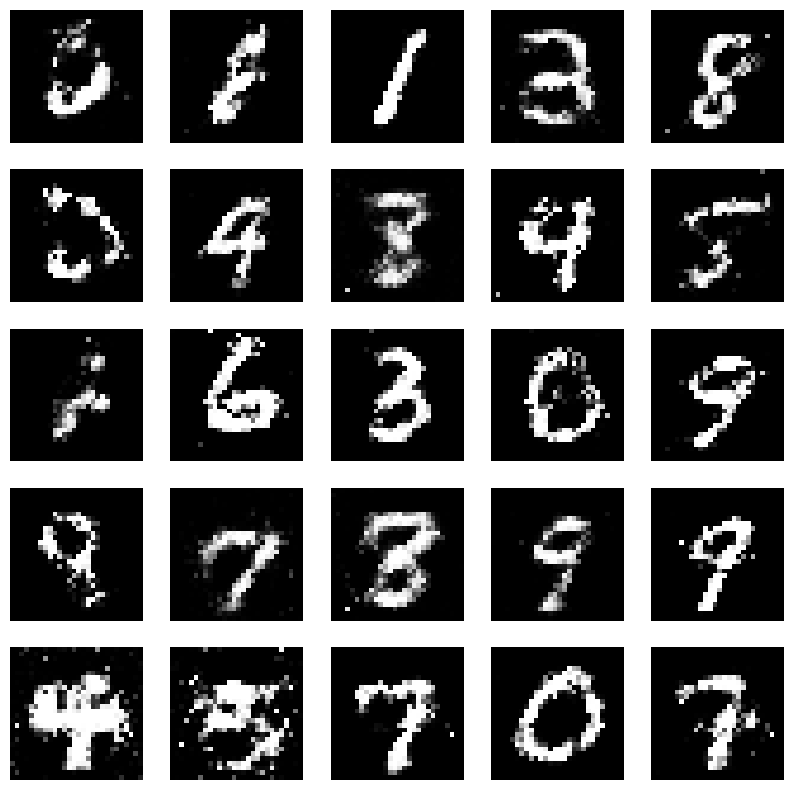

Epochs:  43


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:07,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:00<01:51,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:47,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:41,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:50,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:03<01:53,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 10/273 [00:04<02:00,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:57,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 12/273 [00:05<02:04,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:05<02:03,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:06<02:01,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<02:13,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 16/273 [00:07<02:19,  1.85it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<02:06,  2.03it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:08<01:57,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:51,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:45,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:43,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:09<01:39,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:36,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:35,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:11<01:36,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:35,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:13<01:32,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:31,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:40,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:42,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:42,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:38,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:34,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:36,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:17<01:40,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 42/273 [00:17<01:47,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:18<01:48,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 44/273 [00:18<01:46,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:19<01:47,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 46/273 [00:19<01:47,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 47/273 [00:20<01:48,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 48/273 [00:20<01:48,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:21<01:49,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:21<01:44,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:22<01:37,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:22<01:33,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:30,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:23<01:30,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:23<01:28,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:26,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:26,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:25<01:23,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:26<01:25,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:26<01:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:20,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:20,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:27<01:18,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:27<01:17,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:25,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:29<01:25,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:23,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:19,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:30<01:17,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:15,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:31<01:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:19,  2.50it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 76/273 [00:32<01:24,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:26,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:32<01:25,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 79/273 [00:33<01:29,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:34<01:32,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 82/273 [00:35<01:40,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 83/273 [00:35<01:38,  1.92it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:35<01:31,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:36<01:27,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:22,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:37<01:20,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:37<01:16,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:16,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:38<01:12,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:39<01:09,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:39<01:10,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:07,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:40<01:08,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 96/273 [00:40<01:07,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:41<01:10,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:41<01:13,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:07,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:05,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:43<01:04,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:07,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:44<01:06,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:44<01:04,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:45<01:03,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:46<01:07,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 111/273 [00:46<01:11,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:47<01:16,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 113/273 [00:47<01:12,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:48<01:14,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:48<01:13,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 116/273 [00:49<01:12,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:49<01:13,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 118/273 [00:50<01:13,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<01:07,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<01:05,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:51<01:02,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<01:02,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:00,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:52<01:01,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:59,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<00:57,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<00:57,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<00:56,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:54<00:55,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:54,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:56,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:55,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:56<00:57,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<00:56,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<00:54,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:53,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:51,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:51,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:59<00:49,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:59<00:49,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [00:59<00:48,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:00<00:50,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:53,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:01<00:53,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:01<00:56,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:02<00:57,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:02<00:57,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 150/273 [01:03<00:57,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:03<00:58,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 152/273 [01:04<00:59,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:56,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:54,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:50,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:05<00:48,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:06<00:46,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:44,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:07<00:45,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:44,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:51,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:09<00:49,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:09<00:45,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:43,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:42,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:10<00:40,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:11<00:38,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:11<00:37,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:12<00:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:12<00:40,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:38,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:13<00:40,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:39,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 178/273 [01:14<00:41,  2.30it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [01:15<00:43,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:15<00:43,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:45,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 182/273 [01:16<00:45,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:17<00:45,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 184/273 [01:17<00:43,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:18<00:43,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:41,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:19<00:40,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:37,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:19<00:36,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:20<00:35,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:20<00:33,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:21<00:32,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:21<00:31,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:22<00:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:29,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:28,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:23<00:29,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:23<00:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:24<00:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:24<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:30,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:25<00:29,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:27,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:27<00:26,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:26,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:28<00:25,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:29<00:25,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:29<00:27,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:30<00:27,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:30<00:26,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:31<00:27,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 217/273 [01:31<00:26,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 218/273 [01:32<00:26,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:32<00:26,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 220/273 [01:33<00:25,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:33<00:23,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:33<00:22,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:34<00:20,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:34<00:20,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:35<00:17,  2.67it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 228/273 [01:36<00:16,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:36<00:18,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:37<00:17,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 232/273 [01:37<00:16,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.51it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:14,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:42<00:12,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:43<00:11,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:44<00:10,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:10,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:10,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 251/273 [01:45<00:10,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 252/273 [01:46<00:10,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:46<00:09,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:47<00:08,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:47<00:08,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:48<00:07,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:49<00:05,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.43it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.38it/s]


Perdidas:  0.6812358498573303 , 0.7606872320175171
1/1 [==============================] - 0s 60ms/step


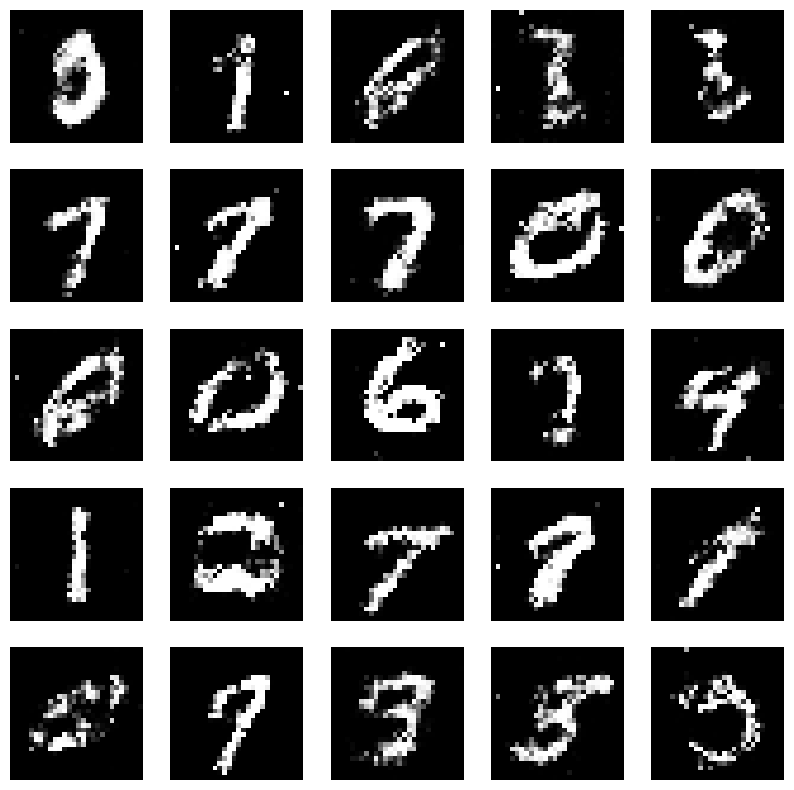

Epochs:  44


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/273 [00:00<02:03,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:00<02:03,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:06,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 4/273 [00:01<02:05,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<02:08,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<02:08,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:03<02:04,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:03<02:06,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:04<01:57,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:48,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:38,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:05<01:38,  2.64it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 15/273 [00:06<01:37,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:33,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:32,  2.76it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:34,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:08<01:31,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:33,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:32,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:33,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:32,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:33,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:31,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:31,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:31,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:11<01:31,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:11<01:31,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:31,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:12<01:30,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:28,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:13<01:25,  2.77it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 36/273 [00:14<01:29,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:14<01:36,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:44,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 39/273 [00:15<01:47,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:47,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 41/273 [00:16<01:50,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:54,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 43/273 [00:17<01:51,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:55,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:18<01:51,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:49,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:40,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:33,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:32,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:33,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:28,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:21<01:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:26,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:24,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:22<01:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:28,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:24,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:21,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:24<01:21,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:19,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:20,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:19,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:17,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:26<01:19,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:27<01:21,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:19,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:27<01:19,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:28<01:18,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:28<01:24,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:29<01:25,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:29<01:29,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:34,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:30<01:34,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:31<01:35,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:31<01:33,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▊       | 78/273 [00:32<01:34,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 79/273 [00:32<01:32,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:31,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:28,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:28,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:34<01:23,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:19,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:17,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:35<01:18,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:14,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:12,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:11,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:37<01:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:08,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:38<01:12,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:39<01:07,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:05,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:06,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 99/273 [00:40<01:09,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:08,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:08,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:08,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:06,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 106/273 [00:43<01:11,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:14,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:44<01:14,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:44<01:14,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:17,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 111/273 [00:45<01:17,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:46<01:15,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:46<01:18,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:17,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:11,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:06,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:04,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<01:01,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:49<01:00,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:49<00:58,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:50<00:58,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:50<00:58,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:56,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:51<00:54,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:53,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:57,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<00:55,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:54<00:55,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:54<00:54,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 135/273 [00:55<00:57,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:55<00:56,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:58,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:54,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:56,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:54,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:58<00:54,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:58<00:55,  2.34it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:59<00:58,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:59<00:59,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:59<00:58,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 146/273 [01:00<01:00,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:00<01:01,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:01<01:01,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:01<00:57,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [01:02<00:52,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:02<00:51,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:02<00:48,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:46,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:46,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:04<00:48,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:46,  2.49it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:05<00:44,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:44,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:46,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:45,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:41,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:08<00:43,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:08<00:41,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:08<00:40,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:39,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:09<00:39,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:39,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:11<00:38,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:40,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:12<00:42,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:44,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:46,  2.05it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▌   | 179/273 [01:14<00:46,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:45,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:15<00:47,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:15<00:46,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 183/273 [01:16<00:46,  1.95it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:16<00:43,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:17<00:42,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:40,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:38,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:18<00:37,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:18<00:35,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:19<00:34,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:30,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:27,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:26,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:27<00:36,  1.75it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:28<00:33,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 212/273 [01:28<00:33,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 213/273 [01:29<00:31,  1.93it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:30,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:30<00:30,  1.93it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:30<00:30,  1.88it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 217/273 [01:31<00:27,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:31<00:26,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:31<00:24,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:23,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:22,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:33<00:22,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:21,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:34<00:20,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:34<00:19,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:35<00:19,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:36<00:17,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:37<00:16,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:16,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▊ | 242/273 [01:41<00:13,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:41<00:13,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 245/273 [01:42<00:12,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:13,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:43<00:12,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:44<00:12,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:11,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:11,  2.06it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:05,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:49<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6549345254898071 , 0.7402302026748657
1/1 [==============================] - 0s 34ms/step


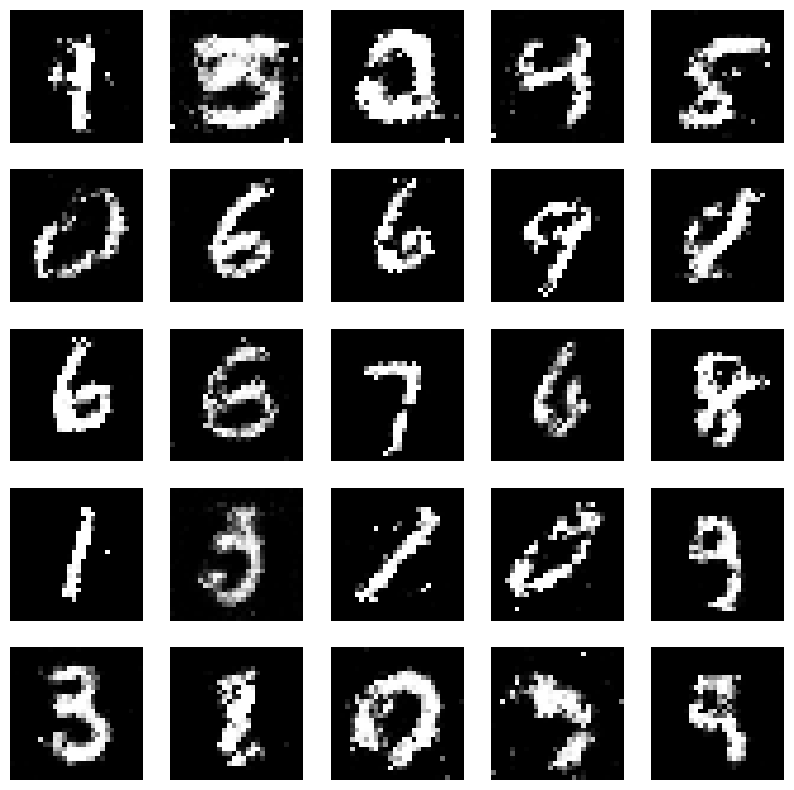

Epochs:  45


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/273 [00:00<02:17,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/273 [00:01<02:18,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:10,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:53,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:52,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:49,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:03<01:49,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:48,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<01:42,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:35,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:42,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:06<01:40,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 16/273 [00:06<01:43,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:08<01:37,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:38,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:35,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:35,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 29/273 [00:11<01:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:11<01:35,  2.54it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 31/273 [00:12<01:40,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:12<01:45,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:50,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 34/273 [00:13<01:49,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:14<01:49,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 36/273 [00:14<01:49,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 37/273 [00:15<01:49,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:48,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:42,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:42,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:35,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:26,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:26,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:21,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:21,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:21<01:22,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:24,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:22<01:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:25,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:23<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:23,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:24<01:21,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:25<01:20,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:25<01:19,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:26<01:27,  2.39it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 66/273 [00:26<01:29,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:27<01:29,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 68/273 [00:27<01:32,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 69/273 [00:28<01:37,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 70/273 [00:28<01:39,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:35,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:29<01:37,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:35,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:29,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:23,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:31<01:22,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:16,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 79/273 [00:32<01:16,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:14,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 81/273 [00:33<01:13,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:12,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:10,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:11,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:11,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:10,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:35<01:10,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:36<01:08,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:09,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:36<01:08,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:07,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:37<01:08,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:37<01:07,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:10,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:38<01:08,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:07,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:39<01:06,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:39<01:07,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:40<01:13,  2.37it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 101/273 [00:40<01:16,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:17,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:19,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 104/273 [00:42<01:20,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:42<01:19,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:43<01:16,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:43<01:14,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:44<01:18,  2.11it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:44<01:13,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:10,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:08,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:45<01:10,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:06,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<01:05,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:05,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:04,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:47<01:01,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:01,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<00:59,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:49<00:59,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<00:58,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:49<00:59,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:58,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:56,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:50<00:56,  2.64it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 126/273 [00:51<00:59,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:51<00:57,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:56,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:52<00:54,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:52<00:53,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:53<00:53,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:53<00:52,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:54<00:56,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:54<00:57,  2.43it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 135/273 [00:54<00:58,  2.35it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 136/273 [00:55<00:59,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:55<00:59,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:56<01:01,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:56<01:03,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:57<01:03,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 141/273 [00:57<01:03,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<01:04,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [00:58<01:03,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<01:01,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:59<00:57,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:56,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:53,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:52,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:53,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:01<00:51,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:02<00:50,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:49,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:48,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:03<00:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:45,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:46,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:04<00:44,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:43,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:43,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:45,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:06<00:43,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:07<00:42,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:07<00:42,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:08<00:41,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:08<00:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:08<00:40,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:09<00:42,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:09<00:43,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:10<00:43,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:10<00:43,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:11<00:44,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 174/273 [01:11<00:47,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:12<00:47,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 176/273 [01:12<00:47,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 177/273 [01:13<00:46,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:43,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:41,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:38,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:39,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:37,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:17<00:35,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:17<00:34,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 189/273 [01:17<00:35,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:18<00:34,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:20<00:29,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:20<00:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:20<00:28,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:21<00:29,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:21<00:28,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:22<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:22<00:27,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:23<00:27,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:23<00:31,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 205/273 [01:24<00:32,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:24<00:31,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 207/273 [01:25<00:32,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:31,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 209/273 [01:26<00:30,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 210/273 [01:26<00:29,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:27<00:29,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:27,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:25,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:24,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:28<00:23,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:29<00:21,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:21,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:32<00:17,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:34<00:16,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:34<00:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:15,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:36<00:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:37<00:13,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:37<00:14,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:38<00:15,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:38<00:14,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 241/273 [01:39<00:14,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:40<00:14,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:41<00:13,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:12,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:44<00:06,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:46<00:04,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:50<00:01,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:52<00:00,  2.44it/s]


Perdidas:  0.6927866339683533 , 0.7827301025390625
1/1 [==============================] - 0s 54ms/step


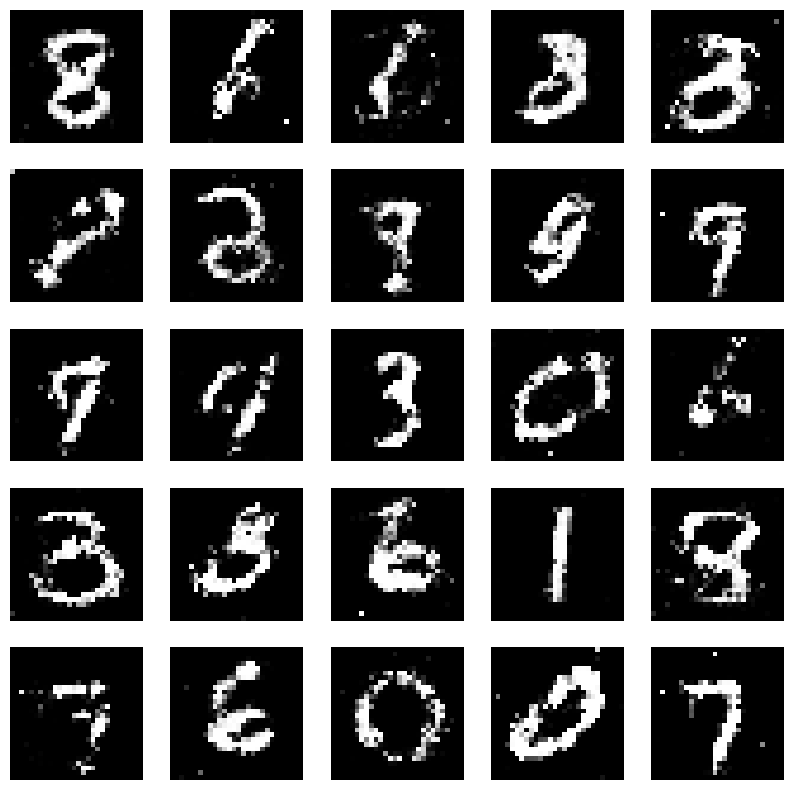

Epochs:  46


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:03,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:46,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:42,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:43,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:39,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:40,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:03<01:46,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:40,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:36,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:36,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:36,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:35,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:08<01:33,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:33,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:34,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:35,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:41,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:10<01:44,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:50,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<01:51,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:11<01:54,  2.12it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█▏        | 31/273 [00:12<01:54,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:59,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:58,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 34/273 [00:13<01:54,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:48,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:44,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:45,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:43,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:39,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:31,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:32,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:31,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:30,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:30,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:27,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 51/273 [00:20<01:25,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:28,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:29,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:30,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:27,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:24,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:23<01:28,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:23<01:24,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:25,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 61/273 [00:24<01:33,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 62/273 [00:25<01:34,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:25<01:35,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 64/273 [00:26<01:40,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:39,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:41,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:41,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:28<01:39,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:28<01:35,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:29<01:30,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:29,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:24,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:30<01:22,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:20,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:20,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:19,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:17,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:32<01:13,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:12,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:32<01:11,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:08,  2.79it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:12,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:14,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 84/273 [00:34<01:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:10,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:10,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:08,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:35<01:07,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:08,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:07,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:06,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:37<01:04,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:37<01:03,  2.84it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:03,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:06,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:38<01:12,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 97/273 [00:39<01:14,  2.35it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 98/273 [00:39<01:17,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:40<01:18,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:40<01:22,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:21,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 102/273 [00:41<01:20,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 103/273 [00:42<01:24,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 104/273 [00:42<01:21,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:16,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:16,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:12,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:09,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:44<01:09,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:05,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:46<01:04,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<01:01,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.63it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:47<00:59,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<01:01,  2.51it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 119/273 [00:48<00:59,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:58,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:58,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:58,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:58,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<00:57,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:51<00:57,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:51<00:56,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:54,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:52<00:54,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:53<01:01,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:54<01:02,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<01:03,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:54<01:02,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 135/273 [00:55<01:03,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 136/273 [00:55<01:04,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<01:03,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:56<01:03,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 139/273 [00:57<01:04,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<01:02,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:57,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:57,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:54,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:52,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:54,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:52,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:49,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:46,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:46,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:45,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:02<00:46,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:44,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:44,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:44,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 158/273 [01:04<00:44,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:05<00:44,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:42,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:05<00:41,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:06<00:41,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:06<00:42,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:07<00:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:07<00:42,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:07<00:43,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:08<00:46,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:08<00:47,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:09<00:47,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:09<00:52,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 171/273 [01:10<00:51,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 172/273 [01:10<00:49,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 173/273 [01:11<00:49,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:11<00:46,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:44,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:41,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:12<00:38,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:38,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:36,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:35,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:35,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:16<00:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:33,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:33,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:18<00:32,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:31,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 194/273 [01:19<00:31,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:29,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:20<00:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:20<00:28,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:21<00:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:21<00:27,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 201/273 [01:22<00:30,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:22<00:31,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:23<00:31,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:23<00:32,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:24<00:31,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 207/273 [01:25<00:30,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:25<00:30,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:26<00:28,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:27,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:26,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:24,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:31<00:20,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:32<00:18,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:33<00:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:34<00:16,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:34<00:16,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:35<00:16,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 234/273 [01:35<00:15,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:36<00:15,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:36<00:15,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:37<00:15,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:37<00:15,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:38<00:15,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:38<00:15,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:14,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:40<00:14,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:48<00:02,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:52<00:00,  2.43it/s]


Perdidas:  0.703091025352478 , 0.7657614946365356
1/1 [==============================] - 0s 27ms/step


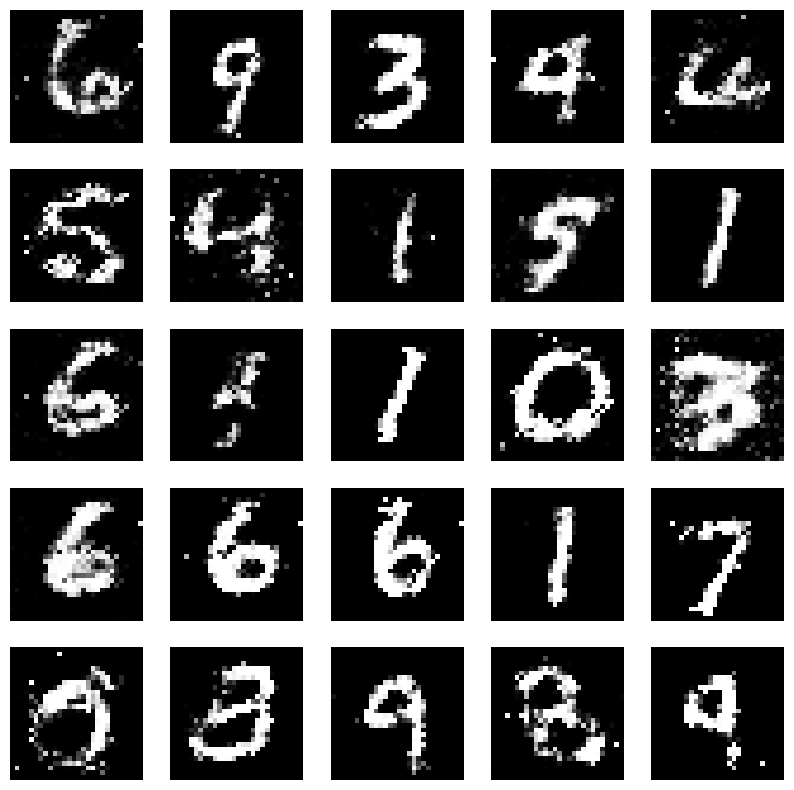

Epochs:  47


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:42,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:37,  2.77it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<01:37,  2.76it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:39,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:40,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:43,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 12/273 [00:04<01:45,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:43,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:37,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:34,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:34,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:34,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:08<01:32,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:34,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:32,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:28,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:39,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:44,  2.37it/s]

4/4 [==============================] - 0s 18ms/step


 10%|▉         | 27/273 [00:10<01:49,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:48,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:11<01:52,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:54,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:54,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:12<01:52,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 33/273 [00:13<01:50,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:44,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:44,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:39,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:14<01:34,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 38/273 [00:15<01:35,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 39/273 [00:15<01:38,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:37,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:16<01:34,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:16<01:32,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:17<01:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:24,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:18<01:29,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:25,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:24,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:19<01:22,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:24,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:23,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:24,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 56/273 [00:22<01:23,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:22<01:25,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:22,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:36,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:24<01:35,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:37,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 62/273 [00:25<01:39,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:36,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:25<01:35,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:38,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:26<01:37,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:27<01:37,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 68/273 [00:27<01:32,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:26,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:25,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:28<01:21,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:29<01:23,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:22,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:18,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 75/273 [00:30<01:30,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:26,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:21,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:19,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:17,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 80/273 [00:32<01:19,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:16,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:12,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:10,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:12,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:17,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:35<01:15,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:12,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:12,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:36<01:14,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:13,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▎      | 92/273 [00:37<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:12,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:38<01:19,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:38<01:23,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:39<01:22,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 97/273 [00:40<01:29,  1.96it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:40<01:28,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:41<01:26,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:27,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:41<01:22,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 102/273 [00:42<01:18,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:16,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:11,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:10,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:09,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:04,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:03,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:03,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:04,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:01,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:00,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:49<00:59,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:06,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<01:04,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:50<01:02,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:50<00:59,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<00:59,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<01:01,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:51<01:00,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:52<01:05,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:52<01:05,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 129/273 [00:53<01:07,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:53<01:06,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 131/273 [00:54<01:07,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:54<01:07,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:55<01:06,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:55<01:06,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 135/273 [00:56<01:06,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<01:03,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:59,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:56,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:53,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:54,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:58<00:53,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:59<00:52,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [00:59<00:50,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [01:00<00:50,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:00<00:48,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:01<00:49,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [01:01<00:49,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:50,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:49,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:48,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:47,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:04<00:44,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:04<00:45,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:05<00:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:44,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:43,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:44,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:07<00:49,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:49,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 165/273 [01:08<00:49,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 166/273 [01:08<00:50,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:09<00:50,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:09<00:50,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:10<00:49,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:10<00:48,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:44,  2.27it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 172/273 [01:11<00:42,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:42,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:40,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:39,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:13<00:37,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:38,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:34,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:15<00:33,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:32,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:15<00:33,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:16<00:32,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:32,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:32,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:17<00:36,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [01:18<00:34,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:33,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:32,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:35,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:32,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:33,  2.30it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 197/273 [01:21<00:35,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:22<00:35,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:22<00:36,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 200/273 [01:23<00:36,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:37,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 202/273 [01:24<00:35,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 203/273 [01:24<00:34,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:25<00:33,  2.03it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:25<00:31,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:26<00:29,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:28,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:28,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:20,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:31<00:19,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:31<00:18,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:32<00:18,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:33<00:17,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:16,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:34<00:16,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:15,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:17,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:35<00:17,  2.38it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 233/273 [01:36<00:17,  2.25it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 234/273 [01:37<00:18,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:37<00:18,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:38<00:18,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:38<00:18,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:39<00:18,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:39<00:16,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:15,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:14,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:12,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:45<00:08,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6875185966491699 , 0.7524971961975098
1/1 [==============================] - 0s 31ms/step


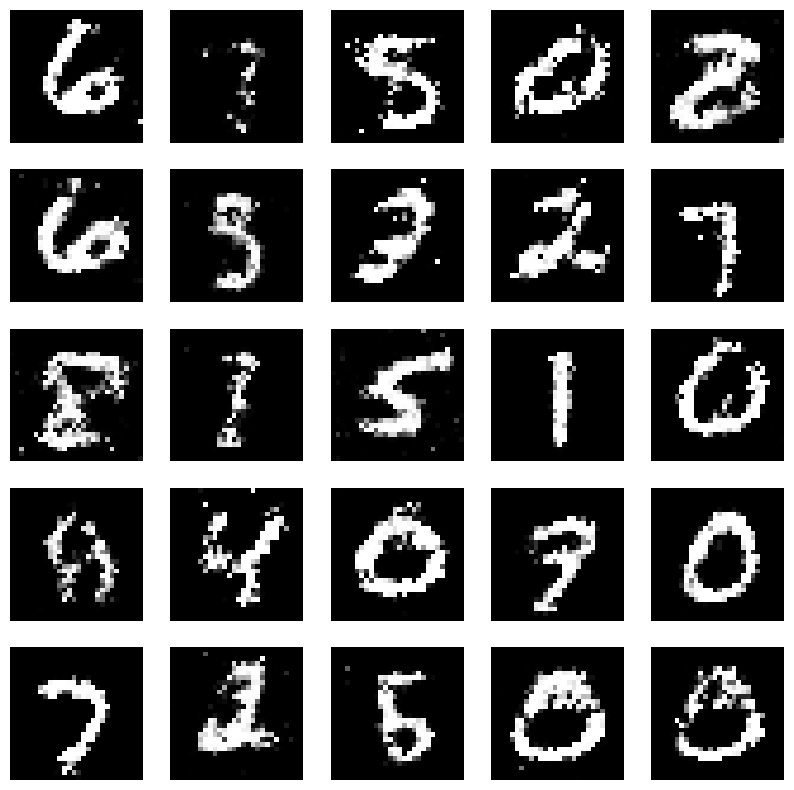

Epochs:  48


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:40,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:54,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:53,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:49,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:44,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:49,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:04<01:44,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:51,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:47,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:46,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:47,  2.42it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 15/273 [00:06<01:55,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 16/273 [00:06<01:59,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 17/273 [00:07<02:02,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<02:06,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<02:06,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:08<02:09,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 21/273 [00:09<02:05,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:09<02:06,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 23/273 [00:10<02:03,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:10<01:54,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:11<01:49,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:49,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:43,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:12<01:46,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:47,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:13<01:41,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:40,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:14<01:40,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:14<01:38,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:34,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:15<01:37,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 36/273 [00:15<01:40,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:16<01:37,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:16<01:36,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:33,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:17<01:30,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:32,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:18<01:35,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:34,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:30,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:19<01:32,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:28,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:19<01:27,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:34,  2.37it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 50/273 [00:21<01:41,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 51/273 [00:21<01:42,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 52/273 [00:22<01:48,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:22<01:49,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 54/273 [00:23<01:54,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 55/273 [00:24<01:54,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 56/273 [00:24<01:53,  1.91it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:43,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:25<01:40,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:25<01:35,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:26<01:29,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:26<01:30,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:27<01:28,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:27<01:26,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:27,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:28<01:25,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:28<01:23,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:29<01:22,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:29<01:21,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:29<01:25,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:30<01:21,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:30<01:19,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:31<01:18,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:31<01:17,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:31<01:14,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:32<01:15,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:32<01:15,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:15,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 78/273 [00:33<01:14,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:12,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:34<01:11,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:34<01:12,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:34<01:19,  2.41it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 83/273 [00:35<01:24,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:35<01:28,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:36<01:30,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:36<01:29,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:37<01:31,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:37<01:27,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 89/273 [00:38<01:31,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 90/273 [00:38<01:30,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:39<01:26,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:39<01:21,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:40<01:20,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:40<01:17,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:41<01:12,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:41<01:10,  2.50it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 98/273 [00:42<01:09,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 99/273 [00:42<01:08,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:42<01:08,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:43<01:06,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:43<01:10,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:44<01:07,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:44<01:08,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:44<01:07,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:45<01:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:45<01:03,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:46<01:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:46<01:02,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 110/273 [00:46<01:02,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:00,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:47<01:00,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:47<01:00,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:48<00:59,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 115/273 [00:48<00:59,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:49<01:04,  2.43it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 117/273 [00:49<01:12,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:50<01:14,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:50<01:14,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:51<01:17,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 121/273 [00:51<01:16,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:52<01:15,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 123/273 [00:52<01:17,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:53<01:10,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:53<01:06,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:54<01:02,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:54<00:59,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:54<01:00,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:55<00:58,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:55<00:56,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:55,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:56<00:54,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:56<00:56,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:57<00:54,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:57<00:52,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<00:55,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 137/273 [00:58<00:57,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:58<00:56,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:59<00:54,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:59<00:55,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [01:00<00:53,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [01:00<00:52,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [01:00<00:49,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:01<00:48,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:46,  2.77it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:01<00:46,  2.75it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 147/273 [01:02<00:49,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 148/273 [01:02<00:49,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:03<00:47,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:03<00:50,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:03<00:53,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 152/273 [01:04<00:55,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 153/273 [01:04<00:56,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 154/273 [01:05<00:57,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 155/273 [01:06<00:58,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:06<00:56,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:07<00:59,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:07<00:55,  2.08it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:07<00:50,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:08<00:47,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 161/273 [01:08<00:48,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:09<00:45,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:09<00:44,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:09<00:44,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:10<00:41,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:10<00:40,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:39,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:11<00:41,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:11<00:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:12<00:42,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:12<00:42,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:12<00:41,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:13<00:39,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▎   | 174/273 [01:13<00:39,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:14<00:37,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:14<00:37,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:36,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:15<00:37,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:15<00:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:16<00:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:34,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:17<00:36,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 184/273 [01:17<00:39,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 185/273 [01:18<00:37,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:37,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 187/273 [01:19<00:37,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 188/273 [01:19<00:39,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:20<00:40,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:20<00:40,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:21<00:38,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:21<00:38,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 193/273 [01:21<00:35,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:22<00:34,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:22<00:31,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:23<00:31,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:23<00:30,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:29,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:24<00:29,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 200/273 [01:24<00:30,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:25<00:28,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:29,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:25<00:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:26<00:28,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:27,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:27<00:26,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:27<00:25,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:26,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:28<00:26,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:25,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:29<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:29<00:23,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:29<00:22,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:30<00:22,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:30<00:25,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:31<00:23,  2.40it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 217/273 [01:31<00:24,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:32<00:23,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:32<00:23,  2.30it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 220/273 [01:32<00:23,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:33<00:23,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:24,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:34<00:23,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 224/273 [01:34<00:24,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 225/273 [01:35<00:23,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:35<00:23,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:36<00:22,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:36<00:21,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:37<00:19,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:37<00:17,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:37<00:16,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:38<00:15,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:39<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:39<00:14,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:39<00:13,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:40<00:13,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:41<00:12,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:42<00:12,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:43<00:11,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:44<00:10,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 256/273 [01:48<00:08,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:48<00:07,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:49<00:07,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 259/273 [01:49<00:06,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:50<00:06,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:50<00:05,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:51<00:04,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:52<00:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:53<00:01,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.664434552192688 , 0.7620939016342163
1/1 [==============================] - 0s 42ms/step


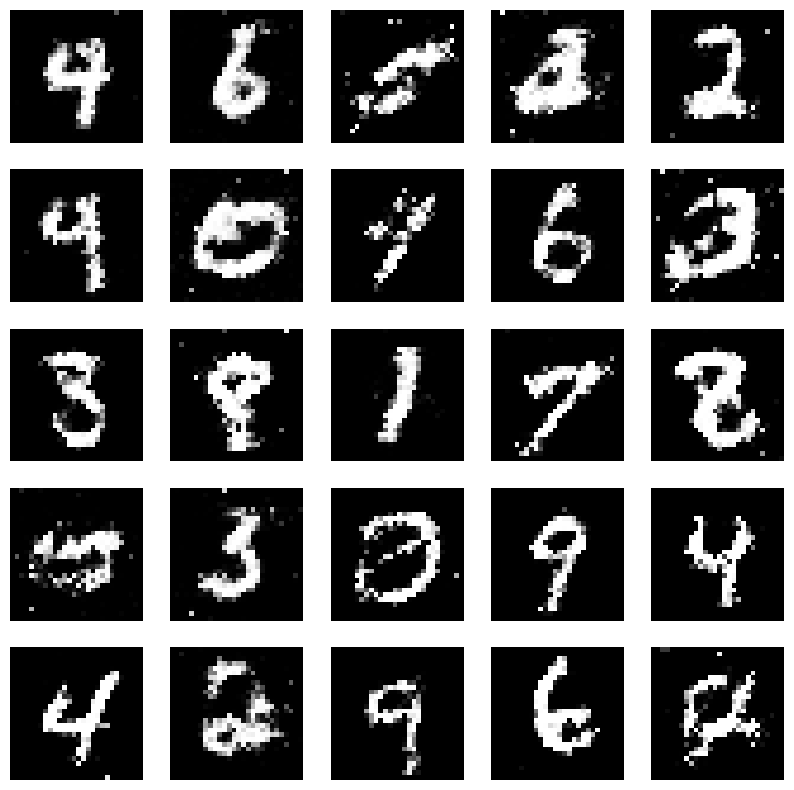

Epochs:  49


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<02:02,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<01:50,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:49,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:49,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:45,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/273 [00:02<01:54,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:01,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<02:38,  1.67it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:04<02:31,  1.74it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<02:23,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 11/273 [00:05<02:17,  1.91it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<02:16,  1.91it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:06<02:14,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 14/273 [00:06<02:06,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:07<01:58,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:07<01:51,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:08<01:56,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:08<01:51,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:46,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:09<01:42,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:39,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:10<01:37,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:38,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 24/273 [00:10<01:41,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:11<01:42,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:45,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:12<01:40,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:12<01:38,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:36,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:13<01:33,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:33,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:14<01:33,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:14<01:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:15<01:32,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:16<01:31,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:31,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:17<01:36,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:17<01:43,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:18<01:49,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:18<01:45,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:19<01:50,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:19<01:48,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 46/273 [00:20<01:49,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 47/273 [00:20<01:50,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:21<01:52,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:21<01:51,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:22<01:42,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▊        | 51/273 [00:22<01:35,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:22<01:33,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:23<01:28,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:23<01:28,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:24,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:24<01:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:25,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:25<01:22,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 59/273 [00:25<01:22,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:20,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:26<01:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:20,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:18,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:24,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:22,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:28<01:23,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:27,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:29<01:23,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:29<01:21,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:21,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:30<01:20,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:30<01:21,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:31<01:17,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:31<01:16,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 75/273 [00:31<01:22,  2.41it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 76/273 [00:32<01:30,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:32<01:33,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:33<01:33,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 79/273 [00:33<01:35,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:34<01:36,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:34<01:34,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:35<01:34,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:36<01:40,  1.90it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:36<01:29,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:36<01:24,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:37<01:20,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:37<01:17,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:38<01:16,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:38<01:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:38<01:14,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:39<01:15,  2.41it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 92/273 [00:39<01:13,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:39<01:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:40<01:10,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:40<01:11,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:41<01:10,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:41<01:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:07,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:42<01:06,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 100/273 [00:42<01:06,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:43<01:07,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:44<01:06,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 105/273 [00:44<01:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:45<01:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:45<01:08,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:08,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:46<01:08,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 110/273 [00:46<01:13,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:14,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 112/273 [00:47<01:14,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:48<01:15,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:48<01:14,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:49<01:14,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 116/273 [00:49<01:19,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:50<01:15,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:50<01:08,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:51<01:03,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:51<01:04,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:51<01:02,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:52<01:00,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:52<00:58,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<00:57,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:53<00:54,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<00:54,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:54<00:55,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:54<00:55,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<00:54,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:55<00:55,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:53,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:55<00:52,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:56<00:53,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:53,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:57<00:52,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:53,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:57<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:58<00:51,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:59<00:54,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:52,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:53,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:52,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 144/273 [01:00<00:55,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [01:01<00:56,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:01<00:57,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 147/273 [01:02<00:58,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:02<00:58,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:03<01:00,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 150/273 [01:03<01:00,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 151/273 [01:04<00:58,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:04<00:54,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:04<00:51,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:05<00:48,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:48,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:06<00:46,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:06<00:46,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:07<00:43,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:07<00:42,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:08<00:43,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:43,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:08<00:43,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:09<00:42,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:09<00:40,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:10<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:42,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:40,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:11<00:39,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:39,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:12<00:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:13<00:37,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:13<00:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:37,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:38,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:14<00:39,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 179/273 [01:15<00:40,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:15<00:40,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:42,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:16<00:43,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 183/273 [01:17<00:44,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:17<00:42,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:18<00:48,  1.83it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:18<00:43,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:19<00:39,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:37,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:19<00:37,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:20<00:35,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:20<00:33,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:21<00:31,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:21<00:31,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 194/273 [01:21<00:30,  2.62it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 195/273 [01:22<00:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:22<00:30,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:23<00:29,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:29,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:23<00:29,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:24<00:28,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:24<00:29,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:25<00:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:27,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:26<00:26,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:27<00:26,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:25,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:26,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 212/273 [01:29<00:27,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:29<00:27,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:30<00:26,  2.20it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 215/273 [01:30<00:26,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:31<00:27,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:31<00:28,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:32<00:27,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 219/273 [01:32<00:26,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:33<00:24,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:33<00:22,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:34<00:20,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:34<00:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:35<00:17,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 228/273 [01:36<00:16,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 229/273 [01:36<00:16,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:36<00:16,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:37<00:15,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:37<00:15,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:37<00:14,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:38<00:14,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:38<00:14,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:39<00:13,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:12,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:11,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:43<00:11,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:44<00:11,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:44<00:11,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:45<00:10,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:45<00:09,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:09,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 254/273 [01:46<00:09,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:47<00:08,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:49<00:05,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6870556473731995 , 0.7547661662101746
1/1 [==============================] - 0s 56ms/step


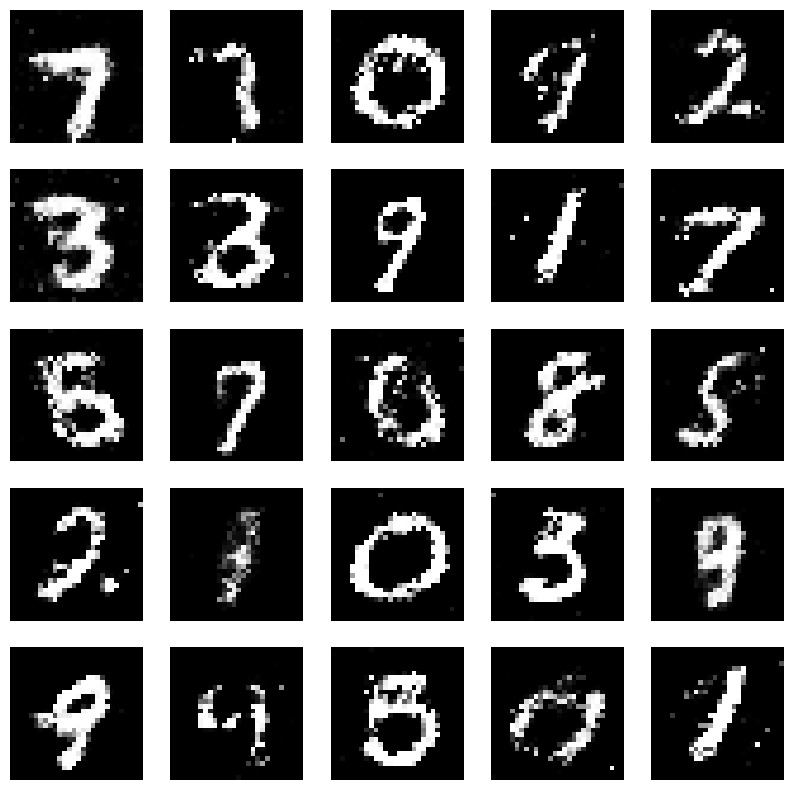

Epochs:  50


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/273 [00:00<02:01,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:00<02:11,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<02:12,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 4/273 [00:01<02:13,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 5/273 [00:02<02:10,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/273 [00:02<02:12,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:07,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<02:05,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<01:59,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:04<01:54,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<01:48,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:41,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<01:37,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:40,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:42,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:39,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:08<01:39,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:37,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:35,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:32,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:32,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:32,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:30,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:34,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:30,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:29,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 35/273 [00:14<01:34,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 36/273 [00:14<01:36,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 37/273 [00:15<01:42,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 38/273 [00:15<01:48,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:50,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 40/273 [00:16<01:51,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 41/273 [00:17<01:56,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 42/273 [00:17<01:55,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:18<01:51,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:43,  2.22it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:18<01:38,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:33,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:32,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:32,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:31,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:30,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:32,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:22<01:29,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:27,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:23,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:24<01:27,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:24,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:26<01:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:21,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:19,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:23,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 69/273 [00:28<01:25,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:37,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:29<01:38,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:30<01:37,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 73/273 [00:30<01:38,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 74/273 [00:31<01:41,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:31<01:39,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 76/273 [00:32<01:35,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:32<01:31,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:27,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:23,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:19,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:34<01:17,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:34<01:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:12,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:13,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:35<01:19,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:16,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:10,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:09,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:09,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:12,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:38<01:16,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:13,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:39<01:11,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:08,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:09,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 101/273 [00:41<01:07,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:42<01:13,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:43<01:15,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 105/273 [00:43<01:19,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 106/273 [00:44<01:21,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:19,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:22,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 109/273 [00:45<01:20,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 110/273 [00:46<01:19,  2.05it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:46<01:15,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:47<01:09,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:47<01:08,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:06,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:48<01:03,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:48<01:03,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:49<01:01,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:00,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<01:02,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<00:59,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:50<00:57,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<00:58,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:52<00:55,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:53,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:52<00:54,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:55,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:55,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:54<00:56,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:56,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:56,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:54,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:57,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 138/273 [00:57<00:59,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 139/273 [00:57<01:01,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 140/273 [00:58<01:03,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:59<01:07,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [00:59<01:06,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 143/273 [00:59<01:02,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [01:00<01:01,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<01:01,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:01<00:57,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:01<00:52,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:02<00:50,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:49,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:50,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:50,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:49,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:46,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:04<00:47,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:47,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:44,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 159/273 [01:06<00:44,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:06<00:46,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:07<00:45,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:44,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:40,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:40,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:39,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:11<00:40,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:41,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:43,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:12<00:45,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:13<00:43,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:13<00:44,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:14<00:43,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:14<00:44,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:15<00:42,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:15<00:40,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:15<00:39,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:16<00:36,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:17<00:34,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:33,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:19<00:31,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:29,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:28,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:29,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:28,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:21<00:29,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:27,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:22<00:27,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 201/273 [01:23<00:26,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:25,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:26<00:27,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:28,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:27<00:29,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:30,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:28<00:28,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 213/273 [01:28<00:28,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:28<00:27,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:27,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:25,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:24,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:21,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:20,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:32<00:20,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:19,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 228/273 [01:34<00:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:14,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:14,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:37<00:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:38<00:14,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:39<00:13,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:13,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:41<00:13,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:42<00:12,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 247/273 [01:42<00:12,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:42<00:11,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 249/273 [01:43<00:12,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:43<00:10,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:47<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.54it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:50<00:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.47it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.7026498317718506 , 0.7569817304611206
1/1 [==============================] - 0s 65ms/step


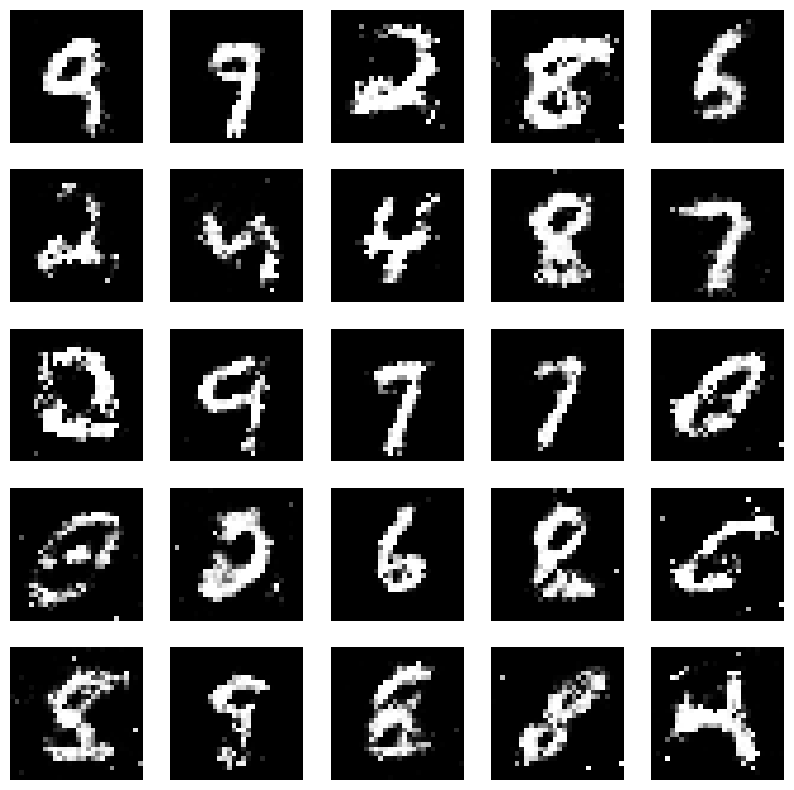

Epochs:  51


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:49,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:40,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<01:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:56,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:55,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:52,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:49,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<01:45,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:48,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:45,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:45,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:39,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:37,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:42,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:43,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:53,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 20/273 [00:08<01:49,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:47,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:43,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:44,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:43,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:10<01:50,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:59,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 27/273 [00:11<01:54,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:51,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:52,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 30/273 [00:12<01:51,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:13<01:54,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:56,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:14<01:52,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 34/273 [00:14<01:53,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:15<01:45,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:15<01:40,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:43,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:16<01:37,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:33,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:17<01:33,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:17<01:33,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:18<01:33,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:35,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:19<01:33,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:19<01:30,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:27,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:27,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:29,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:33,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:27,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:26,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:27,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:29,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:26,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 57/273 [00:23<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:28,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:29,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:25<01:30,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:25<01:33,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:26<01:36,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:26<01:38,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 64/273 [00:27<01:41,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:27<01:46,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:28<01:44,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 67/273 [00:28<01:43,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:29<01:36,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 69/273 [00:29<01:29,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:29,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:30<01:24,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:24,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:31<01:21,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:31<01:20,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:32<01:16,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:19,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:33<01:18,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:16,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:33<01:18,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:34<01:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:12,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:12,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 84/273 [00:35<01:11,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 85/273 [00:35<01:15,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:23,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:20,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:37<01:17,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:14,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:39<01:13,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:39<01:17,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:40<01:20,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:40<01:20,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:41<01:20,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:41<01:23,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 99/273 [00:42<01:29,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:42<01:29,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:43<01:25,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:43<01:18,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:44<01:23,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:44<01:17,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 105/273 [00:44<01:18,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:45<01:16,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:45<01:12,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:46<01:10,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:46<01:07,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:47<01:03,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:47<01:02,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:48<01:03,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:48<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:04,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:49<01:03,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:49<01:02,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:50<01:01,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:50<01:00,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:01,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:51<01:01,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:00,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:52<00:57,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 124/273 [00:52<00:59,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:57,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<01:00,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:54<01:13,  1.99it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<01:11,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<01:11,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 130/273 [00:55<01:11,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 131/273 [00:55<01:08,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:56<01:07,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:56<01:06,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:57<01:05,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:57<01:00,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:58<00:59,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:58<00:58,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<00:55,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:59<00:53,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 140/273 [00:59<00:52,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:49,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:47,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [01:00<00:48,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:01<00:47,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:48,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:01<00:49,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:02<00:49,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<00:49,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:03<00:49,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:03<00:51,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:49,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:04<00:50,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:48,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 154/273 [01:05<00:47,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:05<00:46,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:44,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:43,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:06<00:43,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:07<00:43,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:48,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:08<00:48,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:09<00:48,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [01:09<00:49,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:10<00:47,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:47,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:11<00:46,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:11<00:48,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:11<00:44,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:12<00:42,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:12<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:13<00:38,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:13<00:38,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:37,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:14<00:38,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:14<00:37,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:15<00:37,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:15<00:36,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:15<00:35,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:34,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:16<00:33,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:17<00:35,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:17<00:35,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:33,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:33,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:32,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:19<00:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:19<00:30,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:20<00:30,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:20<00:30,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [01:22<00:34,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:22<00:35,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:23<00:36,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:23<00:35,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 200/273 [01:24<00:36,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:24<00:34,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 202/273 [01:25<00:34,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:25<00:33,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:26<00:32,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:30,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:28,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:27<00:26,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:27<00:26,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:24,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:23,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:29<00:23,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:29<00:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:30<00:22,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:22,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:31<00:20,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:31<00:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:19,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:20,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:33<00:20,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:17,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:37<00:17,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:37<00:17,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:38<00:17,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 236/273 [01:38<00:17,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:39<00:16,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:39<00:17,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:40<00:16,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:40<00:15,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:41<00:14,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:41<00:13,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:11,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.10it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 273/273 [01:54<00:00,  2.38it/s]


Perdidas:  0.674627423286438 , 0.757344663143158
1/1 [==============================] - 0s 29ms/step


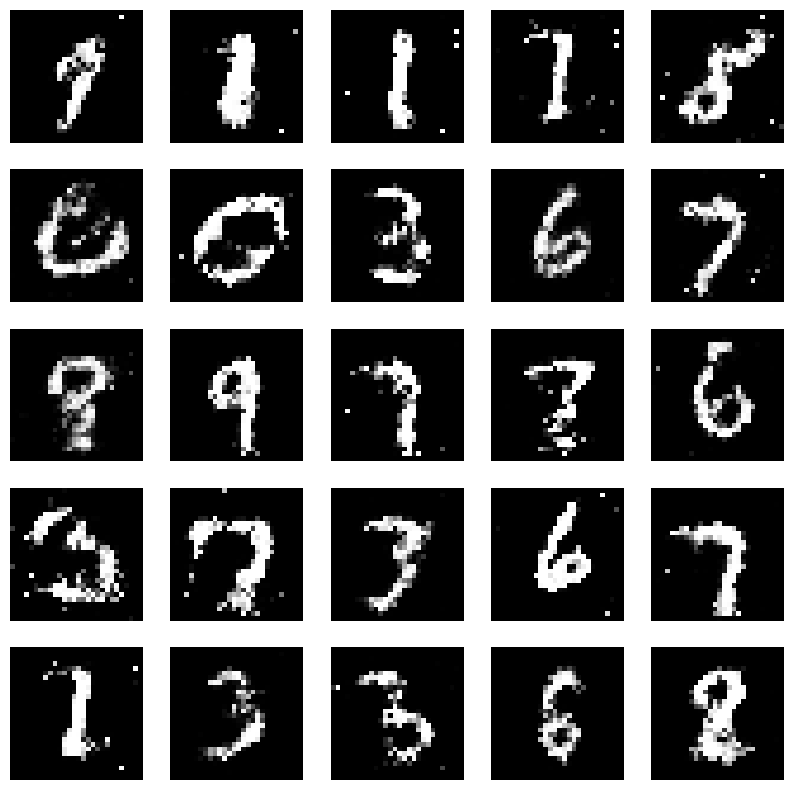

Epochs:  52


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.73it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:00<01:41,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:38,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:39,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:03<01:47,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:03<01:45,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:45,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:46,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:47,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:46,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:45,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:46,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:47,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:08<01:52,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:08<01:59,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:09<02:03,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 23/273 [00:09<02:02,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:10<02:00,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 25/273 [00:10<02:02,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:11<02:01,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 27/273 [00:11<02:01,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:12<01:57,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 29/273 [00:12<01:51,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:12<01:47,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:41,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:38,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:14<01:34,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:38,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:42,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:15<01:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:16<01:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:32,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:32,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:32,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:31,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:30,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:29,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:19<01:30,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:30,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:28,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:27,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:34,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:22<01:36,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 55/273 [00:23<02:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:24<02:07,  1.70it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:24<02:02,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 58/273 [00:25<01:55,  1.87it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:25<01:51,  1.93it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:26<01:48,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:26<01:44,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:26<01:34,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:27<01:31,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:27<01:31,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:28<01:31,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:28<01:30,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:25,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:29<01:25,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:29<01:22,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:30<01:25,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:30<01:23,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:31<01:22,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:31<01:22,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:31<01:19,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:32<01:17,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:32<01:17,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:33<01:18,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:33<01:21,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:33<01:18,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:34<01:17,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:34<01:14,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:34<01:13,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:35<01:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:10,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:36<01:09,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:11,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:16,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 88/273 [00:37<01:21,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:37<01:24,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 90/273 [00:38<01:27,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:39<01:30,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 92/273 [00:39<01:30,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:40<01:30,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:40<01:27,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:40<01:21,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:41<01:15,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:41<01:12,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:42<01:13,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:42<01:14,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:42<01:14,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:43<01:10,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 102/273 [00:43<01:08,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:44<01:06,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:44<01:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:44<01:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:45<01:06,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:45<01:08,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:46<01:08,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:46<01:05,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:46<01:04,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:47<01:04,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:47<01:05,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:48<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:48<01:03,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:03,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:49<01:03,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:49<01:01,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:50<01:00,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:50<00:59,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:50<01:04,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:51<01:09,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:11,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:52<01:12,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:53<01:13,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:53<01:14,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:54<01:13,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:54<01:14,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 128/273 [00:54<01:09,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:55<01:02,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:55<00:59,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:56<00:55,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:56<00:54,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:56<00:52,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:57<00:52,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:57<00:54,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:57<00:53,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:58<00:55,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:58<00:54,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:59<00:54,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:59<00:51,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:59<00:50,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [01:00<00:50,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [01:00<00:52,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:01<00:50,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:01<00:50,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:01<00:50,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:02<00:48,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:02<00:47,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:03<00:46,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:03<00:45,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:03<00:48,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:04<00:47,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:49,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 154/273 [01:05<00:52,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:05<00:56,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:06<00:58,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:06<00:58,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 158/273 [01:07<00:56,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:07<00:55,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 160/273 [01:08<00:58,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:08<00:55,  2.02it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:09<00:50,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:09<00:48,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 164/273 [01:09<00:46,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:10<00:44,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:10<00:42,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:11<00:42,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:11<00:42,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:41,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:12<00:46,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:12<00:43,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:13<00:41,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:13<00:41,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:14<00:40,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:14<00:40,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:14<00:38,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [01:15<00:37,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:15<00:36,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:15<00:35,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:16<00:35,  2.66it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 181/273 [01:16<00:35,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:17<00:34,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:17<00:34,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:17<00:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:18<00:33,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:33,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:19<00:35,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:19<00:36,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:20<00:37,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 190/273 [01:20<00:38,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:21<00:38,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:21<00:39,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:22<00:38,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:22<00:37,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:22<00:36,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 196/273 [01:23<00:36,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:23<00:33,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:24<00:31,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:24<00:30,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:24<00:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:25<00:27,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:26<00:26,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:26<00:26,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:25,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:27<00:25,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:27<00:25,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:28<00:24,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:28<00:23,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:29<00:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:29<00:23,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:29<00:23,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 214/273 [01:30<00:22,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:30<00:21,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:20,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:31<00:20,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:31<00:21,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:32<00:21,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:20,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:33<00:21,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:21,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:34<00:21,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 225/273 [01:34<00:22,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:35<00:22,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:35<00:21,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:36<00:21,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 229/273 [01:36<00:20,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:37<00:20,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:37<00:19,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:38<00:18,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:38<00:17,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:39<00:17,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:39<00:16,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:40<00:15,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:14,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:41<00:14,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:42<00:12,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:43<00:10,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:44<00:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:46<00:07,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:49<00:06,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:49<00:06,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:50<00:05,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 263/273 [01:51<00:04,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 264/273 [01:51<00:04,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:52<00:03,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.6800801753997803 , 0.7690778970718384
1/1 [==============================] - 0s 28ms/step


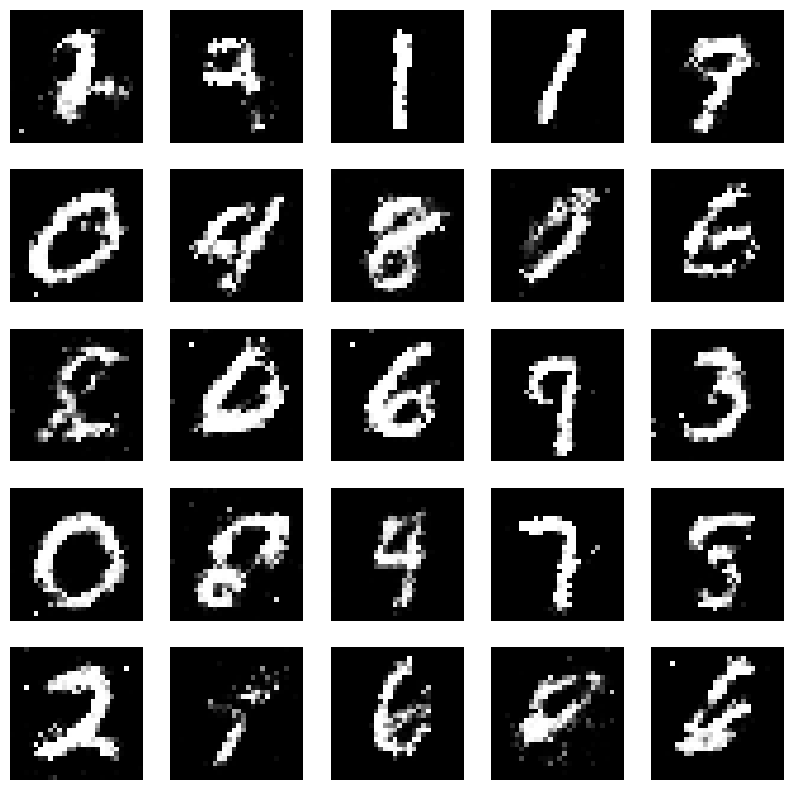

Epochs:  53


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<02:02,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:51,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:46,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:42,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:48,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:43,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:47,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:47,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 12/273 [00:04<01:55,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 13/273 [00:05<01:50,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:49,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:06<01:51,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:53,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:07<01:52,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 18/273 [00:07<01:50,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 19/273 [00:07<01:51,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:08<01:53,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:47,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:41,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:38,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:41,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:38,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:41,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:38,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:34,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:33,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:29,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 35/273 [00:14<01:34,  2.51it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 36/273 [00:14<01:33,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:32,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:27,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:16<01:33,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:29,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 46/273 [00:18<01:28,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:19<01:36,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:19<01:38,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 49/273 [00:19<01:43,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:42,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:20<01:47,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:21<01:45,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:45,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:22<01:39,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:34,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:31,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:26,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:25,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 61/273 [00:25<01:25,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:24,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:19,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:26<01:17,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:28<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:20,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:28<01:18,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:17,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:13,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:29<01:12,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:30<01:13,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:30<01:11,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:10,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:10,  2.78it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:31<01:09,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:10,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:32<01:15,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:32<01:15,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:33<01:19,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:33<01:23,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:34<01:25,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:34<01:29,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 87/273 [00:35<01:30,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:35<01:29,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:28,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:22,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:19,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:13,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:38<01:10,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:11,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:39<01:09,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:39<01:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:11,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:40<01:09,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:09,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:06,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:09,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:10,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:42<01:09,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:44<01:07,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:44<01:03,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:01,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:45<01:00,  2.63it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 114/273 [00:46<01:00,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:46<00:59,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:47<01:01,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:47<01:06,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 119/273 [00:48<01:10,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:48<01:08,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 121/273 [00:49<01:10,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:49<01:11,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:50<01:12,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:50<01:09,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:51<01:17,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:51<01:09,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:52<01:03,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<01:04,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<01:00,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<00:56,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:54<00:55,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:53,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:54<00:53,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:55<00:51,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<00:51,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:56<00:51,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:51,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:57<00:51,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:57<00:50,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:58<00:51,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:58<00:49,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:52,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:50,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:00<00:49,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:49,  2.47it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 151/273 [01:01<00:53,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 152/273 [01:02<00:55,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 153/273 [01:02<00:56,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:03<00:58,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:03<00:56,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:04<00:56,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:55,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:05<00:55,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 159/273 [01:05<00:54,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:51,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:47,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:06<00:46,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:42,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:07<00:43,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:08<00:43,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:08<00:42,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:09<00:43,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:09<00:42,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:42,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:41,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 172/273 [01:10<00:39,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:11<00:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:11<00:37,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [01:12<00:38,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:13<00:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:13<00:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:15<00:37,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:16<00:38,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:41,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 188/273 [01:17<00:41,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 189/273 [01:17<00:40,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:41,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:40,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:19<00:39,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:19<00:39,  2.05it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:20<00:37,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:20<00:35,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:33,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:32,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:31,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:23<00:27,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:24<00:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:26,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 210/273 [01:26<00:26,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:26,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:21,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:30<00:21,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:30<00:22,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:31<00:22,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:31<00:22,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:32<00:22,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 224/273 [01:32<00:22,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 225/273 [01:33<00:22,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:33<00:22,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:33<00:21,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 228/273 [01:34<00:20,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:34<00:20,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 230/273 [01:35<00:18,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:17,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:37<00:13,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:38<00:12,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:11,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:11,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:41<00:10,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:42<00:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:07,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:43<00:07,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:06,  2.74it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:46<00:06,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 261/273 [01:47<00:05,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:48<00:05,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:52<00:00,  2.43it/s]


Perdidas:  0.6558715105056763 , 0.7438693046569824
1/1 [==============================] - 0s 51ms/step


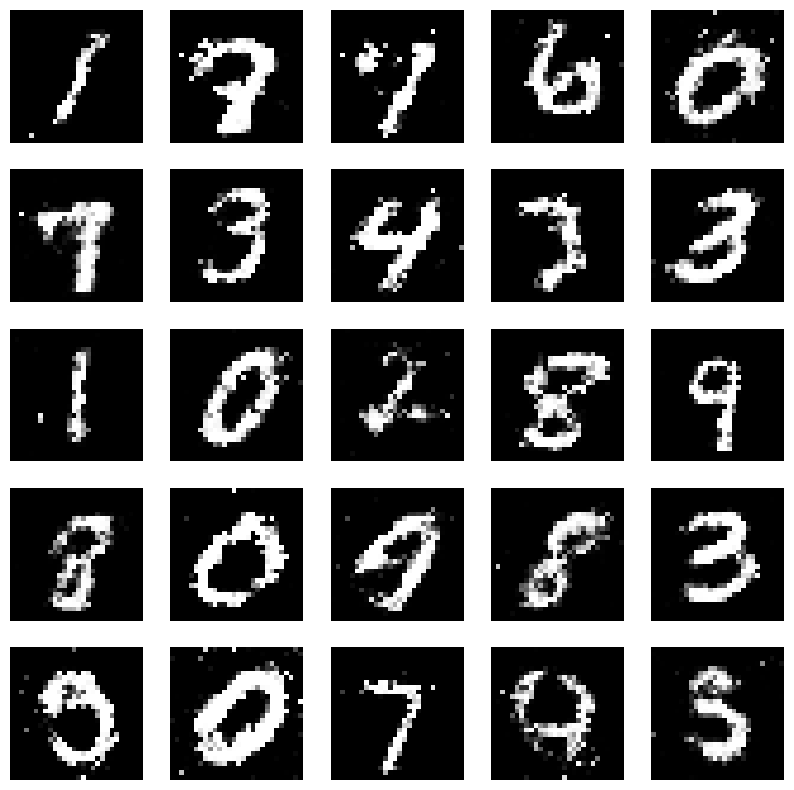

Epochs:  54


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:34,  2.88it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:40,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:45,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/273 [00:02<01:50,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:02<02:00,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<02:03,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/273 [00:03<02:04,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<02:03,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 11/273 [00:04<02:05,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 12/273 [00:05<02:08,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<02:09,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<02:05,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<02:01,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:07<01:52,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:50,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 19/273 [00:08<01:43,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:41,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:38,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<01:38,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:36,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:33,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:31,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:31,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:12<01:31,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:33,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:31,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 33/273 [00:13<01:34,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:34,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 37/273 [00:15<01:32,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:31,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:29,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:16<01:33,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 42/273 [00:17<01:38,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:17<01:43,  2.23it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 44/273 [00:18<01:43,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:49,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:51,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:49,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 48/273 [00:20<01:46,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:20<01:48,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:21<01:45,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:40,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:22<01:33,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:22<01:32,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:31,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:27,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:26,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:24,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:25<01:25,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:20,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:18,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:27<01:23,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:22,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:19,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:18,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:29<01:23,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:20,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:29<01:19,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:15,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:30<01:14,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:14,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:19,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:21,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 78/273 [00:32<01:26,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:33,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:33<01:29,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:33<01:28,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:34<01:27,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:34<01:28,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:26,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:35<01:25,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:21,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:16,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:15,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:15,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:37<01:13,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:38<01:14,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:38<01:15,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:13,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:39<01:10,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:40<01:11,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:09,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:09,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:08,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:05,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:05,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:06,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:03,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:03,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:01,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:43<01:01,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:01,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 112/273 [00:46<01:07,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 113/273 [00:46<01:11,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:47<01:11,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [00:47<01:13,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:48<01:09,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:48<01:08,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:48<01:09,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 119/273 [00:49<01:10,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:49<01:12,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 121/273 [00:50<01:13,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<01:08,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<01:06,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:03,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:52<01:11,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<01:05,  2.24it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:53<01:03,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<01:00,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:54<00:55,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:54<00:54,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:54,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:54,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 138/273 [00:57<00:52,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:50,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:49,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:58<00:49,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:48,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:48,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:48,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:46,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:51,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:51,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:01<00:54,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:53,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:02<00:54,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [01:02<00:56,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 152/273 [01:03<00:57,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:03<00:58,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▋    | 154/273 [01:04<00:57,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:04<00:55,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:04<00:51,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:51,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:48,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:47,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:45,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 162/273 [01:07<00:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:07<00:44,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:45,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:43,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 166/273 [01:08<00:43,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:42,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [01:09<00:40,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:10<00:41,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 170/273 [01:10<00:41,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:41,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:42,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:12<00:38,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:37,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:36,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:36,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:38,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:15<00:40,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:15<00:40,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 184/273 [01:16<00:42,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:41,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:41,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:40,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:18<00:41,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 189/273 [01:18<00:39,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:37,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:35,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:30,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:21<00:29,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:28,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:27,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:26,  2.62it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 205/273 [01:25<00:27,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:26<00:23,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:23,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:29<00:23,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:30<00:24,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:30<00:24,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:31<00:24,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:31<00:24,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:24,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:32<00:24,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 224/273 [01:33<00:23,  2.07it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:33<00:22,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.33it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:19,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:14,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:13,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:12,  2.74it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:38<00:12,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:40<00:10,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:09,  2.61it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 251/273 [01:43<00:09,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:44<00:10,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:44<00:09,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:09,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 255/273 [01:45<00:08,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 256/273 [01:46<00:08,  1.94it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:46<00:08,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.7122135162353516 , 0.7500230073928833
1/1 [==============================] - 0s 57ms/step


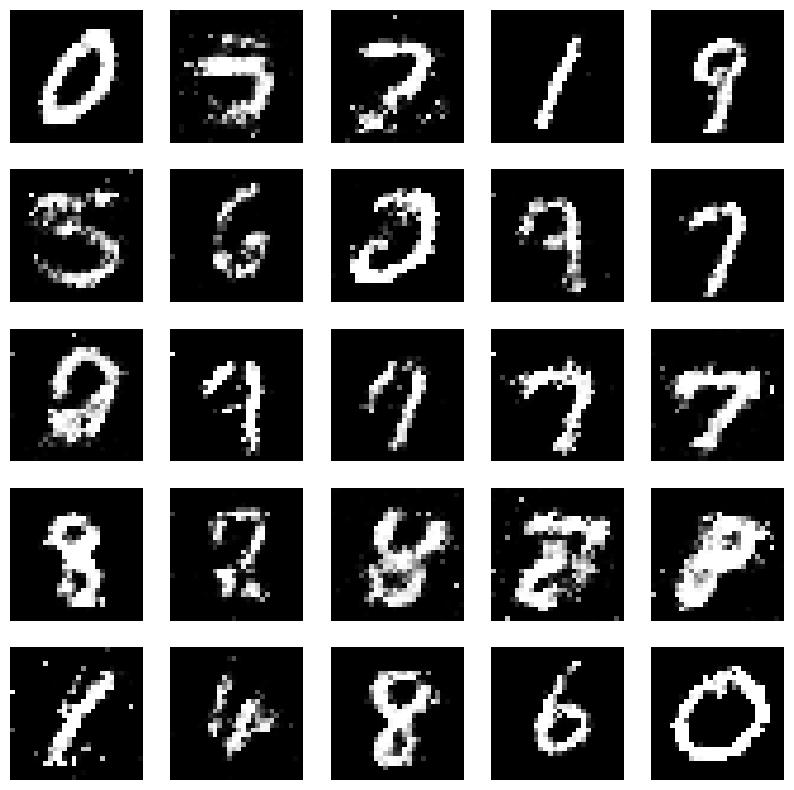

Epochs:  55


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:52,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:45,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<01:55,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:55,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<02:01,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:03<02:01,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<02:01,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:03<02:01,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<02:05,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<02:04,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 12/273 [00:05<02:06,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<02:03,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:06<02:00,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:52,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 16/273 [00:07<01:49,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:42,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:08<01:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:37,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:35,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:09<01:41,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:37,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:38,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<01:39,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:38,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:34,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:34,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:33,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:43,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:17<01:42,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:47,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:18<01:46,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:18<01:48,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:19<01:49,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:19<01:52,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:20<01:52,  2.02it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:20<01:44,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:20<01:41,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:21<01:33,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:22<01:31,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:27,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:25,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:23,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:21,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:19,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:17,  2.75it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 60/273 [00:25<01:20,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:19,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:26<01:19,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:17,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:19,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:20,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:18,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:16,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:15,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:16,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:15,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:30<01:17,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:22,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:31<01:25,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:32<01:28,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:29,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:30,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:34<01:32,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:34<01:29,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:35<01:25,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:35<01:22,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:16,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:36<01:14,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:09,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:37<01:09,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:07,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:06,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:35,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 95/273 [00:39<01:26,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:21,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:21,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:40<01:16,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:13,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:13,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:07,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:12,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:11,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:08,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:05,  2.52it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 109/273 [00:45<01:10,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 110/273 [00:45<01:14,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:46<01:15,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:46<01:16,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:47<01:15,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:16,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:48<01:15,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:48<01:14,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:49<01:14,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:10,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:50<01:07,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:08,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:51<01:04,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<01:01,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:51<01:00,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<01:01,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<01:00,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:58,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:53<01:00,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<01:01,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<01:00,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:54<00:57,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:55,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:57,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:56,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:54,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:50,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:57<00:48,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:48,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:47,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:45,  2.89it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:48,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:59<00:49,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:59<00:53,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [01:00<00:56,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [01:00<00:57,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:01<00:58,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:01<00:58,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 148/273 [01:01<00:56,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 149/273 [01:02<00:58,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:02<00:57,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [01:03<00:58,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:55,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:51,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:48,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:05<00:46,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:05<00:44,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:44,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:06<00:45,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:44,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:43,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:08<00:42,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:40,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:39,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:09<00:39,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:10<00:41,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:38,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:11<00:38,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:38,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:13<00:37,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:14<00:38,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.47it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 181/273 [01:15<00:39,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 182/273 [01:15<00:40,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:16<00:42,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 184/273 [01:16<00:43,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 185/273 [01:17<00:43,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 186/273 [01:17<00:42,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 187/273 [01:18<00:42,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:18<00:41,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:19<00:39,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:36,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:19<00:35,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:30,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:31,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:24<00:29,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:26,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:27<00:23,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:25,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:24,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:29<00:24,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:29<00:26,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:25,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 217/273 [01:30<00:26,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:25,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 219/273 [01:31<00:26,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 220/273 [01:32<00:26,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:32<00:25,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:32<00:23,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:33<00:22,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:33<00:21,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:45<00:09,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:46<00:08,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6743937730789185 , 0.7534208297729492
1/1 [==============================] - 0s 28ms/step


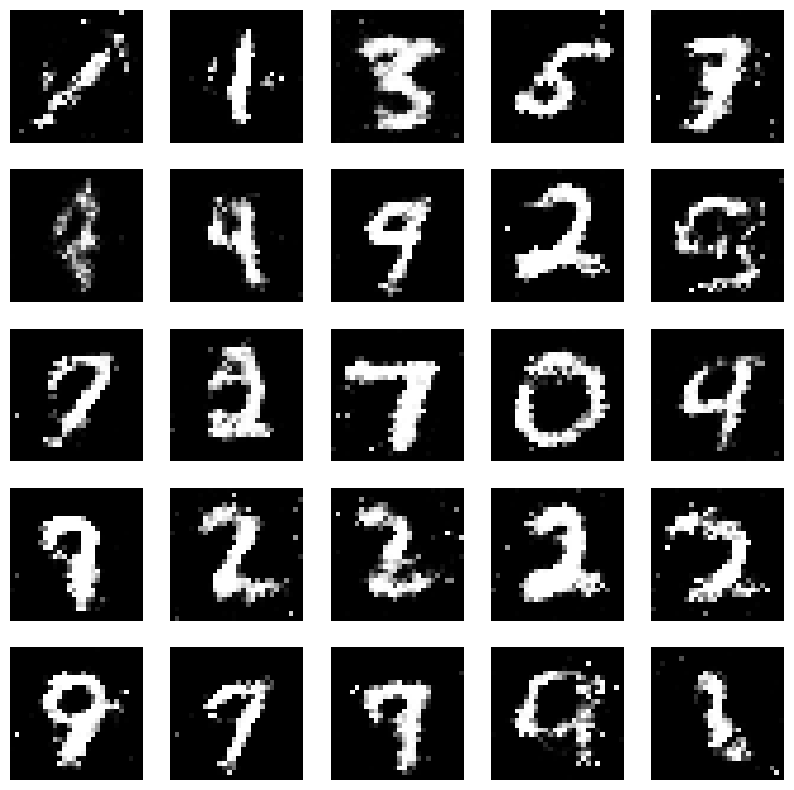

Epochs:  56


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/273 [00:00<01:58,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<02:11,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:09,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 4/273 [00:01<02:13,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 5/273 [00:02<02:13,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<02:13,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:13,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:04<02:18,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/273 [00:04<02:13,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<02:01,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:05<02:02,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:57,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:06<01:53,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:48,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:46,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:07<01:51,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:47,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 18/273 [00:08<01:45,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:39,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:39,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:39,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:38,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:10<01:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:33,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:33,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:38,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:33,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:12<01:34,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 29/273 [00:12<01:33,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:13<01:31,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:14<01:40,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:39,  2.41it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 35/273 [00:14<01:42,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 36/273 [00:15<01:49,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:54,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 38/273 [00:16<01:59,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 39/273 [00:17<01:57,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:17<01:56,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:17<01:52,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 42/273 [00:18<01:51,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:18<01:49,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:19<01:44,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:19<01:35,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:20<01:36,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:20<01:34,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:21<01:33,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:21<01:32,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:22<01:35,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:22<01:29,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:23<01:26,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:23<01:23,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:24<01:23,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:24<01:26,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:24<01:24,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:27,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:26<01:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:26<01:33,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:27<01:28,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:27<01:29,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:27<01:25,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:28<01:24,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 67/273 [00:28<01:29,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:29<01:29,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:29<01:28,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:30<01:31,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:30<01:33,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:31<01:33,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:31<01:35,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:32<01:34,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:32<01:31,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:32<01:30,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 77/273 [00:33<01:33,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 78/273 [00:33<01:27,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:34<01:25,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:34<01:18,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:34<01:16,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:35<01:15,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:35<01:18,  2.42it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 84/273 [00:36<01:15,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:36<01:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:37<01:11,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:37<01:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:38<01:15,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:38<01:11,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:38<01:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:39<01:11,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:09,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:40<01:09,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:40<01:07,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:40<01:10,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:41<01:09,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:41<01:11,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:42<01:08,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:06,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:05,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:43<01:06,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:44<01:10,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:44<01:12,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:45<01:19,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 107/273 [00:45<01:21,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:46<01:23,  1.98it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:46<01:21,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 40%|████      | 110/273 [00:47<01:21,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 111/273 [00:47<01:22,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:48<01:18,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:48<01:13,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:48<01:09,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:49<01:07,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:49<01:03,  2.47it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 117/273 [00:50<01:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:50<01:00,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<00:58,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:51<00:57,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:51<00:55,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<00:56,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:52<00:55,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 124/273 [00:52<00:54,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:52,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<00:54,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<00:54,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:54<00:56,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:54<00:54,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:54,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:52,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:56<00:57,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:56<00:57,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:56<00:57,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:55,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 137/273 [00:57<00:55,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<00:57,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:58<00:59,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 140/273 [00:59<01:00,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:59<01:02,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [01:00<01:03,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [01:00<01:03,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:01<01:01,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 145/273 [01:01<00:59,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:02<01:01,  2.08it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:02<00:58,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:02<00:53,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 149/273 [01:03<00:51,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:03<00:50,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:04<00:49,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:04<00:48,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:47,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:05<00:46,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:46,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:06<00:45,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:44,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:46,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:07<00:44,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:07<00:46,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:08<00:45,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:08<00:43,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:42,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:09<00:42,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:09<00:40,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:39,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:38,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:36,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:11<00:36,  2.79it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:37,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:12<00:39,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:12<00:39,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:12<00:40,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:13<00:40,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:43,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:14<00:43,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:14<00:43,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:15<00:45,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:15<00:45,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:44,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 182/273 [01:16<00:42,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:17<00:39,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:17<00:37,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:17<00:35,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:34,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [01:18<00:33,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:32,  2.63it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 189/273 [01:19<00:31,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:31,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:20<00:30,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:20<00:29,  2.74it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 193/273 [01:20<00:30,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:21<00:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:22<00:32,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:30,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:28,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:26,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:26,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:25,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:25<00:25,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [01:25<00:24,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:27<00:27,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:28<00:28,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 212/273 [01:28<00:29,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:29<00:28,  2.12it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 214/273 [01:29<00:28,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:30<00:28,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 216/273 [01:30<00:27,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:31<00:26,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 218/273 [01:31<00:24,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:31<00:22,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 220/273 [01:32<00:21,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:33<00:20,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:34<00:19,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:35<00:20,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:35<00:20,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:16,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:38<00:14,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:39<00:13,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:12,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:13,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:41<00:14,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:42<00:13,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:43<00:12,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:43<00:12,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 248/273 [01:44<00:11,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:44<00:10,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:45<00:09,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.39it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6882781386375427 , 0.7453750371932983
1/1 [==============================] - 0s 42ms/step


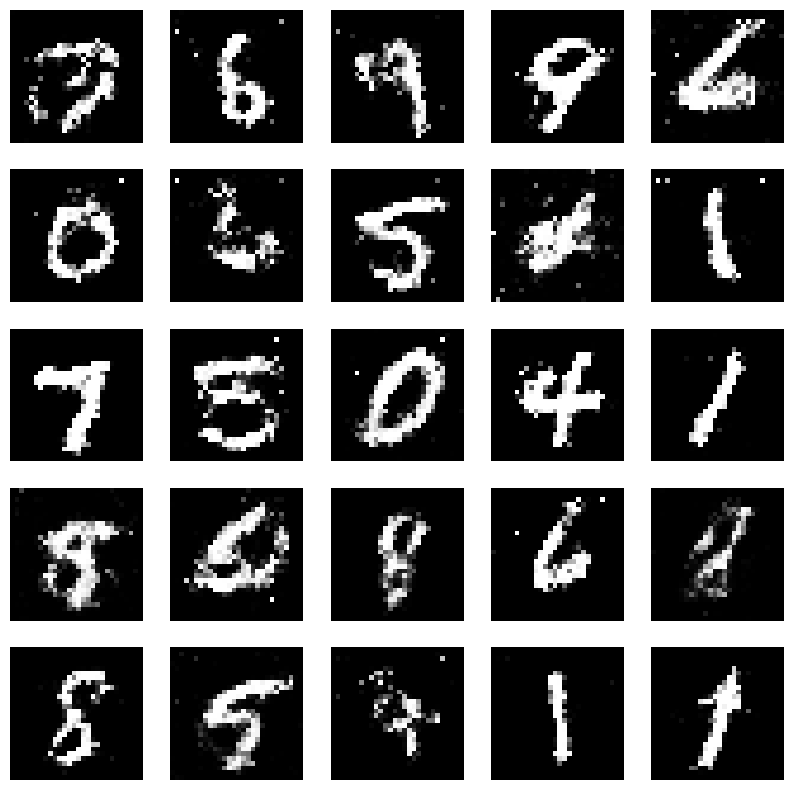

Epochs:  57


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:08,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<02:08,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:58,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<01:51,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:52,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/273 [00:02<01:49,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:02<01:52,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:49,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:43,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:45,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:42,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:05<01:42,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:44,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:43,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:42,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:43,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:38,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:08<01:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:34,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:39,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:43,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:39,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:44,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:42,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:46,  2.31it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 28/273 [00:11<01:53,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:53,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:53,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:13<01:56,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 32/273 [00:13<01:57,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:14<01:57,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 34/273 [00:14<01:54,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:15<01:55,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:50,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 37/273 [00:15<01:42,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:16<01:37,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:37,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:16<01:32,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:31,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:35,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:32,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:31,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:19<01:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:26,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:26,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:28,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:30,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:30,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:27,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:27,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:23<01:29,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:28,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:26,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:29,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:31,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:31,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 64/273 [00:26<01:34,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:27<01:38,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:37,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:28<01:36,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:28<01:36,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:29<01:34,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:29<01:37,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 71/273 [00:30<01:40,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:32,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:31<01:29,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:31<01:25,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:32<01:28,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:23,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:33<01:22,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:33<01:19,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:33<01:16,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:34<01:13,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:14,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:12,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:11,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:35<01:10,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:09,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:14,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 88/273 [00:36<01:11,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:37<01:16,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:14,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:13,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:39<01:13,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:39<01:10,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:09,  2.55it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 97/273 [00:40<01:14,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:41<01:18,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:17,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:42<01:21,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 101/273 [00:42<01:22,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 102/273 [00:43<01:24,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:43<01:24,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:44<01:21,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:44<01:20,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:15,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:45<01:12,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 108/273 [00:45<01:08,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:46<01:07,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:06,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:46<01:04,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:47<01:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:04,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:48<01:03,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:03,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:04,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:49<01:06,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:02,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<01:00,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:01,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<01:03,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:51<01:05,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:04,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:52<01:05,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:52<01:03,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<01:04,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:01,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<01:00,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:54<00:59,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:54<01:01,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:55<01:03,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<01:03,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:56<01:06,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 134/273 [00:56<01:05,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:57<01:08,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:57<01:07,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 137/273 [00:58<01:08,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:58<01:04,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:59<00:59,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:59<00:58,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:55,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:55,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:57,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 144/273 [01:01<00:56,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:55,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:02<00:52,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:02<00:53,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:02<00:52,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [01:03<00:51,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:03<00:49,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:04<00:50,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:04<00:47,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:49,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:05<00:51,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:49,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:06<00:49,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:47,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:07<00:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:07<00:45,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:08<00:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:42,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:09<00:46,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:09<00:51,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 165/273 [01:10<00:50,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 166/273 [01:10<00:55,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 167/273 [01:11<00:53,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:11<00:56,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:12<00:53,  1.93it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:12<00:51,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:13<00:46,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:13<00:44,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:13<00:42,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:14<00:40,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:14<00:40,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:15<00:38,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:15<00:39,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:15<00:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:16<00:37,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:16<00:36,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:17<00:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:17<00:34,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:17<00:34,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:18<00:34,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:18<00:34,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:19<00:34,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:19<00:33,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:31,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:20<00:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:20<00:31,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:20<00:30,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:21<00:31,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:21<00:29,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:21<00:29,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:22<00:31,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:22<00:32,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:23<00:34,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 198/273 [01:23<00:34,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 199/273 [01:24<00:36,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:25<00:37,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:25<00:36,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:26<00:35,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:26<00:34,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:26<00:32,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:27<00:30,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 206/273 [01:27<00:30,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:28<00:28,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:28<00:28,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:28<00:26,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:29<00:24,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:29<00:24,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:30<00:23,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:30<00:22,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:30<00:22,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:31<00:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:31<00:22,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:31<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:32<00:21,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:32<00:20,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:33<00:19,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:33<00:19,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:18,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:34<00:18,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:34<00:18,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:35<00:17,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:36<00:17,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:36<00:17,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:37<00:18,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:37<00:19,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:38<00:18,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:38<00:18,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:39<00:18,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:39<00:17,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 236/273 [01:39<00:17,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:40<00:16,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:40<00:16,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:41<00:14,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:14,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:42<00:12,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:42<00:12,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:43<00:11,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:43<00:11,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:44<00:10,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:44<00:10,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:45<00:09,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:46<00:08,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:47<00:07,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:48<00:06,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:49<00:05,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 270/273 [01:54<00:01,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 272/273 [01:55<00:00,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:55<00:00,  2.36it/s]


Perdidas:  0.6778613328933716 , 0.7515347003936768
1/1 [==============================] - 0s 34ms/step


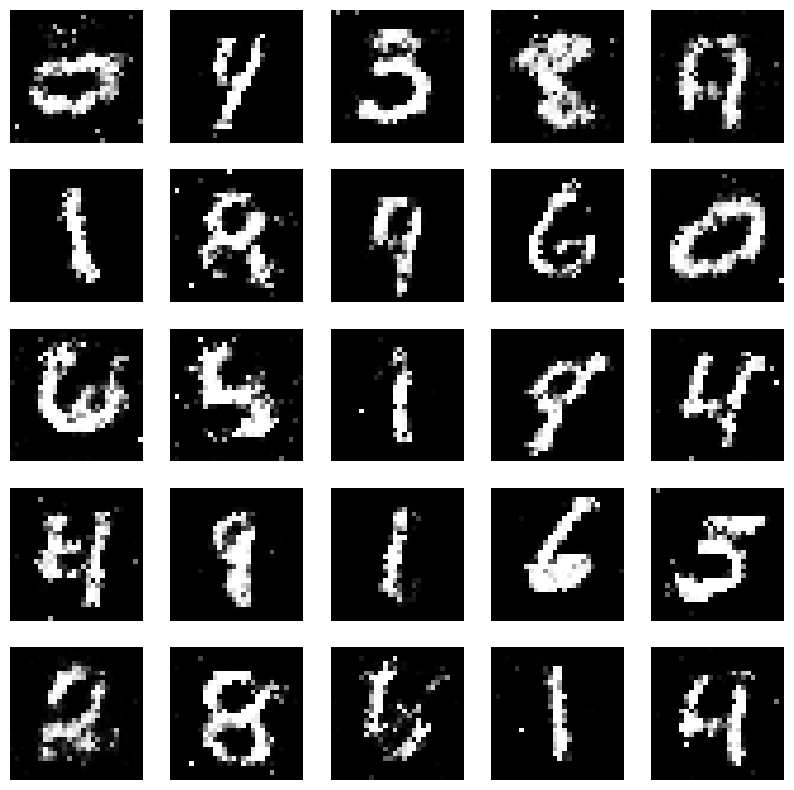

Epochs:  58


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:33,  2.91it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:35,  2.84it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:39,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:50,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:49,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:46,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:53,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:51,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:52,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:48,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:35,  2.68it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 17/273 [00:06<01:47,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:07<01:51,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:52,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:08<01:52,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:08<01:53,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<01:52,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 23/273 [00:09<01:52,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:53,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:10<01:55,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:11<01:57,  2.11it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:53,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:44,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 29/273 [00:12<01:40,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:37,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:12<01:36,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:32,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.54it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 36/273 [00:15<01:39,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:36,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:17<01:27,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:29,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:29,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:28,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:25,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:23,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:24,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:21<01:28,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:22<01:32,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 55/273 [00:22<01:35,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 56/273 [00:22<01:35,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:35,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:37,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:42,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:44,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:43,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:25<01:35,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:30,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:26<01:28,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:27,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:22,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:14,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:14,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:16,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:14,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:31<01:14,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:14,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:31<01:14,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:18,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:17,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:15,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:33<01:19,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:34<01:16,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:12,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:21,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 88/273 [00:36<01:21,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 89/273 [00:36<01:22,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 90/273 [00:36<01:21,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:37<01:23,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:25,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:25,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:38<01:24,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:25,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:18,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:12,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:11,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 101/273 [00:41<01:06,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:07,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:42<01:05,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:04,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 110/273 [00:45<01:01,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<00:59,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:00,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<00:59,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<00:58,  2.73it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 115/273 [00:46<00:58,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<00:57,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<01:01,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:48<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:59,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:57,  2.64it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 123/273 [00:50<01:01,  2.46it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:50<01:04,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:51<01:06,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 126/273 [00:51<01:13,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 127/273 [00:52<01:12,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 128/273 [00:52<01:12,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 129/273 [00:53<01:10,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<01:07,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:54<01:05,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:54<01:03,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<01:02,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<01:01,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<00:58,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:54,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<00:54,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:57<00:53,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:52,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:58<00:52,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:58<00:51,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:50,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:47,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:46,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:48,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [01:01<00:47,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:01<00:46,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:01<00:45,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:02<00:44,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:02<00:44,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 156/273 [01:03<00:44,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 158/273 [01:04<00:49,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 159/273 [01:05<00:51,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:05<00:52,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:06<00:51,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:52,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 163/273 [01:07<00:53,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 164/273 [01:07<00:55,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 165/273 [01:08<01:15,  1.43it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<01:05,  1.63it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:57,  1.84it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:10<00:52,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:51,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:10<00:46,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:43,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:43,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [01:12<00:44,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:41,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:12<00:40,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:40,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:37,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:37,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:14<00:37,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:15<00:37,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:16<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:16<00:34,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:34,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:18<00:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:18<00:34,  2.44it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 191/273 [01:19<00:34,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:19<00:35,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:36,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:20<00:37,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:21<00:36,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 196/273 [01:21<00:38,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:22<00:39,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 198/273 [01:22<00:36,  2.06it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:23<00:34,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 200/273 [01:23<00:33,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:24<00:31,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:24<00:30,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:28,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:27<00:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:23,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:23,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:30<00:22,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:21,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:20,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:32<00:20,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:21,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:21,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:34<00:22,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:34<00:22,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:35<00:21,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:35<00:21,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:36<00:21,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:36<00:20,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:37<00:18,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:16,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:12,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:08,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:08,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:07,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:06,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.77it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6886171698570251 , 0.7473419904708862
1/1 [==============================] - 0s 29ms/step


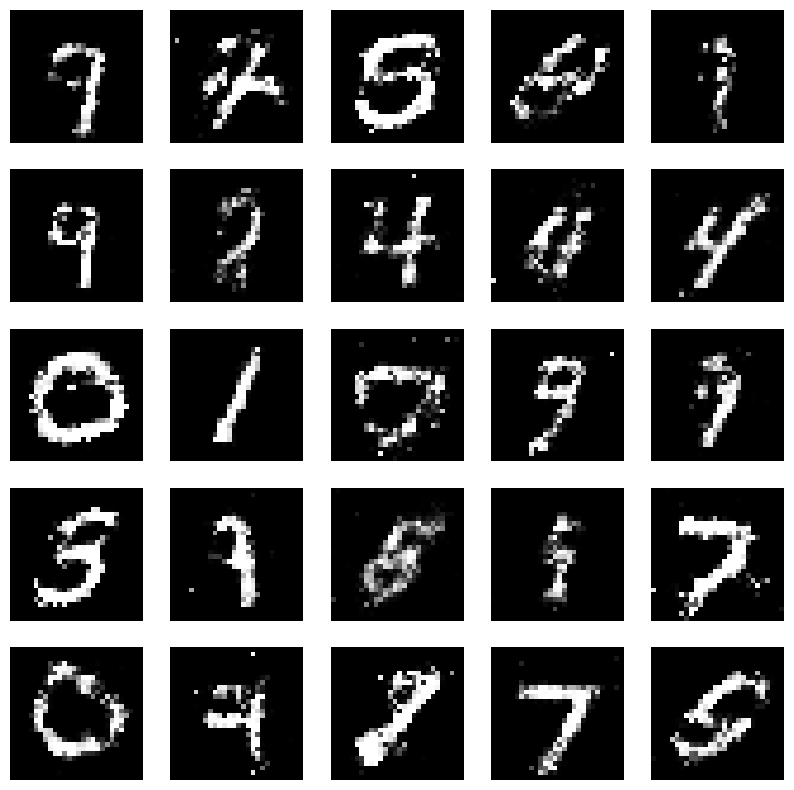

Epochs:  59


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:46,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:50,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:48,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:46,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:46,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:48,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:43,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:43,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:04<01:48,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:54,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:05<01:55,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:06<01:58,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 16/273 [00:06<02:02,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:07<02:00,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 18/273 [00:07<02:05,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<02:04,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:08<02:03,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:51,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<01:52,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:49,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:10<01:37,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:36,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:34,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:37,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:12<01:34,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:33,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:31,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:38,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:37,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:31,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:28,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:26,  2.71it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:27,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:26,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:27,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:25,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:25,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:27,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 47/273 [00:19<01:29,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:35,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:20<01:36,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:45,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 51/273 [00:21<01:47,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:21<01:47,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:22<01:44,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:22<01:42,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 55/273 [00:23<01:44,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:41,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:31,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:27,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:21,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:23,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:20,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 66/273 [00:27<01:22,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:19,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:18,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:16,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:17,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:29<01:16,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:16,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:12,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:13,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:12,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:32<01:12,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:17,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:33<01:20,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:34<01:23,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:34<01:27,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:25,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:35<01:28,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:26,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:25,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 90/273 [00:37<01:36,  1.90it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:30,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:23,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:38<01:19,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:39<01:16,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:22,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:26,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:23,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:15,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:41<01:14,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:10,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:07,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:04,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:03,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:05,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:03,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 106/273 [00:43<01:02,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:04,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:03,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:00,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:01,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 116/273 [00:47<01:02,  2.53it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 117/273 [00:48<01:05,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:07,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:49<01:11,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:49<01:11,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:50<01:12,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:50<01:12,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:51<01:13,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:51<01:12,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:52<01:13,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<01:11,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:05,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<01:01,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:58,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:54<00:55,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 131/273 [00:54<00:55,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:54<00:53,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:52,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<01:01,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:58,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:55,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 137/273 [00:57<00:54,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:52,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:54,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:58<00:53,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:58<00:51,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:51,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:49,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:47,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [01:00<00:49,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:50,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:48,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:47,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:47,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:49,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:48,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:51,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 153/273 [01:03<00:52,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 154/273 [01:03<00:53,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:04<00:54,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:04<00:55,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:05<00:55,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:53,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 159/273 [01:06<00:53,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:06<00:54,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:53,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 162/273 [01:07<00:50,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:46,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:46,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 165/273 [01:08<00:44,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:09<00:42,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:09<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:40,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:40,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:38,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:37,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:12<00:36,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:38,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:34,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:34,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 184/273 [01:16<00:34,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:16<00:34,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:34,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:37,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 188/273 [01:17<00:37,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 189/273 [01:18<00:38,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 190/273 [01:18<00:38,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 191/273 [01:19<00:41,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 192/273 [01:20<00:40,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:20<00:39,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:20<00:38,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 195/273 [01:21<00:37,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:34,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 197/273 [01:22<00:34,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:31,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:24<00:27,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:24<00:26,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:25<00:25,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:25<00:24,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:24,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:25,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:28<00:25,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:24,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:20,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:31<00:19,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:19,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:31<00:20,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:32<00:22,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 224/273 [01:32<00:23,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:33<00:22,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:33<00:22,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 227/273 [01:34<00:21,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:34<00:22,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 229/273 [01:35<00:20,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:19,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:17,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:17,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:09,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:07,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:45<00:07,  2.35it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:46<00:07,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:47<00:06,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:48<00:05,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.22it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6839523911476135 , 0.7257172465324402
1/1 [==============================] - 0s 28ms/step


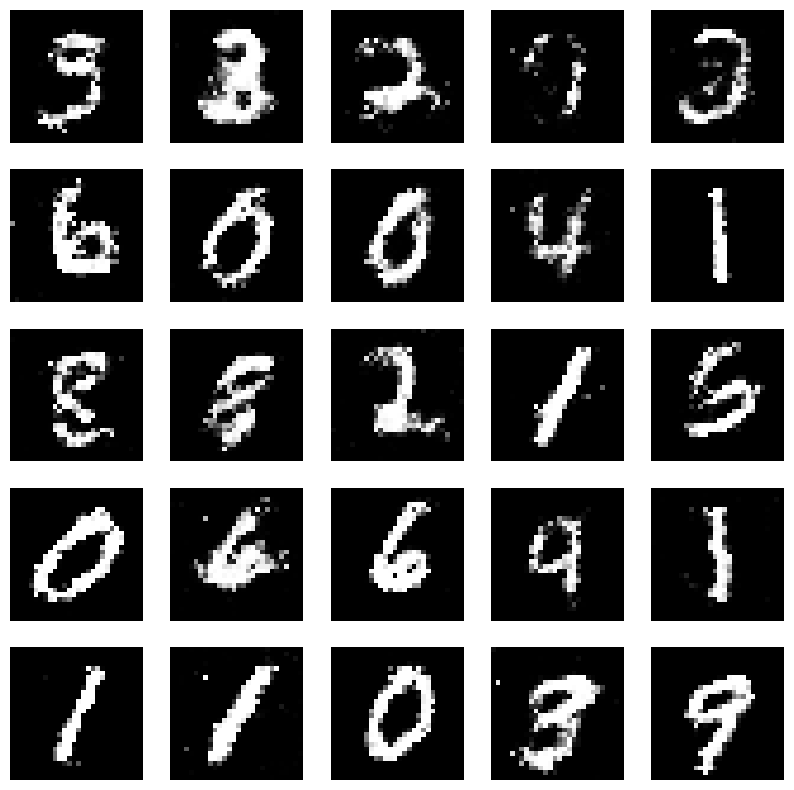

Epochs:  60


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:36,  2.83it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<01:40,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:42,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:50,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:46,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:46,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:49,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:03<02:00,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:03,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<02:03,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 12/273 [00:05<02:06,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:05<02:02,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:06<02:02,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<02:04,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 16/273 [00:07<01:58,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:56,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:54,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:49,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:46,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:42,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:09<01:41,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:38,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:32,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:33,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:30,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:33,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:33,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:32,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:12<01:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:34,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:32,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:14<01:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:31,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:33,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:32,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:31,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:39,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:42,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:18<01:43,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:44,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:41,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 48/273 [00:20<01:43,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:41,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:41,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:21<01:35,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:34,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:30,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:29,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:29,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:25,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:27,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:26,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:25<01:21,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:21,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:22,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:27<01:18,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:16,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:18,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:16,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:16,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:15,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:14,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:13,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:14,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:15,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:17,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:31<01:25,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:26,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:26,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:29,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:33<01:31,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:34<01:27,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 84/273 [00:34<01:29,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:35<01:24,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:22,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:18,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:20,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:17,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:08,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:08,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:08,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 94/273 [00:38<01:09,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:07,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:06,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:40<01:05,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:04,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 100/273 [00:41<01:14,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:13,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:13,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:08,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:42<01:06,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 106/273 [00:43<01:05,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:43<01:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<01:02,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:45<01:07,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:46<01:10,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:11,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:12,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 116/273 [00:47<01:13,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:48<01:14,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:48<01:14,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 119/273 [00:49<01:14,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:49<01:15,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:50<01:12,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:50<01:07,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:04,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:59,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<00:59,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:57,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:54,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<00:54,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:53<00:54,  2.65it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 131/273 [00:54<00:56,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:54<01:03,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:59,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:56,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<00:51,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 139/273 [00:57<00:50,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:48,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<00:48,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:48,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:51,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:52,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:51,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:54,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:57,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 150/273 [01:01<00:58,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:57,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 152/273 [01:02<00:58,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:03<00:58,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 154/273 [01:03<00:58,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 155/273 [01:04<00:57,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:52,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:50,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:47,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:05<00:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:42,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:41,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:42,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:42,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:08<00:41,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:08<00:40,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:09<00:43,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:09<00:43,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:43,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:10<00:43,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:43,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:11<00:41,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:12<00:42,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 176/273 [01:12<00:41,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:38,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:38,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:38,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:14<00:40,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:15<00:40,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 183/273 [01:15<00:41,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:16<00:41,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:39,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:40,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:17<00:39,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 188/273 [01:18<00:40,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:18<00:38,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:18<00:36,  2.29it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 191/273 [01:19<00:34,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:19<00:34,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:33,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:20<00:29,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [01:21<00:29,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:29,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:28,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:24<00:25,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:24<00:25,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:24,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:23,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:23,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:26<00:23,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:22,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:21,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:29<00:23,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:29<00:24,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 218/273 [01:30<00:27,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:30<00:26,  2.06it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 220/273 [01:31<00:25,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:31<00:25,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:32<00:26,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:32<00:24,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:32<00:22,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:20,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 226/273 [01:33<00:19,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 228/273 [01:34<00:18,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:34<00:18,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:18,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:35<00:17,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:16,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:37<00:16,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:38<00:16,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:15,  2.24it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:39<00:14,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 240/273 [01:39<00:14,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:10,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:09,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:45<00:09,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:08,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:47<00:06,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6797580718994141 , 0.7390657067298889
1/1 [==============================] - 0s 28ms/step


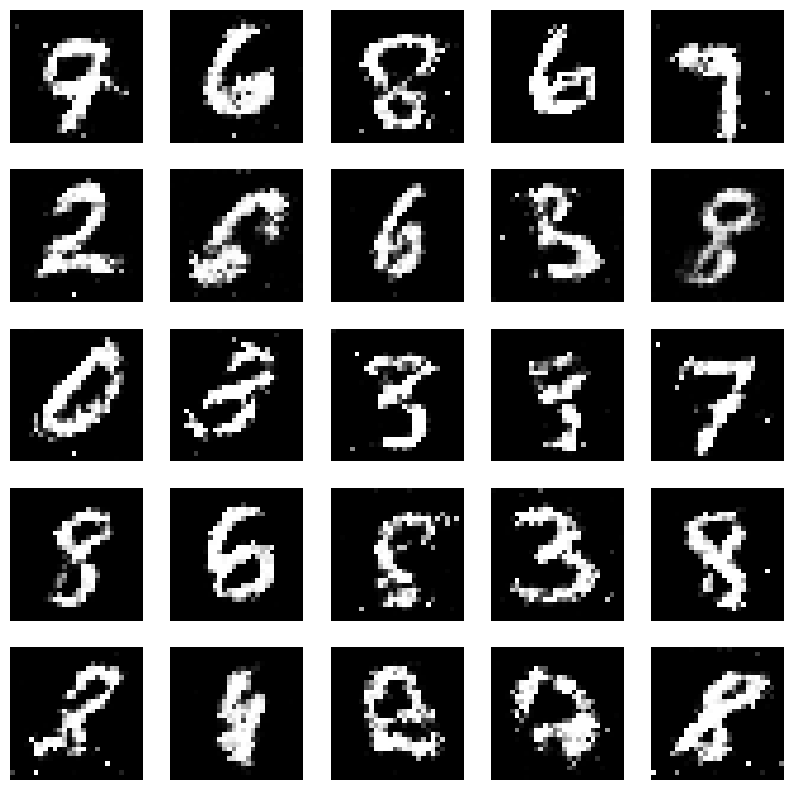

Epochs:  61


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<01:55,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/273 [00:00<01:59,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<02:10,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<02:09,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<02:05,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<02:06,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:03<02:07,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 8/273 [00:03<02:05,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:04<02:09,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<02:05,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:05<01:55,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:49,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:45,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<01:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:43,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 16/273 [00:07<01:43,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:40,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:34,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:35,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:35,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:34,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 24/273 [00:10<01:40,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:38,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:35,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:31,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:29,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:29,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:28,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:27,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:29,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:28,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:27,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:14<01:31,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:38,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:36,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:40,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:16<01:47,  2.16it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 42/273 [00:17<01:49,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:52,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:54,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:52,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:43,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:37,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:33,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:20<01:32,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:28,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:24,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:21<01:24,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:22,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:23,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:23,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:23,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:22,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:21,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:25<01:22,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:20,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:26<01:21,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:19,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:33,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:28<01:27,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:27,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:27,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 73/273 [00:29<01:23,  2.39it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 74/273 [00:30<01:28,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:30<01:28,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:28,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:31<01:29,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 78/273 [00:32<01:39,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:32<01:32,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:27,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 81/273 [00:33<01:22,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:18,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:13,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:12,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:12,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:11,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:11,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:11,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:07,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:07,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:06,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:06,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:40<01:05,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:05,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:41<01:05,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:42<01:05,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:42<01:04,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 105/273 [00:42<01:04,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:43<01:08,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 107/273 [00:43<01:11,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 108/273 [00:44<01:13,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 109/273 [00:44<01:16,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:16,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 111/273 [00:45<01:17,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:19,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 113/273 [00:46<01:18,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:47<01:19,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:12,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:07,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:04,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<01:01,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:58,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:49<00:57,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:50<00:58,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:54,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:51<00:56,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:54,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<00:54,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:52<00:52,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:55,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:53<00:53,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:54,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:53,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:54<00:57,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:55<00:53,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:55<00:51,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<00:51,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:56<00:50,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<00:51,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:57<00:55,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:58<00:56,  2.32it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 143/273 [00:58<01:02,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [00:59<01:04,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 145/273 [00:59<01:03,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:00<01:08,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:00<01:04,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:01<01:04,  1.95it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:58,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:54,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:51,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:48,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:47,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:05<00:45,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:05<00:44,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:44,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 162/273 [01:06<00:48,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:07<00:46,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:07<00:44,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:08<00:45,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:42,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:08<00:43,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:09<00:40,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:09<00:38,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:10<00:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:38,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:39,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:11<00:39,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:12<00:41,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:12<00:45,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:13<00:44,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [01:13<00:43,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [01:14<00:43,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:43,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 181/273 [01:15<00:44,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 182/273 [01:15<00:43,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 183/273 [01:15<00:42,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:40,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:38,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:37,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:35,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:34,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:19<00:31,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:19<00:29,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:30,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:31,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:31,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:21<00:29,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:29,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:23<00:28,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:24<00:28,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:27,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:25<00:28,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:27,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:26<00:26,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:28,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 211/273 [01:27<00:28,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:27<00:29,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:30,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:28<00:28,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:29<00:28,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:29<00:27,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:30<00:26,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:30<00:24,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:31<00:32,  1.68it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:32<00:29,  1.81it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:32<00:26,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:32<00:24,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:22,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:21,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:20,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 230/273 [01:36<00:18,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:17,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:16,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:39<00:15,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:41<00:14,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:41<00:14,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:42<00:13,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:43<00:12,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 247/273 [01:43<00:12,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 248/273 [01:44<00:12,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:44<00:11,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:45<00:10,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:45<00:10,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:46<00:09,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:46<00:08,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:05,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:49<00:05,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6875436305999756 , 0.7742114663124084
1/1 [==============================] - 0s 40ms/step


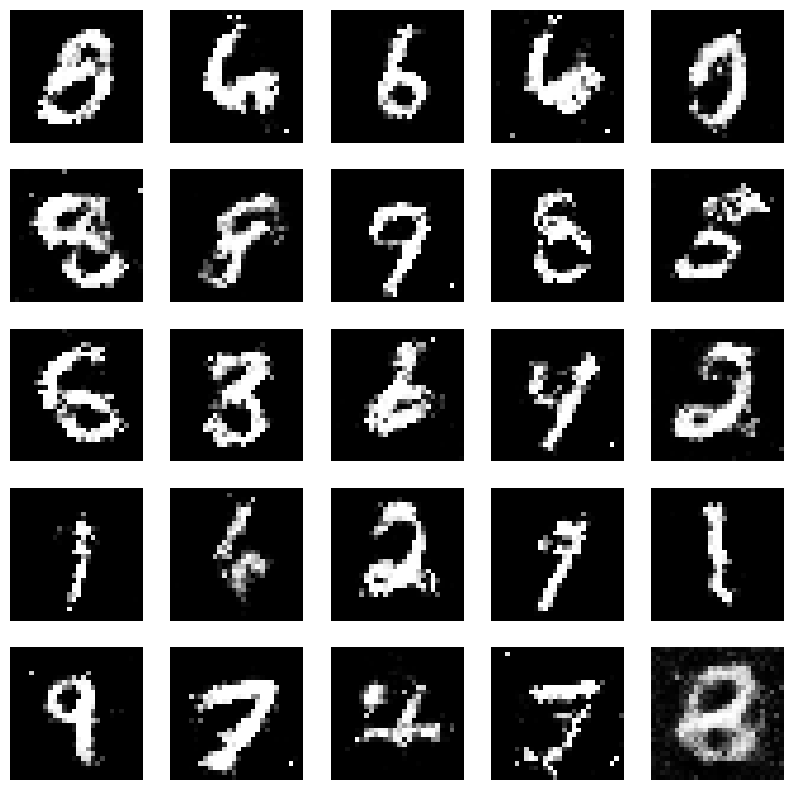

Epochs:  62


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<02:00,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<02:02,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:48,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:47,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<01:48,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:44,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 8/273 [00:03<01:44,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:47,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:39,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:39,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:34,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:34,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:38,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:43,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:40,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:36,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:37,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:10<01:35,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:40,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:11<01:43,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:12<01:48,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:48,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 32/273 [00:12<01:49,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:49,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:13<01:49,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:49,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 36/273 [00:14<01:51,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:49,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:42,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:38,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:16<01:37,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:34,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:17<01:32,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.68it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 48/273 [00:19<01:23,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:20<01:25,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:23,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:22<01:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:24,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:23<01:24,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 60/273 [00:24<01:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:27,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:25<01:22,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:26<01:29,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:26<01:29,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:31,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:28,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▌       | 69/273 [00:28<01:30,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:28<01:33,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:34,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:33,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 73/273 [00:29<01:29,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:23,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:19,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:17,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:31<01:17,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:13,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:13,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:32<01:12,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:11,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:10,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:09,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:34<01:10,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:34<01:08,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:13,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:35<01:10,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:35<01:10,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:10,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:36<01:09,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 92/273 [00:37<01:09,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:37<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:37<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:38<01:08,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:09,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:39<01:11,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:39<01:11,  2.43it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 100/273 [00:40<01:15,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 101/273 [00:40<01:16,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:41<01:19,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:19,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:42<01:19,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:42<01:21,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 106/273 [00:43<01:20,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 107/273 [00:43<01:20,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 108/273 [00:44<01:19,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:14,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:10,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:04,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<01:00,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:46<01:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<00:58,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:59,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<00:59,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:48<00:58,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:48<00:58,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:49<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:57,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:49<00:57,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:57,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:50<00:56,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:51<00:54,  2.67it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 127/273 [00:51<00:55,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:51<00:56,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:52<00:55,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:52<00:55,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<00:56,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:53<00:58,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:53<00:59,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:54<00:56,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:54<00:59,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 136/273 [00:55<01:04,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 137/273 [00:55<01:04,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:56<01:05,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 139/273 [00:56<01:03,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:57<01:02,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:57<01:04,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<01:02,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:58<01:00,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<01:02,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:56,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:53,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:51,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [01:00<00:49,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:01<00:47,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [01:01<00:45,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:45,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:02<00:45,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [01:03<00:45,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:44,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:42,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:04<00:42,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:41,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:05<00:41,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:05<00:41,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:05<00:41,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:06<00:41,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:06<00:40,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:07<00:40,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:07<00:39,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:07<00:39,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [01:08<00:39,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:08<00:40,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 170/273 [01:09<00:43,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:09<00:47,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [01:10<00:46,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 173/273 [01:10<00:48,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 174/273 [01:11<00:49,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:11<00:49,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:46,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:12<00:47,  2.04it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [01:13<00:45,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:41,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:13<00:39,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:35,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:14<00:34,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:15<00:32,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:32,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:16<00:32,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:16<00:33,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:33,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:18<00:31,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:18<00:30,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:19<00:30,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:19<00:30,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [01:20<00:29,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:20<00:29,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:21<00:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:21<00:28,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:21<00:27,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:22<00:27,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:22<00:27,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:23<00:27,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 205/273 [01:23<00:28,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 206/273 [01:24<00:29,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 207/273 [01:24<00:29,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:25<00:31,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 209/273 [01:25<00:32,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:26<00:31,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:26<00:31,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 212/273 [01:27<00:29,  2.06it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:27<00:28,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:27<00:26,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:24,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:22,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:29<00:22,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:29<00:21,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:29<00:21,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:30<00:19,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:31<00:19,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:32<00:17,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:32<00:16,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:16,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:33<00:16,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:33<00:15,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:34<00:15,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:34<00:15,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:14,  2.68it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 234/273 [01:35<00:14,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:35<00:14,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:36<00:13,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:37<00:14,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:37<00:14,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:38<00:14,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 241/273 [01:38<00:15,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:39<00:14,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 244/273 [01:40<00:13,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:40<00:13,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 246/273 [01:41<00:13,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:41<00:10,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:10,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:09,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:43<00:09,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:43<00:08,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:45<00:05,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:46<00:04,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:48<00:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:50<00:00,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.6953504681587219 , 0.7382221221923828
1/1 [==============================] - 0s 27ms/step


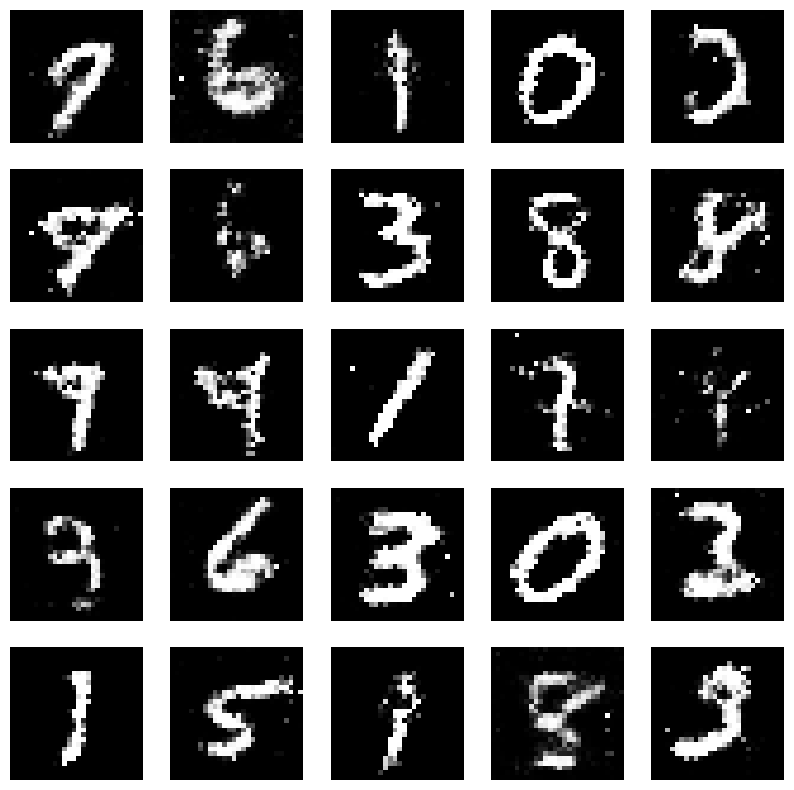

Epochs:  63


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:54,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:43,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:37,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<02:02,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:02<01:55,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:48,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:44,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:43,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:03<01:42,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:36,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:05<01:40,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 17/273 [00:06<01:41,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:40,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:07<01:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:40,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:09<01:36,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:09<01:44,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 26/273 [00:10<01:52,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:10<01:56,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<02:02,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:12<02:01,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:12<02:05,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:13<02:01,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:13<01:59,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:53,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:46,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 35/273 [00:14<01:45,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:39,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:15<01:36,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:31,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:29,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:32,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:30,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:18<01:34,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:31,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:32,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:27,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:28,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:20,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:19,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:19,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 59/273 [00:24<01:22,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:26,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:28,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:25<01:31,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:25<01:35,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:26<01:34,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:36,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:27<01:40,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:27<01:39,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 68/273 [00:28<01:37,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:31,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:28,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:25,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:22,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:20,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:21,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:17,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:16,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:31<01:17,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:17,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:13,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:17,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:17,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 83/273 [00:34<01:18,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:16,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:13,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:35<01:13,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:11,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:13,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 91/273 [00:37<01:14,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:12,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 93/273 [00:38<01:12,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:38<01:16,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:39<01:18,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 97/273 [00:40<01:19,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:40<01:25,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:25,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:41<01:28,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 101/273 [00:42<01:25,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:17,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:14,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:43<01:15,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:43<01:11,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:07,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:08,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:45<01:08,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 40%|████      | 110/273 [00:45<01:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:03,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:46<01:04,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:47<01:03,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:04,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:48<01:03,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:03,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:00,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:49<00:59,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:59,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<00:59,  2.53it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 123/273 [00:51<01:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:01,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<00:59,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:59,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:52<01:03,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 128/273 [00:53<01:06,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:53<01:08,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 130/273 [00:54<01:12,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:54<01:12,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:55<01:11,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:55<01:08,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 134/273 [00:56<01:07,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 135/273 [00:56<01:05,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:57<01:00,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:58,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:57<00:56,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:58<00:57,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:54,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:52,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:52,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:59<00:54,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:00<00:57,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:54,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:01<00:52,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:01<00:50,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:49,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:47,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:46,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:03<00:48,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:48,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:47,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:04<00:49,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:05<00:49,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:44,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:50,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 162/273 [01:07<00:51,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:53,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:08<00:52,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 165/273 [01:09<00:52,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:09<00:52,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 167/273 [01:10<00:51,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:10<00:51,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:11<00:49,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:11<00:46,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:43,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:42,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:12<00:40,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:13<00:39,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:13<00:39,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 176/273 [01:13<00:38,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:39,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:14<00:38,  2.46it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [01:15<00:38,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:36,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:15<00:36,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:16<00:35,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 183/273 [01:16<00:35,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:17<00:33,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:33,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:32,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 191/273 [01:19<00:32,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.52it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:32,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:32,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [01:22<00:33,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:22<00:35,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:23<00:35,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 200/273 [01:23<00:34,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 201/273 [01:24<00:34,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:24<00:34,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:25<00:34,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:25<00:34,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:26<00:32,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:26<00:30,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:27<00:28,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:27,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:26,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:26,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 212/273 [01:29<00:27,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:29<00:25,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:30<00:23,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:30<00:23,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:30<00:23,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:31<00:23,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:31<00:23,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:32<00:22,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:22,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:33<00:22,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:33<00:20,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:34<00:20,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:35<00:17,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:36<00:17,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 230/273 [01:36<00:18,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 231/273 [01:37<00:18,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:37<00:18,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:38<00:20,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 234/273 [01:38<00:20,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:39<00:19,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:39<00:18,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:40<00:17,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 238/273 [01:40<00:16,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:41<00:14,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:42<00:12,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:42<00:12,  2.41it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 244/273 [01:43<00:12,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:43<00:11,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:44<00:10,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:45<00:09,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:47<00:07,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:05,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:49<00:04,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:03,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 266/273 [01:52<00:03,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:54<00:01,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:55<00:00,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.6664344072341919 , 0.7264938354492188
1/1 [==============================] - 0s 35ms/step


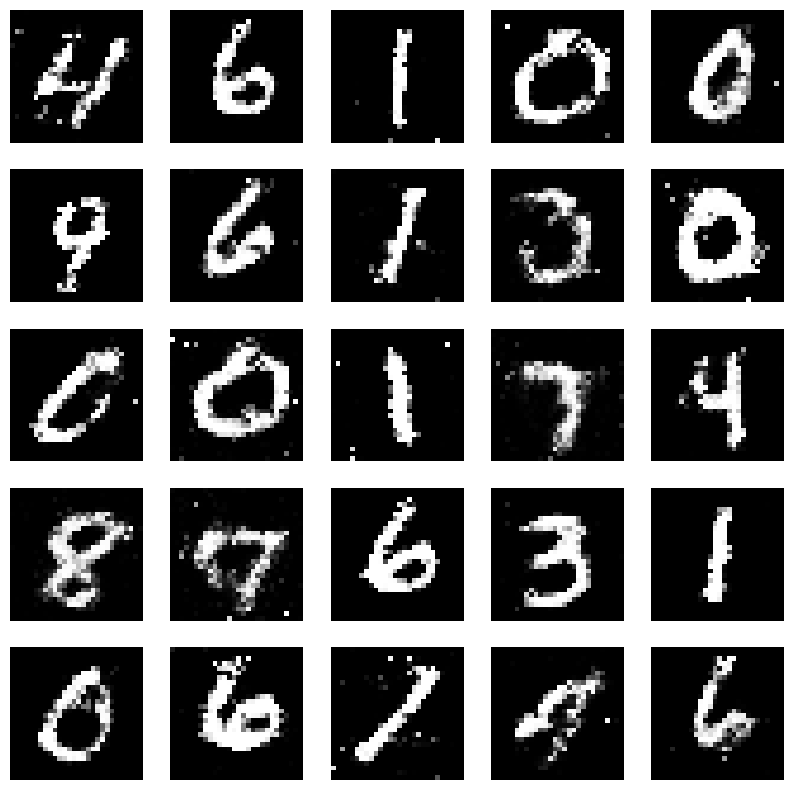

Epochs:  64


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:35,  2.85it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:46,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:47,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<01:43,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:40,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:46,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:44,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:43,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:42,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:45,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 16/273 [00:06<01:47,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 17/273 [00:06<01:48,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 18/273 [00:07<01:50,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:07<01:48,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:08<01:51,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:08<01:52,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:51,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:52,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:50,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:10<01:49,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:50,  2.24it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:43,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:41,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:11<01:38,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:36,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:12<01:37,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:30,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:30,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:14<01:29,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:27,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:15<01:31,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:33,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:31,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:24,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:26,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:19<01:25,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:22,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:20<01:24,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:29,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 54/273 [00:21<01:37,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 55/273 [00:22<01:44,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 56/273 [00:22<01:46,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 57/273 [00:23<01:44,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 58/273 [00:23<01:44,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:52,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 60/273 [00:24<01:44,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:36,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:31,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:31,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:26,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:23,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:27<01:23,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:21,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:21,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:20,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:18,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 72/273 [00:29<01:19,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:19,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:19,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:30<01:18,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:31<01:19,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:17,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:16,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:18,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:33<01:17,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:13,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:10,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:34<01:09,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:35<01:13,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 87/273 [00:35<01:17,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:36<01:23,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:36<01:22,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:22,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:23,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:27,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:38<01:26,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 94/273 [00:38<01:29,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:39<01:28,  2.01it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:40<01:16,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:11,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:07,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:42<01:07,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:42<01:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:03,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:06,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:44<01:04,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:44<01:04,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:45<01:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:06,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:03,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:03,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:46<01:03,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 116/273 [00:47<00:59,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<01:03,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:49<01:01,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:59,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:50<01:03,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:50<01:06,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 124/273 [00:51<01:10,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 125/273 [00:51<01:07,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 126/273 [00:51<01:04,  2.27it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 127/273 [00:52<01:09,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:52<01:09,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:53<01:07,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:53<01:10,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:54<01:08,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<01:03,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<01:01,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:57,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:56,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:54,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:51,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:54,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:57<00:52,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:53,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 142/273 [00:58<00:51,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:52,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:48,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:00<00:49,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:48,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:46,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:01<00:45,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:45,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:45,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:45,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:03<00:48,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:48,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:04<00:45,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:50,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:05<00:52,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:05<00:53,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:06<00:55,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:54,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:07<00:53,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:07<00:51,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 164/273 [01:08<00:52,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:50,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:08<00:47,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:45,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:42,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:10<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:38,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:12<00:38,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:37,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:13<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:36,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:35,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:16<00:32,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:32,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:18<00:31,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:19<00:35,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:36,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:20<00:36,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 196/273 [01:21<00:37,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 197/273 [01:21<00:40,  1.88it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:22<00:39,  1.92it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:37,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:34,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:23<00:31,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:23<00:30,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:30,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:28,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:28,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:26,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:25,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:27,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:27<00:26,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:25,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:29<00:23,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:29<00:22,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:31<00:19,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.61it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 224/273 [01:32<00:19,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.19it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 228/273 [01:34<00:21,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:35<00:21,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:35<00:20,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:36<00:20,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:36<00:19,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:36<00:18,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:17,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:16,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:15,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:48<00:05,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6811739206314087 , 0.7180229425430298
1/1 [==============================] - 0s 36ms/step


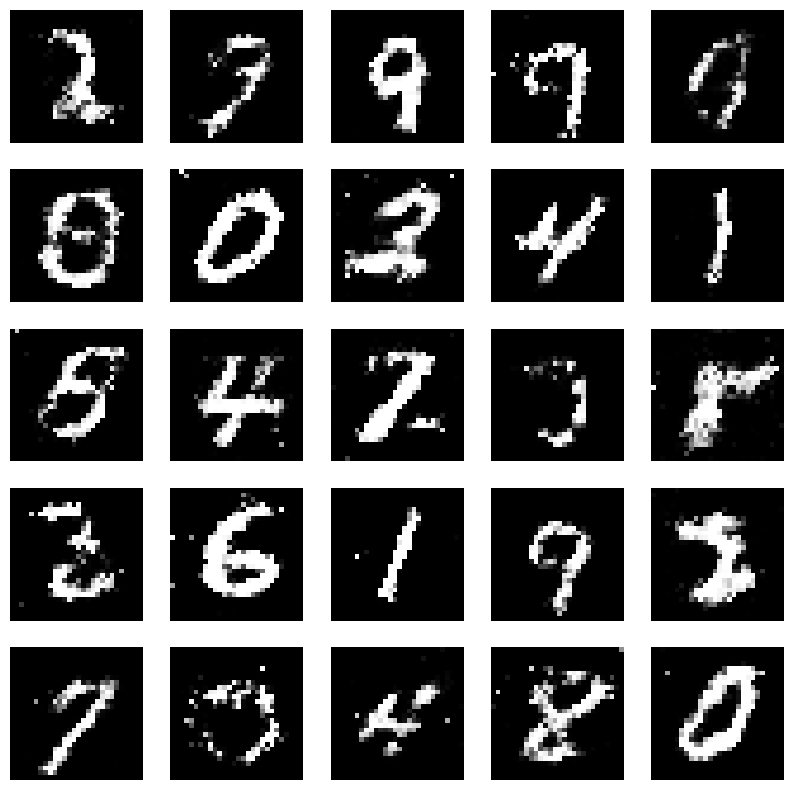

Epochs:  65


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:04,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:51,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:43,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:43,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:44,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 11/273 [00:04<01:49,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 12/273 [00:04<02:00,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:05<02:03,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:05<02:02,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 15/273 [00:06<02:01,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<02:02,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 17/273 [00:07<02:03,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:57,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:53,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:51,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:46,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:43,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:39,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:37,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:10<01:35,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:31,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:31,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:12<01:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:34,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:31,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:28,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:32,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:35,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:35,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:18<01:45,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:42,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 46/273 [00:19<01:45,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 47/273 [00:19<01:48,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 48/273 [00:20<01:43,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:44,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:45,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:21<01:43,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:38,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:33,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:28,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:30,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:26,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:27,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:24<01:23,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:23,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:19,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:16,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:16,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:16,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:19,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:20,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:18,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:30<01:17,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:31<01:19,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:32<01:23,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:25,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:33<01:31,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:33<01:31,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:34<01:33,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:35<01:33,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:35<01:34,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:36<01:32,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:27,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:19,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:18,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:15,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:09,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:07,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:10,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:12,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 97/273 [00:40<01:11,  2.47it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 98/273 [00:40<01:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:08,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:41<01:07,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:07,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:10,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:11,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:11,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:44<01:05,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:01,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:45<00:59,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:07,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:46<01:08,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:47<01:10,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:47<01:12,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:14,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:48<01:17,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [00:49<01:16,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:49<01:14,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:50<01:12,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:50<01:09,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:51<01:05,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:51<01:04,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:01,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:59,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<01:00,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:52<00:57,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:53<00:57,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<01:00,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:54<01:00,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:54<00:58,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:54,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:55,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:52,  2.61it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:51,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:57<00:54,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:52,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:52,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:53,  2.44it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:59<00:54,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:51,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [01:00<00:51,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:00<00:51,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:01<00:54,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:01<00:56,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:02<00:57,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 150/273 [01:02<00:57,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:03<00:57,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 152/273 [01:03<00:56,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 153/273 [01:03<00:55,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▋    | 154/273 [01:04<00:56,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:05<01:01,  1.92it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:59,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:53,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:06<00:50,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:47,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 161/273 [01:07<00:43,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:42,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:08<00:41,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 164/273 [01:08<00:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:44,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:42,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:43,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:11<00:37,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:36,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:36,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 175/273 [01:12<00:36,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:35,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:36,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:15<00:36,  2.50it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:15<00:38,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:16<00:39,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 184/273 [01:16<00:41,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:17<00:40,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:40,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:18<00:41,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:18<00:40,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 189/273 [01:19<00:41,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:39,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:19<00:37,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:20<00:35,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:35,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:21<00:33,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:32,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:21<00:32,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:30,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:29,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:26,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:26,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:25,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 205/273 [01:25<00:25,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:21,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:30<00:23,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:30<00:24,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:31<00:24,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 220/273 [01:31<00:24,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:24,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 222/273 [01:32<00:24,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:32<00:23,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:23,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:33<00:23,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:34<00:21,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:19,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:14,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:12,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:11,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:11,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.37it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:45<00:10,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:46<00:09,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:47<00:08,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6996920704841614 , 0.7372956871986389
1/1 [==============================] - 0s 33ms/step


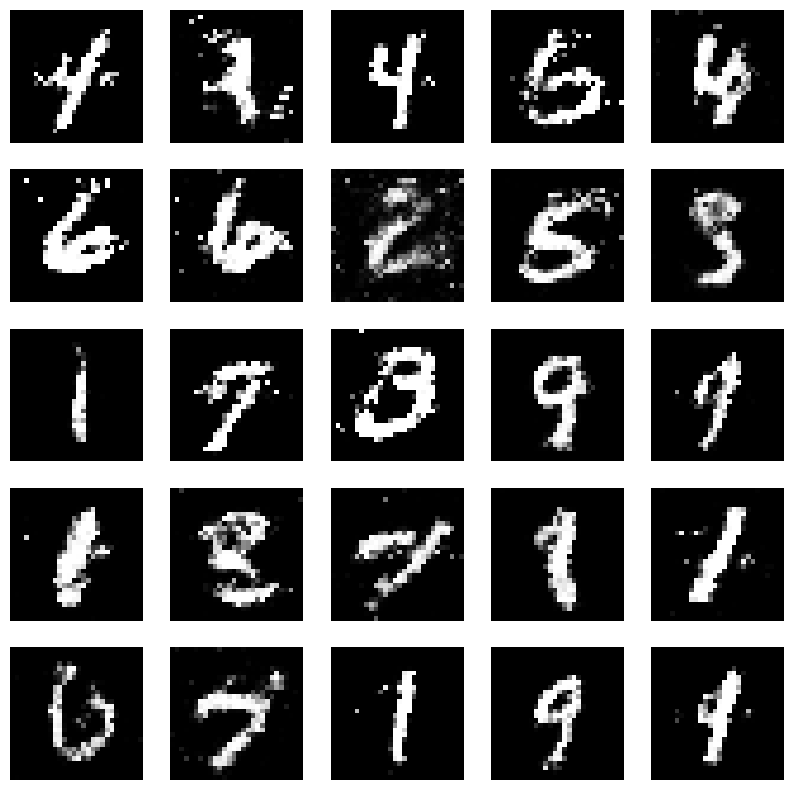

Epochs:  66


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:49,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<02:07,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:13,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<02:16,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<02:11,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<02:15,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 7/273 [00:03<02:15,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 8/273 [00:03<02:09,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/273 [00:04<02:14,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<02:10,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<01:59,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:50,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:06<01:47,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:06<01:43,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:40,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<02:21,  1.82it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:08<02:07,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:08<01:58,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 19/273 [00:09<02:03,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:09<01:58,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:51,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:10<01:52,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:47,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:11<01:44,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:11<01:56,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:12<01:52,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:12<01:46,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:12<01:45,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:13<01:40,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:13<01:42,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:14<01:39,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:14<01:36,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 33/273 [00:14<01:38,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:15<01:42,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 35/273 [00:16<01:59,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:16<01:54,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:16<01:52,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:17<01:52,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 39/273 [00:17<01:51,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:18<01:53,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:18<01:55,  2.01it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:19<01:51,  2.08it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:19<01:45,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:20<01:39,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:20<01:34,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:20<01:29,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:21<01:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:21<01:29,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:22<01:27,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:22<01:30,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:22<01:26,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:23<01:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:23<01:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:24<01:24,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:24<01:25,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:24<01:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:25<01:24,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 58/273 [00:25<01:26,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 59/273 [00:26<01:26,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:26<01:28,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:26<01:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:27<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:27<01:23,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:28<01:24,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:28<01:25,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:28<01:24,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:29<01:26,  2.38it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 68/273 [00:29<01:29,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:30<01:30,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:30<01:32,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:31<01:32,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 72/273 [00:31<01:34,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 73/273 [00:32<01:34,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:32<01:35,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 75/273 [00:33<01:32,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:33<01:35,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:34<01:31,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:34<01:24,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:34<01:20,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:35<01:18,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:35<01:17,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:35<01:17,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:36<01:14,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:36<01:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:37<01:12,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:37<01:13,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:37<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:38<01:13,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:38<01:11,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 90/273 [00:39<01:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:39<01:10,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:39<01:11,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:40<01:09,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:40<01:12,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:41<01:08,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:41<01:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:41<01:07,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:42<01:04,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:42<01:04,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:42<01:03,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:43<01:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:43<01:09,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 103/273 [00:44<01:10,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 104/273 [00:44<01:15,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 105/273 [00:45<01:17,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 106/273 [00:45<01:21,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 107/273 [00:46<01:22,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:46<01:17,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:47<01:19,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:47<01:18,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:48<01:17,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:48<01:16,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:49<01:14,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:49<01:10,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:49<01:05,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:50<01:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:50<00:59,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:50<00:59,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:51<00:58,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:51<00:59,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:52<00:59,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:52<00:58,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:52<01:02,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:53<01:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:53<00:58,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:54<00:56,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:54<00:56,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<00:56,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:55<00:57,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:55<00:58,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:56<00:55,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:56<00:57,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:56<00:55,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:57<00:55,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:57<00:56,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:58<00:55,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:58<00:56,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:59<01:00,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:59<01:01,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [01:00<01:03,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [01:00<01:02,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [01:00<01:00,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 143/273 [01:01<01:02,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 144/273 [01:02<01:03,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:02<01:03,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:02<01:00,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:03<00:56,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:03<00:52,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:04<00:51,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:04<00:49,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:04<00:49,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:05<00:47,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:05<00:49,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:06<00:47,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:06<00:45,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:06<00:45,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:07<00:44,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:07<00:43,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:07<00:43,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:08<00:42,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:08<00:41,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:08<00:40,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:09<00:39,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:09<00:40,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:10<00:40,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:10<00:39,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:39,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:11<00:40,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:11<00:39,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:12<00:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:12<00:37,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:12<00:37,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:13<00:39,  2.56it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 174/273 [01:13<00:40,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 175/273 [01:14<00:43,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:14<00:45,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 177/273 [01:15<00:44,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 178/273 [01:15<00:45,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 179/273 [01:16<00:45,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:16<00:43,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 181/273 [01:17<00:42,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:17<00:40,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:17<00:39,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:18<00:37,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:18<00:36,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:19<00:36,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:19<00:36,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:34,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [01:20<00:32,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:20<00:32,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:20<00:31,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:21<00:31,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:21<00:30,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:22<00:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:22<00:29,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:28,  2.68it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 197/273 [01:23<00:29,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:27,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:24<00:27,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:24<00:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:25<00:27,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:25<00:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:26<00:26,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 206/273 [01:26<00:27,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:27<00:29,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:29,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 209/273 [01:28<00:29,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:28<00:29,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:29<00:32,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:29<00:30,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:30<00:29,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 214/273 [01:30<00:29,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:31<00:28,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 216/273 [01:31<00:27,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:32<00:25,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:32<00:24,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:32<00:22,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:33<00:21,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:33<00:21,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:34<00:21,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:34<00:20,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:35<00:20,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 225/273 [01:35<00:19,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:36<00:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:36<00:17,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 229/273 [01:36<00:18,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:37<00:16,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:37<00:17,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:38<00:16,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:39<00:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:39<00:15,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:40<00:14,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:41<00:13,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:42<00:13,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 243/273 [01:42<00:13,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:43<00:13,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 90%|████████▉ | 245/273 [01:44<00:14,  1.88it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:44<00:14,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:44<00:13,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:45<00:13,  1.92it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:45<00:11,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:46<00:10,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:46<00:09,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:47<00:08,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:47<00:08,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:47<00:07,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 255/273 [01:48<00:07,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:48<00:06,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:49<00:06,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:49<00:05,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:50<00:05,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:50<00:04,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:51<00:03,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:52<00:03,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:54<00:01,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.679680585861206 , 0.7153763175010681
1/1 [==============================] - 0s 36ms/step


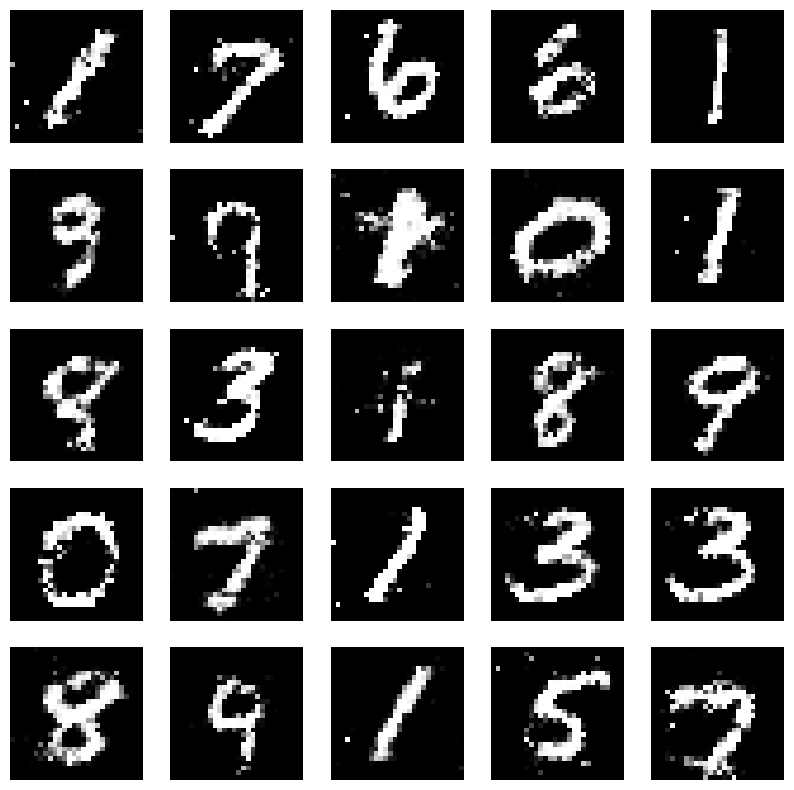

Epochs:  67


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/273 [00:00<02:27,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:01<02:18,  1.95it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<02:00,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:59,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:48,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:48,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:43,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:05<01:41,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:40,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:07<01:39,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:37,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:39,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:08<01:35,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:31,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:32,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:36,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:39,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:35,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:38,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:11<01:44,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:48,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:12<01:49,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:52,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 34/273 [00:13<01:54,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 35/273 [00:14<01:57,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:52,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:51,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 38/273 [00:15<01:49,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:46,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:39,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:17<01:37,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:32,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:25,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:25,  2.67it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 46/273 [00:18<01:26,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:23,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:22,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:19<01:21,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:25,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:21<01:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:22<01:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:24,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:23<01:26,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:23,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:24<01:25,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:29,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:26<01:34,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:27<01:35,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 68/273 [00:27<01:39,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:40,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 70/273 [00:28<01:38,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:39,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:40,  1.99it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:32,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:27,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:20,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 78/273 [00:32<01:18,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:16,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 80/273 [00:33<01:15,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:13,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 82/273 [00:33<01:13,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:15,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:34<01:14,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:34<01:13,  2.55it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 86/273 [00:35<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:10,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:12,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:08,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:38<01:09,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:07,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:39<01:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:39<01:08,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:40<01:13,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:40<01:16,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:41<01:17,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 102/273 [00:41<01:18,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:17,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:42<01:15,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:17,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:18,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:44<01:17,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:14,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 109/273 [00:45<01:13,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:09,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<01:09,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:06,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:06,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 119/273 [00:48<00:59,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:58,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:56,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:55,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:50<00:56,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:51<00:55,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:51<00:56,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:58,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<00:58,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:52<00:57,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:57,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<00:55,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:54<01:00,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:54<00:59,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:55<01:02,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 135/273 [00:55<01:05,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:56<01:05,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 137/273 [00:56<01:07,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:57<01:07,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:57<01:05,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:58<01:11,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 141/273 [00:58<01:06,  1.98it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:59<01:01,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:59<00:56,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:53,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:53,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:50,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:00<00:49,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:50,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:47,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:45,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:46,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:44,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 156/273 [01:04<00:44,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:43,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:05<00:43,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:05<00:42,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:05<00:41,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:41,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:06<00:42,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:41,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:07<00:41,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:07<00:41,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:08<00:40,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:08<00:40,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 168/273 [01:09<00:42,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:09<00:43,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:09<00:44,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 171/273 [01:10<00:44,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 172/273 [01:10<00:45,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 173/273 [01:11<00:47,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:11<00:50,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:12<00:48,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:45,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:43,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:40,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:38,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:37,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 187/273 [01:17<00:34,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:33,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:18<00:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:33,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:33,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:32,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:19<00:30,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 195/273 [01:20<00:30,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:20<00:30,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:30,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:21<00:29,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:21<00:28,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:27,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:22<00:31,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 202/273 [01:23<00:32,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:23<00:32,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:31,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:34,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 206/273 [01:25<00:32,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:32,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:26<00:30,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:26<00:29,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:27,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:27<00:25,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:24,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:22,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:33<00:17,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:18,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:17,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:34<00:16,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:15,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:15,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:36<00:16,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:37<00:16,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:37<00:16,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 238/273 [01:38<00:16,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:38<00:16,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:39<00:16,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:39<00:16,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:40<00:15,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 244/273 [01:41<00:14,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.58it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:47<00:04,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:50<00:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:52<00:00,  2.43it/s]


Perdidas:  0.6924874782562256 , 0.7525824904441833
1/1 [==============================] - 0s 33ms/step


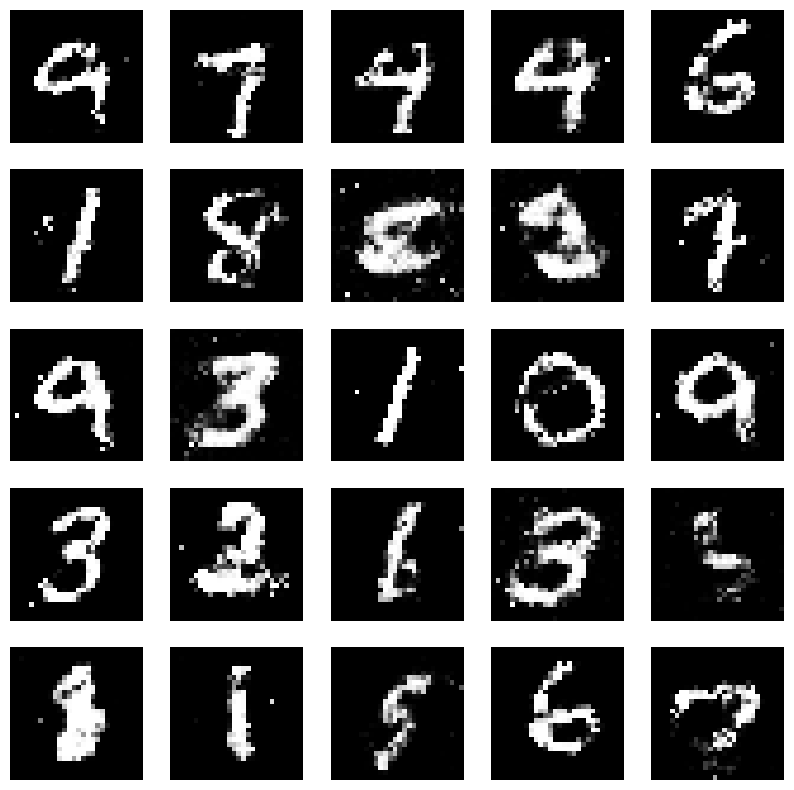

Epochs:  68


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:36,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:31,  2.95it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:36,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:51,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:47,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 8/273 [00:03<01:49,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:52,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:53,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:48,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 12/273 [00:04<01:44,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<01:41,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:39,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:37,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:37,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:07<01:35,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:40,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:08<01:46,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:47,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 24/273 [00:09<01:47,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:10<01:54,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:52,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:11<01:57,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:57,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:12<01:52,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 30/273 [00:12<01:48,  2.25it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 31/273 [00:12<01:50,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:43,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:13<01:41,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:14<01:36,  2.47it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:33,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:33,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:30,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:25,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:22,  2.81it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:18<01:25,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:23,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:18<01:23,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:23,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:19<01:25,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 50/273 [00:20<01:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:25,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:20,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:21<01:19,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:19,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:23,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:23,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:28,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:31,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 61/273 [00:24<01:31,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:24<01:31,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:25<01:30,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:25<01:33,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:26<01:38,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:26<01:37,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:33,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:26,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:24,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:21,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:28<01:21,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:29<01:15,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:14,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:30<01:10,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:30<01:12,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:12,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 79/273 [00:31<01:14,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:32<01:13,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:32<01:10,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:32<01:10,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:09,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:09,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:33<01:08,  2.76it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:34<01:08,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:34<01:09,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:08,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:35<01:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:35<01:09,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:36<01:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:36<01:07,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:36<01:07,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:37<01:10,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:37<01:11,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:38<01:14,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:38<01:13,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:39<01:13,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:39<01:15,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:40<01:18,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 101/273 [00:40<01:17,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:41<01:22,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:41<01:17,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:41<01:13,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:42<01:11,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:42<01:07,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:05,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:43<01:07,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:43<01:04,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:44<01:03,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:44<01:01,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:44<01:02,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:45<01:00,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:45<01:01,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:46<01:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:46<00:58,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:46<00:58,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:47<00:57,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:47<00:58,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:47<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:48<00:58,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▍     | 122/273 [00:48<01:02,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:49<01:00,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 124/273 [00:49<01:00,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:50<00:59,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 126/273 [00:50<00:59,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:50<00:57,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:51<00:59,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 129/273 [00:51<01:00,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:52<01:02,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:52<01:11,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:53<01:11,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:53<01:10,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:54<01:10,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 135/273 [00:54<01:10,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 136/273 [00:55<01:10,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 137/273 [00:55<01:07,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<01:01,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:56<00:59,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:56<00:55,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:57<00:56,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:57<00:53,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:53,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:58<00:50,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:58<00:49,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:50,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:59<00:50,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 148/273 [01:00<00:48,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:00<00:50,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:00<00:48,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:01<00:49,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:01<00:48,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:47,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:02<00:49,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:49,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:03<00:49,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:03<00:49,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:04<00:48,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:47,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:05<00:45,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 161/273 [01:05<00:45,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:05<00:43,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:06<00:44,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 164/273 [01:06<00:47,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 165/273 [01:07<00:48,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [01:07<00:50,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 167/273 [01:08<00:49,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:08<00:48,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:09<00:49,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:09<00:48,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 171/273 [01:10<00:54,  1.88it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:10<00:47,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:44,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:11<00:42,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:11<00:40,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:12<00:40,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:12<00:39,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:38,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:39,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:13<00:37,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:14<00:38,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:14<00:37,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:38,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:36,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:15<00:34,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 186/273 [01:16<00:35,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:33,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:33,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:32,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:18<00:34,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:18<00:33,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:19<00:32,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:32,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:20<00:32,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:20<00:32,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:21<00:32,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 199/273 [01:21<00:34,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 200/273 [01:22<00:34,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 201/273 [01:22<00:34,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:23<00:33,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:23<00:32,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 204/273 [01:24<00:32,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:25<00:29,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:27,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:26,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:26,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:26<00:25,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:26<00:24,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:22,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 218/273 [01:29<00:22,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:30<00:21,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:30<00:19,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:31<00:18,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:19,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:32<00:18,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:18,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:34<00:16,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:34<00:17,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:17,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:35<00:18,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 234/273 [01:36<00:19,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:36<00:18,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:37<00:19,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 237/273 [01:37<00:17,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 238/273 [01:38<00:19,  1.78it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:17,  1.96it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:15,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 241/273 [01:39<00:13,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.72it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:07,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:44<00:08,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:49<00:03,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6979838013648987 , 0.7379460334777832
1/1 [==============================] - 0s 29ms/step


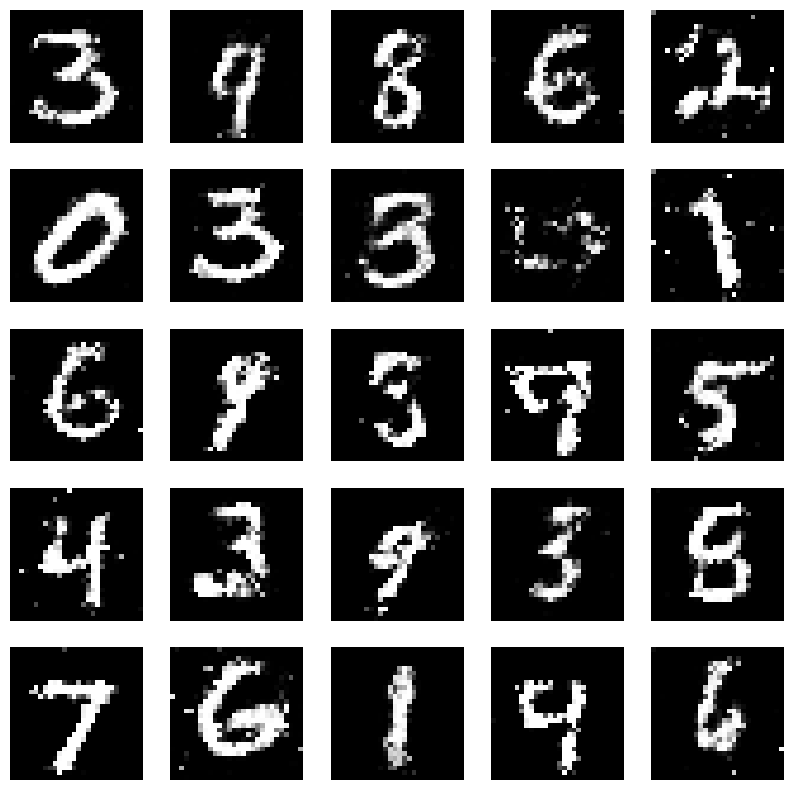

Epochs:  69


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:48,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:39,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:38,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:41,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:40,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:38,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:36,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:40,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:37,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 15/273 [00:05<01:36,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:34,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:40,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 20/273 [00:07<01:52,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:08<01:52,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 22/273 [00:08<01:56,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:54,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<01:53,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:55,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:59,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:11<02:02,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:53,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:11<01:45,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<01:41,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:12<01:35,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:13<01:36,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:34,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 36/273 [00:14<01:35,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:32,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:33,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:16<01:31,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 41/273 [00:16<01:32,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<02:07,  1.80it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:56,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:49,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:56,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:50,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:43,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:35,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▊        | 51/273 [00:21<01:38,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:22<01:49,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 53/273 [00:22<01:47,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:47,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:48,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:24<01:55,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:24<01:50,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 58/273 [00:25<01:48,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:25<01:46,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:25<01:41,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:26<01:34,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:30,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:27<01:29,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:23,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:22,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:28<01:19,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:28<01:21,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:29<01:28,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:29<01:24,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 70/273 [00:29<01:23,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:30<01:20,  2.52it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 72/273 [00:30<01:20,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:31<01:22,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:31<01:17,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:18,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:32<01:17,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:22,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:33<01:18,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:33<01:21,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:33<01:16,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:34<01:14,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:34<01:13,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:35<01:12,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:35<01:12,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:35<01:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:24,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 87/273 [00:36<01:24,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:37<01:25,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:26,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 90/273 [00:38<01:29,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:38<01:28,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 92/273 [00:39<01:27,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:20,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:40<01:17,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:14,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:40<01:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:41<01:07,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:05,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:42<01:07,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:08,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:44<01:08,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:44<01:06,  2.53it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 106/273 [00:44<01:05,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:45<01:02,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:05,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:05,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:05,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:47<01:03,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:00,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 115/273 [00:48<01:08,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:07,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:49<01:04,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:05,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<01:11,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 120/273 [00:50<01:11,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:51<01:12,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:12,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 123/273 [00:52<01:14,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 124/273 [00:52<01:15,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:53<01:14,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:53<01:15,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:54<01:08,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 128/273 [00:54<01:05,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:54<01:01,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:55<00:59,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:55<00:58,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:56<00:57,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:56<00:56,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:57<00:58,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:57<00:56,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<00:55,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:58<00:53,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<00:53,  2.51it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 139/273 [00:59<00:54,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:59<00:52,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:59<00:52,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:52,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:51,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:00<00:51,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:49,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:01<00:48,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 147/273 [01:02<00:48,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<00:48,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:02<00:48,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:03<00:47,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:46,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:04<00:51,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:53,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:05<00:58,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:05<00:58,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:06<00:58,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:06<00:58,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 158/273 [01:07<00:56,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:07<00:58,  1.96it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:08<00:54,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:08<00:51,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:08<00:47,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:09<00:46,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:09<00:44,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:10<00:44,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:10<00:41,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:11<00:39,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:40,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [01:12<00:39,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:12<00:38,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 172/273 [01:12<00:38,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:13<00:37,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▎   | 174/273 [01:13<00:37,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:14<00:39,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:14<00:39,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:15<00:35,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:15<00:35,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:34,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:16<00:35,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:17<00:35,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:17<00:35,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:17<00:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:35,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:18<00:36,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:19<00:36,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:38,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:20<00:39,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:20<00:37,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:21<00:37,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:21<00:37,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 194/273 [01:22<00:38,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:22<00:35,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [01:22<00:34,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:23<00:32,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:23<00:31,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:24<00:30,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:24<00:28,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:24<00:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:27,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:25<00:27,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:26<00:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:25,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:27<00:25,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:23,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:29<00:24,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:29<00:23,  2.61it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 214/273 [01:29<00:23,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:30<00:24,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:24,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:31<00:22,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:31<00:22,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:21,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:32<00:20,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 221/273 [01:32<00:22,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:33<00:22,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:33<00:23,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:34<00:23,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 225/273 [01:34<00:23,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 226/273 [01:35<00:22,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:35<00:22,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:36<00:22,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:36<00:22,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:37<00:20,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:37<00:18,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:38<00:17,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 235/273 [01:39<00:15,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:40<00:14,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:40<00:12,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.62it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:42<00:10,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:43<00:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:08,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:44<00:08,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:48<00:07,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:49<00:06,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:50<00:05,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:51<00:04,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:52<00:03,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:54<00:00,  2.38it/s]


Perdidas:  0.6750705242156982 , 0.7319440841674805
1/1 [==============================] - 0s 29ms/step


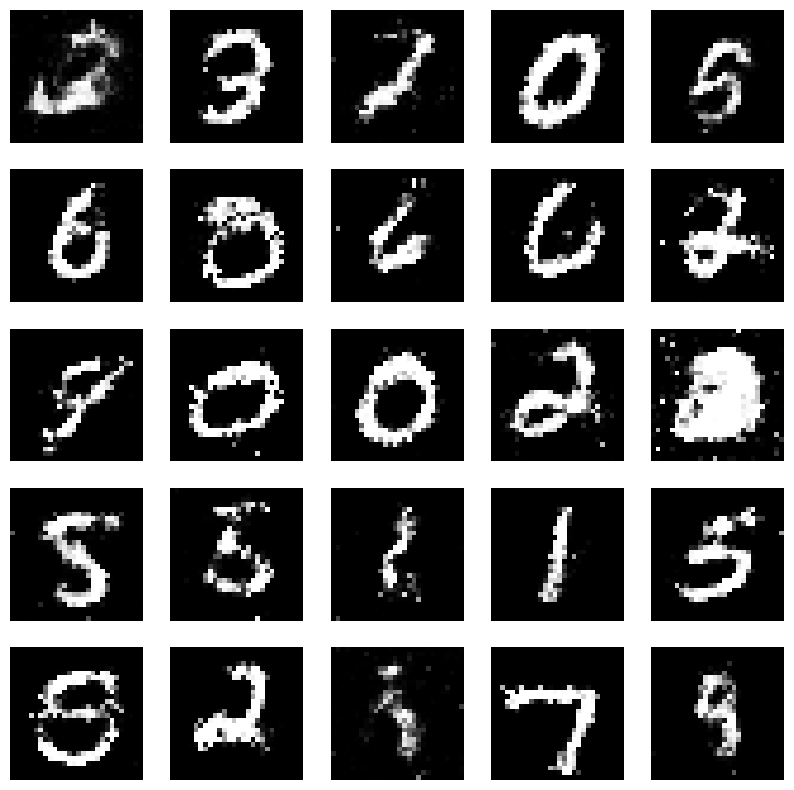

Epochs:  70


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/273 [00:00<01:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<02:00,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:51,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 5/273 [00:01<01:43,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<01:45,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:03<01:52,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 10/273 [00:04<01:54,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:59,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:59,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<02:02,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:06<02:03,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 15/273 [00:06<02:08,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<02:01,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 17/273 [00:07<01:58,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:54,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<01:51,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:48,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:48,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:42,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:42,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:40,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:38,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:11<01:35,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:38,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:32,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:31,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:31,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:30,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:30,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:27,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:28,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:28,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:18<01:31,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:40,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:19<01:41,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:19<01:46,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:44,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:45,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:20<01:46,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:21<01:43,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 52/273 [00:21<01:45,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:38,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:36,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:32,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:33,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:28,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:25,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 59/273 [00:24<01:26,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:23,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:19,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:17,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:17,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:18,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:18,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:21,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:18,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:14,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:14,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:15,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:14,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:16,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 79/273 [00:32<01:22,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:32<01:25,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:33<01:29,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:33<01:31,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 83/273 [00:34<01:31,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:34<01:29,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:35<01:28,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:35<01:31,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:28,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:20,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:18,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:37<01:16,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:17,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:15,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:16,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:39<01:15,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:10,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:05,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:07,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:03,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:03,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:03,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:03,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:00,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:00,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 111/273 [00:45<01:01,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<00:59,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:46<01:06,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 114/273 [00:46<01:09,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:47<01:13,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:47<01:13,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:48<01:16,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 118/273 [00:49<01:18,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:24,  1.82it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:50<01:21,  1.88it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:50<01:15,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<01:07,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:03,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:51<01:03,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<01:00,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:56,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:55,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:55,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:54<00:53,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:54,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:55<00:53,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:52,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:56<00:50,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:56<00:48,  2.82it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:56<00:51,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<00:51,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:50,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:49,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:50,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:58<00:48,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:52,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:00<00:54,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 148/273 [01:01<00:54,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:57,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:02<00:59,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<01:01,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 152/273 [01:03<01:01,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:03<01:02,  1.93it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:04<01:00,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:57,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:05<00:53,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:51,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:05<00:48,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 159/273 [01:06<00:47,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:48,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:45,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:46,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:08<00:46,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:43,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:40,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:39,  2.68it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 169/273 [01:10<00:41,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:41,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:11<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:34,  2.68it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:15<00:37,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 184/273 [01:16<00:39,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 185/273 [01:16<00:39,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 186/273 [01:17<00:39,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:17<00:40,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:18<00:40,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 189/273 [01:18<00:37,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 190/273 [01:19<00:39,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:38,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:35,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:33,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:32,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:32,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:26,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:25,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:26,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:25<00:26,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:24,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:21,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 217/273 [01:29<00:22,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:30<00:23,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:23,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:31<00:23,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:31<00:23,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:32<00:23,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:32<00:23,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:33<00:23,  2.07it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 225/273 [01:33<00:23,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 226/273 [01:34<00:22,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:34<00:20,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:18,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 253/273 [01:44<00:09,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:45<00:08,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:46<00:09,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:47<00:08,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:48<00:06,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.684939444065094 , 0.7254037261009216
1/1 [==============================] - 0s 32ms/step


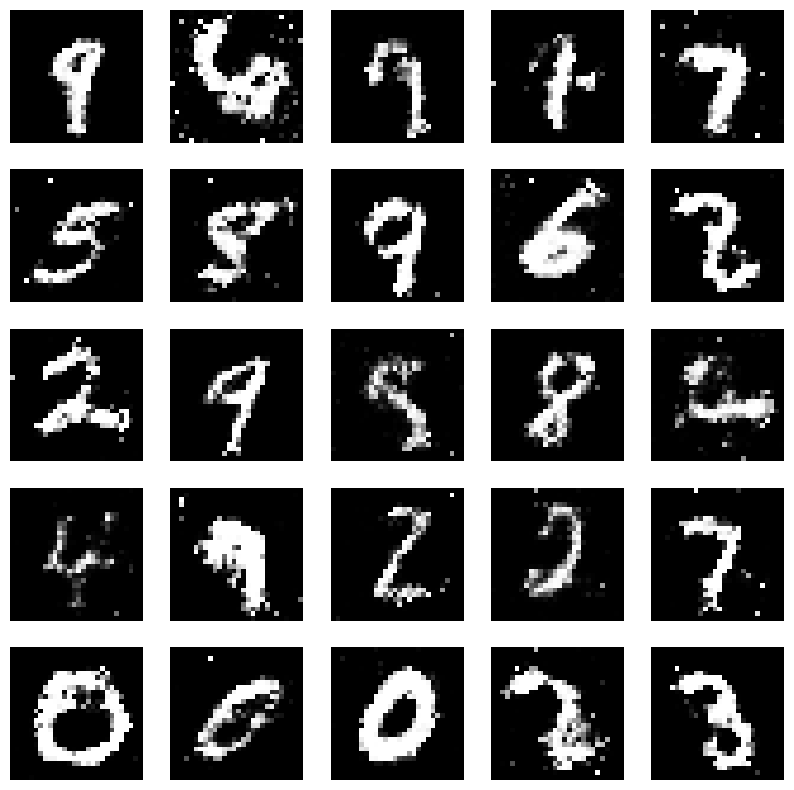

Epochs:  71


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/273 [00:00<02:17,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:00<02:12,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:12,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<02:12,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<02:14,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<02:08,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:03<02:06,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:03<02:07,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:04<02:04,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:00,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:05<01:59,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:52,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:06<01:58,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:51,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:49,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<01:45,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 17/273 [00:07<01:42,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:08<01:40,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:41,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:09<01:42,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:41,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:43,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:41,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:36,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:35,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:35,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:33,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:32,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:39,  2.39it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 37/273 [00:15<01:49,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:16<01:53,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:51,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:17<01:54,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:54,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:18<01:55,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:18<01:53,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:19<01:45,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 45/273 [00:19<01:41,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:19<01:35,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:20<01:37,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:33,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:21<01:29,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:21<01:29,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:27,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:22<01:27,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:26,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:23<01:29,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:25,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:24,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:21,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:25<01:25,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 60/273 [00:25<01:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:22,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:20,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:26,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:27<01:20,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:28<01:20,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:16,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:29<01:24,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:29,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:31,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 73/273 [00:30<01:36,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:31<01:37,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:31<01:36,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:32<01:35,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:32<01:34,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:33<01:34,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:27,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:34<01:24,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:34<01:20,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:35<01:19,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:35<01:18,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:35<01:17,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:36<01:13,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:14,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:37<01:15,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:37<01:14,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:38<01:11,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:10,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:12,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:39<01:14,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:10,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:07,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 97/273 [00:40<01:06,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:08,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:42<01:07,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:42<01:11,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:43<01:14,  2.30it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 103/273 [00:43<01:12,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 104/273 [00:43<01:15,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:44<01:16,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:44<01:18,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:45<01:17,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:20,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 109/273 [00:46<01:19,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 40%|████      | 110/273 [00:47<01:25,  1.90it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:23,  1.95it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:48<01:21,  1.98it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:48<01:13,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:48<01:08,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:49<01:07,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:49<01:11,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:50<01:07,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:50<01:05,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:50<01:02,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:51<01:02,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:51<01:00,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:52<01:00,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:52<01:03,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<01:01,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:53<01:04,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<01:02,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:54<01:01,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<01:01,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<00:59,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:55<01:00,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:56,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:56<00:55,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:56<00:53,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:53,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:57<00:54,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:59,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:58<00:58,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:58<01:00,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:59<00:59,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:59<00:59,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [01:00<01:01,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [01:00<01:02,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [01:01<01:03,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 144/273 [01:01<01:02,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 145/273 [01:02<01:01,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:02<00:57,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:02<00:54,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:03<00:50,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:03<00:52,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:04<00:50,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:04<00:49,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:04<00:48,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:05<00:47,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:05<00:47,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:06<00:45,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:06<00:45,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:43,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:07<00:42,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:07<00:44,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:07<00:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:08<00:43,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:08<00:43,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:09<00:44,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:09<00:41,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:09<00:41,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:10<00:43,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:42,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:11<00:41,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:40,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:11<00:41,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:12<00:41,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 172/273 [01:12<00:43,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:13<00:45,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:13<00:44,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 175/273 [01:14<00:45,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:14<00:46,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:15<00:47,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 178/273 [01:15<00:47,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 179/273 [01:16<00:47,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:16<00:47,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:17<00:45,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:17<00:41,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:18<00:39,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:18<00:38,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:18<00:38,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:19<00:38,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:19<00:36,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:20<00:34,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:20<00:33,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:20<00:33,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:21<00:32,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:21<00:32,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:22<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:22<00:31,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:22<00:30,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:23<00:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:23<00:30,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:24<00:29,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:24<00:28,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:24<00:28,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:25<00:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:28,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:26<00:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:26<00:28,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:26<00:26,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:27<00:26,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:27<00:31,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:28<00:31,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:28<00:31,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:29<00:30,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:29<00:29,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:30<00:29,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 213/273 [01:30<00:29,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:31<00:26,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 215/273 [01:31<00:26,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 216/273 [01:32<00:24,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:32<00:23,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:32<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:33<00:20,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:33<00:20,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:33<00:21,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:34<00:21,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:34<00:20,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:35<00:19,  2.50it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 225/273 [01:35<00:20,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:36<00:19,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:36<00:19,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:36<00:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:37<00:17,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:37<00:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:38<00:17,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:38<00:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:39<00:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:39<00:15,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:40<00:14,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:40<00:14,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:41<00:13,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:42<00:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:42<00:13,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:43<00:13,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:43<00:12,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:43<00:12,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:44<00:12,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 247/273 [01:45<00:13,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:45<00:12,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:45<00:10,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:46<00:09,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 251/273 [01:46<00:09,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:47<00:08,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:47<00:07,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:47<00:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:48<00:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:48<00:06,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:49<00:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:50<00:05,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:50<00:04,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:51<00:03,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:52<00:03,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.60it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 268/273 [01:53<00:01,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:54<00:01,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.7022773027420044 , 0.7476338148117065
1/1 [==============================] - 0s 30ms/step


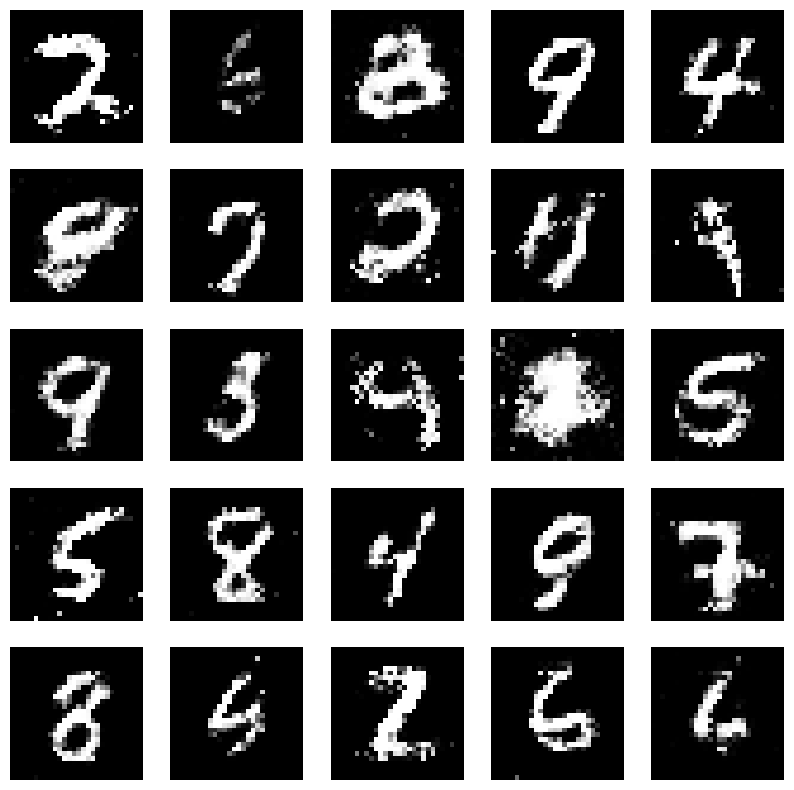

Epochs:  72


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<02:06,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<01:56,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<02:04,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:56,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:51,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 7/273 [00:02<01:51,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:47,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:42,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:41,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<01:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:40,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:41,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:44,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 17/273 [00:06<01:43,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:40,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:08<01:39,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<01:33,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:09<01:34,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:34,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:10<01:36,  2.56it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 28/273 [00:11<01:37,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:44,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:12<01:50,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:52,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:50,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:53,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:54,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:56,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:15<01:54,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:49,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:46,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:40,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:35,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:34,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:31,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:29,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:26,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:25,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:19<01:25,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:27,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:23,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:20<01:22,  2.70it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 52/273 [00:21<01:23,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:21<01:22,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:22<01:22,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:25,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:29,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:25,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:24,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:23,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:26,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:25<01:30,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 64/273 [00:26<01:31,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:34,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:31,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 67/273 [00:27<01:35,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:28<01:37,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:37,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 70/273 [00:29<01:36,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:29<01:35,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:31,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:29,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:27,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:22,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:25,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:20,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:22,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:23,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:19,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:17,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:13,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:13,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:11,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:11,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:13,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:11,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:08,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:07,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:13,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:38<01:11,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:11,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:07,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:06,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:40<01:10,  2.48it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 99/273 [00:40<01:15,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:41<01:17,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 101/273 [00:42<01:49,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:43,  1.66it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:43<01:36,  1.75it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:43<01:33,  1.80it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:44<01:26,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:18,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:45<01:16,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:45<01:10,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:09,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:11,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:10,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:47<01:07,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:07,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:06,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 115/273 [00:48<01:06,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:07,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:49<01:06,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:49<01:04,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<01:07,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<01:03,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<01:05,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:03,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:51<01:05,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:52<01:02,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:52<01:03,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:53<01:04,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:02,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 128/273 [00:54<01:02,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 129/273 [00:54<01:03,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 130/273 [00:55<01:07,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<01:05,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:56<01:08,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 133/273 [00:56<01:11,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 134/273 [00:57<01:12,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 135/273 [00:57<01:10,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:58<01:10,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:58<01:06,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<01:02,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:59<01:01,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:59<00:59,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [01:00<00:56,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:54,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [01:01<00:55,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [01:01<00:57,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:54,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:02<00:55,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:02<00:53,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:03<00:50,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:03<00:54,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [01:04<00:52,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:04<00:52,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 152/273 [01:04<00:50,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:05<00:50,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:05<00:51,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:06<00:50,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:06<00:47,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:07<00:44,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 159/273 [01:07<00:46,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:08<00:47,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:08<00:45,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:09<00:47,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:09<00:48,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:09<00:49,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:10<00:49,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [01:11<00:51,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:11<00:52,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:12<00:52,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 169/273 [01:12<00:49,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 170/273 [01:12<00:48,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:13<00:47,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:13<00:43,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:14<00:42,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:14<00:42,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:14<00:40,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:15<00:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:15<00:37,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:16<00:37,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 179/273 [01:16<00:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:16<00:34,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:17<00:34,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:17<00:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:17<00:34,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:18<00:34,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:18<00:33,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:19<00:33,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:19<00:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:31,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:20<00:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:20<00:33,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:21<00:32,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:21<00:32,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:21<00:31,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:22<00:30,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:22<00:30,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 196/273 [01:23<00:30,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:23<00:33,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:24<00:33,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 199/273 [01:24<00:34,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 200/273 [01:25<00:35,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:25<00:34,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:26<00:34,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:26<00:34,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:27<00:34,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:27<00:33,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:27<00:30,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:28<00:28,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 208/273 [01:28<00:27,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:29<00:27,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:29<00:26,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:29<00:25,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:30<00:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:30<00:23,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:31<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:31<00:22,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:31<00:21,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:32<00:22,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:32<00:21,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:33<00:21,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:33<00:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:33<00:21,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:34<00:20,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:34<00:19,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:35<00:20,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:35<00:19,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:35<00:18,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:36<00:18,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:36<00:18,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:37<00:17,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 230/273 [01:37<00:17,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:37<00:17,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:38<00:17,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:38<00:17,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 234/273 [01:39<00:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:39<00:18,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:40<00:17,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:40<00:17,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 238/273 [01:41<00:17,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:41<00:16,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:42<00:15,  2.19it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:42<00:14,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:43<00:13,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 243/273 [01:43<00:12,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:43<00:11,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:44<00:11,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:44<00:11,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:45<00:10,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:45<00:09,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:45<00:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:46<00:08,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:46<00:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:46<00:07,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:47<00:07,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:47<00:07,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:48<00:06,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:48<00:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:49<00:05,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:50<00:05,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:50<00:04,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:51<00:04,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:52<00:03,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:52<00:03,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 267/273 [01:53<00:02,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:54<00:01,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:54<00:01,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:55<00:00,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 272/273 [01:55<00:00,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 273/273 [01:55<00:00,  2.35it/s]


Perdidas:  0.6736419200897217 , 0.7571743726730347
1/1 [==============================] - 0s 29ms/step


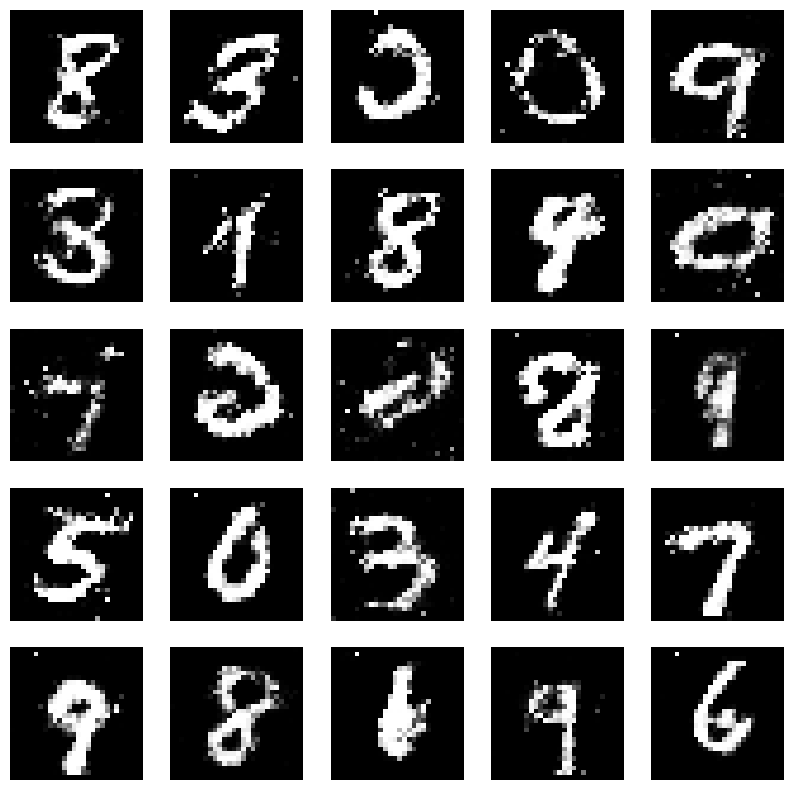

Epochs:  73


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/273 [00:00<02:27,  1.84it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<02:07,  2.12it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:55,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:55,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:49,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:46,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<01:45,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 12/273 [00:04<01:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:39,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:42,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:42,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:47,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 19/273 [00:07<01:52,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 20/273 [00:08<01:53,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:08<01:50,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:48,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 23/273 [00:09<01:52,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:56,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 25/273 [00:10<02:00,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 26/273 [00:11<02:05,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:11<01:57,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:12<01:48,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:44,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:39,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:13<01:38,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:13<01:41,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:14<01:38,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:14<01:39,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:37,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:15<01:35,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:16<01:33,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 39/273 [00:16<01:32,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:16<01:31,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:29,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:34,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:29,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:28,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:27,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:28,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:27,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:22<01:35,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:36,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:40,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:39,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:41,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 58/273 [00:24<01:44,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:24<01:43,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:25<01:42,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:25<01:36,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:26<01:32,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:33,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:27<01:26,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:24,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:23,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:20,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:21,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:29<01:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:23,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:21,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:20,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:31<01:20,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:17,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:17,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:32<01:17,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:16,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:18,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:20,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:18,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:12,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:11,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:14,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:36<01:18,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:36<01:25,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:37<01:27,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:37<01:28,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 91/273 [00:38<01:28,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:30,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:39<01:30,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:39<01:29,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:21,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:40<01:16,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 97/273 [00:40<01:15,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:41<01:15,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:10,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:08,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:07,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:05,  2.62it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 103/273 [00:43<01:05,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:03,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:44<01:05,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:06,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:07,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 112/273 [00:46<01:06,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:47<01:05,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:03,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:48<01:03,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:02,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:03,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 119/273 [00:49<01:02,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:50<01:05,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:50<01:09,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:51<01:08,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 123/273 [00:51<01:13,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:52<01:15,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:52<01:13,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 126/273 [00:53<01:11,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:53<01:11,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 128/273 [00:54<01:10,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<01:05,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<01:01,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:55<00:58,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:56,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:56<00:55,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:54,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<00:52,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:57<00:52,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:51,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:50,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:59<00:50,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:51,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:51,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [01:00<00:49,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:48,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:01<00:50,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:01<00:48,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:50,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:55,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:53,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:50,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:51,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 154/273 [01:04<00:52,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 155/273 [01:04<00:52,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:05<00:53,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 157/273 [01:05<00:55,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 158/273 [01:06<00:56,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 159/273 [01:06<00:55,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:07<00:55,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▉    | 161/273 [01:08<00:55,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:08<00:55,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 163/273 [01:08<00:52,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:09<00:48,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:09<00:45,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:10<00:52,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:10<00:47,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:11<00:47,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:43,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 170/273 [01:11<00:41,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:12<00:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:38,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:13<00:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:13<00:40,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:13<00:38,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:14<00:39,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:39,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:37,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:15<00:36,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:15<00:34,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:16<00:34,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:16<00:34,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:34,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:17<00:33,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:17<00:33,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:32,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:31,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:19<00:35,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:19<00:36,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 191/273 [01:20<00:38,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 192/273 [01:20<00:38,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 193/273 [01:21<00:38,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:21<00:38,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:22<00:37,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:22<00:38,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 197/273 [01:23<00:37,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:23<00:34,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:32,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:24<00:30,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▎  | 201/273 [01:24<00:29,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:25<00:28,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:25<00:27,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:26,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 205/273 [01:26<00:25,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:27<00:25,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:27<00:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:25,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:23,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:29<00:24,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:29<00:24,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:23,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 215/273 [01:30<00:22,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:31<00:21,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:31<00:22,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:32<00:21,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:33<00:21,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:20,  2.39it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 225/273 [01:34<00:21,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:34<00:21,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:35<00:24,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:36<00:23,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:36<00:22,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:37<00:21,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:37<00:19,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:37<00:19,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:17,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:16,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:39<00:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:39<00:13,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 240/273 [01:41<00:13,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:12,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:42<00:12,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:43<00:11,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:45<00:09,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.30it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 260/273 [01:49<00:06,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 262/273 [01:50<00:05,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 264/273 [01:51<00:04,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:52<00:03,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:53<00:02,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.6757943630218506 , 0.7396778464317322
1/1 [==============================] - 0s 32ms/step


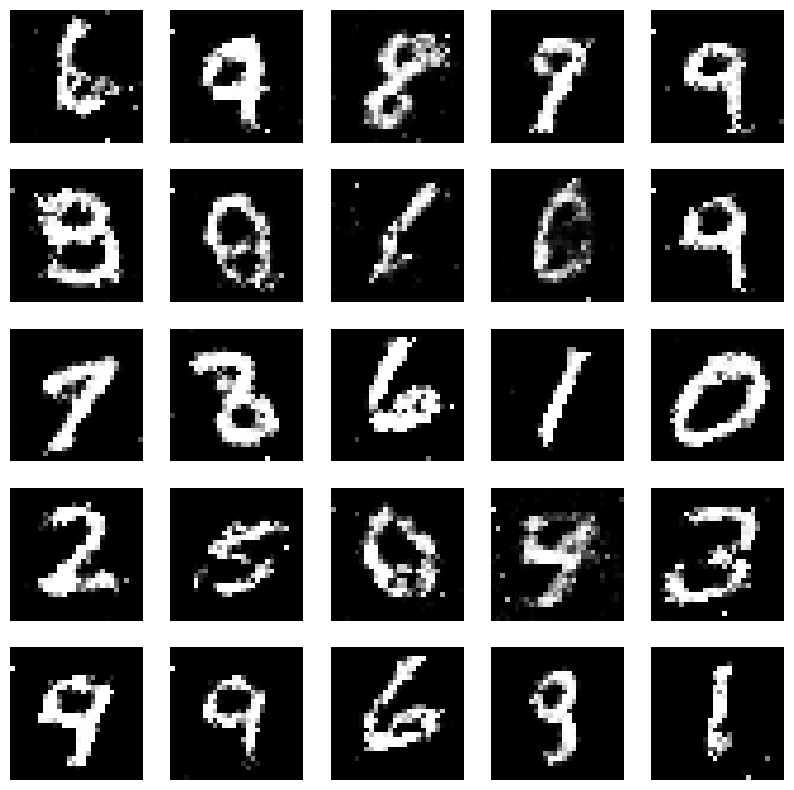

Epochs:  74


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/273 [00:00<01:42,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:37,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:40,  2.68it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:44,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:49,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:03<01:52,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 10/273 [00:04<01:55,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:58,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 12/273 [00:05<02:00,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 13/273 [00:05<02:10,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 14/273 [00:06<02:05,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 15/273 [00:06<02:03,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 16/273 [00:07<02:00,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:51,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 18/273 [00:07<01:47,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:43,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:08<01:43,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:47,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:48,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:43,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:10<01:43,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 26/273 [00:11<01:43,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:39,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:41,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:37,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:33,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:13<01:34,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:34,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:33,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:39,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:29,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:16<01:32,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:38,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:39,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:41,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:18<01:47,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:45,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 47/273 [00:19<01:43,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 48/273 [00:20<01:47,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:47,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:49,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:44,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:22<01:37,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:33,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:31,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 55/273 [00:23<01:28,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:29,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:26,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:28,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:24,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:22,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 61/273 [00:25<01:24,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:23,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:19,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:27<01:17,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:27<01:19,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:15,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:29<01:16,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:15,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:15,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:30<01:15,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:14,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:15,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:14,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:31<01:22,  2.37it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 78/273 [00:32<01:28,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:27,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 80/273 [00:33<01:31,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 81/273 [00:33<01:29,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:31,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 83/273 [00:34<01:32,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 84/273 [00:35<01:29,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:35<01:29,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 86/273 [00:36<01:24,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:21,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:16,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:37<01:12,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:13,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:38<01:11,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:11,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:07,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:07,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:41<01:07,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:07,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:06,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:42<01:06,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:04,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:05,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:02,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:00,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:01,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 110/273 [00:45<01:02,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<01:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:06,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:46<01:07,  2.38it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 114/273 [00:47<01:13,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 115/273 [00:47<01:11,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:48<01:11,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 117/273 [00:48<01:16,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:12,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 119/273 [00:49<01:11,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:50<01:11,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 121/273 [00:50<01:08,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 122/273 [00:50<01:07,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:51<01:03,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:00,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<01:02,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<01:03,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:59,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:58,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:54,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<00:53,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:55,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:55<00:58,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:56,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 138/273 [00:57<00:57,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:53,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:54,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:53,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:54,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:59<00:51,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:48,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:00<00:53,  2.37it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 147/273 [01:01<00:57,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:01<00:57,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:02<00:59,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [01:02<00:59,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [01:03<00:59,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:59,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:58,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:55,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:50,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:05<00:48,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:05<00:48,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:46,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 159/273 [01:06<00:48,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:06<00:45,  2.47it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 161/273 [01:07<00:45,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:43,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:07<00:43,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 164/273 [01:08<00:42,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:08<00:40,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:39,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:38,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:38,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:10<00:39,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:40,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:38,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:37,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [01:13<00:37,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:14<00:38,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:14<00:40,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:15<00:41,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 182/273 [01:15<00:43,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 183/273 [01:16<00:42,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:16<00:42,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:41,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:41,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 187/273 [01:18<00:41,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:18<00:38,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:18<00:35,  2.33it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 190/273 [01:19<00:35,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 191/273 [01:19<00:39,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:20<00:35,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:33,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:32,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:32,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 197/273 [01:22<00:30,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:30,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:28,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:26,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:26,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:26,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:26,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:30<00:25,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:31<00:26,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:31<00:26,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:32<00:25,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 221/273 [01:32<00:25,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:23,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:22,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:21,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:19,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:35<00:19,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:38<00:14,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:12,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:12,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.67it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.50it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:45<00:09,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:46<00:09,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 256/273 [01:47<00:08,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6854228377342224 , 0.7101047039031982
1/1 [==============================] - 0s 28ms/step


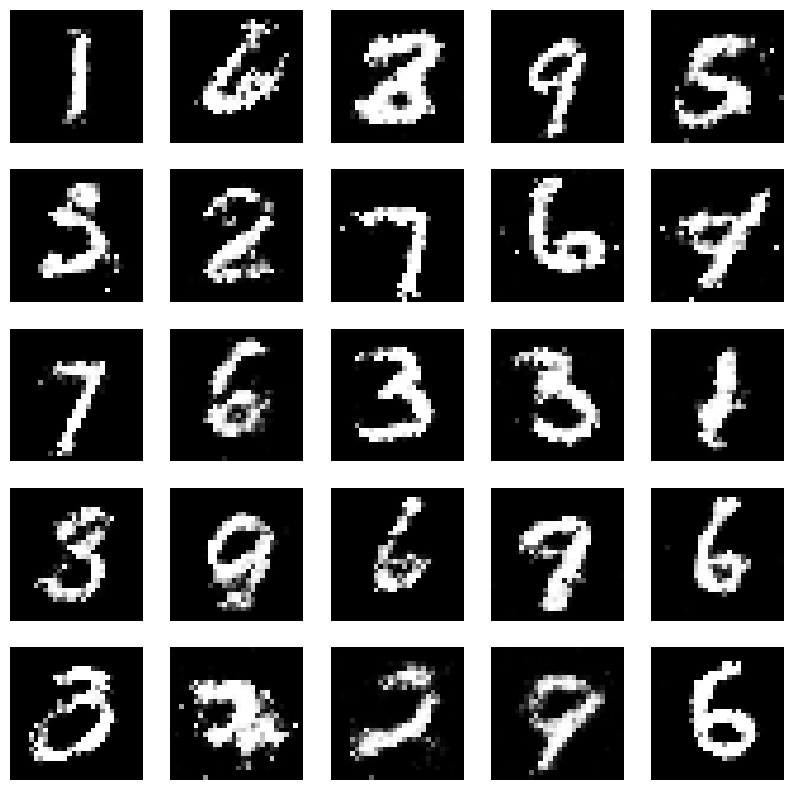

Epochs:  75


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:13,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/273 [00:00<02:05,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<02:07,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<02:14,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 5/273 [00:02<02:12,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<02:10,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:03<02:03,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 8/273 [00:03<02:10,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:04<02:04,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 10/273 [00:04<02:15,  1.94it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:05<02:04,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:57,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:06<01:50,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:06<01:44,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:39,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<01:41,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:07<01:43,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:08<01:46,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:45,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:41,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:42,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<01:39,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:34,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:34,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:35,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:31,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:12<01:36,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:33,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:32,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:13<01:31,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 33/273 [00:13<01:28,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:27,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 36/273 [00:14<01:32,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:39,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 38/273 [00:15<01:42,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:46,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:46,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:17<01:46,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 42/273 [00:17<01:47,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:18<01:47,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:46,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:19<01:44,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:37,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:33,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:27,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 50/273 [00:21<01:31,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:21<01:28,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:27,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:20,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:23<01:19,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:19,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:18,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:16,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:15,  2.82it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:18,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:19,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 63/273 [00:25<01:19,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:17,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:16,  2.72it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 66/273 [00:27<01:20,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:17,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:16,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:22,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:29<01:27,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:28,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:28,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 75/273 [00:30<01:31,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 76/273 [00:31<01:33,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:31<01:31,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:29,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:28,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:23,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:33<01:23,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:34<01:20,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 83/273 [00:34<01:19,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:25,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 85/273 [00:35<01:21,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:15,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:13,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:16,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:17,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:15,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:15,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:38<01:12,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:10,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:07,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:09,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:06,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:04,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:06,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:06,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:02,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:09,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:44<01:11,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:12,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 110/273 [00:45<01:14,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:14,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:12,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:46<01:12,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:11,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:08,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:48<01:13,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:07,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<01:03,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<01:01,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:49<00:59,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:58,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:59,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:57,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<00:58,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:52<00:57,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<00:58,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:53<01:00,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<01:00,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:54<01:19,  1.79it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<01:11,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<01:05,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<01:01,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:56<00:57,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:56<00:54,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:57,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:56,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:58,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:58<01:00,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 141/273 [00:58<01:02,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:59<01:02,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [00:59<01:02,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:00<01:03,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 145/273 [01:00<01:01,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 146/273 [01:01<01:01,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:01<01:00,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:02<00:55,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:02<00:52,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:49,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:50,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:48,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:04<00:46,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:45,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:45,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:05<00:45,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:45,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:06<00:47,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:47,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [01:07<00:47,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:48,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:08<00:47,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:44,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:42,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:09<00:43,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:42,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:10<00:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:43,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:42,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:39,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:42,  2.39it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 173/273 [01:12<00:44,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:12<00:45,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:13<00:46,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 176/273 [01:13<00:47,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:14<00:45,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 178/273 [01:14<00:45,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:15<00:46,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:45,  2.04it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:16<00:41,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:16<00:40,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:16<00:37,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:17<00:35,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:17<00:34,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:18<00:35,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:18<00:36,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:35,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:19<00:34,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:20<00:33,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:20<00:33,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:30,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:21<00:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:22<00:28,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:29,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:31,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:24<00:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:27,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:26,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:26<00:28,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:27<00:28,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 209/273 [01:27<00:27,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:28<00:30,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:29,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:29<00:29,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 213/273 [01:29<00:28,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:27,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:30<00:25,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:25,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:31<00:23,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:31<00:23,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:31<00:23,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:32<00:21,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:19,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:34<00:17,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:35<00:17,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:36<00:16,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:16,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:37<00:16,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:39<00:13,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:12,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:41<00:13,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:41<00:13,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 245/273 [01:42<00:14,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:13,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:43<00:13,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:44<00:12,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 249/273 [01:44<00:11,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:06,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:05,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6979900002479553 , 0.7226275205612183
1/1 [==============================] - 0s 28ms/step


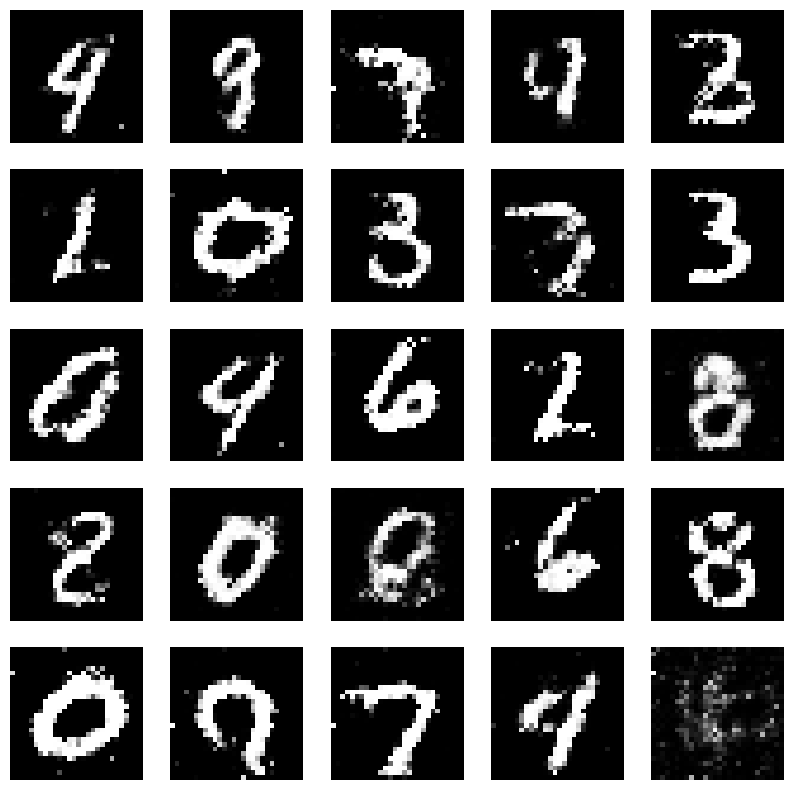

Epochs:  76


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/273 [00:00<02:07,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<02:10,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 3/273 [00:01<02:08,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:01<02:13,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 5/273 [00:02<02:07,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:58,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:03<01:54,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:49,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:46,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:43,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:36,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:33,  2.75it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:38,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:07<01:37,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:08<01:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:37,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:35,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:32,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:35,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:09<01:31,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:29,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:10<01:31,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:30,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:30,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:11<01:30,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:12<01:35,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:12<01:39,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:46,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 34/273 [00:13<01:49,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:50,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 36/273 [00:14<01:49,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 37/273 [00:15<01:50,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:15<01:48,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:52,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:47,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:40,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:40,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:35,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:33,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:27,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:25,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:24,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:26,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:23,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:24,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:23<01:26,  2.47it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 59/273 [00:23<01:25,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:24<01:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:25,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:21,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:25<01:22,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:20,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:26<01:25,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:27<01:29,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:27<01:33,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:28<01:33,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:31,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 71/273 [00:29<01:37,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:36,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:37,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:35,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:31<01:32,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:26,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:22,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:23,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:19,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:15,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:33<01:15,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 82/273 [00:33<01:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:12,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:11,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:34<01:10,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:35<01:09,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 87/273 [00:35<01:14,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:13,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:36<01:14,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:13,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:13,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:17,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:38<01:14,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:38<01:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:39<01:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:39<01:07,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:05,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:40<01:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:40<01:10,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 101/273 [00:41<01:15,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:41<01:16,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 103/273 [00:42<01:18,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:20,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:43<01:29,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:44<01:26,  1.93it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:25,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:24,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:16,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:12,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:09,  2.34it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:06,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<01:05,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 116/273 [00:48<01:02,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:48<01:03,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<01:03,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<01:00,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:00,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:50<00:59,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:50<00:58,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:58,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:56,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:51<00:59,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 126/273 [00:52<01:00,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<00:58,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:53<00:55,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 131/273 [00:54<00:55,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:54<00:52,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:52,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 135/273 [00:55<00:56,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:56<00:59,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:56<01:00,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<01:01,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:57<00:58,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:57<00:58,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:58,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:58<00:57,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:59<00:57,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 144/273 [00:59<00:55,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 145/273 [01:00<00:54,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:53,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:50,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:01<00:50,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:51,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:51,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:02<00:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:48,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:47,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:03<00:46,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:46,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:45,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 157/273 [01:04<00:43,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:05<00:44,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:43,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:05<00:42,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:44,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:06<00:42,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:07<00:42,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:07<00:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:07<00:40,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:42,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:08<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:40,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 169/273 [01:09<00:40,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:09<00:43,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 171/273 [01:10<00:45,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 172/273 [01:10<00:45,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:11<00:45,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 174/273 [01:11<00:46,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:46,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 176/273 [01:12<00:47,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:13<00:46,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:42,  2.24it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:14<00:40,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:39,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:14<00:37,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:37,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:34,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:32,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:33,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:32,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:19<00:31,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:31,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:20<00:28,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:29,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:21<00:28,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:21<00:27,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:28,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:22<00:27,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:22<00:27,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:23<00:27,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:23<00:30,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 206/273 [01:24<00:31,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:25<00:31,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:25<00:31,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 209/273 [01:26<00:31,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:26<00:30,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:27<00:28,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 212/273 [01:27<00:28,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:26,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:24,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:28<00:23,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:29<00:23,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:19,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:31<00:18,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:31<00:19,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:16,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:34<00:15,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:14,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:36<00:15,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:36<00:14,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:37<00:14,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:37<00:13,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 240/273 [01:38<00:14,  2.35it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:39<00:15,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 244/273 [01:40<00:13,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 249/273 [01:42<00:10,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:06,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:48<00:02,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.6906800270080566 , 0.7451965808868408
1/1 [==============================] - 0s 67ms/step


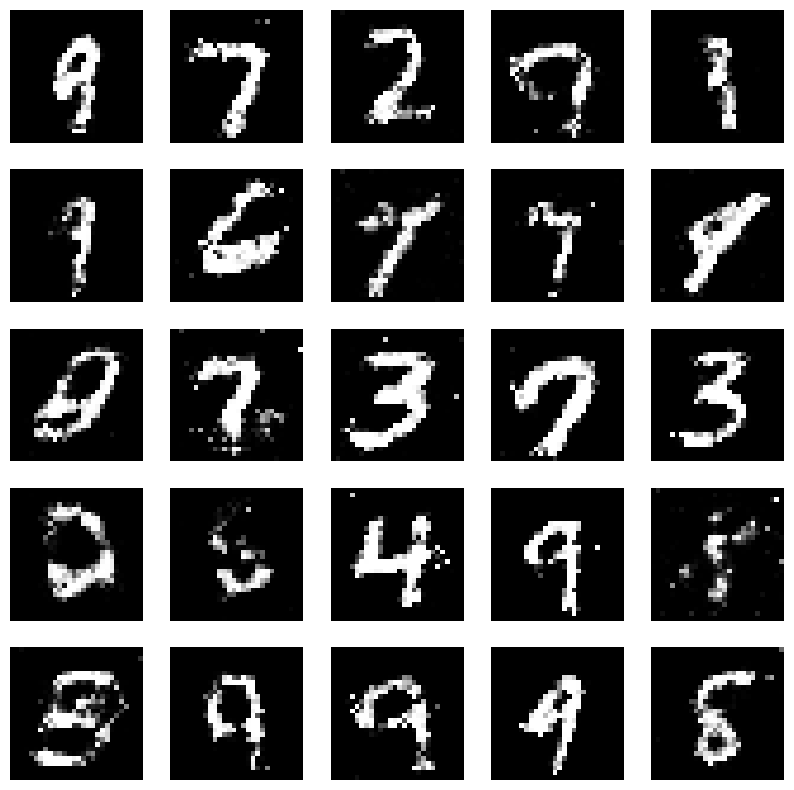

Epochs:  77


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:37,  2.80it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:48,  2.50it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:45,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:43,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:41,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:38,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:37,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 16/273 [00:06<01:35,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:06<01:35,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:06<01:32,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:39,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:35,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:34,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:08<01:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:35,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:38,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:10<01:39,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:10<01:43,  2.38it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 29/273 [00:11<01:44,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:11<01:49,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:48,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:12<01:50,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:51,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 34/273 [00:13<01:53,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:53,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:45,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:14<01:39,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:15<01:38,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:33,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:16<01:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:16<01:28,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:17<01:25,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:23,  2.70it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:29,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:19<01:30,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:27,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:20<01:26,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:29,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:26,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:23,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 56/273 [00:22<01:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:20,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:20,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:23<01:23,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:23<01:19,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:19,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:24<01:24,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:28,  2.37it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 64/273 [00:25<01:32,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:26<01:36,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:26<01:36,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 67/273 [00:27<01:35,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:27<01:34,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:27<01:33,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:28<01:30,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 71/273 [00:28<01:26,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:29<01:22,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:29<01:22,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:29<01:18,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:30<01:16,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:17,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:31<01:16,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:32<01:16,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 81/273 [00:32<01:16,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:14,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:15,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:14,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:12,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:34<01:10,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:07,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:35<01:09,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:36<01:07,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:36<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:36<01:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:08,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:37<01:10,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:37<01:08,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:38<01:09,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:38<01:12,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:39<01:16,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:39<01:17,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:40<01:20,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:40<01:22,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:18,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:41<01:20,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 104/273 [00:42<01:18,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:42<01:17,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:15,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:43<01:11,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:43<01:08,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:44<01:06,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:44<01:04,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:44<01:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:00,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████▏     | 113/273 [00:45<01:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:00,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:46<00:59,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:46<00:59,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:47<01:01,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 118/273 [00:47<01:00,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<00:58,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:48<00:58,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:48<00:59,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<01:01,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:49<01:01,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:57,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:50<00:55,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 126/273 [00:50<00:59,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:51<00:55,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:51<00:56,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:51<00:55,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 130/273 [00:52<01:01,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:52<00:58,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:53<01:00,  2.33it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 133/273 [00:53<01:04,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:54<01:03,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:54<01:05,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:55<01:07,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:55<01:03,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:56<01:04,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:56<01:03,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████▏    | 140/273 [00:57<01:03,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:57<01:03,  2.08it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:58<00:59,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:55,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:58<00:54,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:52,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:51,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [00:59<00:48,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 149/273 [01:00<00:46,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:48,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [01:01<00:46,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 152/273 [01:01<00:46,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:02<00:44,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:02<00:43,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:02<00:43,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:42,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:03<00:42,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:04<00:42,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:04<00:42,  2.69it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:04<00:42,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:05<00:41,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:05<00:40,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:05<00:41,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:06<00:42,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:06<00:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:07<00:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:07<00:40,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:07<00:42,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:08<00:45,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:08<00:46,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:09<00:49,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 172/273 [01:10<00:48,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:10<00:47,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:11<00:48,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:11<00:47,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:11<00:46,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 177/273 [01:12<00:47,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:12<00:43,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:42,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:13<00:39,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:37,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:14<00:38,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:14<00:35,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:15<00:35,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:15<00:34,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:15<00:34,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:34,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:16<00:32,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:17<00:31,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:18<00:31,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:18<00:30,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:19<00:31,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:19<00:30,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:20<00:29,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:20<00:30,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:21<00:31,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:21<00:29,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:21<00:27,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:22<00:27,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:22<00:29,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▍  | 204/273 [01:23<00:30,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 205/273 [01:23<00:30,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:24<00:30,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:24<00:30,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:25<00:30,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:25<00:29,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:26<00:29,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:26<00:29,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:26<00:27,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:27<00:26,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:27<00:25,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:24,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:28<00:24,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:29<00:23,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:29<00:22,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:29<00:21,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:30<00:21,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:30<00:21,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:21,  2.39it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 223/273 [01:31<00:21,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 224/273 [01:31<00:20,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:32<00:19,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:32<00:18,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:33<00:17,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:34<00:17,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:34<00:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:15,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:35<00:14,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:36<00:14,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:37<00:15,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:37<00:15,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:38<00:15,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 240/273 [01:38<00:15,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:38<00:14,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:39<00:14,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 243/273 [01:39<00:13,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:40<00:13,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:40<00:12,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:42<00:10,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:09,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:09,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:45<00:05,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:50<00:00,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.6868773698806763 , 0.7383025884628296
1/1 [==============================] - 0s 58ms/step


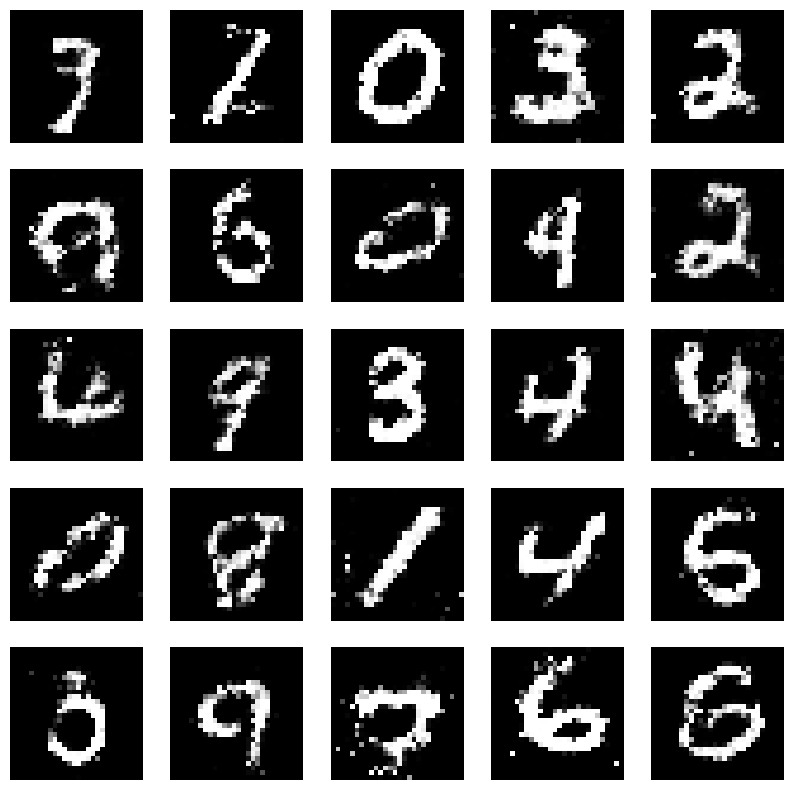

Epochs:  78


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:36,  2.81it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:35,  2.84it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:43,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:01<01:45,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:44,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:42,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:41,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:41,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<01:42,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:39,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:33,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:07<01:33,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:07<01:31,  2.77it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 22/273 [00:08<01:33,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:35,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:09<01:36,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:09<01:35,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:10<01:35,  2.57it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 28/273 [00:10<01:42,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 29/273 [00:11<01:44,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:11<01:51,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 31/273 [00:12<01:56,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:12<02:03,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<02:00,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 34/273 [00:13<02:03,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:54,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:44,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:38,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:36,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:37,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 41/273 [00:16<01:37,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:32,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:17<01:29,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:28,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 46/273 [00:18<01:30,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:18<01:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:24,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:19<01:27,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:24,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:22,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:21<01:28,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:26,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:22<01:25,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:27,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:22,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:23<01:24,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:23,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 61/273 [00:24<01:26,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 62/273 [00:25<01:32,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:25<01:36,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:26<01:39,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:26<01:39,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:26<01:38,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 67/273 [00:27<01:35,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:27<01:38,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:35,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:28<01:33,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 71/273 [00:29<01:27,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▋       | 72/273 [00:29<01:25,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:23,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:18,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:31<01:17,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:16,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 79/273 [00:32<01:14,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:13,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:13,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:11,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:33<01:14,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:11,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:15,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:12,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:35<01:10,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:35<01:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:10,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:08,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:36<01:08,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:37<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:12,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 94/273 [00:38<01:14,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:38<01:18,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 96/273 [00:39<01:23,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:39<01:23,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:21,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 99/273 [00:40<01:22,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:41<01:21,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:19,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 102/273 [00:41<01:19,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:14,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:42<01:10,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 106/273 [00:43<01:06,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:43<01:04,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:03,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:02,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:01,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:03,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:46<01:04,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:46<01:01,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 116/273 [00:47<01:00,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:59,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<00:58,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<01:03,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:48<01:01,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<01:01,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:49<01:00,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:50<01:00,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:58,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:50<00:57,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 126/273 [00:51<00:58,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:51<00:56,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:52<00:56,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 129/273 [00:52<00:58,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:53<01:02,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 131/273 [00:53<01:06,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 132/273 [00:54<01:05,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:54<01:04,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 134/273 [00:54<01:05,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 135/273 [00:55<01:12,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 136/273 [00:56<01:13,  1.87it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<01:05,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:56<01:00,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:57,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<00:54,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:52,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:49,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:58<00:49,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:48,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:50,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [00:59<00:48,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:00<00:47,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:01<00:46,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:45,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:01<00:45,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:46,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:47,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:45,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:03<00:46,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:44,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 158/273 [01:04<00:44,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:44,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:05<00:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:05<00:49,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:48,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:06<00:48,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 164/273 [01:07<00:49,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:07<00:49,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 166/273 [01:08<00:49,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:08<00:49,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 168/273 [01:09<00:50,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 169/273 [01:09<00:50,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:52,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:10<00:49,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:45,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 173/273 [01:11<00:44,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:11<00:41,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:39,  2.46it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 176/273 [01:12<00:40,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:40,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:40,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:37,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:36,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:37,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:36,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:35,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:36,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:17<00:34,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:33,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:18<00:32,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:18<00:31,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:18<00:30,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:42,  1.87it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:38,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:20<00:38,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 196/273 [01:21<00:37,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 197/273 [01:21<00:39,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 198/273 [01:22<00:37,  1.98it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:22<00:36,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 200/273 [01:23<00:37,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 201/273 [01:23<00:35,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 202/273 [01:24<00:36,  1.93it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:24<00:35,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:33,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:30,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:26<00:29,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:26<00:28,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:28,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:27<00:26,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:28<00:25,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:24,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:29<00:23,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:23,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:24,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:23,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:31<00:22,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:31<00:22,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:32<00:21,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████▏ | 222/273 [01:32<00:21,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 223/273 [01:33<00:21,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:20,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:34<00:19,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:21,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▎ | 228/273 [01:35<00:20,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 229/273 [01:35<00:21,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 230/273 [01:36<00:20,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:36<00:20,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:37<00:19,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:37<00:19,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 234/273 [01:38<00:18,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 235/273 [01:38<00:18,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:39<00:17,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:39<00:16,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 238/273 [01:40<00:15,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:40<00:14,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 241/273 [01:41<00:13,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 250/273 [01:44<00:08,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.48it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:04,  2.68it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 264/273 [01:50<00:04,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 265/273 [01:51<00:04,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:51<00:03,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.37it/s]


Perdidas:  0.6928964853286743 , 0.734686017036438
1/1 [==============================] - 0s 29ms/step


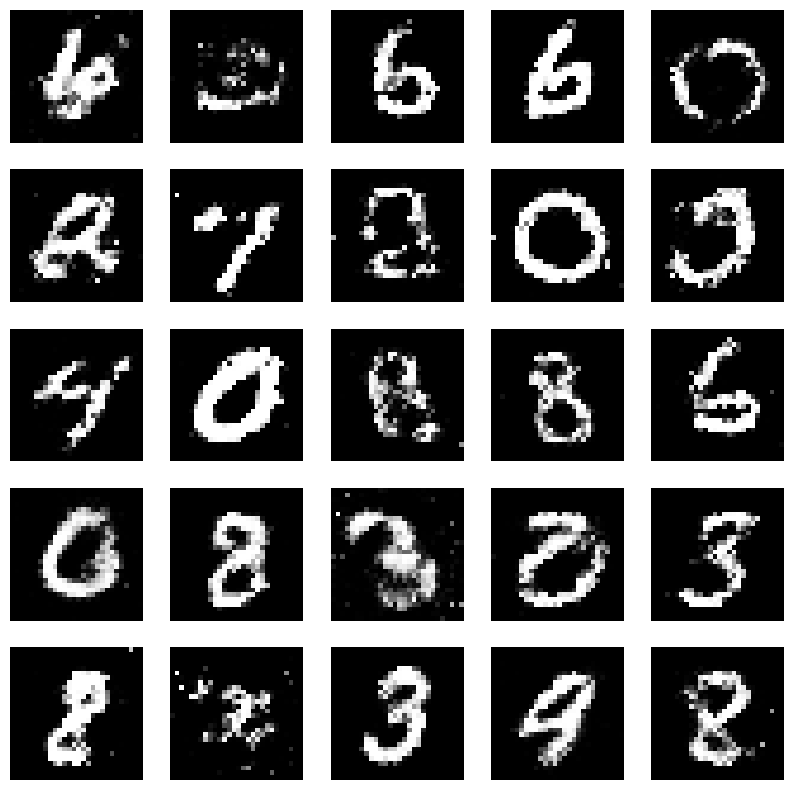

Epochs:  79


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:36,  2.83it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:36,  2.81it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:41,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:41,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:38,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:41,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:43,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:38,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 13/273 [00:05<01:45,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:05<01:54,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<01:57,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 16/273 [00:06<01:58,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:59,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 18/273 [00:07<01:59,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<02:03,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:08<02:05,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<02:06,  1.99it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:55,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:47,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:46,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:37,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:36,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 29/273 [00:12<01:34,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:45,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:12<01:38,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:37,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:37,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:41,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:38,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:31,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:29,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:30,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:18<01:32,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:36,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:19<01:41,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:46,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 50/273 [00:20<01:44,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:21<01:44,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:48,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 53/273 [00:22<01:54,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:23<01:52,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 55/273 [00:23<01:52,  1.94it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:42,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:24<01:37,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:24<01:32,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:25<01:32,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:27,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:25,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:26<01:25,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:26<01:20,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:27<01:23,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:24,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:24,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:21,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:29<01:21,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:29<01:51,  1.82it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:30<01:52,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 72/273 [00:31<02:11,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:32<02:14,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 74/273 [00:32<02:16,  1.46it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:33<02:17,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 76/273 [00:34<02:17,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 77/273 [00:34<02:18,  1.41it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:35<02:18,  1.40it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:36<02:14,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:37<02:19,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 30%|██▉       | 81/273 [00:37<02:24,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 30%|███       | 82/273 [00:38<02:27,  1.29it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:39<02:20,  1.36it/s]

4/4 [==============================] - 0s 9ms/step


 31%|███       | 84/273 [00:40<02:28,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 85/273 [00:41<02:26,  1.29it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:41<02:23,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 87/273 [00:42<02:26,  1.27it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 88/273 [00:43<02:19,  1.33it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:44<02:24,  1.27it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:45<02:26,  1.25it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:45<02:16,  1.33it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:46<02:20,  1.29it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:47<02:17,  1.30it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:48<02:16,  1.31it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▍      | 95/273 [00:49<02:27,  1.21it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:49<02:26,  1.21it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:50<02:21,  1.24it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:51<02:38,  1.11it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:52<02:34,  1.12it/s]

4/4 [==============================] - 0s 27ms/step


 37%|███▋      | 100/273 [00:53<02:37,  1.10it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:54<02:36,  1.10it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:55<02:24,  1.18it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 103/273 [00:55<02:19,  1.22it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:56<02:10,  1.29it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:57<02:04,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 106/273 [00:57<02:03,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 107/273 [00:58<02:00,  1.38it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:59<01:55,  1.43it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [01:00<01:56,  1.41it/s]

4/4 [==============================] - 0s 10ms/step


 40%|████      | 110/273 [01:00<01:59,  1.36it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [01:01<01:56,  1.39it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [01:02<01:58,  1.36it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [01:02<01:38,  1.63it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [01:02<01:26,  1.84it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 115/273 [01:03<01:18,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [01:03<01:12,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [01:04<01:08,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 118/273 [01:04<01:06,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [01:05<01:08,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [01:05<01:12,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [01:06<01:12,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [01:06<01:11,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [01:07<01:12,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 124/273 [01:07<01:13,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [01:08<01:13,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 126/273 [01:08<01:12,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [01:08<01:08,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [01:09<01:04,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 129/273 [01:09<01:00,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [01:10<00:57,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [01:10<00:55,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [01:10<00:56,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [01:11<00:55,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [01:11<00:54,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 135/273 [01:12<00:57,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [01:12<00:54,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [01:12<00:54,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [01:13<00:54,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [01:13<00:52,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████▏    | 140/273 [01:14<00:54,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [01:14<00:52,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [01:14<00:51,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [01:15<00:53,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:15<00:53,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:16<00:52,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:16<00:50,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:16<00:50,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:17<00:51,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [01:17<00:50,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:18<00:50,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:18<00:48,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:18<00:51,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:19<00:53,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 154/273 [01:19<00:53,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:20<00:55,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:20<00:55,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:21<00:55,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:21<00:55,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:22<00:55,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:22<00:51,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 161/273 [01:23<00:49,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:23<00:46,  2.38it/s]

4/4 [==============================] - 0s 18ms/step


 60%|█████▉    | 163/273 [01:24<00:49,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:24<00:46,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:24<00:44,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:25<00:44,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:25<00:41,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:26<00:42,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:26<00:39,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:26<00:41,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:27<00:40,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:27<00:39,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:27<00:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:28<00:36,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:28<00:37,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 176/273 [01:29<00:38,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:29<00:37,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:29<00:38,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:30<00:36,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:30<00:35,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:31<00:34,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:31<00:35,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:31<00:37,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:32<00:35,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:32<00:34,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:33<00:36,  2.36it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 187/273 [01:33<00:39,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:34<00:39,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:34<00:40,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:35<00:39,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:35<00:40,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:36<00:39,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:36<00:39,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:37<00:35,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:37<00:33,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:37<00:33,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:38<00:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:38<00:29,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:38<00:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:39<00:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:39<00:28,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 202/273 [01:40<00:28,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:40<00:28,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:40<00:28,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:41<00:26,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:41<00:25,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:42<00:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:42<00:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:42<00:24,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:43<00:23,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:43<00:23,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 212/273 [01:44<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:44<00:24,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [01:44<00:24,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:45<00:23,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:45<00:23,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:46<00:21,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:46<00:20,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:46<00:21,  2.51it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 220/273 [01:47<00:21,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:47<00:22,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:48<00:23,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:48<00:23,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:49<00:23,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 225/273 [01:49<00:22,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:50<00:21,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 227/273 [01:50<00:22,  2.07it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:51<00:21,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:51<00:19,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 230/273 [01:51<00:18,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:52<00:17,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:52<00:17,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:53<00:17,  2.26it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 234/273 [01:53<00:16,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:54<00:16,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:54<00:15,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:54<00:14,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:55<00:13,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:55<00:13,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:56<00:13,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:56<00:12,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:56<00:11,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:57<00:11,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:57<00:11,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:57<00:10,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:58<00:10,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 90%|█████████ | 247/273 [01:58<00:09,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:59<00:09,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:59<00:09,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:59<00:08,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [02:00<00:08,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [02:00<00:08,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [02:01<00:07,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [02:01<00:07,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [02:01<00:07,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [02:02<00:07,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [02:02<00:07,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 258/273 [02:03<00:07,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [02:03<00:06,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [02:04<00:05,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [02:04<00:05,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [02:05<00:04,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [02:05<00:04,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [02:06<00:04,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [02:06<00:03,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [02:06<00:02,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [02:07<00:02,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [02:07<00:02,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [02:08<00:01,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [02:08<00:01,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [02:08<00:00,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [02:09<00:00,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [02:09<00:00,  2.11it/s]


Perdidas:  0.6801912784576416 , 0.6926745176315308
1/1 [==============================] - 0s 27ms/step


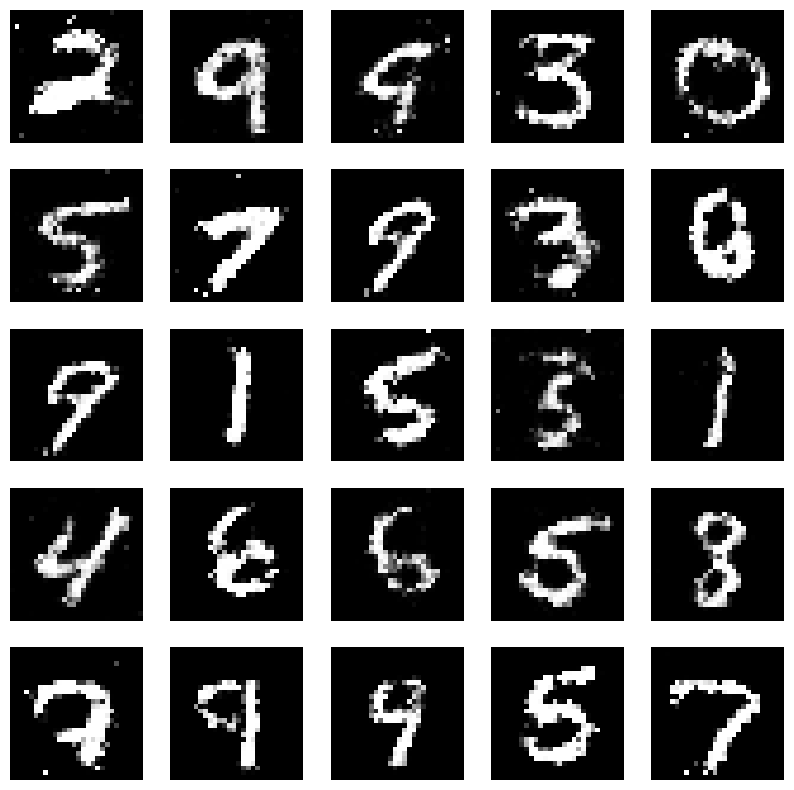

Epochs:  80


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:42,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:43,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:50,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:59,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:03<02:00,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:03,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<02:04,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:05<02:03,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 13/273 [00:05<02:02,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:06<02:06,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<01:57,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:07<01:49,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:07<01:49,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 18/273 [00:07<01:49,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:08<01:48,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:08<01:42,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:40,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:09<01:43,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:42,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:41,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:43,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 27/273 [00:11<01:43,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:40,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:38,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:34,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:32,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:31,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:36,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:32,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:27,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 41/273 [00:17<01:45,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:46,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:18<01:45,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:18<01:47,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:19<01:45,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:49,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 47/273 [00:20<01:51,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 48/273 [00:20<01:52,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:21<01:44,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:21<01:41,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:34,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:22<01:29,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 53/273 [00:22<01:28,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:23<01:22,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:23<01:20,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:24<01:20,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:24<01:19,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:24<01:20,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:21,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:22,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:26<02:05,  1.68it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:27<01:55,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 64/273 [00:27<02:15,  1.54it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:28<02:17,  1.52it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:29<02:22,  1.45it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:29<02:01,  1.70it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:30<01:47,  1.90it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:30<01:38,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 70/273 [00:31<01:42,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:31<01:36,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 72/273 [00:31<01:36,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:32<01:46,  1.87it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 74/273 [00:33<01:43,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 75/273 [00:33<01:39,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 76/273 [00:34<01:39,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:34<01:39,  1.98it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:34<01:30,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:35<01:24,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:35<01:24,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:36<01:22,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:36<01:23,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:37<01:18,  2.43it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 84/273 [00:37<01:15,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:37<01:17,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:38<01:16,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 87/273 [00:38<01:13,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:38<01:10,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 89/273 [00:39<01:13,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:39<01:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:40<01:08,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:40<01:09,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:40<01:11,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:41<01:08,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:41<01:10,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:42<01:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:42<01:06,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:42<01:07,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:43<01:10,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 100/273 [00:43<01:07,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:44<01:11,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:44<01:10,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:44<01:10,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:45<01:14,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:45<01:18,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:46<01:19,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 107/273 [00:47<01:28,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 108/273 [00:47<01:23,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:48<01:20,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:48<01:17,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:48<01:17,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:49<01:13,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:49<01:11,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:50<01:07,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:50<01:08,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:51<01:08,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:51<01:05,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:51<01:04,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:52<01:01,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:52<00:59,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:52<00:57,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:53<00:55,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:53<00:55,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:54<00:55,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:54<00:55,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:54<00:56,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:55<00:55,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:55<00:53,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:55<00:53,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:56<00:53,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:56<00:51,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:56<00:51,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:57<00:53,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:57<00:55,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:58<00:53,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:58<00:52,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:58<00:50,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:59<00:53,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:59<00:56,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [01:00<00:56,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [01:00<00:59,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [01:01<01:00,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 143/273 [01:01<01:00,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [01:02<01:02,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 145/273 [01:02<01:00,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:03<01:01,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:03<01:00,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:04<00:55,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:04<00:54,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:04<00:50,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:05<00:50,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:05<00:47,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:06<00:48,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:06<00:48,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:06<00:46,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:07<00:48,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 157/273 [01:07<00:49,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:08<00:46,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:08<00:44,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▊    | 160/273 [01:08<00:46,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:09<00:45,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:09<00:47,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:10<00:46,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:10<00:44,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:11<00:47,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:11<00:45,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:11<00:45,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:12<00:45,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [01:12<00:44,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:13<00:42,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:13<00:40,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:13<00:40,  2.48it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 173/273 [01:14<00:45,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:14<00:43,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:15<00:45,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:15<00:45,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:16<00:46,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:16<00:43,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 179/273 [01:17<00:42,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:17<00:43,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 181/273 [01:18<00:43,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:18<00:39,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:18<00:36,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:19<00:35,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:19<00:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:20<00:34,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:20<00:34,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:20<00:32,  2.63it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▉   | 189/273 [01:21<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:21<00:33,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:22<00:33,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 192/273 [01:22<00:34,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:22<00:32,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:23<00:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:23<00:30,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:24<00:30,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:24<00:29,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:24<00:28,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:25<00:29,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:25<00:29,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:26<00:28,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 202/273 [01:26<00:30,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:26<00:28,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:27<00:27,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:27<00:26,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:28<00:29,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 207/273 [01:28<00:30,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 208/273 [01:29<00:30,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:29<00:31,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:30<00:30,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:30<00:29,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 212/273 [01:31<00:28,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:31<00:28,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:32<00:28,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:32<00:25,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:32<00:24,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:33<00:23,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:33<00:22,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:34<00:21,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:34<00:20,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:34<00:19,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:35<00:19,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:35<00:19,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:35<00:18,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:36<00:17,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:36<00:18,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:37<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:37<00:18,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:37<00:16,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:38<00:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:38<00:16,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:39<00:15,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▌ | 233/273 [01:39<00:15,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:39<00:16,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:40<00:15,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:40<00:15,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:41<00:15,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:41<00:14,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:41<00:13,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:42<00:13,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:42<00:14,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:43<00:14,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 243/273 [01:43<00:14,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 244/273 [01:44<00:13,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:44<00:13,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 246/273 [01:45<00:12,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:45<00:12,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:46<00:11,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:46<00:11,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:47<00:10,  2.27it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:47<00:09,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:47<00:08,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:48<00:08,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:48<00:08,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:49<00:07,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:49<00:07,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 257/273 [01:49<00:06,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:50<00:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:50<00:05,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:51<00:05,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:51<00:04,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:52<00:04,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:52<00:03,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:52<00:03,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:53<00:03,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:53<00:02,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:53<00:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:54<00:01,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:54<00:01,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 270/273 [01:55<00:01,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:55<00:00,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:55<00:00,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:56<00:00,  2.35it/s]


Perdidas:  0.6733894348144531 , 0.7317531108856201
1/1 [==============================] - 0s 47ms/step


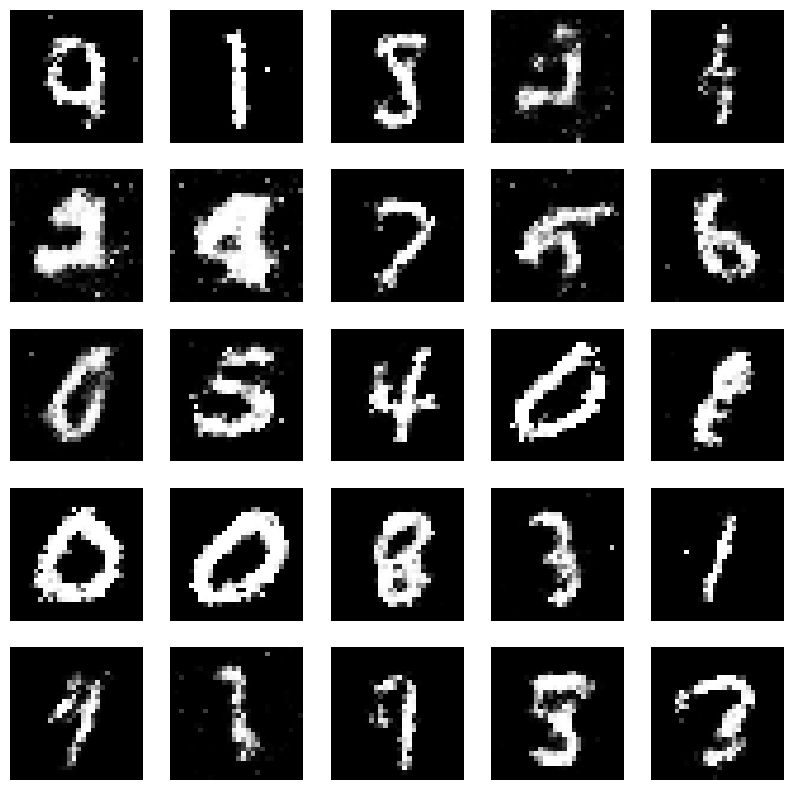

Epochs:  81


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<02:09,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:00<02:07,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:02,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:50,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:50,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:47,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:43,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:04<01:43,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:37,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:39,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:05<01:38,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:40,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:38,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:07<01:42,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:37,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:07<01:33,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:34,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:08<01:36,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:08<01:33,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:31,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


  9%|▉         | 25/273 [00:09<01:32,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:30,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:10<01:28,  2.79it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 28/273 [00:10<01:38,  2.49it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 29/273 [00:11<01:46,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:11<01:48,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:51,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:12<01:51,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:51,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 34/273 [00:13<01:51,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 13%|█▎        | 35/273 [00:14<01:50,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:51,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:15<01:44,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:45,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:40,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:16<01:35,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:34,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:30,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:17<01:31,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:34,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:18<01:34,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:19<01:32,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 49/273 [00:19<01:30,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:28,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:29,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:21<01:24,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:23,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:22<01:25,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:20,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 59/273 [00:23<01:26,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:24,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:24<01:27,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:25<01:24,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 63/273 [00:25<01:25,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:25<01:26,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:26<01:30,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 66/273 [00:26<01:35,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:27<01:34,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:27<01:34,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:33,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:32,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:29<01:33,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:27,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 73/273 [00:30<01:26,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:22,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:25,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:18,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:32<01:24,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:24,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:23,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 82/273 [00:33<01:22,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 30%|███       | 83/273 [00:34<01:18,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:15,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:17,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:13,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:35<01:10,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:09,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:07,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:06,  2.75it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:13,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:11,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:38<01:13,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:38<01:10,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:10,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:39<01:13,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 98/273 [00:40<01:20,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:40<01:20,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 100/273 [00:41<01:21,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 101/273 [00:41<01:21,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 102/273 [00:42<01:22,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:22,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:43<01:20,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:18,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 106/273 [00:44<01:15,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:09,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:06,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:45<01:04,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:05,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:01,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:00,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:00,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:47<00:58,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<00:57,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:48<01:00,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:49<01:01,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<00:59,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:49<01:01,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<01:02,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:50<00:59,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:56,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:51<00:57,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:51<00:55,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:52<00:54,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:55,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:52<00:55,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:53<00:55,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:53<00:57,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:59,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<01:00,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:55<01:00,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<01:03,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<01:03,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:56<01:03,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 138/273 [00:56<01:02,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:57<01:03,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:57<01:02,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:58,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:55,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:51,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:49,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:48,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:00<00:47,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:49,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:47,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:02<00:47,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:46,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:45,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:47,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:45,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:04<00:44,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:43,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:05<00:42,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:05<00:43,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:05<00:44,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 162/273 [01:06<00:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:06<00:41,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:07<00:40,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:07<00:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:07<00:41,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:08<00:43,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:08<00:45,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:09<00:46,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:09<00:48,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 171/273 [01:10<00:48,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:10<00:47,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:11<00:47,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 174/273 [01:11<00:47,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:12<00:48,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:44,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:41,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:40,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:37,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:36,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:36,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 182/273 [01:14<00:34,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:34,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:15<00:34,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:16<00:32,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:33,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:17<00:32,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:18<00:32,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:31,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:18<00:30,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:19<00:30,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:20<00:28,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 197/273 [01:20<00:28,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:21<00:28,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:21<00:27,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:21<00:26,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:22<00:27,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:22<00:26,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:23<00:29,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:23<00:31,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:31,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:24<00:31,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 207/273 [01:25<00:31,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 208/273 [01:25<00:31,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 209/273 [01:26<00:30,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 210/273 [01:26<00:32,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 211/273 [01:27<00:30,  2.01it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:27<00:28,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:27<00:26,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:24,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:28<00:23,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:22,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:30<00:21,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:31<00:22,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:31<00:29,  1.72it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:32<00:25,  1.95it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:32<00:22,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:22,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:33<00:19,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:19,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:34<00:17,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:17,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:35<00:16,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:15,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 236/273 [01:37<00:15,  2.42it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 237/273 [01:38<00:16,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 238/273 [01:38<00:16,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:39<00:16,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:39<00:16,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 241/273 [01:40<00:15,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 242/273 [01:40<00:14,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:13,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:12,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:42<00:11,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:12,  2.02it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:43<00:11,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6908838748931885 , 0.7122060656547546
1/1 [==============================] - 0s 27ms/step


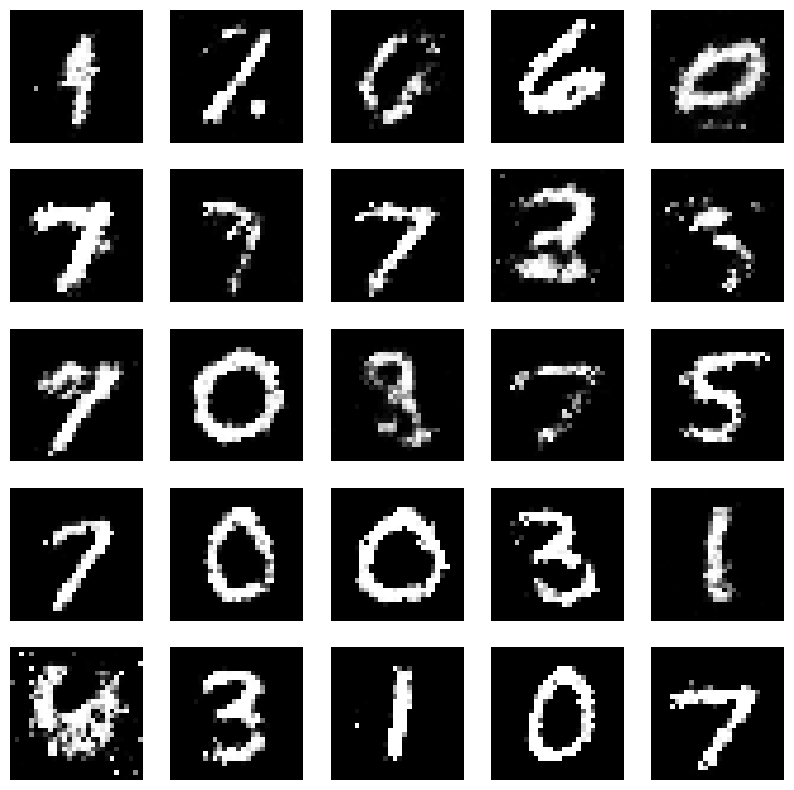

Epochs:  82


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:37,  2.77it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:44,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:42,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:46,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:43,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:39,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:41,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:43,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:05<01:46,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:38,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:06<01:38,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:42,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:38,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:08<01:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:40,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:51,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 24/273 [00:09<01:56,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:10<01:58,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:58,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:11<01:55,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:55,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 29/273 [00:12<01:57,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:12<01:56,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:52,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:46,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:39,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:38,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:40,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:36,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:34,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:32,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:31,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 43/273 [00:17<01:29,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:26,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▋        | 45/273 [00:18<01:26,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:18<01:25,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:24,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:27,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:19<01:26,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:20<01:23,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:20,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:21,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:24,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:22<01:22,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:23,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:23<01:29,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:32,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:24<01:37,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:43,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:42,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 62/273 [00:25<01:42,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:26<01:42,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 64/273 [00:26<01:41,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:39,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:35,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:34,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:29,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:24,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:29<01:23,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:18,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:30<01:13,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:18,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:15,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:12,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 79/273 [00:32<01:16,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:15,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:33<01:15,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:33<01:14,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:11,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:34<01:14,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:35<01:12,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 88/273 [00:35<01:14,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:36<01:13,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:09,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:12,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:14,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 94/273 [00:38<01:17,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 95/273 [00:38<01:21,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:21,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 97/273 [00:39<01:24,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 98/273 [00:40<01:26,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:23,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:22,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:18,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:13,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:16,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:10,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:08,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:43<01:09,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:07,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:08,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:04,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 111/273 [00:45<01:05,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:02,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:03,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:47<01:03,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:48<00:59,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:48<00:57,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<00:57,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 120/273 [00:49<00:57,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:55,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▍     | 122/273 [00:50<00:57,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:50<00:58,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:57,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:51<00:57,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 126/273 [00:51<00:58,  2.50it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 127/273 [00:52<01:04,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 128/273 [00:52<01:04,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 129/273 [00:53<01:06,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:53<01:05,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<01:08,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 132/273 [00:54<01:06,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:55<01:08,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<01:04,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:55<01:01,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:59,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:56<00:56,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:53,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:57<00:54,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████▏    | 140/273 [00:57<00:52,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:50,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<00:52,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 143/273 [00:58<00:50,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:50,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:49,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:47,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 147/273 [01:00<00:48,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:00<00:47,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:47,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:48,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [01:02<00:48,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:49,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 153/273 [01:02<00:50,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:48,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:03<00:46,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:04<00:45,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:05<00:44,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:05<00:48,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:50,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:48,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:07<00:50,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 164/273 [01:07<00:51,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 165/273 [01:08<00:59,  1.82it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:57,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 167/273 [01:09<00:55,  1.92it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:09<00:51,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:47,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:44,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:43,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:42,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:11<00:42,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:40,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:39,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:39,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:38,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:14<00:37,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:39,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:15<00:37,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:17<00:34,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:17<00:31,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:32,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:31,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:19<00:34,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 194/273 [01:20<00:34,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:20<00:35,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:35,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:21<00:35,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:22<00:35,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 199/273 [01:22<00:38,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 200/273 [01:23<00:38,  1.88it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:36,  1.95it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:24<00:35,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:34,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:31,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:29,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [01:26<00:28,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:26<00:28,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:26,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:27,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:28<00:25,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:31<00:22,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:31<00:21,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:33<00:19,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:35<00:21,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:19,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:35<00:19,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 231/273 [01:36<00:18,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:36<00:18,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:37<00:20,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 234/273 [01:37<00:18,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:38<00:17,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:17,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:39<00:15,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.51it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.48it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:51<00:03,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:52<00:02,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.677670955657959 , 0.7351083755493164
1/1 [==============================] - 0s 31ms/step


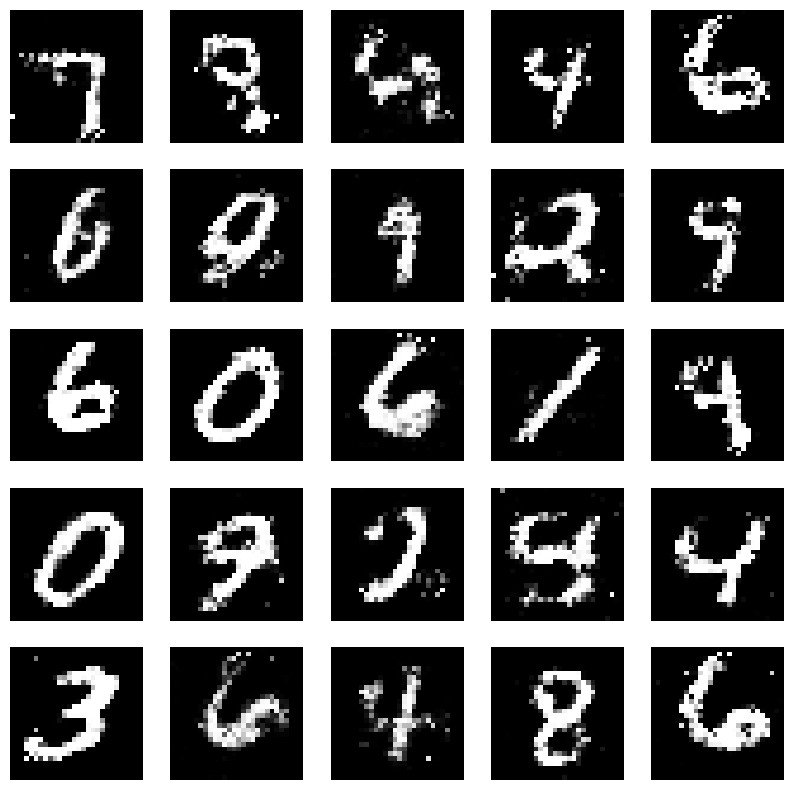

Epochs:  83


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<02:02,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:50,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:48,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:39,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:42,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:42,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<01:41,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:04<01:48,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▍         | 13/273 [00:05<01:57,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:05<01:53,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 15/273 [00:06<01:54,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<02:10,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<02:03,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<02:05,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:08<02:08,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<02:01,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:57,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 22/273 [00:09<01:49,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:43,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:10<01:49,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:39,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:38,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:34,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:32,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:12<01:34,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:13<01:31,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:38,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:15<01:32,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:15<01:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:27,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:28,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:16<01:28,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:28,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:28,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:18<01:28,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:28,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:18<01:33,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 47/273 [00:19<01:35,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:19<01:40,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 49/273 [00:20<01:44,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:20<01:47,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:46,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:45,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 53/273 [00:22<01:45,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 54/273 [00:22<01:40,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:23<01:36,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:36,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:24<01:36,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:24<01:33,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:31,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:26,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:25<01:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:27<01:20,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:22,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:22,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:17,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:29<01:16,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:20,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:30<01:26,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:21,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 74/273 [00:30<01:20,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:31<01:21,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:20,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 77/273 [00:32<01:19,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:17,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:33<01:20,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 81/273 [00:33<01:25,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 82/273 [00:34<01:28,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:34<01:28,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:25,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:22,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 86/273 [00:36<01:25,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:25,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 88/273 [00:37<01:27,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:24,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:17,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:16,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:12,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 94/273 [00:39<01:11,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:39<01:09,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:40<01:07,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:40<01:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:07,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:41<01:09,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:42<01:08,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:04,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:03,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:02,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:05,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:02,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:00,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:03,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:01,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:46<01:01,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:46<00:58,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<00:58,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:05,  2.41it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 117/273 [00:48<01:11,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 118/273 [00:49<01:22,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 119/273 [00:49<01:19,  1.94it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:50<01:18,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 121/273 [00:50<01:17,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:14,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<01:11,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:10,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:52<01:08,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<01:06,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:04,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<01:01,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:54<01:00,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:54<01:00,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<00:57,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:54,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 133/273 [00:55<00:55,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<00:51,  2.67it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 136/273 [00:56<00:52,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:57<00:51,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:50,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:57<00:56,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:53,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:58<00:53,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:51,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:48,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 144/273 [00:59<00:49,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [01:00<00:47,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:47,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:00<00:46,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:52,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:02<00:54,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 151/273 [01:02<00:55,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:03<00:55,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 153/273 [01:03<00:58,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 154/273 [01:04<00:57,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 155/273 [01:04<00:56,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 156/273 [01:05<00:56,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:05<00:55,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:06<00:54,  2.12it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:06<00:49,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:48,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:48,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:45,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:43,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:09<00:44,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:40,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [01:10<00:41,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:39,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:11<00:40,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [01:12<00:40,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:36,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:13<00:34,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:34,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:14<00:34,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:33,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:15<00:36,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 184/273 [01:16<00:38,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 185/273 [01:16<00:39,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 186/273 [01:17<00:39,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:39,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 188/273 [01:18<00:41,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 189/273 [01:18<00:41,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:40,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:39,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 192/273 [01:20<00:38,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:35,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:32,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:29,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:29,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:23<00:29,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:29,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:29,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:28,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 206/273 [01:25<00:28,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:27,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:27<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 219/273 [01:31<00:22,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 220/273 [01:31<00:23,  2.26it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 221/273 [01:32<00:23,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 222/273 [01:32<00:23,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:22,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:23,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 225/273 [01:34<00:22,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 226/273 [01:34<00:21,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:35<00:20,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:35<00:19,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 230/273 [01:36<00:18,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▌ | 233/273 [01:37<00:16,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:38<00:14,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:39<00:14,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:45<00:08,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:46<00:08,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:46<00:08,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:47<00:07,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 258/273 [01:47<00:07,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:48<00:06,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▌| 260/273 [01:48<00:06,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.27it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.686241626739502 , 0.7140781879425049
1/1 [==============================] - 0s 37ms/step


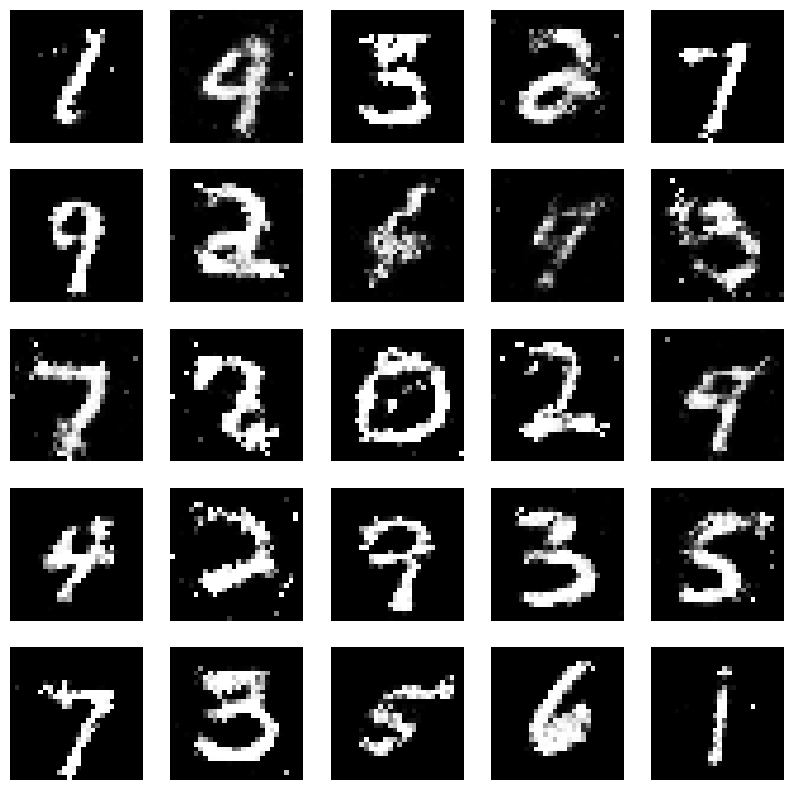

Epochs:  84


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:59,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:44,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:50,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:46,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:02<01:47,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:52,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 7/273 [00:02<01:55,  2.30it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 8/273 [00:03<02:01,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:03<02:06,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<02:07,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<02:06,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:05<02:03,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:05<01:56,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 14/273 [00:06<01:53,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:47,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:43,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<01:41,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:54,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:51,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:46,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:09<01:40,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:10<01:33,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:32,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:37,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:33,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:32,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 30/273 [00:12<01:37,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:32,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:29,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:33,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:14<01:31,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:29,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:14<01:32,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:31,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:30,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:15<01:30,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:34,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 41/273 [00:16<01:39,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:40,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:17<01:41,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 44/273 [00:18<01:44,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:43,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:19<01:43,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 47/273 [00:19<01:46,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:20<01:47,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 49/273 [00:20<01:46,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:21<01:44,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:21<01:35,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:28,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:28,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:26,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:25,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:23,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:24<01:26,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:22,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:24<01:21,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 61/273 [00:25<01:28,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:22,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:26<01:25,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:22,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:25,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:27,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:28,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:24,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:24,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:22,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:21,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:19,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:17,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:17,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:18,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:31<01:26,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:30,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:30,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:32,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 82/273 [00:34<01:31,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 83/273 [00:34<01:33,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 84/273 [00:35<01:29,  2.12it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:35<01:25,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:36<01:25,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:20,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:37<01:20,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:20,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:17,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:13,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:38<01:15,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:16,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:39<01:13,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:14,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:09,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:09,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:07,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:05,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:04,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:05,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:04,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:04,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:43<01:05,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:03,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:06,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:44<01:02,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 16ms/step


 40%|████      | 110/273 [00:45<01:08,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:09,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:11,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:09,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:12,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:48<01:15,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 116/273 [00:48<01:18,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:49<01:16,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:13,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:08,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<01:04,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:50<01:03,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:01,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<00:59,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:59,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:58,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 126/273 [00:52<00:57,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:53<00:56,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:54,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:54<00:56,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:53,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:53,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:55<00:52,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:54,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:52,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:52,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████▏    | 140/273 [00:58<00:52,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:50,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:50,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [00:59<00:52,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [00:59<00:53,  2.40it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 145/273 [01:00<00:55,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:00<00:59,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 147/273 [01:01<01:04,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 148/273 [01:01<01:03,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:02<01:03,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:02<00:59,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▌    | 151/273 [01:03<00:58,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 152/273 [01:03<00:57,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:04<00:57,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:53,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:52,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:48,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:06<00:48,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:47,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:47,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:42,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:08<00:43,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:41,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:39,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:09<00:39,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:38,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:38,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [01:11<00:37,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:37,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:37,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:35,  2.73it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 176/273 [01:12<00:36,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:35,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:39,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 181/273 [01:15<00:41,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:15<00:42,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 183/273 [01:16<00:44,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:43,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:43,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:17<00:40,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:39,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 188/273 [01:18<00:38,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:35,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:19<00:31,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:20<00:29,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:29,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:29,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:28,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:28,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:27,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:27,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:24<00:26,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:25<00:25,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:24,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:24,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:28<00:24,  2.34it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 216/273 [01:29<00:26,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 217/273 [01:29<00:26,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:30<00:25,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:25,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 220/273 [01:31<00:25,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:31<00:25,  2.03it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:23,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:32<00:21,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:20,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:20,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:17,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 231/273 [01:35<00:15,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:14,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:38<00:12,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:39<00:11,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:42<00:11,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:42<00:10,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:43<00:10,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 251/273 [01:43<00:10,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:44<00:09,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:45<00:08,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:46<00:07,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▍| 259/273 [01:47<00:07,  1.77it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:06,  1.94it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:49<00:05,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6866489052772522 , 0.7381747364997864
1/1 [==============================] - 0s 41ms/step


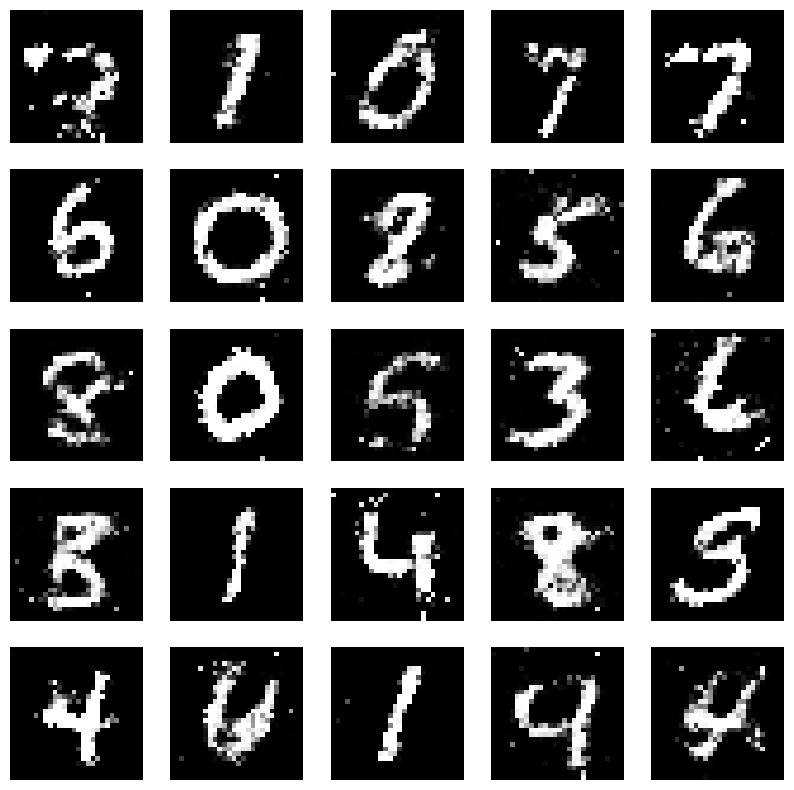

Epochs:  85


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:55,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/273 [00:00<02:09,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:18,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 4/273 [00:02<02:23,  1.87it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<02:16,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<02:04,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:03<01:53,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:47,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:04<01:50,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:04<01:46,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:44,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:42,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:43,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:07<01:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:39,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:38,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:41,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:10<01:35,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 27/273 [00:11<01:31,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 10%|█         | 28/273 [00:11<01:30,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:29,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:29,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:27,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:12<01:35,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:42,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:13<01:48,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:50,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:52,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▎        | 37/273 [00:15<01:53,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 38/273 [00:16<02:00,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:53,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 40/273 [00:16<01:50,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:17<01:42,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:36,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:38,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:18<01:33,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:31,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 46/273 [00:19<01:31,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:27,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:19<01:24,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:28,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 51/273 [00:21<01:23,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:22,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:21,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:23,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:24,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:21,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 22%|██▏       | 59/273 [00:24<01:22,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:20,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:24<01:24,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 62/273 [00:25<01:31,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:30,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:24,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:25,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 66/273 [00:27<01:32,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:32,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 68/273 [00:28<01:37,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 69/273 [00:28<01:37,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 70/273 [00:29<01:35,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 71/273 [00:29<01:35,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:30<01:37,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 73/273 [00:30<01:35,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 74/273 [00:31<01:34,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:31,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 76/273 [00:31<01:28,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:22,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:33<01:18,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 80/273 [00:33<01:14,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 30%|██▉       | 81/273 [00:33<01:11,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:09,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 83/273 [00:34<01:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:12,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:10,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:11,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:08,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:36<01:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:37<01:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:38<01:10,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:13,  2.42it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:39<01:14,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:12,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:08,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:07,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:06,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:41<01:10,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 102/273 [00:42<01:12,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:13,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 104/273 [00:43<01:16,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:43<01:16,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:43<01:17,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:44<01:19,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 108/273 [00:44<01:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:45<01:20,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 110/273 [00:45<01:17,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:11,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:08,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:47<01:04,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 114/273 [00:47<01:03,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:05,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 116/273 [00:48<01:06,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:03,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:02,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:49<01:06,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:01,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:58,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:50<00:59,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:51<00:57,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:51<00:58,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<00:56,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:52<01:03,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:53<00:59,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:56,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:53<00:56,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:54,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:54<00:53,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:52,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<00:54,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:56<00:59,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 50%|█████     | 137/273 [00:56<01:02,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<01:03,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:57<01:04,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:58<01:05,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:58<01:09,  1.90it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<01:04,  2.02it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<01:00,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [01:00<00:56,  2.28it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [01:00<00:53,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:50,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 147/273 [01:01<01:00,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:56,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [01:02<00:53,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:50,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 151/273 [01:03<00:50,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:49,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:03<00:47,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:46,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:45,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:05<00:46,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:44,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:06<00:44,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:41,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:41,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 60%|█████▉    | 163/273 [01:07<00:41,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:41,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:40,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 166/273 [01:08<00:39,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 167/273 [01:09<00:43,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:09<00:45,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 169/273 [01:10<00:45,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 170/273 [01:10<00:47,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 171/273 [01:11<00:47,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [01:11<00:48,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:12<00:49,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:12<00:49,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:13<00:50,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:13<00:45,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:43,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:40,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:38,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:15<00:38,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:15<00:38,  2.42it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:16<00:38,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:37,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:16<00:36,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:35,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:17<00:34,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:33,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:18<00:33,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:19<00:30,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:19<00:30,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:21<00:28,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 202/273 [01:23<00:28,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:30,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:30,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 205/273 [01:25<00:30,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:25<00:30,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:26<00:29,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▌  | 208/273 [01:26<00:30,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:29,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:27<00:30,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:28<00:29,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:28,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:25,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 214/273 [01:29<00:24,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:24,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:30<00:23,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:22,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:31<00:20,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:31<00:19,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:32<00:18,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:18,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:34<00:16,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:16,  2.70it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:37<00:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:14,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:39<00:14,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:39<00:15,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:40<00:15,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 242/273 [01:40<00:15,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:41<00:14,  2.02it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:41<00:13,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:42<00:13,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:42<00:12,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:11,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:11,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 249/273 [01:43<00:10,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:45<00:08,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:04,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6895099878311157 , 0.7227437496185303
1/1 [==============================] - 0s 27ms/step


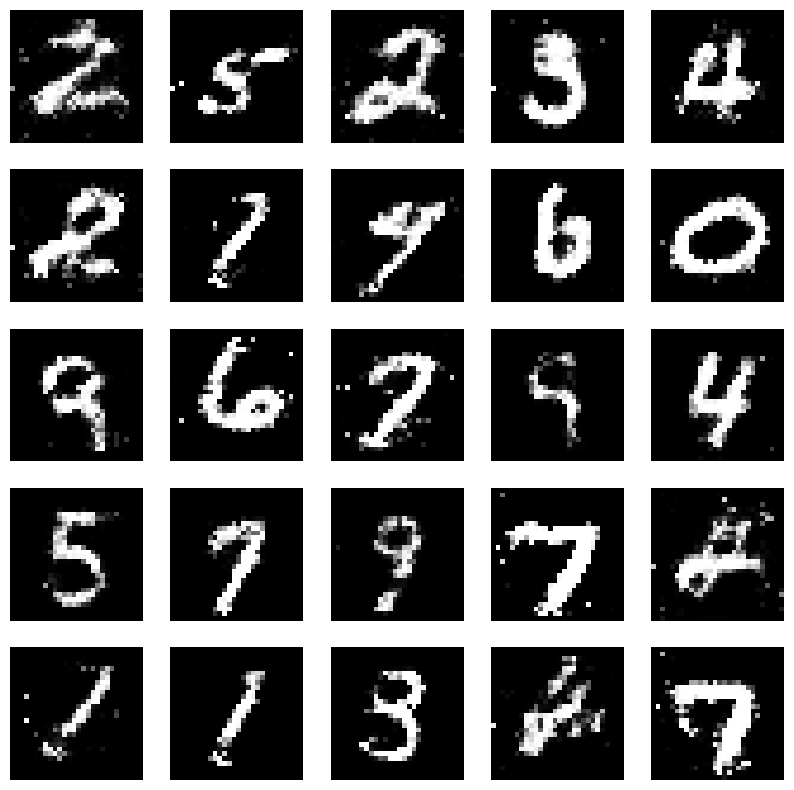

Epochs:  86


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:54,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:48,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:39,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:44,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:41,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:38,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:03<01:36,  2.74it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:38,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:40,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:37,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:37,  2.66it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:06<01:39,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:36,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:07<01:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:39,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:39,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:36,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:09<01:46,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:50,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:10<01:56,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 28/273 [00:11<01:55,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:11<02:08,  1.90it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 30/273 [00:12<02:08,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 31/273 [00:12<02:04,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:56,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 33/273 [00:13<01:56,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:48,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:46,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:40,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:36,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 38/273 [00:15<01:44,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:39,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:39,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:34,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:17<01:32,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:29,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:31,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:30,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:33,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:34,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:21<01:31,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:21<01:27,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:29,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:27,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 56/273 [00:23<01:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 57/273 [00:23<01:34,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:24<01:33,  2.31it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 59/273 [00:24<01:43,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:25<01:42,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:44,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:43,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:42,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:27<01:44,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 65/273 [00:27<01:43,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:28<01:39,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:28<01:33,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:28,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:29<01:22,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:20,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:30<01:22,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:20,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:15,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:31<01:19,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:19,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:20,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:15,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:33<01:15,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:33<01:15,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:13,  2.61it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 82/273 [00:34<01:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:14,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:35<01:14,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:14,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:35<01:12,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:36<01:11,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:36<01:17,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:38<01:17,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 92/273 [00:38<01:22,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:21,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 94/273 [00:39<01:20,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:18,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:40<01:21,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 97/273 [00:40<01:22,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:41<01:22,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:41<01:21,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:42<01:18,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:18,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:43<01:15,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:43<01:12,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:08,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:44<01:07,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:44<01:05,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:45<01:03,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:07,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:03,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 112/273 [00:46<01:04,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:47<01:06,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:02,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:48<01:02,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 116/273 [00:48<01:00,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:01,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:00,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<00:58,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:50<01:01,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▍     | 122/273 [00:51<01:03,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<01:02,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:51<01:01,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:52<01:02,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 126/273 [00:52<01:05,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:53<01:05,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 128/273 [00:53<01:07,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 129/273 [00:54<01:09,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 130/273 [00:54<01:10,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<01:07,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:55<01:06,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 133/273 [00:56<01:05,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<01:00,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:57,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:57<00:55,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:57<00:55,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<00:54,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:58<00:52,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:52,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:59<00:51,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 142/273 [00:59<00:53,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:53,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:00<00:51,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:51,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:01<00:51,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:01<00:49,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:02<00:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:48,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:47,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:46,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:44,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 156/273 [01:05<00:44,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:43,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:05<00:44,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:46,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:49,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 162/273 [01:07<00:50,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:08<00:50,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:50,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 165/273 [01:09<00:51,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:09<00:51,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:10<00:49,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 168/273 [01:10<00:50,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:11<00:48,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:11<00:45,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:44,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:45,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:44,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:13<00:41,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:42,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:40,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:39,  2.45it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 178/273 [01:14<00:39,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:15<00:37,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:36,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:15<00:38,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:37,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:16<00:37,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 184/273 [01:17<00:36,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:17<00:34,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:17<00:34,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:18<00:34,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:35,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:19<00:35,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:19<00:31,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:20<00:31,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:32,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:34,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:21<00:34,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:34,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:22<00:34,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 198/273 [01:23<00:34,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:23<00:34,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 200/273 [01:24<00:33,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:24<00:31,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 202/273 [01:24<00:32,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:25<00:30,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:27,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:27<00:26,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:24,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:29<00:22,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:21,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 217/273 [01:30<00:20,  2.69it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 218/273 [01:31<00:21,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:20,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:19,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:32<00:18,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:33<00:18,  2.69it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:34<00:17,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 229/273 [01:35<00:18,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:18,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 231/273 [01:36<00:19,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:18,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:37<00:18,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 234/273 [01:37<00:18,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:17,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 236/273 [01:38<00:17,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:39<00:16,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 238/273 [01:39<00:15,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:40<00:15,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:14,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:42<00:11,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:42<00:11,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:45<00:07,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:45<00:08,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:51<00:03,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6867375373840332 , 0.7219215631484985
1/1 [==============================] - 0s 27ms/step


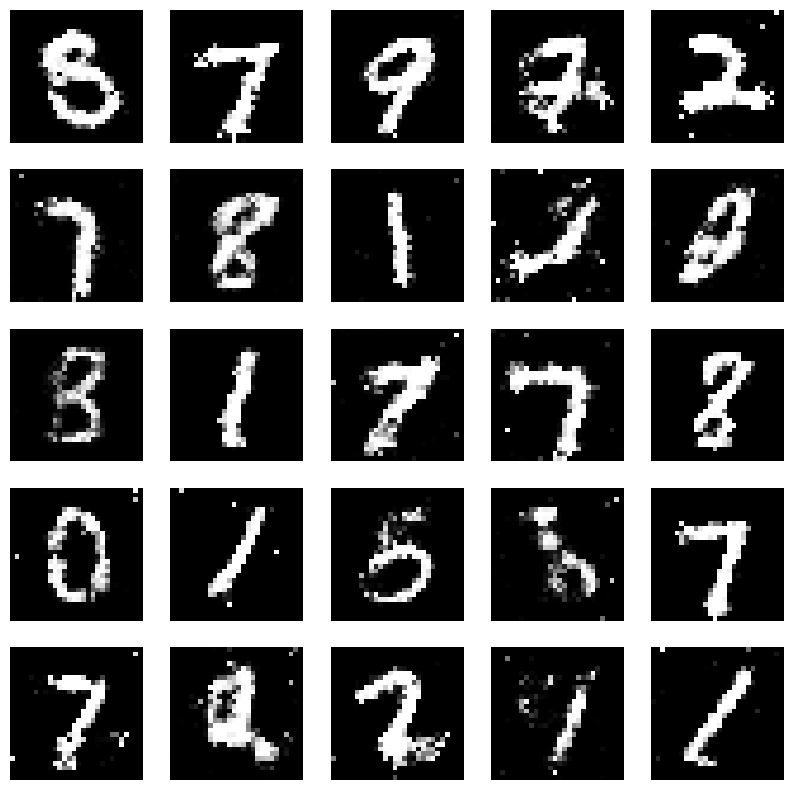

Epochs:  87


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/273 [00:00<01:57,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:44,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:44,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:47,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:40,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:38,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:03<01:43,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:42,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▎         | 10/273 [00:03<01:44,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 11/273 [00:04<01:42,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:39,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:05<01:44,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:44,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:40,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:45,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:46,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 19/273 [00:07<01:50,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:08<01:59,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:58,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:09<01:59,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 23/273 [00:09<02:00,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:10<02:01,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:10<01:56,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:48,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:46,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:43,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:12<01:37,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:34,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:35,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:34,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:13<01:37,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 34/273 [00:14<01:37,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:35,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:15<01:32,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:16<01:31,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:16<01:33,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:30,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 42/273 [00:17<01:28,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:31,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:17<01:28,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:27,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:18<01:33,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:19<01:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:37,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:37,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:33,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 51/273 [00:21<01:44,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:44,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 53/273 [00:22<01:45,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:22<01:47,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 55/273 [00:23<01:46,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:23<01:44,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 57/273 [00:24<01:45,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:44,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:25<01:44,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:34,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 61/273 [00:25<01:27,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:26<01:26,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:22,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:20,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:19,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 66/273 [00:27<01:21,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:28<01:19,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:23,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:29<01:19,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:19,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:30<01:20,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:17,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:30<01:19,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:17,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:31<01:17,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:32<01:17,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:16,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:13,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:33<01:15,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 30%|██▉       | 81/273 [00:33<01:18,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:33<01:15,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:15,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:13,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:35<01:11,  2.64it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 86/273 [00:35<01:18,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:23,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:36<01:25,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:37<01:24,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:37<01:25,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:38<01:26,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 92/273 [00:38<01:27,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▍      | 93/273 [00:38<01:24,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 94/273 [00:39<01:24,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:39<01:22,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:40<01:16,  2.30it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:40<01:15,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:41<01:10,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▋      | 99/273 [00:41<01:11,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 100/273 [00:41<01:11,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:09,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:08,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 103/273 [00:43<01:08,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:09,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:43<01:07,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:44<01:09,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:05,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:45<01:04,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:45<01:05,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:01,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:02,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:46<01:03,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:47<01:00,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 116/273 [00:48<01:03,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:01,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 118/273 [00:49<01:02,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:49<01:03,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:03,  2.43it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 121/273 [00:50<01:04,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:50<01:07,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 123/273 [00:51<01:10,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 124/273 [00:51<01:09,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 125/273 [00:52<01:09,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 126/273 [00:52<01:09,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:53<01:11,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:53<01:07,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<01:05,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 130/273 [00:54<01:05,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<01:00,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:57,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:56,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:54,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:52,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:57<00:50,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:49,  2.73it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████▏    | 140/273 [00:58<00:50,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 52%|█████▏    | 141/273 [00:58<00:49,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [00:59<00:51,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:49,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [00:59<00:47,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:47,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:49,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:00<00:48,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:48,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:47,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [01:02<00:46,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:47,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:02<00:51,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:03<00:48,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:03<00:48,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:46,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:04<00:47,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 157/273 [01:05<00:49,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 158/273 [01:05<00:50,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 159/273 [01:05<00:51,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:06<00:52,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:06<00:53,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:07<00:52,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:07<00:52,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:52,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:50,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 166/273 [01:09<00:47,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:44,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:44,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:10<00:45,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:43,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 171/273 [01:11<00:41,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:40,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [01:12<00:39,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:13<00:36,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:13<00:35,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:35,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:36,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 181/273 [01:15<00:37,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:15<00:34,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 184/273 [01:16<00:34,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:31,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:31,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:31,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:30,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:33,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:19<00:35,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:19<00:36,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 193/273 [01:20<00:37,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:37,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:21<00:38,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:38,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 197/273 [01:22<00:36,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:22<00:35,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 199/273 [01:22<00:35,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:32,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:31,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:29,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:28,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:27,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:26,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:26<00:26,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:25,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:28<00:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:23,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 215/273 [01:29<00:22,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:29<00:23,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 217/273 [01:30<00:22,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:30<00:22,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:30<00:21,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:31<00:19,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:18,  2.72it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.62it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 225/273 [01:33<00:20,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 226/273 [01:33<00:20,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:20,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 228/273 [01:34<00:19,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:35<00:19,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 230/273 [01:35<00:19,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 231/273 [01:36<00:19,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:36<00:18,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:37<00:19,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:17,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:37<00:16,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:15,  2.46it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:41<00:12,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 248/273 [01:43<00:09,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.56it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 261/273 [01:48<00:05,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:04,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:49<00:04,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 267/273 [01:51<00:03,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.20it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.6870198249816895 , 0.7204920053482056
1/1 [==============================] - 0s 65ms/step


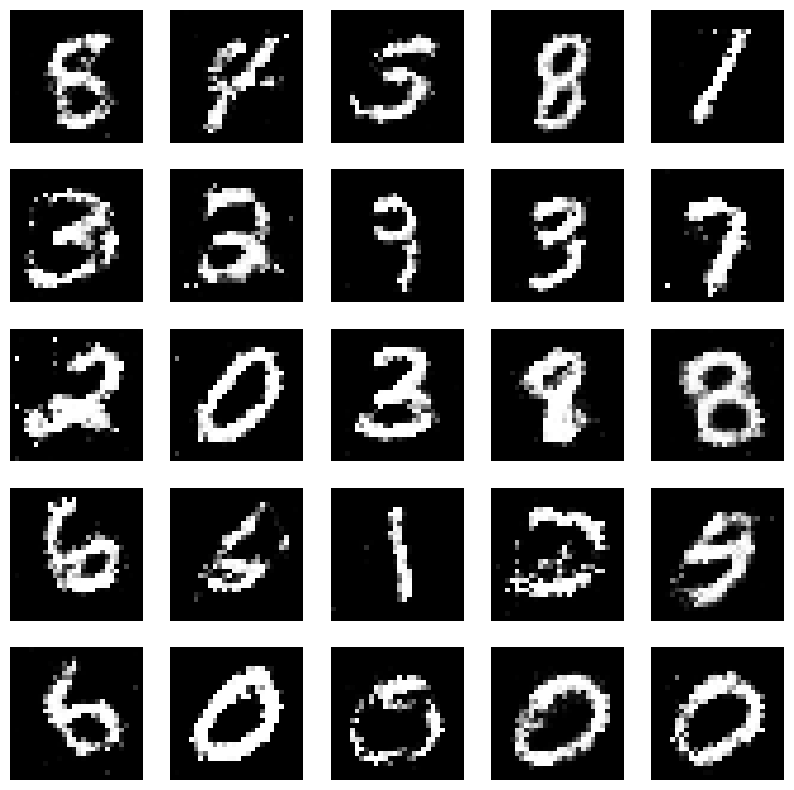

Epochs:  88


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<02:01,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:56,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<01:53,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:49,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<01:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:43,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:48,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:51,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:55,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:04<02:00,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▍         | 11/273 [00:04<02:05,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<02:08,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<02:07,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 14/273 [00:06<02:04,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 15/273 [00:06<02:03,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 16/273 [00:07<02:03,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 17/273 [00:07<02:02,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:08<02:05,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 19/273 [00:08<02:04,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:09<01:51,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:45,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:09<01:45,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:41,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:36,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 25/273 [00:10<01:39,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:35,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:12<01:37,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:34,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:12<01:33,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:13<01:30,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:33,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:14<01:30,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:29,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 35/273 [00:14<01:31,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:29,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:27,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:24,  2.80it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 39/273 [00:16<01:30,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:28,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 41/273 [00:17<01:29,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:41,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:17<01:35,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:37,  2.36it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 45/273 [00:18<01:44,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:44,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 47/273 [00:19<01:48,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 48/273 [00:20<01:48,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 49/273 [00:20<01:48,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 50/273 [00:21<01:48,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▊        | 51/273 [00:21<01:44,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▉        | 52/273 [00:22<01:43,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:36,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:23<01:32,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:23<01:34,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:29,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:26,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:24<01:26,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:25<01:25,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 60/273 [00:25<01:21,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:20,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:21,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:20,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:18,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:19,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:19,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▌       | 69/273 [00:28<01:19,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:17,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:18,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:21,  2.45it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 73/273 [00:30<01:22,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:30<01:21,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:18,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:15,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:32<01:17,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:23,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:33<01:30,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:34<01:31,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 82/273 [00:34<01:31,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 83/273 [00:35<01:30,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:35<01:29,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 85/273 [00:36<01:29,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 86/273 [00:36<01:28,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:25,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 88/273 [00:37<01:19,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:18,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:38<01:18,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:18,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:38<01:14,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:39<01:14,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:39<01:12,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:40<01:15,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:40<01:13,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:41<01:13,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:41<01:12,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:41<01:12,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:42<01:08,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:06,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:07,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:05,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:43<01:03,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:44<01:05,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:04,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:45<01:07,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 109/273 [00:45<01:08,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:46<01:04,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:46<01:04,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:46<01:07,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:47<01:08,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:47<01:09,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:48<01:10,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:48<01:12,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 117/273 [00:49<01:11,  2.19it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 118/273 [00:49<01:11,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:50<01:11,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 120/273 [00:50<01:11,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:51<01:07,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<01:03,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:51<01:01,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:52<01:01,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<01:02,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<01:01,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<00:58,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:53<00:57,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<00:56,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:56,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:55<00:54,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 132/273 [00:55<00:57,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:54,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:56<00:53,  2.59it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:53,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:57<00:51,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:53,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:58<00:52,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:53,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 141/273 [00:59<00:53,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:50,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:59<00:50,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [01:00<00:49,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:49,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:00<00:52,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 147/273 [01:01<00:56,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:02<00:58,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:02<00:57,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:02<00:57,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:03<00:56,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:03<00:56,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:55,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 154/273 [01:04<00:57,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 155/273 [01:05<00:56,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 156/273 [01:05<00:56,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 157/273 [01:06<00:53,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 158/273 [01:06<00:49,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:06<00:46,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 161/273 [01:07<00:46,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:08<00:44,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:44,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:09<00:45,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 60%|██████    | 165/273 [01:09<00:42,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:48,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:10<00:44,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 168/273 [01:10<00:47,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:11<00:43,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:11<00:41,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:11<00:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:40,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:12<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:13<00:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:13<00:37,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:13<00:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:35,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:34,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:15<00:33,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:15<00:34,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 182/273 [01:16<00:37,  2.40it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 183/273 [01:16<00:43,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 184/273 [01:17<00:42,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 185/273 [01:17<00:40,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 186/273 [01:18<00:40,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:18<00:42,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 188/273 [01:19<00:41,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 189/273 [01:19<00:39,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 190/273 [01:20<00:39,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:20<00:38,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:20<00:35,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:21<00:33,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:22<00:31,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:22<00:32,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:29,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:28,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:24<00:27,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:24<00:28,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.59it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 203/273 [01:25<00:27,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:27,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:27,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:27<00:25,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:24,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:28<00:25,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 212/273 [01:28<00:24,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:29<00:23,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:29<00:22,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.75it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:30<00:23,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:30<00:24,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:31<00:25,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 80%|████████  | 219/273 [01:32<00:26,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:32<00:25,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:33<00:26,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 222/273 [01:33<00:25,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 223/273 [01:34<00:24,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 224/273 [01:34<00:23,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:34<00:21,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:35<00:20,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:35<00:19,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:36<00:18,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:36<00:18,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:37<00:17,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:16,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 233/273 [01:38<00:16,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:39<00:14,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:40<00:14,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:40<00:12,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:41<00:11,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:41<00:11,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:42<00:10,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:42<00:10,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:10,  2.44it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 248/273 [01:44<00:10,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:44<00:09,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:46<00:08,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 254/273 [01:46<00:08,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:47<00:08,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 257/273 [01:48<00:07,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 258/273 [01:48<00:07,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 259/273 [01:49<00:06,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 95%|█████████▌| 260/273 [01:49<00:05,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 261/273 [01:49<00:05,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:54<00:00,  2.39it/s]


Perdidas:  0.6795884370803833 , 0.7482661008834839
1/1 [==============================] - 0s 36ms/step


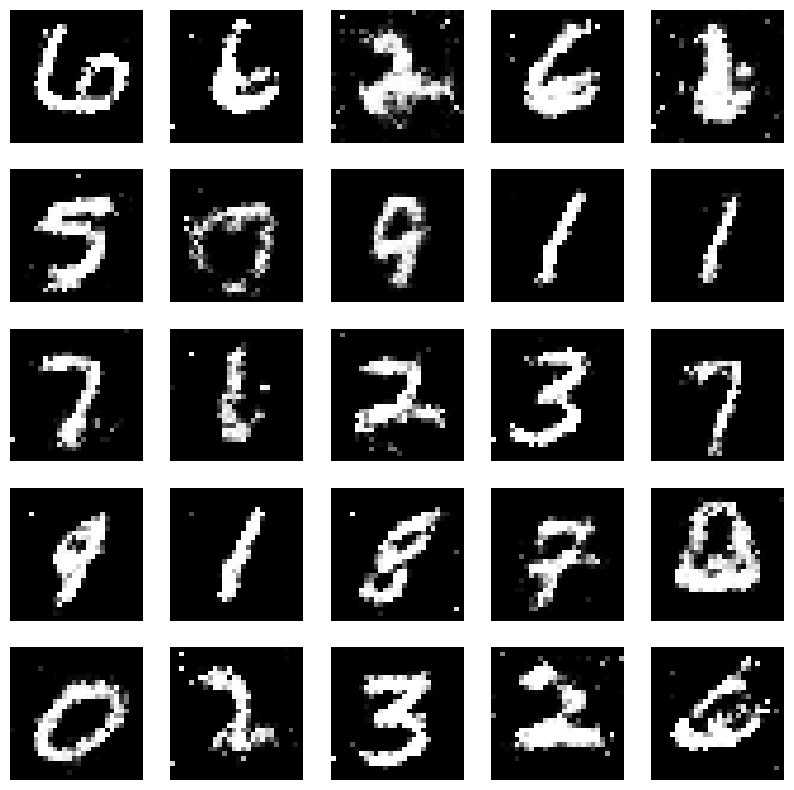

Epochs:  89


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:32,  2.94it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/273 [00:00<01:44,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:48,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<01:53,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 5/273 [00:02<01:57,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<02:00,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 7/273 [00:03<02:46,  1.60it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 8/273 [00:04<02:38,  1.67it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<02:25,  1.82it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 10/273 [00:05<02:21,  1.86it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<02:11,  2.00it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<02:00,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 13/273 [00:06<01:54,  2.27it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:06<01:46,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:43,  2.49it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 16/273 [00:07<01:42,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:07<01:38,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 18/273 [00:08<01:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:42,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:08<01:39,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:09<01:36,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 22/273 [00:09<01:38,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:10<01:36,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 25/273 [00:10<01:34,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:11<01:36,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:33,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:30,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:34,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:31,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:31,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:33,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:31,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:31,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:37,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:16<01:43,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 40/273 [00:16<01:46,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 41/273 [00:17<01:46,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:45,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:18<01:47,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 44/273 [00:18<01:49,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:19<01:52,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 46/273 [00:19<01:53,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:20<01:42,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:37,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:31,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 50/273 [00:21<01:33,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:29,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 52/273 [00:22<01:25,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:21,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:22,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:23<01:22,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:23<01:23,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:24<01:26,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:24<01:24,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 59/273 [00:24<01:28,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:24,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:21,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:26<01:23,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:19,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:27<01:25,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 66/273 [00:27<01:23,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 67/273 [00:28<01:22,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:28<01:22,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:21,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:19,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:20,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:30<01:24,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 74/273 [00:31<01:29,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:31<01:30,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 76/273 [00:31<01:30,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 77/273 [00:32<01:32,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▊       | 78/273 [00:32<01:31,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 79/273 [00:33<01:31,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:33<01:31,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 30%|██▉       | 81/273 [00:34<01:30,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:22,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:35<01:17,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:17,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:35<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:13,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 87/273 [00:36<01:15,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:11,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:37<01:11,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:37<01:11,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 91/273 [00:38<01:13,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:10,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:38<01:09,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:39<01:11,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:39<01:13,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:11,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:10,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 98/273 [00:40<01:06,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▋      | 99/273 [00:41<01:07,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:06,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:42<01:05,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 102/273 [00:42<01:12,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:09,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:08,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:43<01:10,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:44<01:07,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:08,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:12,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 109/273 [00:45<01:11,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 110/273 [00:46<01:14,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 111/273 [00:46<01:14,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████      | 112/273 [00:47<01:16,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:16,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:48<01:18,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:48<01:15,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:10,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 117/273 [00:49<01:09,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:03,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:49<01:00,  2.55it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 120/273 [00:50<01:00,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:58,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<00:57,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<00:56,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:51<00:57,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:52<00:57,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 126/273 [00:52<00:59,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<00:59,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:56,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:53<00:53,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:54<00:54,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:54<00:52,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:54<00:55,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:56,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 135/273 [00:56<00:53,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:52,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:56<00:53,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:57<00:54,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:52,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:53,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:58<00:51,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<00:53,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 143/273 [00:59<00:54,  2.38it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 144/273 [00:59<00:56,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 145/273 [01:00<00:58,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:59,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:01<01:04,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<01:03,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:02<01:03,  1.94it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<01:00,  2.03it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:58,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:03<00:54,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:50,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:04<00:55,  2.15it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [01:05<00:52,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:50,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 157/273 [01:05<00:47,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:46,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:43,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:43,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:41,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:42,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:40,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 167/273 [01:09<00:41,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:10<00:42,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [01:10<00:40,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:10<00:42,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:41,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 172/273 [01:11<00:39,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:12<00:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:13<00:37,  2.58it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:13<00:40,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 178/273 [01:14<00:42,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 179/273 [01:14<00:43,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 180/273 [01:15<00:44,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:15<00:43,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 182/273 [01:16<00:43,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:16<00:42,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 184/273 [01:17<00:43,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:17<00:40,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:36,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:34,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:19<00:32,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:19<00:31,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:19<00:32,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:30,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:20<00:29,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:29,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:21<00:29,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:22<00:29,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 198/273 [01:22<00:30,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:26,  2.53it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 211/273 [01:27<00:26,  2.34it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:28<00:27,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 213/273 [01:28<00:28,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 214/273 [01:29<00:28,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 215/273 [01:29<00:28,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:30<00:27,  2.04it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:30<00:26,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 80%|███████▉  | 218/273 [01:31<00:26,  2.10it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:31<00:24,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:32<00:22,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:21,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:20,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 223/273 [01:33<00:19,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:18,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:17,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:35<00:16,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:15,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:38<00:13,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 241/273 [01:40<00:12,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 244/273 [01:41<00:10,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:11,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 247/273 [01:42<00:11,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:43<00:11,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:43<00:11,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6783323287963867 , 0.7057739496231079
1/1 [==============================] - 0s 28ms/step


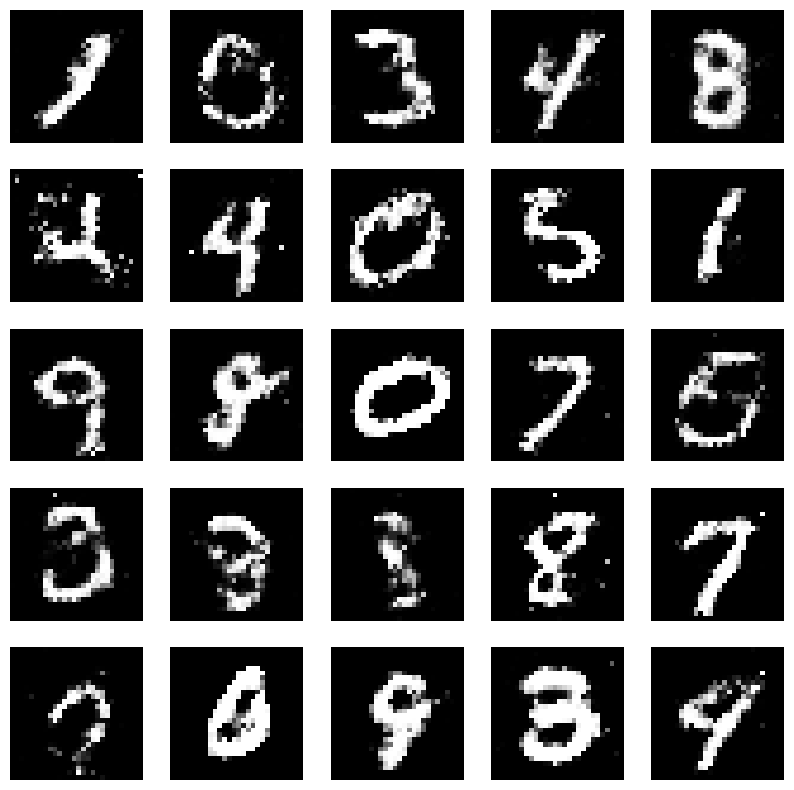

Epochs:  90


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 9ms/step


  0%|          | 1/273 [00:00<01:54,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<02:04,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 3/273 [00:01<02:06,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<02:06,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<02:09,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<02:01,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:03<01:58,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<01:59,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<01:52,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:50,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:47,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:44,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:05<01:45,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:40,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:07<01:39,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 20/273 [00:08<01:35,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:40,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:37,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:37,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:34,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:37,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:36,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:11<01:32,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:29,  2.72it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 31/273 [00:12<01:30,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 32/273 [00:12<01:29,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:29,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 12%|█▏        | 34/273 [00:13<01:31,  2.61it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 35/273 [00:14<01:39,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 36/273 [00:14<01:42,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 37/273 [00:15<01:45,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:47,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:15<01:45,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:45,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:46,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:17<01:43,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 43/273 [00:17<01:45,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 44/273 [00:18<01:44,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:43,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 46/273 [00:19<01:40,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:34,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:19<01:32,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:20<01:28,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:26,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:26,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:26,  2.50it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 57/273 [00:23<01:27,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:20,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:21,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:20,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 63/273 [00:25<01:20,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:26<01:18,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 24%|██▍       | 65/273 [00:26<01:17,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:26<01:19,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:17,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:16,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:27<01:15,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 70/273 [00:28<01:17,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 71/273 [00:28<01:22,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:25,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 73/273 [00:29<01:26,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:30<01:26,  2.31it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 75/273 [00:30<01:29,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:29,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:32,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▊       | 78/273 [00:32<01:34,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 79/273 [00:32<01:30,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:32<01:25,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:21,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:17,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:34<01:14,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:34<01:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:13,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:12,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:35<01:09,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:36<01:12,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:09,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:37<01:11,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:09,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:38<01:08,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▍      | 95/273 [00:38<01:09,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▌      | 96/273 [00:39<01:08,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:39<01:07,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 36%|███▌      | 98/273 [00:39<01:09,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:40<01:08,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:40<01:06,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 101/273 [00:40<01:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:05,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 103/273 [00:41<01:02,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:42<01:04,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 105/273 [00:42<01:08,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:09,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 107/273 [00:43<01:13,  2.27it/s]

4/4 [==============================] - 0s 16ms/step


 40%|███▉      | 108/273 [00:44<01:15,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:44<01:16,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:44<01:13,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 111/273 [00:45<01:13,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:13,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:46<01:16,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 114/273 [00:46<01:16,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:47<01:09,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:07,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:48<01:06,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:48<01:03,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▎     | 119/273 [00:48<01:02,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:00,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:59,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:49<00:56,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:50<00:56,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<00:55,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:51<00:56,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 127/273 [00:51<00:55,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:52<00:53,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:52<00:54,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:52<00:55,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:53<00:53,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:53<00:53,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:54<00:54,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:54<00:53,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:54<00:52,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:55<00:51,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 50%|█████     | 137/273 [00:55<00:50,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:55<00:49,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:56<00:51,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:56<00:52,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:57<00:54,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:57<00:56,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [00:58<00:57,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [00:58<00:59,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 145/273 [00:59<00:57,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [00:59<00:56,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [00:59<00:56,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 148/273 [01:00<00:58,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 149/273 [01:01<00:59,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 55%|█████▍    | 150/273 [01:01<00:58,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:01<00:56,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:51,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:02<00:48,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:02<00:47,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:48,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:03<00:46,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:47,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:04<00:45,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 159/273 [01:04<00:44,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [01:05<00:45,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:05<00:45,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:06<00:43,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:06<00:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:06<00:42,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:07<00:42,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:07<00:40,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:08<00:39,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:08<00:39,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 169/273 [01:08<00:39,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:09<00:40,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:09<00:41,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:10<00:43,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:10<00:41,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:10<00:40,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:11<00:41,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:11<00:39,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 177/273 [01:12<00:40,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:12<00:39,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 179/273 [01:13<00:41,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:13<00:41,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▋   | 181/273 [01:14<00:42,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [01:14<00:42,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 183/273 [01:15<00:42,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 184/273 [01:15<00:41,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 185/273 [01:16<00:41,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 186/273 [01:16<00:40,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:16<00:37,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:35,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:17<00:34,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:17<00:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 191/273 [01:18<00:30,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:18<00:31,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████▏  | 195/273 [01:19<00:28,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


 72%|███████▏  | 196/273 [01:20<00:28,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:20<00:29,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:20<00:28,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 199/273 [01:21<00:27,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:21<00:29,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▎  | 201/273 [01:22<00:27,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:22<00:28,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 203/273 [01:22<00:27,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:23<00:27,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:23<00:26,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:24<00:25,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:24<00:24,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:24<00:24,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:24,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 210/273 [01:25<00:23,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:25<00:23,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:26<00:23,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 213/273 [01:26<00:24,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 214/273 [01:27<00:26,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:27<00:25,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:28<00:26,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:28<00:25,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:29<00:26,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 80%|████████  | 219/273 [01:29<00:26,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 220/273 [01:30<00:24,  2.17it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:30<00:24,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:31<00:23,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:21,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:31<00:20,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:32<00:19,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:32<00:17,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:18,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:33<00:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:34<00:16,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:34<00:16,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:34<00:15,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:35<00:14,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:35<00:15,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:36<00:15,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:36<00:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:36<00:13,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:37<00:12,  2.75it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:37<00:12,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:37<00:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:38<00:12,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:38<00:12,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:39<00:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:39<00:11,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:39<00:10,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:40<00:10,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:40<00:10,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:41<00:09,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:41<00:10,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 250/273 [01:42<00:10,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:42<00:10,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 252/273 [01:43<00:10,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 253/273 [01:43<00:09,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:44<00:09,  2.02it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 255/273 [01:44<00:08,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 256/273 [01:45<00:08,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 94%|█████████▍| 257/273 [01:45<00:07,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:45<00:06,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:47<00:03,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:49<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:50<00:01,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [01:51<00:00,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:51<00:00,  2.44it/s]


Perdidas:  0.680953860282898 , 0.7248491644859314
1/1 [==============================] - 0s 31ms/step


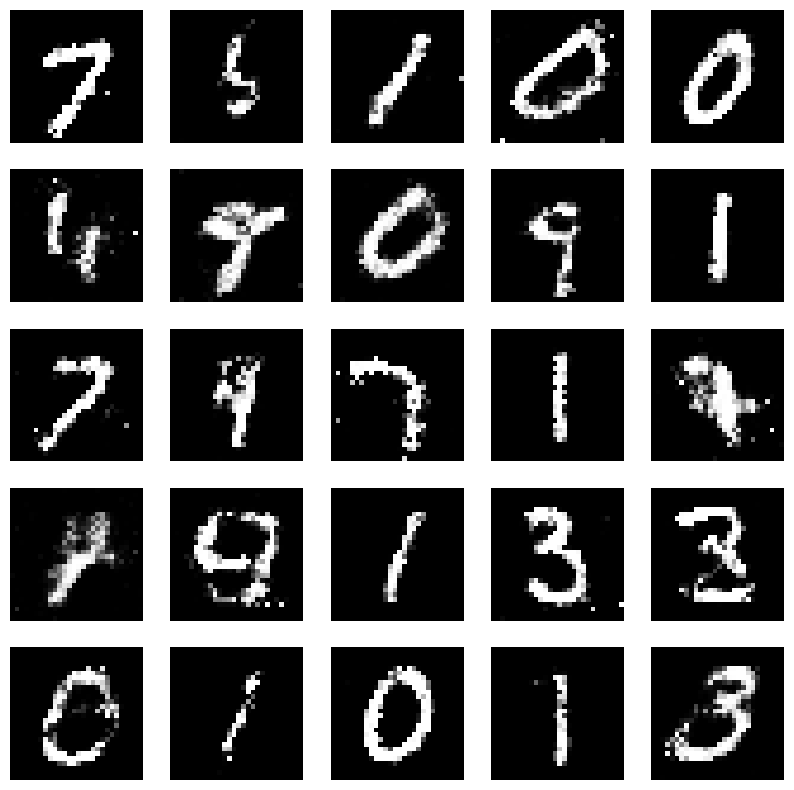

Epochs:  91


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/273 [00:00<02:16,  1.99it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 2/273 [00:00<02:09,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<02:09,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


  1%|▏         | 4/273 [00:01<02:08,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<02:07,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/273 [00:02<02:08,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 7/273 [00:03<02:09,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:03<02:12,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/273 [00:04<02:07,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<02:04,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<01:54,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:45,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 13/273 [00:05<01:50,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<01:44,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:39,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 16/273 [00:07<01:41,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:40,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:35,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:08<01:34,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:36,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:37,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 23/273 [00:09<01:42,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:38,  2.52it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 25/273 [00:10<01:40,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:39,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:11<01:35,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 10%|█         | 28/273 [00:11<01:36,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:36,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:33,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:30,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:34,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:34,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:33,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 36/273 [00:14<01:36,  2.46it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 37/273 [00:15<01:41,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:15<01:39,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:16<01:45,  2.22it/s]

4/4 [==============================] - 0s 20ms/step


 15%|█▍        | 40/273 [00:16<01:51,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:17<01:50,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 42/273 [00:17<01:52,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 43/273 [00:18<01:51,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 44/273 [00:18<01:47,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:19<01:44,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:36,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:31,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:32,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:20<01:28,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 50/273 [00:21<01:24,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:21<01:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:21<01:25,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▉        | 53/273 [00:22<01:23,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:22<01:22,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:22,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:20,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:21,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:24<01:19,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:19,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:24,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:25<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 64/273 [00:26<01:23,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:26<01:20,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:18,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 67/273 [00:27<01:20,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 68/273 [00:27<01:18,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:15,  2.69it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 70/273 [00:28<01:18,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:16,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▋       | 72/273 [00:29<01:23,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:30<01:26,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:30,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 75/273 [00:31<01:29,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:31<01:33,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 77/273 [00:32<01:32,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:32<01:30,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 79/273 [00:32<01:29,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 80/273 [00:33<01:32,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:25,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:34<01:19,  2.41it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 83/273 [00:34<01:18,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 84/273 [00:34<01:16,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:35<01:17,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:35<01:18,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:36<01:18,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:36<01:15,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:37<01:17,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:37<01:10,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:38<01:09,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:38<01:11,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:39<01:13,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:39<01:12,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:39<01:16,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:16,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:40<01:16,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:16,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:10,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:42<01:12,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:10,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:42<01:09,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:11,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 105/273 [00:43<01:13,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 106/273 [00:44<01:16,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:14,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 108/273 [00:45<01:14,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:15,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 110/273 [00:46<01:14,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:46<01:16,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:47<01:17,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 113/273 [00:47<01:17,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 114/273 [00:47<01:14,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:09,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:48<01:09,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 43%|████▎     | 117/273 [00:49<01:11,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<01:06,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▎     | 119/273 [00:50<01:03,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:50<01:03,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 121/273 [00:50<01:03,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<01:00,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:51<01:00,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<00:57,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:52<00:55,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:52<01:00,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<01:02,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:53<00:59,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<01:00,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:57,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<00:55,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:55<00:53,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:57<00:53,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 138/273 [00:57<00:51,  2.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 139/273 [00:57<00:51,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:58<00:52,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 141/273 [00:58<00:55,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 142/273 [00:59<00:55,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 143/273 [00:59<00:59,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:00<00:58,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 145/273 [01:00<00:59,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:01<00:59,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 147/273 [01:01<01:00,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:02<01:01,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:02<00:56,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:02<00:51,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 151/273 [01:03<00:49,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 152/273 [01:03<00:49,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▌    | 153/273 [01:04<00:48,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:04<00:45,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:04<00:44,  2.65it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:05<00:46,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:06<00:44,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:42,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:42,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:43,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:07<00:42,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:41,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:41,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:40,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:40,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:10<00:43,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:41,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:11<00:41,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:41,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▎   | 174/273 [01:12<00:39,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:40,  2.39it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 176/273 [01:13<00:40,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▍   | 177/273 [01:13<00:45,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 178/273 [01:14<00:44,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:14<00:45,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:15<00:43,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:15<00:43,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 182/273 [01:16<00:42,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:16<00:42,  2.11it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:17<00:39,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:17<00:37,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:36,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:18<00:34,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:18<00:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:33,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:19<00:31,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:19<00:30,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:30,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 71%|███████▏  | 195/273 [01:21<00:29,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.54it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 199/273 [01:22<00:29,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:28,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.62it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 202/273 [01:24<00:28,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:27,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:24<00:25,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▌  | 205/273 [01:25<00:27,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:26,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:24,  2.67it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 209/273 [01:26<00:26,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:27<00:28,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 211/273 [01:27<00:28,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 212/273 [01:28<00:27,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 213/273 [01:28<00:26,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:29<00:26,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:29<00:26,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 216/273 [01:30<00:25,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:30<00:26,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 218/273 [01:30<00:25,  2.20it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:23,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:31<00:22,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:21,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:32<00:18,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:34<00:17,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 227/273 [01:34<00:17,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:34<00:16,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:35<00:17,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:16,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:14,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 240/273 [01:39<00:12,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:11,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.40it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 246/273 [01:41<00:11,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 247/273 [01:42<00:11,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 248/273 [01:42<00:11,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 249/273 [01:43<00:11,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 250/273 [01:43<00:10,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 251/273 [01:44<00:10,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 252/273 [01:44<00:09,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 253/273 [01:45<00:09,  2.17it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:45<00:08,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:07,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 256/273 [01:46<00:07,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:06,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:47<00:06,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6777618527412415 , 0.7234556674957275
1/1 [==============================] - 0s 51ms/step


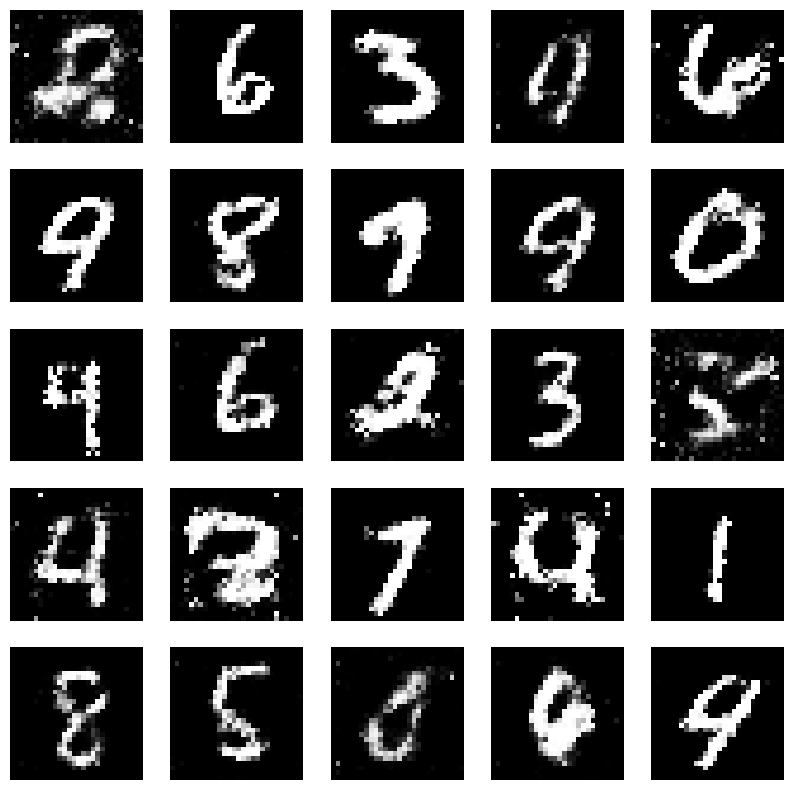

Epochs:  92


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/273 [00:00<02:19,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 2/273 [00:01<02:15,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:14,  2.00it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:02<02:19,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 5/273 [00:02<02:20,  1.91it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<02:07,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:03<01:55,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<02:03,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<01:59,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:04<01:53,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:05<01:53,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:05<01:49,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:46,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:06<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:42,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:07<01:36,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:38,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:38,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:34,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 21/273 [00:08<01:33,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 22/273 [00:09<01:36,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:35,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:10<01:35,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:31,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 26/273 [00:10<01:32,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:32,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:39,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:36,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:34,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:37,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:40,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:44,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:45,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:44,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 36/273 [00:15<01:46,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 37/273 [00:16<02:24,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:16<02:13,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 39/273 [00:17<02:09,  1.81it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:17<02:00,  1.93it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:51,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:18<01:44,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▌        | 43/273 [00:18<01:44,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:19<01:36,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:19<01:33,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:38,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:20<01:33,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:31,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:21<01:37,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:21<01:34,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:22<01:33,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 52/273 [00:22<01:35,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:31,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 20%|█▉        | 54/273 [00:23<01:31,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:36,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:24<01:29,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:24<01:31,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:25<01:31,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:25<01:25,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:25<01:23,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:26<01:27,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 62/273 [00:26<01:29,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:27<01:32,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:27<01:33,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:28<01:35,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:28<01:36,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:28<01:32,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:29<01:32,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:29<01:35,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:30<01:37,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:30<01:35,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▋       | 72/273 [00:31<01:35,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 27%|██▋       | 73/273 [00:31<01:31,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:32<01:25,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:32<01:22,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:32<01:23,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:33<01:20,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:33<01:17,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:34<01:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:34<01:16,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:34<01:13,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:35<01:14,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 83/273 [00:35<01:15,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:36<01:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:36<01:12,  2.58it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 86/273 [00:36<01:15,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:37<01:13,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 88/273 [00:37<01:11,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 89/273 [00:38<01:12,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 90/273 [00:38<01:11,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:13,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 92/273 [00:39<01:14,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 93/273 [00:39<01:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:39<01:09,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:08,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:06,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 97/273 [00:41<01:05,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:05,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:11,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 100/273 [00:42<01:19,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 101/273 [00:43<01:20,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 102/273 [00:43<01:21,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:43<01:15,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:44<01:12,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 105/273 [00:44<01:13,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:45<01:14,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:45<01:14,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:46<01:11,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:46<01:08,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:46<01:06,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:47<01:06,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:47<01:09,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:48<01:06,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:48<01:05,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 115/273 [00:48<01:03,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 42%|████▏     | 116/273 [00:49<01:05,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:49<01:01,  2.52it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 118/273 [00:50<01:04,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:50<01:01,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:50<00:59,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:51<00:59,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<00:58,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:52<00:57,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 124/273 [00:52<00:55,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:57,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<00:58,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<00:56,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<00:59,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:54<00:55,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:57,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:55<00:57,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:55,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:56<01:00,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:56<01:00,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:59,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 136/273 [00:57<01:02,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:57<01:02,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:58<01:02,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 139/273 [00:58<01:02,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:59<01:02,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 141/273 [00:59<01:02,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [01:00<00:58,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [01:00<00:54,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [01:00<00:50,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:51,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 146/273 [01:01<00:50,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:02<00:48,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<00:46,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:02<00:47,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:03<00:45,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:45,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:03<00:46,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:04<00:44,  2.68it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:04<00:44,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [01:05<00:45,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 156/273 [01:05<00:46,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:05<00:45,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 158/273 [01:06<00:45,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:07<00:43,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:07<00:41,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:42,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:08<00:40,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:40,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:08<00:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:40,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:10<00:42,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:44,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 170/273 [01:11<00:45,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:11<00:44,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 172/273 [01:11<00:44,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:12<00:45,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:12<00:45,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 175/273 [01:13<00:45,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 176/273 [01:13<00:46,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:14<00:44,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:14<00:40,  2.35it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:15<00:38,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 180/273 [01:15<00:36,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:15<00:37,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:36,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:35,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:17<00:36,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:17<00:35,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 186/273 [01:17<00:34,  2.52it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:18<00:33,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:18<00:33,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 190/273 [01:19<00:33,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:19<00:34,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:20<00:31,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:31,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:21<00:31,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:21<00:30,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:22<00:30,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:28,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:27,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 203/273 [01:24<00:28,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:25<00:28,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:25<00:29,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 206/273 [01:25<00:29,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:26<00:30,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:26<00:30,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:29,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 210/273 [01:27<00:29,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 211/273 [01:28<00:29,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:26,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 213/273 [01:29<00:26,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 214/273 [01:29<00:24,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 215/273 [01:29<00:23,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:30<00:22,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:30<00:22,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:31<00:21,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:20,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 220/273 [01:31<00:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:20,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:19,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:33<00:19,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:34<00:19,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:16,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 232/273 [01:36<00:15,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:36<00:15,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 235/273 [01:37<00:14,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:38<00:13,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.43it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:15,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:40<00:16,  1.95it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 241/273 [01:40<00:16,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:41<00:16,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:41<00:15,  1.92it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▉ | 244/273 [01:42<00:14,  1.94it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:42<00:13,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:12,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:43<00:11,  2.29it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:43<00:10,  2.34it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:44<00:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:08,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:44<00:08,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 252/273 [01:45<00:07,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:45<00:07,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:46<00:06,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:06,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:47<00:05,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:48<00:04,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 261/273 [01:48<00:04,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:50<00:02,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.76it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.71it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.52it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6778745651245117 , 0.7253483533859253
1/1 [==============================] - 0s 28ms/step


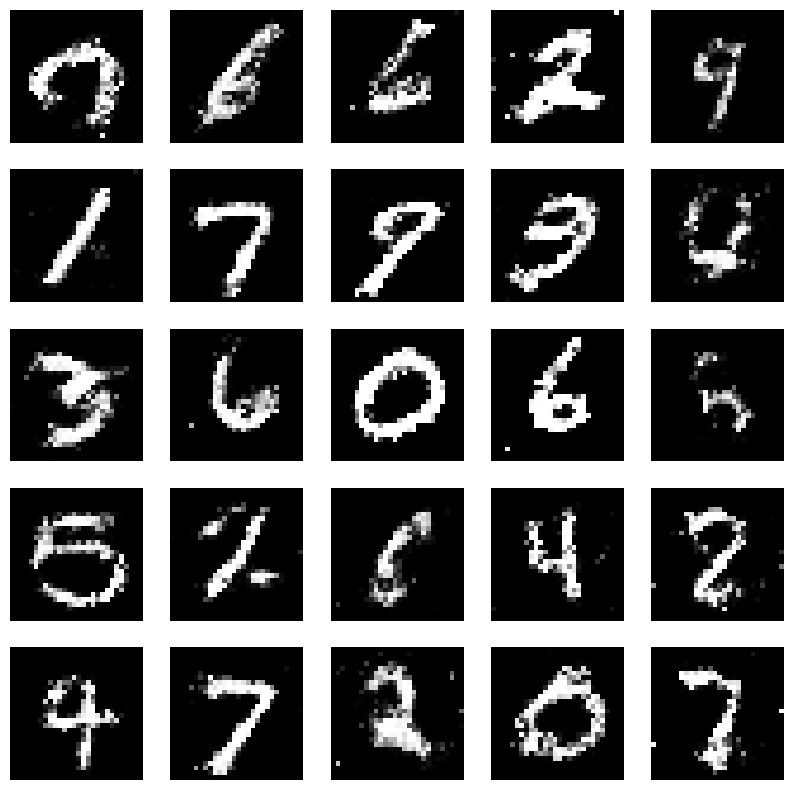

Epochs:  93


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 6ms/step


  0%|          | 1/273 [00:00<01:35,  2.85it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:38,  2.75it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 3/273 [00:01<01:40,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:41,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:37,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:38,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 7/273 [00:02<01:38,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:02<01:38,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 9/273 [00:03<01:38,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


  4%|▎         | 10/273 [00:03<01:44,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:38,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▌         | 14/273 [00:05<01:36,  2.69it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:35,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:38,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:36,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 18/273 [00:06<01:36,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:07<01:36,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 20/273 [00:07<01:34,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:07<01:39,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:08<01:36,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:08<01:36,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:09<01:38,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:45,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 26/273 [00:10<01:49,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 10%|▉         | 27/273 [00:10<01:49,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:10<01:49,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█         | 29/273 [00:11<01:50,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 30/273 [00:11<01:52,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 31/273 [00:12<01:53,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 32/273 [00:12<01:52,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 33/273 [00:13<01:55,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 34/273 [00:13<01:55,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 35/273 [00:14<01:46,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:14<01:38,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▎        | 37/273 [00:14<01:33,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:25,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 42/273 [00:16<01:30,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:17<01:23,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:17<01:24,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:27,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:18<01:25,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:31,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:19<01:26,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 19%|█▊        | 51/273 [00:20<01:23,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:20<01:24,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:23,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:22,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 20%|██        | 55/273 [00:21<01:19,  2.73it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:22<01:28,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:22<01:22,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 58/273 [00:22<01:23,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 22%|██▏       | 59/273 [00:23<01:23,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:23<01:20,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:24<01:21,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 62/273 [00:24<01:29,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 63/273 [00:25<01:35,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:25<01:36,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 65/273 [00:26<01:39,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 66/273 [00:26<01:40,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:27<01:35,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 68/273 [00:27<01:37,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 69/273 [00:28<01:35,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:28<01:29,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 71/273 [00:28<01:27,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:22,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:29<01:19,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:29<01:17,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:30<01:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:30<01:18,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:31<01:18,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:31<01:15,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:31<01:13,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 80/273 [00:32<01:12,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 81/273 [00:32<01:14,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:32<01:11,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:11,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:09,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:10,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:34<01:09,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:34<01:08,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:11,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 89/273 [00:35<01:10,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 90/273 [00:35<01:09,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:36<01:08,  2.66it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 92/273 [00:36<01:14,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 93/273 [00:37<01:10,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▍      | 94/273 [00:37<01:08,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▍      | 95/273 [00:37<01:09,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 35%|███▌      | 96/273 [00:38<01:13,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:38<01:15,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 98/273 [00:39<01:17,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:39<01:18,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:40<01:18,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 101/273 [00:40<01:18,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:41<01:17,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:15,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 104/273 [00:42<01:15,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 105/273 [00:42<01:16,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:42<01:11,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 107/273 [00:43<01:10,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:43<01:07,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:44<01:05,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 40%|████      | 110/273 [00:44<01:07,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:44<01:06,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:45<01:06,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 41%|████▏     | 113/273 [00:45<01:07,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:05,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:46<01:05,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 116/273 [00:46<01:03,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:47<01:02,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:47<01:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<01:00,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 120/273 [00:48<00:59,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 44%|████▍     | 121/273 [00:48<00:57,  2.64it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 122/273 [00:49<01:00,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 45%|████▌     | 123/273 [00:49<00:57,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:55,  2.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 125/273 [00:50<00:58,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:50<00:56,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:51<00:57,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:51<00:55,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:51<00:54,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 130/273 [00:52<00:55,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:52<00:54,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:53<00:56,  2.48it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:53<00:59,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 134/273 [00:54<00:59,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:54<01:00,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:55<01:04,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 137/273 [00:55<01:05,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 138/273 [00:56<01:04,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 139/273 [00:56<01:05,  2.04it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:57<01:00,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 141/273 [00:57<00:55,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:57<00:56,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:58<00:52,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:58<00:54,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 145/273 [00:59<00:53,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 146/273 [00:59<00:53,  2.36it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 147/273 [00:59<00:54,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:00<00:53,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:00<00:50,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:01<00:50,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:01<00:50,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 152/273 [01:01<00:48,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 153/273 [01:02<00:48,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:02<00:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:03<00:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:03<00:45,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 157/273 [01:03<00:46,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:47,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:04<00:45,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 160/273 [01:05<00:46,  2.41it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:05<00:45,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 162/273 [01:05<00:44,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 60%|█████▉    | 163/273 [01:06<00:44,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:06<00:41,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 60%|██████    | 165/273 [01:07<00:42,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 166/273 [01:07<00:45,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 61%|██████    | 167/273 [01:08<00:48,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:08<00:48,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 169/273 [01:09<00:48,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 170/273 [01:09<00:46,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 171/273 [01:09<00:45,  2.25it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 172/273 [01:10<00:44,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 173/273 [01:10<00:46,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 174/273 [01:11<00:44,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:11<00:42,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 64%|██████▍   | 176/273 [01:12<00:40,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:12<00:38,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:12<00:37,  2.53it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 179/273 [01:13<00:38,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:13<00:36,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:13<00:35,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:14<00:34,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:14<00:35,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 185/273 [01:15<00:33,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:15<00:34,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 187/273 [01:16<00:33,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:16<00:33,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 69%|██████▉   | 189/273 [01:17<00:34,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:17<00:33,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 191/273 [01:17<00:32,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 70%|███████   | 192/273 [01:18<00:32,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:18<00:30,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:29,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:19<00:29,  2.68it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 196/273 [01:19<00:30,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:20<00:29,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:20<00:28,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:20<00:28,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:21<00:29,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▎  | 201/273 [01:21<00:31,  2.30it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:22<00:32,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 203/273 [01:22<00:32,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 75%|███████▍  | 204/273 [01:23<00:32,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:23<00:32,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 206/273 [01:24<00:32,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 207/273 [01:24<00:32,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 76%|███████▌  | 208/273 [01:25<00:31,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:25<00:27,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:26,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:26<00:26,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:26<00:24,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:23,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:27<00:22,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:27<00:22,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:28<00:22,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:28<00:22,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 80%|███████▉  | 218/273 [01:29<00:21,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:29<00:21,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:29<00:21,  2.49it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:30<00:20,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:20,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:31<00:19,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:31<00:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:32<00:19,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:32<00:18,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:33<00:16,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:33<00:17,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:34<00:16,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 232/273 [01:34<00:15,  2.58it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:35<00:15,  2.50it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:35<00:16,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:36<00:16,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:36<00:16,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 237/273 [01:37<00:17,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:37<00:17,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 239/273 [01:38<00:16,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 240/273 [01:38<00:16,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 241/273 [01:39<00:15,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 242/273 [01:39<00:16,  1.88it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:40<00:14,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 244/273 [01:40<00:14,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 90%|████████▉ | 245/273 [01:40<00:13,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:12,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 247/273 [01:41<00:11,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 248/273 [01:42<00:10,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 250/273 [01:42<00:09,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:07,  2.43it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 256/273 [01:45<00:07,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 258/273 [01:46<00:06,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:47<00:05,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 265/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.47it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.698843240737915 , 0.6870203018188477
1/1 [==============================] - 0s 38ms/step


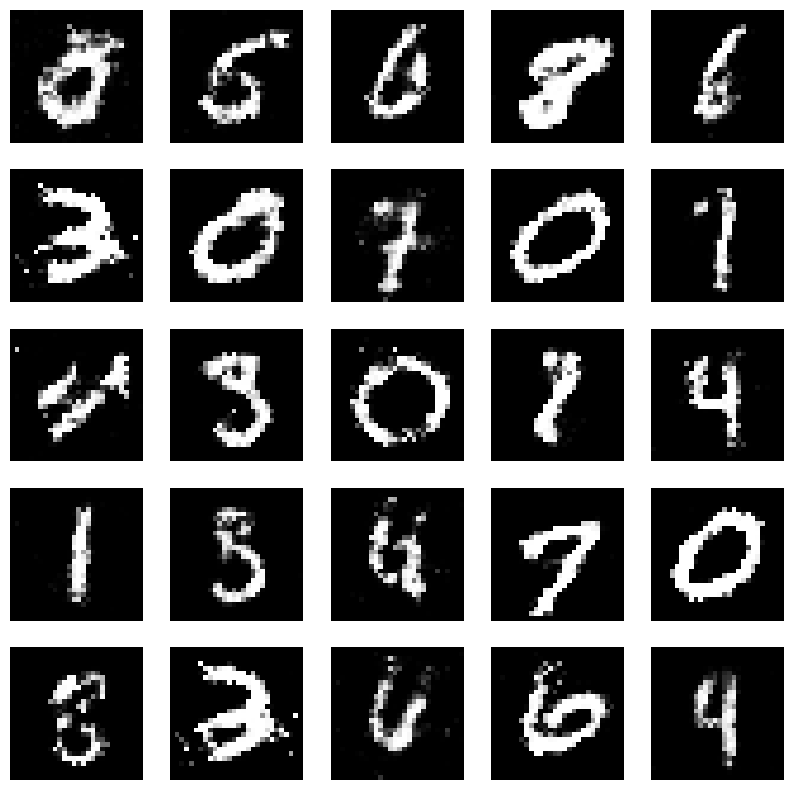

Epochs:  94


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 8ms/step


  0%|          | 1/273 [00:00<01:52,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:54,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:59,  2.26it/s]

4/4 [==============================] - 0s 9ms/step


  1%|▏         | 4/273 [00:01<01:51,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:53,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 6/273 [00:02<01:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:51,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 8/273 [00:03<01:45,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:46,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:47,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:47,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:49,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:49,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:51,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:06<01:48,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 16/273 [00:06<01:47,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:52,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 18/273 [00:07<01:56,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


  7%|▋         | 19/273 [00:08<01:55,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:08<02:00,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 21/273 [00:09<02:02,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 22/273 [00:09<02:03,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 23/273 [00:10<02:07,  1.96it/s]

4/4 [==============================] - 0s 9ms/step


  9%|▉         | 24/273 [00:10<02:02,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 25/273 [00:11<02:03,  2.01it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 26/273 [00:11<01:53,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:47,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:12<01:44,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:40,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:13<01:40,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:13<01:34,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 32/273 [00:13<01:40,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:14<01:36,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 34/273 [00:14<01:34,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 35/273 [00:15<01:38,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:33,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:31,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:16<01:34,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 39/273 [00:16<01:31,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 41/273 [00:17<01:25,  2.70it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 42/273 [00:17<01:33,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:31,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:29,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▋        | 45/273 [00:18<01:30,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 46/273 [00:19<01:34,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:31,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:36,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 49/273 [00:20<01:32,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:21<01:29,  2.49it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 51/273 [00:21<01:34,  2.35it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 52/273 [00:22<01:41,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▉        | 53/273 [00:22<01:42,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 20%|█▉        | 54/273 [00:23<01:46,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 20%|██        | 55/273 [00:23<01:46,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 56/273 [00:24<01:47,  2.02it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:24<01:49,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:25<01:49,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 59/273 [00:25<01:49,  1.96it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:26<01:40,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:26<01:33,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 62/273 [00:26<01:32,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 63/273 [00:27<01:31,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:32,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 65/273 [00:28<01:31,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:28<01:26,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:28<01:23,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:29<01:29,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:29<01:28,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:30<01:25,  2.37it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 71/273 [00:30<01:28,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:31<01:25,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:31<01:23,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 74/273 [00:31<01:21,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:32<01:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:32<01:15,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 77/273 [00:33<01:19,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▊       | 78/273 [00:33<01:21,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 79/273 [00:33<01:17,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 29%|██▉       | 80/273 [00:34<01:13,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 81/273 [00:34<01:12,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:34<01:12,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:35<01:12,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:35<01:14,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 85/273 [00:36<01:18,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 86/273 [00:36<01:23,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 87/273 [00:37<01:24,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 32%|███▏      | 88/273 [00:37<01:24,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:38<01:22,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:38<01:24,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:39<01:27,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 92/273 [00:39<01:26,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▍      | 93/273 [00:40<01:24,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 94/273 [00:40<01:19,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:40<01:16,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:41<01:12,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:41<01:11,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:42<01:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:42<01:08,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:07,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:43<01:09,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 104/273 [00:44<01:03,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:44<01:04,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 39%|███▉      | 106/273 [00:45<01:06,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:45<01:03,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 40%|███▉      | 108/273 [00:45<01:08,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 109/273 [00:46<01:06,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:46<01:04,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:06,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:47<01:06,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:05,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:48<01:04,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:49<01:01,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 117/273 [00:49<01:00,  2.58it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 118/273 [00:49<01:03,  2.42it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 119/273 [00:50<01:10,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 120/273 [00:51<01:12,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 121/273 [00:51<01:12,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 122/273 [00:52<01:12,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:52<01:11,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:52<01:10,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 125/273 [00:53<01:10,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:53<01:11,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:54<01:11,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:54<01:09,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:55<01:03,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 48%|████▊     | 130/273 [00:55<01:02,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:56<00:59,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 132/273 [00:56<00:56,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:56<00:56,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▉     | 134/273 [00:57<00:55,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:57<00:55,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:58<00:54,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:58<00:57,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:58<00:55,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 139/273 [00:59<00:53,  2.50it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 140/273 [00:59<00:56,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [01:00<00:52,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [01:00<00:51,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 143/273 [01:00<00:53,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [01:01<00:50,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:48,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:01<00:47,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:02<00:49,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:02<00:47,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:03<00:46,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 150/273 [01:03<00:47,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:03<00:49,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:04<00:47,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:04<00:49,  2.40it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▋    | 154/273 [01:05<00:53,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 155/273 [01:05<00:53,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 156/273 [01:06<00:54,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 157/273 [01:06<01:00,  1.91it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:07<00:57,  1.99it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:07<00:55,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:08<00:56,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 161/273 [01:08<00:52,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 162/273 [01:09<00:51,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 60%|█████▉    | 163/273 [01:09<00:49,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:10<00:46,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:10<00:46,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:10<00:45,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 167/273 [01:11<00:45,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:11<00:45,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:12<00:42,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [01:12<00:41,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 171/273 [01:12<00:41,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:13<00:42,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:13<00:39,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:14<00:37,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:14<00:36,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:14<00:36,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▍   | 177/273 [01:15<00:35,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:15<00:37,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 179/273 [01:15<00:36,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:16<00:37,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:16<00:37,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:17<00:38,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 183/273 [01:17<00:36,  2.48it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 184/273 [01:18<00:36,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:18<00:35,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:18<00:36,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 68%|██████▊   | 187/273 [01:19<00:38,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 188/273 [01:19<00:38,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 189/273 [01:20<00:38,  2.21it/s]

4/4 [==============================] - 0s 19ms/step


 70%|██████▉   | 190/273 [01:20<00:39,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:21<00:38,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 192/273 [01:21<00:38,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:22<00:38,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 194/273 [01:22<00:36,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:23<00:35,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 196/273 [01:23<00:34,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:24<00:33,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:24<00:31,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 199/273 [01:24<00:29,  2.51it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 200/273 [01:25<00:30,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:25<00:28,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:25<00:27,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:26<00:27,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:26<00:27,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:27<00:26,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:27<00:25,  2.61it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 207/273 [01:27<00:26,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:28<00:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:28<00:24,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:29<00:24,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:29<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:29<00:23,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:30<00:23,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:30<00:23,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 215/273 [01:31<00:23,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:31<00:22,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 217/273 [01:31<00:22,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:32<00:21,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:32<00:20,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 220/273 [01:33<00:22,  2.38it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 221/273 [01:33<00:24,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 222/273 [01:34<00:24,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 223/273 [01:34<00:23,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 224/273 [01:35<00:22,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 82%|████████▏ | 225/273 [01:35<00:21,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 226/273 [01:35<00:21,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 227/273 [01:36<00:22,  2.07it/s]

4/4 [==============================] - 0s 6ms/step


 84%|████████▎ | 228/273 [01:36<00:20,  2.17it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 229/273 [01:37<00:19,  2.22it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▍ | 230/273 [01:37<00:18,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:38<00:17,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 232/273 [01:38<00:16,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 233/273 [01:38<00:16,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:39<00:15,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:39<00:14,  2.58it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▋ | 236/273 [01:40<00:14,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 237/273 [01:40<00:13,  2.61it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 239/273 [01:41<00:12,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:41<00:12,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:41<00:12,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▊ | 242/273 [01:42<00:11,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 243/273 [01:42<00:11,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:43<00:11,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:43<00:10,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 246/273 [01:43<00:10,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 90%|█████████ | 247/273 [01:44<00:09,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:44<00:09,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:44<00:08,  2.69it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:45<00:08,  2.69it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 251/273 [01:45<00:08,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:46<00:08,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 256/273 [01:47<00:07,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:48<00:07,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 259/273 [01:49<00:06,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 260/273 [01:49<00:06,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 261/273 [01:50<00:05,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:50<00:05,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:51<00:04,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:51<00:04,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 268/273 [01:53<00:01,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 271/273 [01:54<00:00,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:55<00:00,  2.37it/s]


Perdidas:  0.685781717300415 , 0.7110030055046082
1/1 [==============================] - 0s 55ms/step


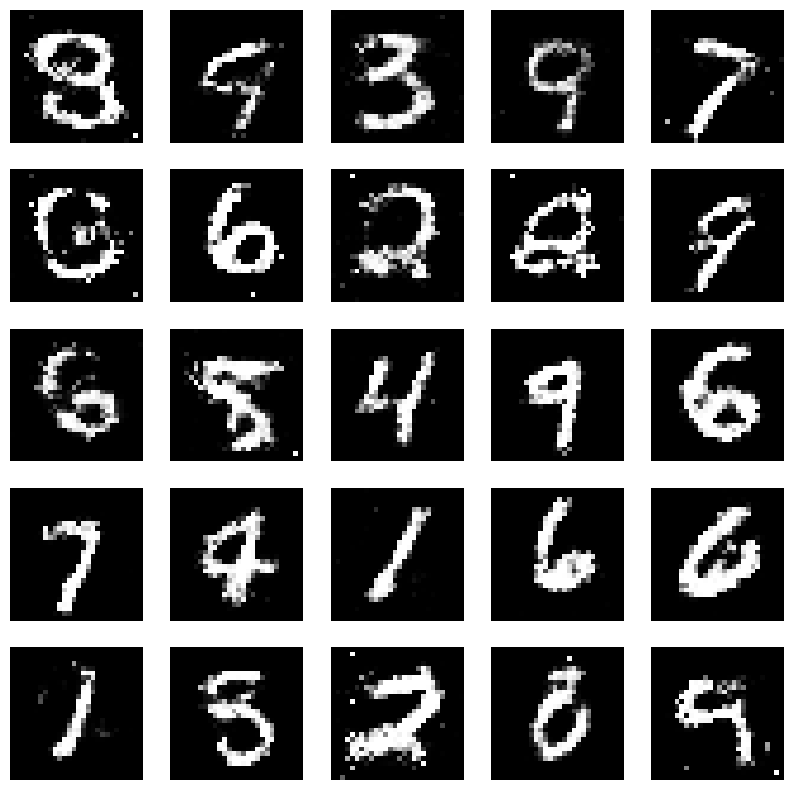

Epochs:  95


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:39,  2.74it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:42,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:46,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:44,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/273 [00:02<01:50,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 7/273 [00:02<01:53,  2.34it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 8/273 [00:03<02:04,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/273 [00:03<02:06,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<02:06,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 11/273 [00:04<02:05,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 12/273 [00:05<02:03,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 13/273 [00:05<02:03,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 14/273 [00:06<02:01,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 15/273 [00:06<02:03,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:07<01:56,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 17/273 [00:07<01:49,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:47,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:08<01:48,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:43,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:09<01:47,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 22/273 [00:09<01:42,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:37,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:10<01:34,  2.63it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 25/273 [00:10<01:42,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:11<01:39,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:35,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 10%|█         | 28/273 [00:11<01:37,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:12<01:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:32,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█▏        | 31/273 [00:13<01:31,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:35,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:33,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:35,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:36,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 13%|█▎        | 36/273 [00:15<01:31,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:28,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▍        | 38/273 [00:15<01:28,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:28,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:27,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:37,  2.38it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 42/273 [00:17<01:41,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 43/273 [00:18<01:46,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:48,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 45/273 [00:19<01:51,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 46/273 [00:19<01:53,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 17%|█▋        | 47/273 [00:20<01:51,  2.02it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 48/273 [00:20<01:51,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 49/273 [00:21<01:53,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 50/273 [00:21<01:47,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:46,  2.09it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 52/273 [00:22<01:41,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:34,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:23<01:31,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:23<01:31,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 56/273 [00:23<01:28,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:24<01:26,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:24<01:30,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:25<01:25,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:23,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:26,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:26<01:23,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:21,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 64/273 [00:27<01:21,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 24%|██▍       | 65/273 [00:27<01:21,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:18,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:28<01:16,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 25%|██▍       | 68/273 [00:28<01:20,  2.54it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:29<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 70/273 [00:29<01:19,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:29<01:20,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:30<01:18,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 73/273 [00:30<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:31<01:19,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:22,  2.40it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 76/273 [00:31<01:24,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 77/273 [00:32<01:26,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 78/273 [00:32<01:28,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:29,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 80/273 [00:33<01:30,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 81/273 [00:34<01:30,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 30%|███       | 82/273 [00:34<01:31,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 83/273 [00:35<01:37,  1.95it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 84/273 [00:35<01:40,  1.88it/s]

4/4 [==============================] - 0s 10ms/step


 31%|███       | 85/273 [00:36<01:30,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 86/273 [00:36<01:23,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:37<01:19,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:37<01:19,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:37<01:15,  2.43it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 90/273 [00:38<01:12,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 91/273 [00:38<01:10,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 34%|███▎      | 92/273 [00:39<01:11,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:39<01:10,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:39<01:08,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:40<01:05,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:40<01:07,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:40<01:10,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 36%|███▌      | 98/273 [00:41<01:07,  2.60it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 99/273 [00:41<01:08,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:42<01:10,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:42<01:06,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 102/273 [00:42<01:10,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:06,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:05,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:44<01:03,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:44<01:05,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:45<01:28,  1.89it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:45<01:23,  1.97it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:46<01:18,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 40%|████      | 110/273 [00:46<01:19,  2.05it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 111/273 [00:47<01:20,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████      | 112/273 [00:47<01:20,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:48<01:20,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 114/273 [00:48<01:22,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:49<01:22,  1.91it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 116/273 [00:49<01:19,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 117/273 [00:50<01:15,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:50<01:10,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:50<01:05,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:51<01:06,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:51<01:07,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:52<01:03,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:52<01:03,  2.37it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:53<01:01,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 46%|████▌     | 125/273 [00:53<01:01,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:53<00:59,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:54<00:59,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 128/273 [00:54<00:58,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 129/273 [00:55<00:57,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 130/273 [00:55<00:55,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 131/273 [00:55<00:55,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:56<00:53,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▊     | 133/273 [00:56<00:54,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▉     | 134/273 [00:57<00:56,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 135/273 [00:57<00:54,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 50%|████▉     | 136/273 [00:57<00:52,  2.61it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 137/273 [00:58<00:54,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 138/273 [00:58<00:52,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:58<00:51,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:59<00:52,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:59<00:51,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 52%|█████▏    | 142/273 [01:00<00:52,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [01:00<00:54,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 144/273 [01:01<00:57,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:01<00:57,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:02<00:59,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 147/273 [01:02<01:00,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 54%|█████▍    | 148/273 [01:03<00:58,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:03<00:59,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 150/273 [01:04<00:59,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:04<00:55,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:04<00:50,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▌    | 153/273 [01:05<00:49,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:05<00:46,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:05<00:46,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:06<00:47,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:44,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:07<00:46,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:07<00:44,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 160/273 [01:07<00:45,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 59%|█████▉    | 161/273 [01:08<00:43,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 162/273 [01:08<00:41,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:09<00:42,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:09<00:41,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:09<00:40,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:10<00:40,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 167/273 [01:10<00:40,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:41,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 169/273 [01:11<00:41,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:11<00:43,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:12<00:44,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:43,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 173/273 [01:13<00:40,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▎   | 174/273 [01:13<00:38,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:13<00:38,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:14<00:39,  2.44it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 177/273 [01:14<00:44,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 178/273 [01:15<00:43,  2.16it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 179/273 [01:15<00:45,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 180/273 [01:16<00:45,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▋   | 181/273 [01:16<00:45,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 182/273 [01:17<00:44,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 183/273 [01:17<00:42,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 67%|██████▋   | 184/273 [01:18<00:42,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:18<00:41,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:19<00:37,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:19<00:36,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:19<00:34,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:20<00:32,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:20<00:31,  2.62it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 191/273 [01:20<00:32,  2.54it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:21<00:30,  2.65it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:21<00:30,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 194/273 [01:22<00:28,  2.72it/s]

4/4 [==============================] - 0s 9ms/step


 71%|███████▏  | 195/273 [01:22<00:29,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:23<00:28,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:23<00:28,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 199/273 [01:24<00:29,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:24<00:27,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:24<00:27,  2.63it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 202/273 [01:25<00:27,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 203/273 [01:25<00:26,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▍  | 204/273 [01:25<00:26,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:26<00:26,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:26<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:27<00:25,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:27<00:27,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:28<00:23,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 211/273 [01:28<00:22,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 212/273 [01:29<00:24,  2.44it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 213/273 [01:29<00:27,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 214/273 [01:30<00:29,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:30<00:27,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 216/273 [01:31<00:27,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 217/273 [01:31<00:26,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 218/273 [01:32<00:27,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 219/273 [01:32<00:27,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 220/273 [01:33<00:25,  2.12it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:33<00:23,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████▏ | 222/273 [01:33<00:22,  2.23it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:34<00:21,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:34<00:22,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 225/273 [01:35<00:20,  2.36it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 226/273 [01:35<00:19,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:36<00:19,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:36<00:18,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:36<00:18,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:37<00:18,  2.38it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 231/273 [01:37<00:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 232/273 [01:37<00:15,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:38<00:15,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:38<00:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:39<00:14,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▋ | 236/273 [01:39<00:14,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 237/273 [01:39<00:13,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 87%|████████▋ | 238/273 [01:40<00:13,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 88%|████████▊ | 239/273 [01:40<00:13,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:41<00:12,  2.56it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 241/273 [01:41<00:13,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:41<00:12,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 89%|████████▉ | 243/273 [01:42<00:12,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:42<00:11,  2.47it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:43<00:11,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:11,  2.40it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 247/273 [01:44<00:11,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 248/273 [01:44<00:11,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 91%|█████████ | 249/273 [01:45<00:11,  2.17it/s]

4/4 [==============================] - 0s 9ms/step


 92%|█████████▏| 250/273 [01:45<00:10,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 251/273 [01:46<00:10,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 252/273 [01:46<00:10,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 253/273 [01:47<00:09,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 254/273 [01:47<00:08,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:47<00:07,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:48<00:06,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 94%|█████████▍| 257/273 [01:48<00:06,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:48<00:06,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:49<00:05,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:49<00:04,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:50<00:04,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 96%|█████████▌| 262/273 [01:50<00:04,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:50<00:04,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 264/273 [01:51<00:03,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:51<00:03,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 266/273 [01:52<00:02,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 98%|█████████▊| 267/273 [01:52<00:02,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 98%|█████████▊| 268/273 [01:52<00:01,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:53<00:01,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 99%|█████████▉| 270/273 [01:53<00:01,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:54<00:00,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:54<00:00,  2.38it/s]


Perdidas:  0.6775585412979126 , 0.7328950762748718
1/1 [==============================] - 0s 29ms/step


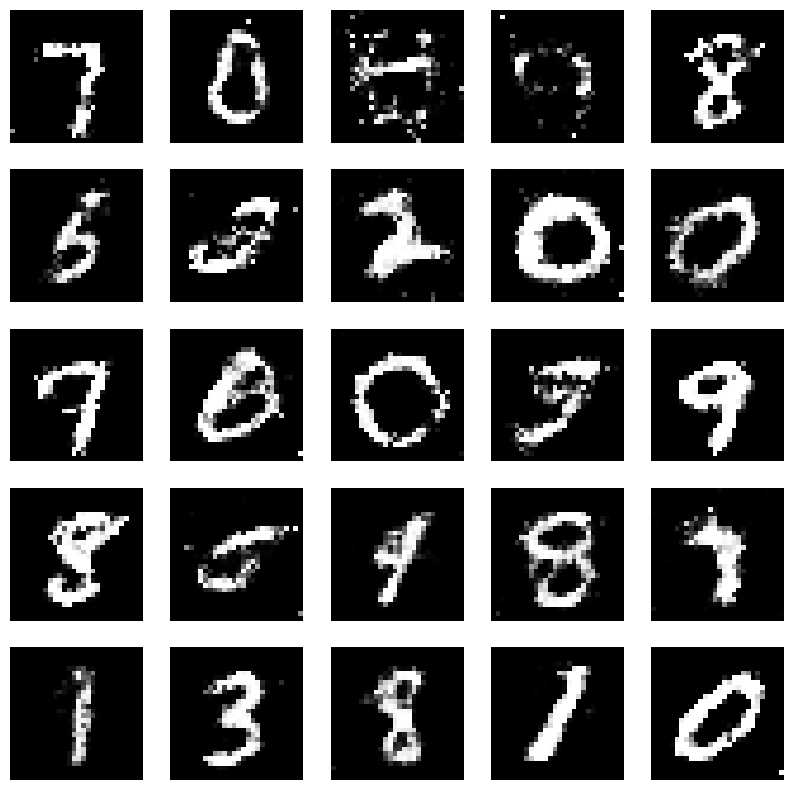

Epochs:  96


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/273 [00:00<02:02,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/273 [00:00<02:13,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/273 [00:01<02:15,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 4/273 [00:02<02:16,  1.97it/s]

4/4 [==============================] - 0s 9ms/step


  2%|▏         | 5/273 [00:02<02:12,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/273 [00:02<02:09,  2.05it/s]

4/4 [==============================] - 0s 9ms/step


  3%|▎         | 7/273 [00:03<02:07,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 8/273 [00:03<02:03,  2.15it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:04<01:52,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:04<01:48,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:47,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:05<01:44,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:05<01:40,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 14/273 [00:06<01:35,  2.71it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 15/273 [00:06<01:41,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:07<01:38,  2.60it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:41,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 19/273 [00:08<01:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 20/273 [00:08<01:33,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 21/273 [00:08<01:34,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:09<01:44,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 24/273 [00:09<01:35,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:10<01:36,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 10%|▉         | 26/273 [00:10<01:40,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 10%|▉         | 27/273 [00:11<01:37,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:39,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 29/273 [00:11<01:36,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 30/273 [00:12<01:36,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█▏        | 31/273 [00:12<01:34,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 32/273 [00:13<01:36,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 33/273 [00:13<01:32,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:33,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:37,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 36/273 [00:14<01:44,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:49,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:15<01:51,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 14%|█▍        | 39/273 [00:16<01:51,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 40/273 [00:16<01:50,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 41/273 [00:17<01:48,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▌        | 42/273 [00:17<01:49,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 43/273 [00:18<01:44,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 16%|█▌        | 44/273 [00:18<01:37,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:19<01:40,  2.28it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:33,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 17%|█▋        | 47/273 [00:19<01:30,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 48/273 [00:20<01:30,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:20<01:25,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 19%|█▊        | 51/273 [00:21<01:26,  2.56it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:29,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:22<01:30,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:28,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:23<01:24,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 57/273 [00:23<01:27,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 58/273 [00:24<01:29,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:38,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 60/273 [00:25<01:29,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:25<01:31,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 23%|██▎       | 62/273 [00:25<01:26,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:26<01:23,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 64/273 [00:26<01:19,  2.62it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:27<01:21,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:23,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▍       | 67/273 [00:27<01:21,  2.52it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:28<01:26,  2.38it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 69/273 [00:28<01:29,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 70/273 [00:29<01:33,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 71/273 [00:29<01:33,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:30<01:34,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 73/273 [00:30<01:32,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 74/273 [00:31<01:35,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 75/273 [00:31<01:35,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 28%|██▊       | 76/273 [00:32<01:32,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:32<01:31,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:33<01:28,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:33<01:22,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:33<01:18,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:34<01:20,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 82/273 [00:34<01:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:14,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:35<01:13,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:35<01:12,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 86/273 [00:36<01:14,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 87/273 [00:36<01:13,  2.54it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 88/273 [00:36<01:15,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 89/273 [00:37<01:14,  2.46it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 90/273 [00:37<01:12,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:38<01:13,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▎      | 92/273 [00:38<01:15,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:10,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▍      | 94/273 [00:39<01:13,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 35%|███▍      | 95/273 [00:39<01:13,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 35%|███▌      | 96/273 [00:40<01:14,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:12,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:41<01:14,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:14,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 100/273 [00:41<01:13,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 37%|███▋      | 101/273 [00:42<01:08,  2.53it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 102/273 [00:42<01:07,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:43<01:11,  2.39it/s]

4/4 [==============================] - 0s 9ms/step


 38%|███▊      | 104/273 [00:43<01:17,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 105/273 [00:44<01:20,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 106/273 [00:44<01:22,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 107/273 [00:45<01:21,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:45<01:20,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:46<01:20,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 40%|████      | 110/273 [00:46<01:18,  2.08it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:47<01:13,  2.21it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 112/273 [00:47<01:11,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:47<01:08,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:48<01:04,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:48<01:01,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 116/273 [00:48<01:02,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:49<01:01,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:49<00:58,  2.64it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 119/273 [00:50<00:59,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▍     | 120/273 [00:50<00:58,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:50<00:56,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▍     | 122/273 [00:51<00:56,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 123/273 [00:51<00:57,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:52<00:58,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:52<00:58,  2.51it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 126/273 [00:52<00:59,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 47%|████▋     | 127/273 [00:53<00:57,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 128/273 [00:53<00:57,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 129/273 [00:54<00:58,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<00:56,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 48%|████▊     | 131/273 [00:54<00:53,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:56,  2.50it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▊     | 133/273 [00:55<00:56,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:54,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:52,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<00:51,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 137/273 [00:57<00:52,  2.59it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 138/273 [00:57<00:58,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 139/273 [00:58<01:00,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 140/273 [00:58<01:01,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 141/273 [00:59<01:01,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 142/273 [00:59<01:00,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 143/273 [01:00<01:00,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 144/273 [01:00<01:02,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [01:00<00:59,  2.16it/s]

4/4 [==============================] - 0s 9ms/step


 53%|█████▎    | 146/273 [01:01<00:59,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 147/273 [01:01<00:57,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 54%|█████▍    | 148/273 [01:02<00:54,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▍    | 149/273 [01:02<00:52,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 150/273 [01:03<00:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:03<00:49,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 152/273 [01:04<00:55,  2.19it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:04<00:51,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▋    | 154/273 [01:04<00:51,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 57%|█████▋    | 155/273 [01:05<00:50,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:05<00:48,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:06<00:48,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:06<00:46,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 159/273 [01:06<00:45,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:07<00:44,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:07<00:45,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:44,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 60%|█████▉    | 163/273 [01:08<00:43,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:08<00:43,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:09<00:41,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 61%|██████    | 166/273 [01:09<00:39,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 167/273 [01:09<00:39,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 168/273 [01:10<00:41,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 62%|██████▏   | 169/273 [01:10<00:42,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 170/273 [01:11<00:40,  2.54it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 171/273 [01:11<00:43,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:12<00:44,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 173/273 [01:12<00:45,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 174/273 [01:13<00:45,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 175/273 [01:13<00:45,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 64%|██████▍   | 176/273 [01:14<00:46,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:14<00:45,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 178/273 [01:14<00:44,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 179/273 [01:15<00:43,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:15<00:39,  2.35it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 181/273 [01:16<00:40,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:16<00:37,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 183/273 [01:16<00:35,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:17<00:36,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:17<00:35,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:18<00:34,  2.54it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 187/273 [01:18<00:34,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:32,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:19<00:32,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 70%|██████▉   | 190/273 [01:19<00:31,  2.65it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 191/273 [01:20<00:31,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 70%|███████   | 192/273 [01:20<00:32,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:20<00:30,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:21<00:29,  2.67it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 195/273 [01:21<00:30,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 196/273 [01:22<00:31,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 72%|███████▏  | 197/273 [01:22<00:31,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 198/273 [01:22<00:29,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:23<00:28,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:27,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:28,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▍  | 202/273 [01:24<00:27,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 203/273 [01:24<00:26,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▍  | 204/273 [01:25<00:26,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:25<00:27,  2.49it/s]

4/4 [==============================] - 0s 9ms/step


 75%|███████▌  | 206/273 [01:26<00:28,  2.35it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 207/273 [01:26<00:29,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 208/273 [01:27<00:30,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 77%|███████▋  | 209/273 [01:27<00:29,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 77%|███████▋  | 210/273 [01:27<00:28,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 211/273 [01:28<00:28,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 212/273 [01:28<00:29,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 213/273 [01:29<00:29,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 78%|███████▊  | 214/273 [01:29<00:27,  2.11it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:30<00:25,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 79%|███████▉  | 216/273 [01:30<00:24,  2.36it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:31<00:24,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:31<00:22,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:31<00:21,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████  | 220/273 [01:32<00:20,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 221/273 [01:32<00:20,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:33<00:18,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:33<00:19,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:34<00:18,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 226/273 [01:34<00:18,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 83%|████████▎ | 227/273 [01:34<00:18,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▎ | 228/273 [01:35<00:18,  2.45it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:35<00:17,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 230/273 [01:36<00:17,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:36<00:17,  2.44it/s]

4/4 [==============================] - 0s 6ms/step


 85%|████████▍ | 232/273 [01:36<00:16,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▌ | 233/273 [01:37<00:15,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:37<00:15,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 235/273 [01:38<00:15,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:38<00:14,  2.55it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:38<00:14,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 87%|████████▋ | 238/273 [01:39<00:14,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:13,  2.55it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 240/273 [01:40<00:13,  2.40it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 242/273 [01:41<00:14,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:41<00:13,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 244/273 [01:42<00:13,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 90%|████████▉ | 245/273 [01:42<00:13,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:43<00:12,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 247/273 [01:43<00:13,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 248/273 [01:44<00:12,  1.97it/s]

4/4 [==============================] - 0s 8ms/step


 91%|█████████ | 249/273 [01:44<00:11,  2.07it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:44<00:10,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:45<00:09,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:45<00:08,  2.51it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 253/273 [01:46<00:07,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 254/273 [01:46<00:07,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:46<00:06,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:47<00:06,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:47<00:06,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:47<00:05,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:48<00:05,  2.66it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▌| 260/273 [01:48<00:05,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:49<00:04,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 262/273 [01:49<00:04,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:49<00:03,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 264/273 [01:50<00:03,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 97%|█████████▋| 265/273 [01:50<00:03,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:51<00:02,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:51<00:02,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 268/273 [01:51<00:01,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▊| 269/273 [01:52<00:01,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 99%|█████████▉| 271/273 [01:53<00:00,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:53<00:00,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


100%|██████████| 273/273 [01:53<00:00,  2.40it/s]


Perdidas:  0.7098352909088135 , 0.727524995803833
1/1 [==============================] - 0s 36ms/step


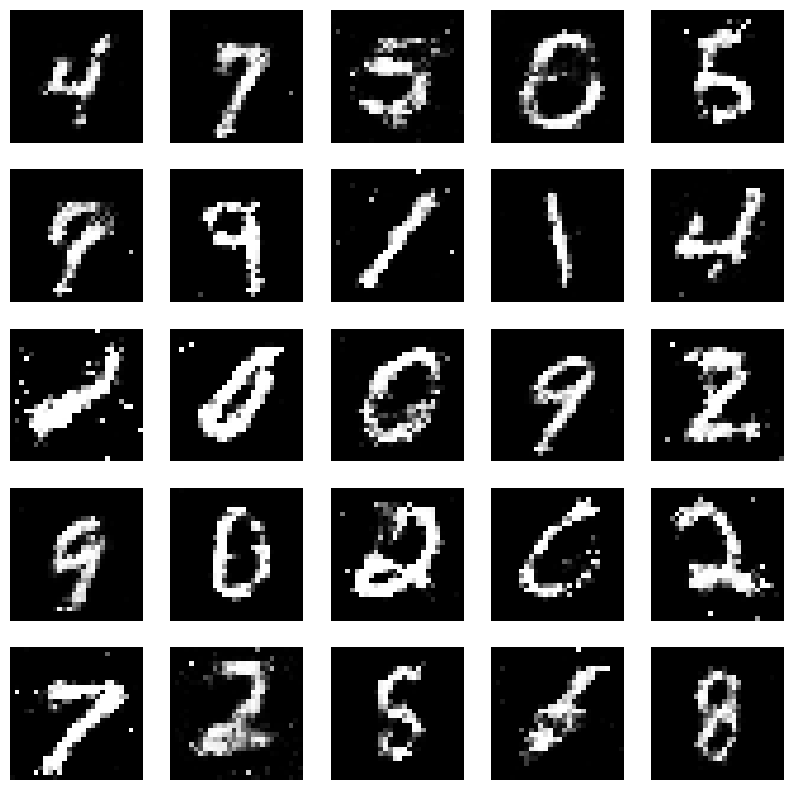

Epochs:  97


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:37,  2.80it/s]

4/4 [==============================] - 0s 8ms/step


  1%|          | 2/273 [00:00<01:41,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:47,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 5/273 [00:02<01:51,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 6/273 [00:02<01:54,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:55,  2.31it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:48,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:44,  2.52it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 10/273 [00:04<01:44,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 12/273 [00:04<01:39,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:37,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:36,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


  5%|▌         | 15/273 [00:05<01:41,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


  6%|▌         | 16/273 [00:06<01:41,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


  6%|▌         | 17/273 [00:06<01:39,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:07<01:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 19/273 [00:07<01:38,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 20/273 [00:07<01:41,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 21/273 [00:08<01:37,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


  8%|▊         | 22/273 [00:08<01:40,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


  8%|▊         | 23/273 [00:09<01:42,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 24/273 [00:09<01:39,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


  9%|▉         | 25/273 [00:09<01:44,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 26/273 [00:10<01:52,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 27/273 [00:11<01:58,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 28/273 [00:11<01:57,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█         | 29/273 [00:12<01:58,  2.06it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 30/273 [00:12<01:57,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 11%|█▏        | 31/273 [00:12<01:55,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 32/273 [00:13<01:54,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 12%|█▏        | 33/273 [00:13<01:56,  2.06it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:14<01:51,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 35/273 [00:14<01:45,  2.26it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:15<01:41,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▎        | 37/273 [00:15<01:35,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 38/273 [00:15<01:37,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 39/273 [00:16<01:36,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 15%|█▍        | 40/273 [00:16<01:31,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 15%|█▌        | 42/273 [00:17<01:34,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 43/273 [00:18<01:42,  2.24it/s]

4/4 [==============================] - 0s 7ms/step


 16%|█▌        | 44/273 [00:18<01:36,  2.37it/s]

4/4 [==============================] - 0s 9ms/step


 16%|█▋        | 45/273 [00:18<01:37,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:19<01:32,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:19<01:30,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:20<01:32,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 18%|█▊        | 49/273 [00:20<01:28,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:24,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:21<01:23,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 52/273 [00:21<01:25,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:24,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:22<01:22,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 55/273 [00:22<01:21,  2.68it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 56/273 [00:23<01:25,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 21%|██        | 57/273 [00:23<01:21,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 58/273 [00:23<01:20,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 59/273 [00:24<01:19,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 60/273 [00:24<01:22,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 22%|██▏       | 61/273 [00:24<01:24,  2.49it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:30,  2.32it/s]

4/4 [==============================] - 0s 8ms/step


 23%|██▎       | 63/273 [00:25<01:31,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 23%|██▎       | 64/273 [00:26<01:33,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 65/273 [00:26<01:33,  2.23it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 66/273 [00:27<01:35,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 67/273 [00:27<01:36,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 68/273 [00:28<01:35,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▌       | 69/273 [00:28<01:29,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:29<01:23,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 26%|██▌       | 71/273 [00:29<01:21,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▋       | 72/273 [00:29<01:19,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:30<01:22,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:30<01:22,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:31<01:19,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 76/273 [00:31<01:17,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:32<01:19,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 79/273 [00:32<01:20,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:33<01:17,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:33<01:17,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:16,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 30%|███       | 83/273 [00:34<01:13,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:34<01:11,  2.63it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 85/273 [00:34<01:14,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:35<01:12,  2.57it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 87/273 [00:35<01:11,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:36<01:14,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 33%|███▎      | 89/273 [00:36<01:10,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 90/273 [00:36<01:08,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 33%|███▎      | 91/273 [00:37<01:07,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 34%|███▎      | 92/273 [00:37<01:10,  2.55it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 93/273 [00:38<01:08,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:38<01:05,  2.73it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 95/273 [00:38<01:08,  2.59it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 96/273 [00:39<01:15,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▌      | 97/273 [00:39<01:17,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 98/273 [00:40<01:22,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 36%|███▋      | 99/273 [00:40<01:21,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 100/273 [00:41<01:22,  2.11it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 101/273 [00:41<01:22,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 102/273 [00:42<01:23,  2.05it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 103/273 [00:42<01:22,  2.05it/s]

4/4 [==============================] - 0s 6ms/step


 38%|███▊      | 104/273 [00:43<01:16,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 105/273 [00:43<01:15,  2.22it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 106/273 [00:43<01:10,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 39%|███▉      | 107/273 [00:44<01:10,  2.35it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 108/273 [00:44<01:06,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 40%|███▉      | 109/273 [00:45<01:04,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 40%|████      | 110/273 [00:45<01:03,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:45<01:00,  2.68it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 112/273 [00:46<01:01,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:05,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 42%|████▏     | 114/273 [00:47<01:02,  2.53it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 115/273 [00:47<01:02,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:01,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<00:59,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 118/273 [00:48<00:59,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<00:59,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:49<00:57,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:49<00:56,  2.70it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 122/273 [00:50<00:59,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 45%|████▌     | 123/273 [00:50<00:57,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 124/273 [00:50<00:59,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 125/273 [00:51<01:01,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 46%|████▌     | 126/273 [00:51<00:57,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 47%|████▋     | 127/273 [00:52<00:56,  2.56it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 128/273 [00:52<00:55,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 129/273 [00:52<01:00,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:53<01:03,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 131/273 [00:53<01:06,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 132/273 [00:54<01:10,  2.01it/s]

4/4 [==============================] - 0s 9ms/step


 49%|████▊     | 133/273 [00:55<01:09,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 134/273 [00:55<01:06,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:56<01:08,  2.01it/s]

4/4 [==============================] - 0s 8ms/step


 50%|████▉     | 136/273 [00:56<01:06,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 137/273 [00:56<01:07,  2.03it/s]

4/4 [==============================] - 0s 9ms/step


 51%|█████     | 138/273 [00:57<01:01,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:57,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:58<00:57,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 141/273 [00:58<00:58,  2.26it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:59<00:55,  2.35it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:53,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 144/273 [00:59<00:55,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [01:00<00:52,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:50,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:01<00:51,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:49,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▍    | 149/273 [01:01<00:48,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:02<00:46,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 55%|█████▌    | 151/273 [01:02<00:49,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:48,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 153/273 [01:03<00:46,  2.56it/s]

4/4 [==============================] - 0s 9ms/step


 56%|█████▋    | 154/273 [01:03<00:48,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:04<00:48,  2.42it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 156/273 [01:04<00:47,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:05<00:46,  2.47it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 158/273 [01:05<00:46,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 58%|█████▊    | 159/273 [01:05<00:44,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▊    | 160/273 [01:06<00:43,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 59%|█████▉    | 161/273 [01:06<00:45,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:06<00:43,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:07<00:46,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 164/273 [01:07<00:46,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 165/273 [01:08<00:46,  2.30it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 166/273 [01:08<00:49,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 167/273 [01:09<00:47,  2.22it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 168/273 [01:09<00:48,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 169/273 [01:10<00:48,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:10<00:47,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 171/273 [01:11<00:48,  2.09it/s]

4/4 [==============================] - 0s 6ms/step


 63%|██████▎   | 172/273 [01:11<00:44,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:12<00:46,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:42,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:39,  2.49it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 176/273 [01:13<00:39,  2.44it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 177/273 [01:13<00:41,  2.33it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▌   | 178/273 [01:14<00:40,  2.33it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▌   | 179/273 [01:14<00:39,  2.40it/s]

4/4 [==============================] - 0s 9ms/step


 66%|██████▌   | 180/273 [01:14<00:38,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:15<00:36,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:36,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:16<00:36,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:34,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:17<00:33,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 187/273 [01:17<00:35,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:18<00:34,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 69%|██████▉   | 189/273 [01:18<00:32,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 191/273 [01:19<00:32,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 71%|███████   | 193/273 [01:19<00:30,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:20<00:31,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████▏  | 195/273 [01:20<00:29,  2.60it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 196/273 [01:21<00:31,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 72%|███████▏  | 197/273 [01:21<00:31,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 198/273 [01:22<00:35,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 199/273 [01:22<00:35,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:23<00:34,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 74%|███████▎  | 201/273 [01:23<00:33,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 202/273 [01:24<00:33,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:24<00:34,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 204/273 [01:25<00:34,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 205/273 [01:25<00:31,  2.13it/s]

4/4 [==============================] - 0s 6ms/step


 75%|███████▌  | 206/273 [01:25<00:30,  2.21it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:26<00:27,  2.38it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:26<00:25,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:27<00:25,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:27<00:25,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 212/273 [01:28<00:23,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:28<00:22,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 215/273 [01:29<00:21,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 216/273 [01:29<00:22,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 217/273 [01:30<00:21,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:31<00:19,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:31<00:20,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:32<00:19,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.64it/s]

4/4 [==============================] - 0s 8ms/step


 82%|████████▏ | 225/273 [01:33<00:18,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:18,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 83%|████████▎ | 227/273 [01:33<00:17,  2.64it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 228/273 [01:34<00:16,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▍ | 229/273 [01:34<00:16,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 230/273 [01:35<00:16,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 85%|████████▍ | 231/273 [01:35<00:15,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:35<00:15,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 233/273 [01:36<00:16,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▌ | 234/273 [01:36<00:16,  2.38it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 235/273 [01:37<00:16,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 236/273 [01:37<00:16,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 237/273 [01:38<00:16,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 238/273 [01:38<00:16,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 239/273 [01:39<00:16,  2.06it/s]

4/4 [==============================] - 0s 9ms/step


 88%|████████▊ | 240/273 [01:39<00:15,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 241/273 [01:40<00:14,  2.20it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.32it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 90%|████████▉ | 245/273 [01:41<00:10,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:10,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:08,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:43<00:08,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 252/273 [01:44<00:07,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 93%|█████████▎| 253/273 [01:44<00:07,  2.74it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 257/273 [01:46<00:05,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.76it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.75it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:47<00:04,  2.77it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:47<00:04,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.65it/s]

4/4 [==============================] - 0s 8ms/step


 97%|█████████▋| 264/273 [01:48<00:03,  2.69it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 266/273 [01:49<00:02,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 98%|█████████▊| 267/273 [01:49<00:02,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.46it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 269/273 [01:50<00:01,  2.28it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.68048095703125 , 0.7266318798065186
1/1 [==============================] - 0s 64ms/step


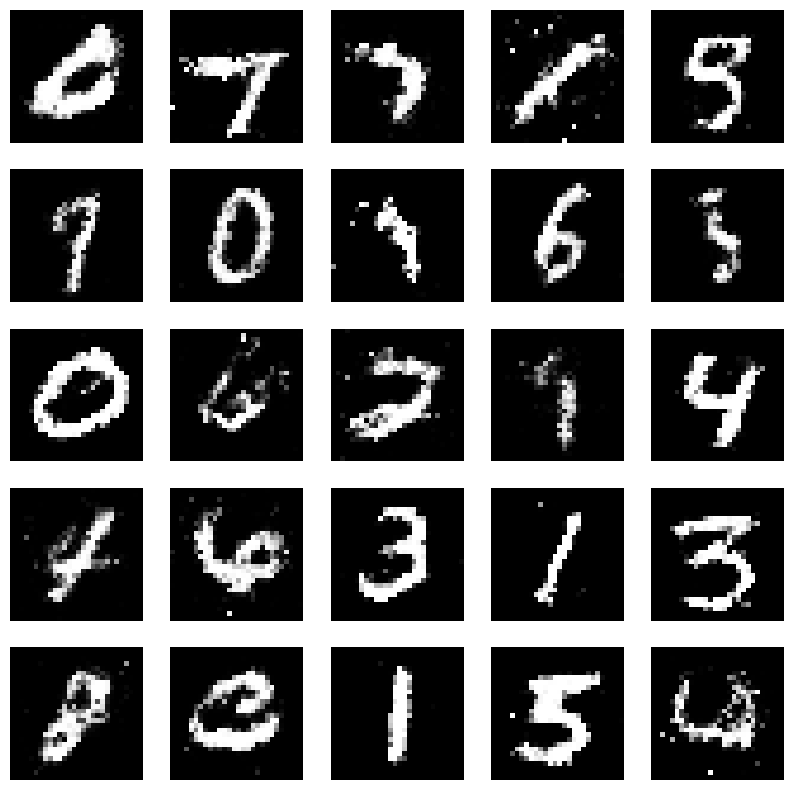

Epochs:  98


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:41,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


  1%|          | 2/273 [00:00<01:42,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


  1%|          | 3/273 [00:01<01:48,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


  1%|▏         | 4/273 [00:01<01:42,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  2%|▏         | 5/273 [00:01<01:38,  2.73it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 6/273 [00:02<01:42,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:41,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 8/273 [00:03<01:41,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  3%|▎         | 9/273 [00:03<01:45,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▎         | 10/273 [00:03<01:42,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


  4%|▍         | 11/273 [00:04<01:41,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 12/273 [00:04<01:42,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▍         | 13/273 [00:05<01:42,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:37,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:38,  2.63it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 16/273 [00:06<01:39,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


  6%|▌         | 17/273 [00:06<01:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


  7%|▋         | 18/273 [00:06<01:34,  2.70it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 19/273 [00:07<01:37,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


  7%|▋         | 20/273 [00:07<01:34,  2.67it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 21/273 [00:08<01:40,  2.50it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 22/273 [00:08<01:51,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


  8%|▊         | 23/273 [00:09<01:52,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 24/273 [00:09<01:58,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


  9%|▉         | 25/273 [00:10<01:59,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 26/273 [00:10<02:04,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 27/273 [00:11<01:58,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:58,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 29/273 [00:12<01:52,  2.18it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 30/273 [00:12<01:45,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 31/273 [00:12<01:45,  2.29it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:39,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 12%|█▏        | 34/273 [00:13<01:32,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:14<01:30,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 13%|█▎        | 36/273 [00:14<01:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:33,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 14%|█▍        | 38/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 39/273 [00:15<01:30,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▍        | 40/273 [00:16<01:29,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 15%|█▌        | 41/273 [00:16<01:26,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:16<01:25,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:24,  2.71it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:17<01:23,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:17<01:21,  2.81it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 46/273 [00:18<01:21,  2.78it/s]

4/4 [==============================] - 0s 7ms/step


 17%|█▋        | 47/273 [00:18<01:23,  2.72it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 48/273 [00:19<01:26,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 49/273 [00:19<01:27,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:19<01:24,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 19%|█▊        | 51/273 [00:20<01:26,  2.57it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 52/273 [00:20<01:22,  2.66it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 53/273 [00:21<01:25,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 20%|█▉        | 54/273 [00:21<01:26,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 20%|██        | 55/273 [00:21<01:24,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 21%|██        | 56/273 [00:22<01:25,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:22<01:27,  2.47it/s]

4/4 [==============================] - 0s 8ms/step


 21%|██        | 58/273 [00:23<01:32,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 59/273 [00:23<01:45,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 60/273 [00:24<01:42,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 61/273 [00:24<01:39,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:38,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 63/273 [00:25<01:37,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 64/273 [00:26<01:38,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 24%|██▍       | 65/273 [00:26<01:38,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 66/273 [00:27<01:31,  2.26it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 67/273 [00:27<01:25,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 25%|██▍       | 68/273 [00:27<01:20,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 25%|██▌       | 69/273 [00:28<01:20,  2.52it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 70/273 [00:28<01:18,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 26%|██▌       | 71/273 [00:28<01:15,  2.66it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 72/273 [00:29<01:18,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 73/273 [00:29<01:16,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 74/273 [00:29<01:14,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 27%|██▋       | 75/273 [00:30<01:12,  2.71it/s]

4/4 [==============================] - 0s 9ms/step


 28%|██▊       | 76/273 [00:30<01:17,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 28%|██▊       | 77/273 [00:31<01:14,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▊       | 78/273 [00:31<01:14,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 79/273 [00:31<01:12,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▉       | 80/273 [00:32<01:16,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 30%|██▉       | 81/273 [00:32<01:15,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:13,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:33<01:14,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 84/273 [00:33<01:13,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 31%|███       | 85/273 [00:34<01:12,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 32%|███▏      | 86/273 [00:34<01:09,  2.69it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:34<01:09,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 32%|███▏      | 88/273 [00:35<01:08,  2.69it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 89/273 [00:35<01:09,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 90/273 [00:36<01:11,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 33%|███▎      | 91/273 [00:36<01:08,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 34%|███▎      | 92/273 [00:36<01:09,  2.60it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 93/273 [00:37<01:14,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 94/273 [00:37<01:15,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 95/273 [00:38<01:19,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 96/273 [00:38<01:18,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 97/273 [00:39<01:21,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 98/273 [00:39<01:21,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▋      | 99/273 [00:40<01:21,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 37%|███▋      | 100/273 [00:40<01:23,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:41<01:20,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:41<01:15,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 103/273 [00:41<01:11,  2.39it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 104/273 [00:42<01:10,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 105/273 [00:42<01:06,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:04,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:43<01:08,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 108/273 [00:43<01:05,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:02,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:44<01:01,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 111/273 [00:44<01:03,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:45<01:02,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 41%|████▏     | 113/273 [00:45<00:59,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 114/273 [00:46<00:58,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 42%|████▏     | 115/273 [00:46<01:01,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 116/273 [00:46<00:58,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 117/273 [00:47<00:58,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 43%|████▎     | 118/273 [00:47<00:58,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 44%|████▎     | 119/273 [00:48<01:02,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▍     | 120/273 [00:48<00:59,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 121/273 [00:48<00:59,  2.54it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:49<01:10,  2.13it/s]

4/4 [==============================] - 0s 7ms/step


 45%|████▌     | 123/273 [00:49<01:05,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 45%|████▌     | 124/273 [00:50<01:02,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 125/273 [00:50<01:01,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 46%|████▌     | 126/273 [00:50<00:59,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 127/273 [00:51<01:02,  2.34it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:51<01:06,  2.18it/s]

4/4 [==============================] - 0s 8ms/step


 47%|████▋     | 129/273 [00:52<01:07,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 130/273 [00:52<01:04,  2.23it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:53<01:05,  2.16it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 132/273 [00:53<01:05,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 133/273 [00:54<01:04,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 134/273 [00:54<01:05,  2.13it/s]

4/4 [==============================] - 0s 8ms/step


 49%|████▉     | 135/273 [00:55<01:07,  2.05it/s]

4/4 [==============================] - 0s 6ms/step


 50%|████▉     | 136/273 [00:55<01:03,  2.16it/s]

4/4 [==============================] - 0s 6ms/step


 50%|█████     | 137/273 [00:56<01:20,  1.69it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:56<01:11,  1.89it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████     | 139/273 [00:57<01:04,  2.08it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████▏    | 140/273 [00:57<01:00,  2.18it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:57,  2.30it/s]

4/4 [==============================] - 0s 9ms/step


 52%|█████▏    | 142/273 [00:58<00:54,  2.39it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 143/273 [00:58<00:54,  2.37it/s]

4/4 [==============================] - 0s 6ms/step


 53%|█████▎    | 144/273 [00:59<00:55,  2.31it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 145/273 [00:59<00:54,  2.36it/s]

4/4 [==============================] - 0s 8ms/step


 53%|█████▎    | 146/273 [01:00<00:54,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 147/273 [01:00<00:52,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:50,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 149/273 [01:01<00:50,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▍    | 150/273 [01:01<00:49,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 55%|█████▌    | 151/273 [01:02<00:48,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 56%|█████▌    | 152/273 [01:02<00:46,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:47,  2.50it/s]

4/4 [==============================] - 0s 6ms/step


 56%|█████▋    | 154/273 [01:03<00:45,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 57%|█████▋    | 155/273 [01:03<00:48,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 156/273 [01:04<00:47,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 157/273 [01:04<00:45,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 58%|█████▊    | 158/273 [01:04<00:43,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 159/273 [01:05<00:45,  2.51it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 160/273 [01:05<00:47,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 161/273 [01:06<00:50,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 162/273 [01:06<00:50,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 163/273 [01:07<00:53,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 164/273 [01:07<00:55,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 165/273 [01:08<00:54,  1.99it/s]

4/4 [==============================] - 0s 8ms/step


 61%|██████    | 166/273 [01:08<00:51,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 167/273 [01:09<00:53,  1.99it/s]

4/4 [==============================] - 0s 10ms/step


 62%|██████▏   | 168/273 [01:09<00:52,  2.01it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [01:10<00:48,  2.16it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 170/273 [01:10<00:44,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 171/273 [01:11<00:41,  2.46it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 172/273 [01:11<00:40,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:37,  2.61it/s]

4/4 [==============================] - 0s 8ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:37,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 65%|██████▍   | 177/273 [01:13<00:36,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 65%|██████▌   | 178/273 [01:13<00:36,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:14<00:36,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 180/273 [01:14<00:35,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 66%|██████▋   | 181/273 [01:14<00:35,  2.62it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 182/273 [01:15<00:34,  2.63it/s]

4/4 [==============================] - 0s 8ms/step


 67%|██████▋   | 183/273 [01:15<00:36,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 184/273 [01:16<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 185/273 [01:16<00:35,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 186/273 [01:16<00:35,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:33,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 188/273 [01:17<00:34,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:32,  2.57it/s]

4/4 [==============================] - 0s 10ms/step


 70%|██████▉   | 190/273 [01:18<00:31,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 70%|██████▉   | 191/273 [01:18<00:30,  2.66it/s]

4/4 [==============================] - 0s 9ms/step


 70%|███████   | 192/273 [01:19<00:30,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 193/273 [01:19<00:29,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 71%|███████   | 194/273 [01:19<00:30,  2.59it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 195/273 [01:20<00:32,  2.38it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 196/273 [01:20<00:33,  2.32it/s]

4/4 [==============================] - 0s 9ms/step


 72%|███████▏  | 197/273 [01:21<00:32,  2.32it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 198/273 [01:21<00:33,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


 73%|███████▎  | 199/273 [01:22<00:33,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 73%|███████▎  | 200/273 [01:22<00:36,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 201/273 [01:23<00:35,  2.04it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▍  | 202/273 [01:23<00:33,  2.10it/s]

4/4 [==============================] - 0s 9ms/step


 74%|███████▍  | 203/273 [01:24<00:31,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 204/273 [01:24<00:30,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:29,  2.27it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:28,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:25<00:27,  2.39it/s]

4/4 [==============================] - 0s 6ms/step


 76%|███████▌  | 208/273 [01:26<00:27,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:26<00:26,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 210/273 [01:26<00:25,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:24,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 212/273 [01:27<00:23,  2.58it/s]

4/4 [==============================] - 0s 6ms/step


 78%|███████▊  | 213/273 [01:28<00:22,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 214/273 [01:28<00:21,  2.73it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 215/273 [01:28<00:21,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:29<00:21,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:21,  2.65it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 218/273 [01:30<00:21,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:22,  2.45it/s]

4/4 [==============================] - 0s 9ms/step


 81%|████████  | 220/273 [01:30<00:20,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 221/273 [01:31<00:21,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████▏ | 222/273 [01:31<00:20,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 223/273 [01:32<00:19,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:32<00:18,  2.60it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 226/273 [01:33<00:17,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 83%|████████▎ | 227/273 [01:33<00:18,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 84%|████████▎ | 228/273 [01:33<00:17,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 84%|████████▍ | 229/273 [01:34<00:18,  2.35it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 230/273 [01:34<00:19,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 85%|████████▍ | 231/273 [01:35<00:19,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 232/273 [01:35<00:19,  2.11it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:19,  2.09it/s]

4/4 [==============================] - 0s 9ms/step


 86%|████████▌ | 234/273 [01:36<00:18,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 235/273 [01:37<00:18,  2.06it/s]

4/4 [==============================] - 0s 8ms/step


 86%|████████▋ | 236/273 [01:37<00:18,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 237/273 [01:38<00:17,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 238/273 [01:38<00:17,  2.05it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:39<00:15,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 88%|████████▊ | 240/273 [01:39<00:14,  2.25it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:40<00:13,  2.29it/s]

4/4 [==============================] - 0s 7ms/step


 89%|████████▊ | 242/273 [01:40<00:13,  2.27it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:12,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 244/273 [01:41<00:11,  2.42it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 245/273 [01:41<00:11,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:42<00:10,  2.59it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 247/273 [01:42<00:09,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 91%|█████████ | 249/273 [01:43<00:09,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:43<00:09,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 251/273 [01:44<00:09,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 92%|█████████▏| 252/273 [01:44<00:08,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 254/273 [01:45<00:07,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


 93%|█████████▎| 255/273 [01:45<00:06,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:46<00:06,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:46<00:05,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 95%|█████████▍| 259/273 [01:47<00:05,  2.71it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 260/273 [01:47<00:04,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 261/273 [01:47<00:04,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▌| 262/273 [01:48<00:04,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 96%|█████████▋| 263/273 [01:48<00:03,  2.59it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 264/273 [01:49<00:03,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.31it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 266/273 [01:50<00:03,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 268/273 [01:51<00:02,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 270/273 [01:52<00:01,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 271/273 [01:52<00:00,  2.14it/s]

4/4 [==============================] - 0s 6ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.14it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:53<00:00,  2.41it/s]


Perdidas:  0.6850253939628601 , 0.7342680096626282
1/1 [==============================] - 0s 30ms/step


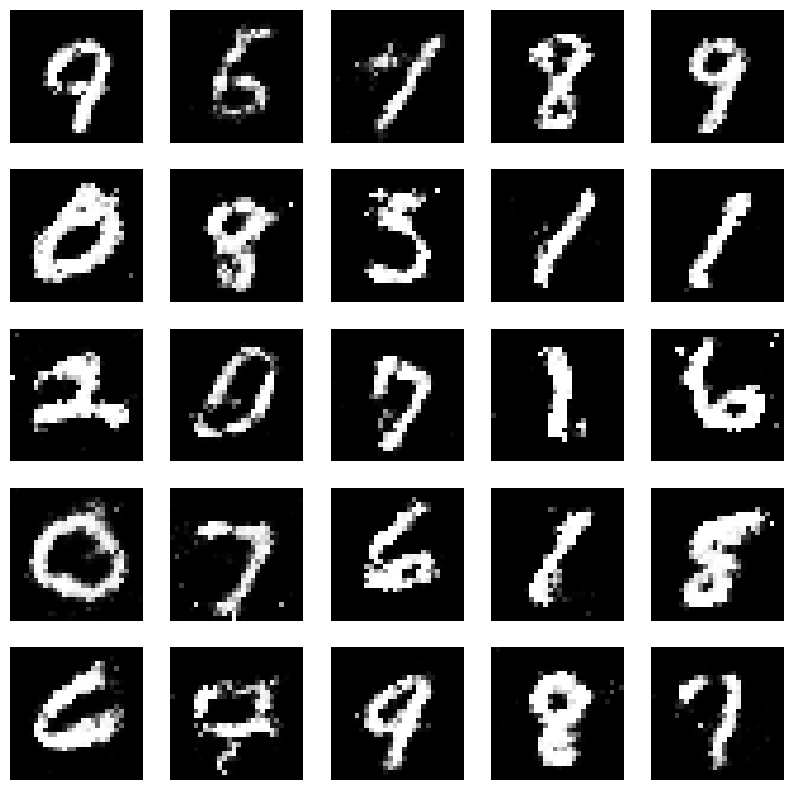

Epochs:  99


  0%|          | 0/273 [00:00<?, ?it/s]

4/4 [==============================] - 0s 7ms/step


  0%|          | 1/273 [00:00<01:30,  3.01it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 2/273 [00:00<01:35,  2.85it/s]

4/4 [==============================] - 0s 7ms/step


  1%|          | 3/273 [00:01<01:38,  2.74it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 4/273 [00:01<01:45,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


  2%|▏         | 5/273 [00:01<01:43,  2.60it/s]

4/4 [==============================] - 0s 8ms/step


  2%|▏         | 6/273 [00:02<01:39,  2.70it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 7/273 [00:02<01:42,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


  3%|▎         | 8/273 [00:03<01:40,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


  3%|▎         | 9/273 [00:03<01:38,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▎         | 10/273 [00:03<01:37,  2.70it/s]

4/4 [==============================] - 0s 8ms/step


  4%|▍         | 11/273 [00:04<01:39,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


  4%|▍         | 12/273 [00:04<01:36,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


  5%|▍         | 13/273 [00:04<01:35,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 14/273 [00:05<01:34,  2.73it/s]

4/4 [==============================] - 0s 7ms/step


  5%|▌         | 15/273 [00:05<01:44,  2.46it/s]

4/4 [==============================] - 0s 9ms/step


  6%|▌         | 16/273 [00:06<01:43,  2.48it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 17/273 [00:06<01:49,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 18/273 [00:07<01:54,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 19/273 [00:07<01:55,  2.20it/s]

4/4 [==============================] - 0s 9ms/step


  7%|▋         | 20/273 [00:08<01:57,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 21/273 [00:08<01:56,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 22/273 [00:08<01:58,  2.11it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 23/273 [00:09<01:55,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 24/273 [00:09<01:57,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 25/273 [00:10<01:56,  2.13it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 26/273 [00:10<01:51,  2.22it/s]

4/4 [==============================] - 0s 6ms/step


 10%|▉         | 27/273 [00:11<01:49,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 10%|█         | 28/273 [00:11<01:42,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 11%|█         | 29/273 [00:11<01:39,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 11%|█         | 30/273 [00:12<01:41,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 11%|█▏        | 31/273 [00:12<01:43,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 32/273 [00:13<01:38,  2.44it/s]

4/4 [==============================] - 0s 8ms/step


 12%|█▏        | 33/273 [00:13<01:38,  2.45it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 34/273 [00:14<01:38,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 35/273 [00:14<01:34,  2.53it/s]

4/4 [==============================] - 0s 6ms/step


 13%|█▎        | 36/273 [00:14<01:28,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 14%|█▎        | 37/273 [00:15<01:26,  2.74it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 38/273 [00:15<01:33,  2.51it/s]

4/4 [==============================] - 0s 6ms/step


 14%|█▍        | 39/273 [00:15<01:29,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▍        | 40/273 [00:16<01:26,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 41/273 [00:16<01:26,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 15%|█▌        | 42/273 [00:17<01:30,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 43/273 [00:17<01:26,  2.64it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▌        | 44/273 [00:17<01:26,  2.65it/s]

4/4 [==============================] - 0s 6ms/step


 16%|█▋        | 45/273 [00:18<01:23,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 46/273 [00:18<01:28,  2.55it/s]

4/4 [==============================] - 0s 6ms/step


 17%|█▋        | 47/273 [00:19<01:31,  2.47it/s]

4/4 [==============================] - 0s 6ms/step


 18%|█▊        | 48/273 [00:19<01:29,  2.51it/s]

4/4 [==============================] - 0s 9ms/step


 18%|█▊        | 49/273 [00:19<01:32,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 18%|█▊        | 50/273 [00:20<01:27,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▊        | 51/273 [00:20<01:30,  2.45it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 52/273 [00:21<01:33,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 19%|█▉        | 53/273 [00:21<01:37,  2.25it/s]

4/4 [==============================] - 0s 8ms/step


 20%|█▉        | 54/273 [00:22<01:39,  2.21it/s]

4/4 [==============================] - 0s 8ms/step


 20%|██        | 55/273 [00:22<01:40,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 56/273 [00:23<01:40,  2.15it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 57/273 [00:23<01:41,  2.14it/s]

4/4 [==============================] - 0s 9ms/step


 21%|██        | 58/273 [00:23<01:42,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 59/273 [00:24<01:42,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 60/273 [00:24<01:39,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 22%|██▏       | 61/273 [00:25<01:33,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 62/273 [00:25<01:33,  2.25it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 63/273 [00:26<01:29,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 23%|██▎       | 64/273 [00:26<01:25,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 24%|██▍       | 65/273 [00:26<01:24,  2.48it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 66/273 [00:27<01:28,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 67/273 [00:27<01:24,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 25%|██▍       | 68/273 [00:28<01:23,  2.46it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 69/273 [00:28<01:23,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 26%|██▌       | 70/273 [00:28<01:25,  2.39it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▌       | 71/273 [00:29<01:19,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 26%|██▋       | 72/273 [00:29<01:21,  2.46it/s]

4/4 [==============================] - 0s 8ms/step


 27%|██▋       | 73/273 [00:30<01:21,  2.45it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 74/273 [00:30<01:20,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 27%|██▋       | 75/273 [00:30<01:21,  2.43it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 76/273 [00:31<01:19,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 28%|██▊       | 77/273 [00:31<01:16,  2.56it/s]

4/4 [==============================] - 0s 6ms/step


 29%|██▊       | 78/273 [00:32<01:15,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 29%|██▉       | 79/273 [00:32<01:15,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 29%|██▉       | 80/273 [00:32<01:14,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 30%|██▉       | 81/273 [00:33<01:17,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 82/273 [00:33<01:18,  2.45it/s]

4/4 [==============================] - 0s 7ms/step


 30%|███       | 83/273 [00:34<01:14,  2.53it/s]

4/4 [==============================] - 0s 8ms/step


 31%|███       | 84/273 [00:34<01:16,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 31%|███       | 85/273 [00:34<01:16,  2.47it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 86/273 [00:35<01:18,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 32%|███▏      | 87/273 [00:35<01:22,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 88/273 [00:36<01:26,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 89/273 [00:36<01:26,  2.13it/s]

4/4 [==============================] - 0s 9ms/step


 33%|███▎      | 90/273 [00:37<01:28,  2.07it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 91/273 [00:37<01:27,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 34%|███▎      | 92/273 [00:38<01:25,  2.12it/s]

4/4 [==============================] - 0s 8ms/step


 34%|███▍      | 93/273 [00:38<01:24,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 94/273 [00:39<01:25,  2.09it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▍      | 95/273 [00:39<01:18,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 35%|███▌      | 96/273 [00:39<01:12,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 97/273 [00:40<01:15,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▌      | 98/273 [00:40<01:11,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 36%|███▋      | 99/273 [00:41<01:10,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 100/273 [00:41<01:08,  2.51it/s]

4/4 [==============================] - 0s 8ms/step


 37%|███▋      | 101/273 [00:42<01:11,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 37%|███▋      | 102/273 [00:42<01:07,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 103/273 [00:42<01:05,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 38%|███▊      | 104/273 [00:43<01:03,  2.68it/s]

4/4 [==============================] - 0s 8ms/step


 38%|███▊      | 105/273 [00:43<01:04,  2.61it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 106/273 [00:43<01:02,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 39%|███▉      | 107/273 [00:44<01:02,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 40%|███▉      | 108/273 [00:44<01:01,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 40%|███▉      | 109/273 [00:44<01:01,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 40%|████      | 110/273 [00:45<01:02,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 41%|████      | 111/273 [00:45<01:01,  2.65it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████      | 112/273 [00:46<01:03,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 41%|████▏     | 113/273 [00:46<01:02,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 114/273 [00:46<01:02,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 42%|████▏     | 115/273 [00:47<01:05,  2.41it/s]

4/4 [==============================] - 0s 8ms/step


 42%|████▏     | 116/273 [00:47<01:03,  2.48it/s]

4/4 [==============================] - 0s 8ms/step


 43%|████▎     | 117/273 [00:48<01:02,  2.49it/s]

4/4 [==============================] - 0s 6ms/step


 43%|████▎     | 118/273 [00:48<01:04,  2.41it/s]

4/4 [==============================] - 0s 9ms/step


 44%|████▎     | 119/273 [00:49<01:04,  2.39it/s]

4/4 [==============================] - 0s 7ms/step


 44%|████▍     | 120/273 [00:49<01:02,  2.45it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 121/273 [00:49<01:04,  2.36it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 122/273 [00:50<01:07,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 123/273 [00:51<01:14,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 124/273 [00:51<01:12,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 125/273 [00:51<01:11,  2.07it/s]

4/4 [==============================] - 0s 9ms/step


 46%|████▌     | 126/273 [00:52<01:10,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 127/273 [00:52<01:10,  2.08it/s]

4/4 [==============================] - 0s 9ms/step


 47%|████▋     | 128/273 [00:53<01:09,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 129/273 [00:53<01:07,  2.14it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 130/273 [00:54<01:02,  2.28it/s]

4/4 [==============================] - 0s 8ms/step


 48%|████▊     | 131/273 [00:54<01:01,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 48%|████▊     | 132/273 [00:55<00:58,  2.40it/s]

4/4 [==============================] - 0s 6ms/step


 49%|████▊     | 133/273 [00:55<00:55,  2.52it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 134/273 [00:55<00:52,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 49%|████▉     | 135/273 [00:56<00:54,  2.52it/s]

4/4 [==============================] - 0s 9ms/step


 50%|████▉     | 136/273 [00:56<00:53,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 50%|█████     | 137/273 [00:56<00:51,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 51%|█████     | 138/273 [00:57<00:52,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 51%|█████     | 139/273 [00:57<00:51,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 51%|█████▏    | 140/273 [00:58<00:49,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 141/273 [00:58<00:49,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 142/273 [00:58<00:51,  2.55it/s]

4/4 [==============================] - 0s 7ms/step


 52%|█████▏    | 143/273 [00:59<00:49,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 144/273 [00:59<00:47,  2.71it/s]

4/4 [==============================] - 0s 7ms/step


 53%|█████▎    | 145/273 [00:59<00:46,  2.78it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 146/273 [01:00<00:48,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 54%|█████▍    | 147/273 [01:00<00:47,  2.68it/s]

4/4 [==============================] - 0s 7ms/step


 54%|█████▍    | 148/273 [01:01<00:46,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 149/273 [01:01<00:45,  2.70it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 150/273 [01:01<00:49,  2.46it/s]

4/4 [==============================] - 0s 6ms/step


 55%|█████▌    | 151/273 [01:02<00:50,  2.41it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 152/273 [01:02<00:47,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▌    | 153/273 [01:02<00:45,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 56%|█████▋    | 154/273 [01:03<00:44,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 57%|█████▋    | 155/273 [01:03<00:44,  2.68it/s]

4/4 [==============================] - 0s 9ms/step


 57%|█████▋    | 156/273 [01:04<00:48,  2.42it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 157/273 [01:04<00:51,  2.24it/s]

4/4 [==============================] - 0s 8ms/step


 58%|█████▊    | 158/273 [01:05<00:52,  2.21it/s]

4/4 [==============================] - 0s 9ms/step


 58%|█████▊    | 159/273 [01:05<00:53,  2.12it/s]

4/4 [==============================] - 0s 9ms/step


 59%|█████▊    | 160/273 [01:06<00:52,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 161/273 [01:06<00:52,  2.15it/s]

4/4 [==============================] - 0s 8ms/step


 59%|█████▉    | 162/273 [01:07<00:54,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 163/273 [01:07<00:54,  2.00it/s]

4/4 [==============================] - 0s 8ms/step


 60%|██████    | 164/273 [01:08<00:51,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 60%|██████    | 165/273 [01:08<00:47,  2.29it/s]

4/4 [==============================] - 0s 6ms/step


 61%|██████    | 166/273 [01:08<00:44,  2.39it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 167/273 [01:09<00:46,  2.30it/s]

4/4 [==============================] - 0s 7ms/step


 62%|██████▏   | 168/273 [01:09<00:44,  2.35it/s]

4/4 [==============================] - 0s 6ms/step


 62%|██████▏   | 169/273 [01:10<00:42,  2.44it/s]

4/4 [==============================] - 0s 9ms/step


 62%|██████▏   | 170/273 [01:10<00:42,  2.40it/s]

4/4 [==============================] - 0s 7ms/step


 63%|██████▎   | 171/273 [01:10<00:40,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 63%|██████▎   | 172/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 9ms/step


 63%|██████▎   | 173/273 [01:11<00:38,  2.60it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▎   | 174/273 [01:12<00:38,  2.54it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 175/273 [01:12<00:37,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 64%|██████▍   | 176/273 [01:12<00:38,  2.54it/s]

4/4 [==============================] - 0s 8ms/step


 65%|██████▍   | 177/273 [01:13<00:36,  2.67it/s]

4/4 [==============================] - 0s 9ms/step


 65%|██████▌   | 178/273 [01:13<00:37,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▌   | 179/273 [01:13<00:36,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 66%|██████▌   | 180/273 [01:14<00:34,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 66%|██████▋   | 181/273 [01:14<00:34,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 182/273 [01:15<00:35,  2.54it/s]

4/4 [==============================] - 0s 6ms/step


 67%|██████▋   | 183/273 [01:15<00:33,  2.67it/s]

4/4 [==============================] - 0s 7ms/step


 67%|██████▋   | 184/273 [01:15<00:33,  2.67it/s]

4/4 [==============================] - 0s 8ms/step


 68%|██████▊   | 185/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 68%|██████▊   | 186/273 [01:16<00:33,  2.62it/s]

4/4 [==============================] - 0s 7ms/step


 68%|██████▊   | 187/273 [01:17<00:34,  2.52it/s]

4/4 [==============================] - 0s 6ms/step


 69%|██████▉   | 188/273 [01:17<00:36,  2.36it/s]

4/4 [==============================] - 0s 7ms/step


 69%|██████▉   | 189/273 [01:17<00:34,  2.43it/s]

4/4 [==============================] - 0s 8ms/step


 70%|██████▉   | 190/273 [01:18<00:34,  2.44it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 191/273 [01:18<00:35,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 70%|███████   | 192/273 [01:19<00:35,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 193/273 [01:19<00:35,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 194/273 [01:20<00:35,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 195/273 [01:20<00:34,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 196/273 [01:21<00:35,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 197/273 [01:21<00:34,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 198/273 [01:22<00:33,  2.23it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 199/273 [01:22<00:31,  2.33it/s]

4/4 [==============================] - 0s 7ms/step


 73%|███████▎  | 200/273 [01:22<00:29,  2.45it/s]

4/4 [==============================] - 0s 8ms/step


 74%|███████▎  | 201/273 [01:23<00:29,  2.48it/s]

4/4 [==============================] - 0s 6ms/step


 74%|███████▍  | 202/273 [01:23<00:29,  2.41it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 203/273 [01:24<00:29,  2.40it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 204/273 [01:24<00:27,  2.49it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 205/273 [01:24<00:26,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 75%|███████▌  | 206/273 [01:25<00:27,  2.42it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 207/273 [01:25<00:25,  2.57it/s]

4/4 [==============================] - 0s 7ms/step


 76%|███████▌  | 208/273 [01:25<00:25,  2.59it/s]

4/4 [==============================] - 0s 6ms/step


 77%|███████▋  | 209/273 [01:26<00:24,  2.63it/s]

4/4 [==============================] - 0s 9ms/step


 77%|███████▋  | 210/273 [01:26<00:24,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 77%|███████▋  | 211/273 [01:27<00:23,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 78%|███████▊  | 212/273 [01:27<00:22,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 78%|███████▊  | 213/273 [01:27<00:22,  2.70it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 214/273 [01:28<00:22,  2.57it/s]

4/4 [==============================] - 0s 9ms/step


 79%|███████▉  | 215/273 [01:28<00:22,  2.63it/s]

4/4 [==============================] - 0s 6ms/step


 79%|███████▉  | 216/273 [01:28<00:21,  2.63it/s]

4/4 [==============================] - 0s 7ms/step


 79%|███████▉  | 217/273 [01:29<00:20,  2.72it/s]

4/4 [==============================] - 0s 8ms/step


 80%|███████▉  | 218/273 [01:29<00:20,  2.69it/s]

4/4 [==============================] - 0s 7ms/step


 80%|████████  | 219/273 [01:30<00:20,  2.67it/s]

4/4 [==============================] - 0s 6ms/step


 81%|████████  | 220/273 [01:30<00:19,  2.66it/s]

4/4 [==============================] - 0s 8ms/step


 81%|████████  | 221/273 [01:30<00:20,  2.58it/s]

4/4 [==============================] - 0s 7ms/step


 81%|████████▏ | 222/273 [01:31<00:19,  2.66it/s]

4/4 [==============================] - 0s 7ms/step


 82%|████████▏ | 223/273 [01:31<00:18,  2.72it/s]

4/4 [==============================] - 0s 6ms/step


 82%|████████▏ | 224/273 [01:31<00:18,  2.64it/s]

4/4 [==============================] - 0s 9ms/step


 82%|████████▏ | 225/273 [01:32<00:18,  2.55it/s]

4/4 [==============================] - 0s 9ms/step


 83%|████████▎ | 226/273 [01:32<00:19,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 227/273 [01:33<00:20,  2.27it/s]

4/4 [==============================] - 0s 9ms/step


 84%|████████▎ | 228/273 [01:33<00:20,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 229/273 [01:34<00:21,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 230/273 [01:34<00:20,  2.10it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▍ | 231/273 [01:35<00:20,  2.09it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 232/273 [01:35<00:19,  2.07it/s]

4/4 [==============================] - 0s 8ms/step


 85%|████████▌ | 233/273 [01:36<00:19,  2.10it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▌ | 234/273 [01:36<00:17,  2.24it/s]

4/4 [==============================] - 0s 6ms/step


 86%|████████▌ | 235/273 [01:37<00:16,  2.34it/s]

4/4 [==============================] - 0s 7ms/step


 86%|████████▋ | 236/273 [01:37<00:15,  2.43it/s]

4/4 [==============================] - 0s 9ms/step


 87%|████████▋ | 237/273 [01:37<00:15,  2.37it/s]

4/4 [==============================] - 0s 7ms/step


 87%|████████▋ | 238/273 [01:38<00:13,  2.51it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 239/273 [01:38<00:13,  2.47it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 240/273 [01:39<00:13,  2.43it/s]

4/4 [==============================] - 0s 7ms/step


 88%|████████▊ | 241/273 [01:39<00:12,  2.48it/s]

4/4 [==============================] - 0s 9ms/step


 89%|████████▊ | 242/273 [01:39<00:12,  2.58it/s]

4/4 [==============================] - 0s 8ms/step


 89%|████████▉ | 243/273 [01:40<00:11,  2.57it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 244/273 [01:40<00:11,  2.57it/s]

4/4 [==============================] - 0s 8ms/step


 90%|████████▉ | 245/273 [01:40<00:10,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 90%|█████████ | 246/273 [01:41<00:10,  2.65it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 247/273 [01:41<00:10,  2.59it/s]

4/4 [==============================] - 0s 9ms/step


 91%|█████████ | 248/273 [01:42<00:09,  2.61it/s]

4/4 [==============================] - 0s 6ms/step


 91%|█████████ | 249/273 [01:42<00:09,  2.64it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 250/273 [01:42<00:08,  2.62it/s]

4/4 [==============================] - 0s 6ms/step


 92%|█████████▏| 251/273 [01:43<00:09,  2.44it/s]

4/4 [==============================] - 0s 7ms/step


 92%|█████████▏| 252/273 [01:43<00:08,  2.53it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 253/273 [01:44<00:08,  2.50it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 254/273 [01:44<00:07,  2.48it/s]

4/4 [==============================] - 0s 7ms/step


 93%|█████████▎| 255/273 [01:44<00:07,  2.56it/s]

4/4 [==============================] - 0s 7ms/step


 94%|█████████▍| 256/273 [01:45<00:06,  2.59it/s]

4/4 [==============================] - 0s 8ms/step


 94%|█████████▍| 257/273 [01:45<00:06,  2.50it/s]

4/4 [==============================] - 0s 7ms/step


 95%|█████████▍| 258/273 [01:46<00:05,  2.55it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▍| 259/273 [01:46<00:05,  2.38it/s]

4/4 [==============================] - 0s 8ms/step


 95%|█████████▌| 260/273 [01:46<00:05,  2.42it/s]

4/4 [==============================] - 0s 9ms/step


 96%|█████████▌| 261/273 [01:47<00:05,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 262/273 [01:47<00:05,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 263/273 [01:48<00:04,  2.12it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 264/273 [01:48<00:04,  2.19it/s]

4/4 [==============================] - 0s 7ms/step


 97%|█████████▋| 265/273 [01:49<00:03,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 266/273 [01:49<00:03,  2.18it/s]

4/4 [==============================] - 0s 9ms/step


 98%|█████████▊| 267/273 [01:50<00:02,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 98%|█████████▊| 268/273 [01:50<00:02,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 269/273 [01:51<00:01,  2.32it/s]

4/4 [==============================] - 0s 6ms/step


 99%|█████████▉| 270/273 [01:51<00:01,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


 99%|█████████▉| 271/273 [01:51<00:00,  2.34it/s]

4/4 [==============================] - 0s 8ms/step


100%|█████████▉| 272/273 [01:52<00:00,  2.46it/s]

4/4 [==============================] - 0s 7ms/step


100%|██████████| 273/273 [01:52<00:00,  2.42it/s]


Perdidas:  0.6800307035446167 , 0.7274401187896729
1/1 [==============================] - 0s 28ms/step


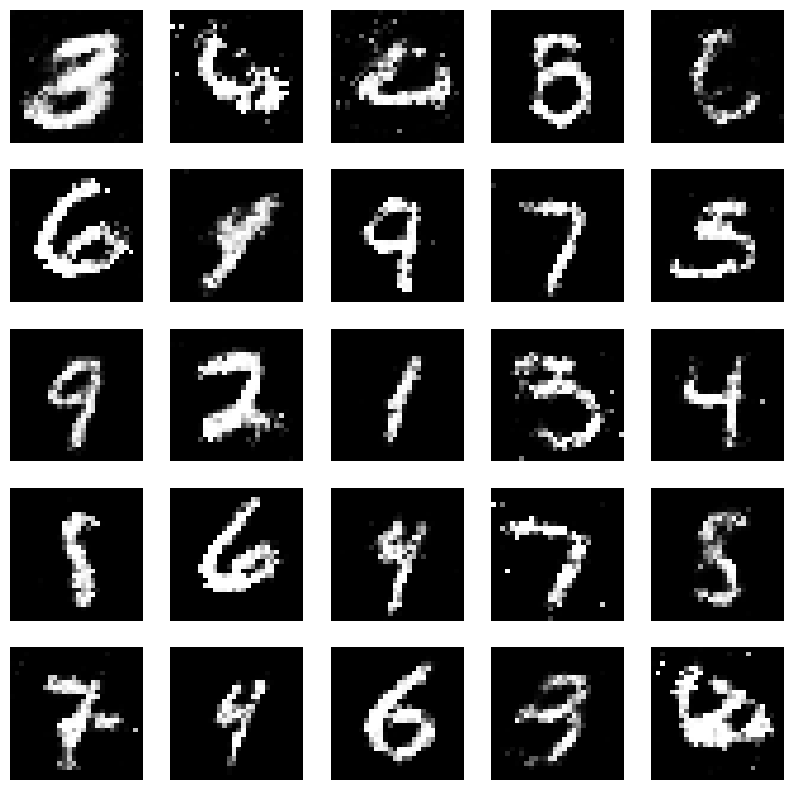

In [25]:
# Definimos los hiperparámetros
epochs = 100
batch_size = 256
half_batch = batch_size // 2
n = 100
losses = []

# Loop para cada época
for i in range(epochs):
    print('Epochs: ', i)

    # Loop para cada batch
    for j in tqdm(range(len(X) // batch_size)):
        xreal, yreal = X[np.random.randint(0, len(X), half_batch)].reshape(half_batch, 28, 28, 1), np.ones((half_batch, 1))
        xfake, yfake = generator_model.predict(np.random.randn(half_batch, n)), np.zeros((half_batch, 1))
        xfinal, yfinal = np.vstack((xreal, xfake)), np.vstack((yreal, yfake))

        # Perdidas
        d_loss = discriminator_model.train_on_batch(xfinal, yfinal)
        g_loss = gan_model.train_on_batch(np.random.randn(batch_size, n), np.ones((batch_size, 1)))
        losses.append((d_loss, g_loss))


    # graficamos las imágenes generadas
    fig, ax = plt.subplots(5, 5, figsize=(10, 10))
    print("Perdidas: ", d_loss, ",", g_loss)
    for k in range(5):
        for l in range(5):
            generated_image = generator_model.predict(np.random.randn(1, n))
            ax[k, l].imshow(generated_image.reshape(28, 28), cmap='gray')
            ax[k, l].axis('off')

    plt.show()